# SISALv3 Speleothem Geochemical Imputation — Clean Publication Pipeline

**Target journal:** *Ecological Informatics* (Q1)
**Manuscript:** *Bridging Gaps in Paleoclimatological Records: Insights from AI on Speleothem Data*

This pipeline is the single source of truth for every number, table, and figure in the manuscript. It supersedes the seven exploratory notebooks (`Copy of SISALv3_Speleothem_RandomForest (1).ipynb`, `…_XGBoost.ipynb`, `…_Transformer.ipynb`, `SISALv3_Speleothem_LSTM_Bidirectional.ipynb`, `SISALv3_LeaveOneCaveOut_Validation.ipynb`, `SISALv3_CubicSpline_Baseline_Comparison.ipynb`, `SISALv3_Baseline_Cubic_Spline_Comparison.ipynb`), which contained methodological errors documented in the project Gap Analysis (data leakage in preprocessing, random-row splits ignoring cave grouping, sliding windows that crossed cave boundaries, and an index-based cubic spline that was effectively interpolating between physically-adjacent rows of the same cave).

## What this pipeline does differently

1. **Rebuilds the master table from raw SISALv3 SQL/CSVs** rather than from the pre-leaked `cleaned_data.csv`.
2. **Cave-aware cross-validation.** `LeaveOneGroupOut` over `site_id` is the headline (Tables 1–3); a `BlockedWithinCaveSplitter` powers the secondary within-cave gap-fill experiment (Section 3.5 / Table 4) where cubic spline becomes a meaningful baseline.
3. **All preprocessing lives inside `Pipeline`/`ColumnTransformer`** so imputation, scaling, and one-hot encoding are fit only on the training fold of each split.
4. **`OneHotEncoder` for nominal categoricals** (`mineralogy`, `monitoring`) instead of `LabelEncoder`, with `handle_unknown="infrequent_if_exist"` so previously unseen levels in held-out caves do not crash inference.
5. **Sequence DL models (BiLSTM, Transformer) are built strictly per `entity_id`,** rows sorted by `interp_age` (with `depth_sample` as the chronological fallback). Sequences never cross entity boundaries.
6. **Cubic spline / linear interpolation** are evaluated **only** in the within-cave block-gap regime, where they are mathematically defined; under LOCO they are reported as *not applicable* with a stated rationale rather than a fake 0 % bar.
7. **Real permutation tests** (refit the entire pipeline on shuffled `y_train`, repeat M times) replace the previous broken implementation that only shuffled `y_test`.
8. **Reproducible artifact bundle** under `artifacts/<UTC-timestamp>/` so the manuscript and the code can never drift apart.

## How the pipeline is split into two notebooks

To stay within Google Colab Pro's per-session wall-time cap (~24 h, often less), the pipeline is delivered as **two notebooks** that share a Drive-resident artifact bundle:

| Notebook | Purpose | Default wall-time on Colab Pro | Writes |
|---|---|---|---|
| `001_SISALv3_Pipeline_PART1_Train.ipynb` | Build master table, hyper-parameter search, **LOCO loop** | ~5 h (tabular only); ~24 h with DL panel enabled | `master_table.parquet`, `best_params/`, `predictions/`, `metrics/loco_*` |
| `001_SISALv3_Pipeline_PART2_Evaluate.ipynb` | Within-cave gap-fill, paired-Wilcoxon, optional perm tests, **all plots & tables** | ~3–4 h (defaults); ~30+ h if perm tests enabled | `metrics/within_*`, `figures/`, `TABLE_*.csv`, `MANIFEST.json` |

PART 1 stamps a UTC timestamp into `artifacts/LATEST_RUN.txt`; PART 2 reads that file automatically, so you don't have to copy-paste the run id between sessions. Every heavy loop in both notebooks is **cached on disk per `(model, target)` pair**, so a Colab disconnect mid-run is recoverable simply by re-executing all cells of the same notebook.

---

> **You are reading PART 1 of 2 — the *training* notebook.** Run this notebook to completion before opening PART 2 (`001_SISALv3_Pipeline_PART2_Evaluate.ipynb`). On the default config (DL panel disabled, see section 4.3 to flip the flag) it takes ~4–6 h on a Colab Pro CPU and produces every artifact PART 2 needs.

---

## 0. Colab setup, dependencies, configuration & imports

**Runtime target:** Google Colab Pro (GPU runtime recommended for the BiLSTM / Transformer sections, but the whole pipeline also runs on CPU).

**Folder layout on Drive** (identical to the legacy notebooks — no folder restructuring required):

```
/content/drive/MyDrive/SISALv3_Speleothem/
├── data/
│   ├── cleaned_data.csv                       # legacy file — NOT used by this notebook
│   └── sisalv3_database_mysql_csv/
│       └── sisalv3_database_mysql_csv/
│           └── sisalv3_csv/                   # raw SISALv3 tables, used here
│               ├── site.csv, entity.csv, sample.csv, original_chronology.csv
│               ├── d18O.csv, d13C.csv, Mg_Ca.csv, Sr_Ca.csv
│               ├── P_Ca.csv, U_Ca.csv, Ba_Ca.csv, Sr_isotopes.csv
│               └── hiatus.csv, gap.csv
├── models/                                    # fitted models written here (1 per LOCO fold)
└── artifacts/<UTC-timestamp>/                 # per-run outputs (predictions, metrics, figs)
```

The six steps below are: (0.1) runtime toggle + Drive mount policy, (0.2) install dependencies that Colab does not pre-ship, (0.3) import everything, (0.4) resolve project paths, (0.5) define the single `CONFIG` object, (0.6) seed every RNG.

**Runtime toggle:** the first code cell exposes a single switch:

- `USER_RUNTIME_MODE = "auto"` (recommended) — chooses Colab when running on Colab, local otherwise.
- `USER_RUNTIME_MODE = "colab"` — force Colab/Drive mode (fails fast if not in Colab).
- `USER_RUNTIME_MODE = "local"` — force local mode (never mounts Drive).

Path compatibility intentionally matches the legacy notebooks: both
`/content/drive/MyDrive/SISALv3_Speleothem` and
`/content/drive/My Drive/SISALv3_Speleothem` are supported.

In [1]:
# --- 0.1 Runtime mode toggle (auto / colab / local) --------------------------------
# Single user-facing switch for every notebook variant.
#
#   "auto"  : use Colab mode when running in Colab, else local mode.
#   "colab" : force Colab mode (requires google.colab).
#   "local" : force local mode (never mounts Google Drive).
USER_RUNTIME_MODE = "colab"

_valid_modes = {"auto", "colab", "local"}
if USER_RUNTIME_MODE not in _valid_modes:
    raise ValueError(
        f"USER_RUNTIME_MODE={USER_RUNTIME_MODE!r} is invalid; "
        f"use one of {_valid_modes}."
    )

try:
    import google.colab  # noqa: F401
    _HAS_COLAB = True
except Exception:
    _HAS_COLAB = False

if USER_RUNTIME_MODE == "auto":
    RUNTIME_MODE = "colab" if _HAS_COLAB else "local"
else:
    RUNTIME_MODE = USER_RUNTIME_MODE

if RUNTIME_MODE == "colab" and not _HAS_COLAB:
    raise RuntimeError(
        "RUNTIME_MODE is 'colab' but google.colab is unavailable. "
        "Set USER_RUNTIME_MODE='local' or run in Colab."
    )

IN_COLAB = bool(RUNTIME_MODE == "colab")
LOCAL_PROFILE = bool(RUNTIME_MODE == "local")
print(
    f"[OK] Runtime mode resolved: {RUNTIME_MODE} "
    f"(USER_RUNTIME_MODE={USER_RUNTIME_MODE!r}, has_colab={_HAS_COLAB})"
)

[OK] Runtime mode resolved: colab (USER_RUNTIME_MODE='colab', has_colab=True)


In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# --- Colab dependency bootstrap (fast) -------------------------------------

import importlib
import sys
import subprocess

packages = {
    "scikeras": "scikeras>=0.13",

    "xgboost": "xgboost>=2.0",
    "catboost": "catboost>=1.2",
    "pyarrow": "pyarrow>=14.0",
}

to_install = []

for module_name, package_name in packages.items():
    try:
        importlib.import_module(module_name)
        print(f"[OK] {module_name} already installed")
    except ImportError:
        print(f"[MISSING] {module_name}")
        to_install.append(package_name)

if to_install:
    print(f"\n[INFO] Installing: {to_install}")
    subprocess.check_call(
        [sys.executable, "-m", "pip", "install", "-q"] + to_install
    )
else:
    print("\n[OK] No installation needed")

print("[OK] dependency setup complete")

[MISSING] scikeras
[OK] xgboost already installed
[MISSING] catboost
[OK] pyarrow already installed

[INFO] Installing: ['scikeras>=0.13', 'catboost>=1.2']
[OK] dependency setup complete


In [ ]:
# --- 0.3 Imports ------------------------------------------------------------------
from __future__ import annotations

import json
import logging
import os
import random
import sys
import warnings
from dataclasses import dataclass, field, replace
from datetime import datetime, timezone
from pathlib import Path
from typing import Any, Callable

import numpy as np
import pandas as pd

# Silence non-actionable warnings; never blanket-silence errors.
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s | %(levelname)-7s | %(message)s",
    datefmt="%H:%M:%S",
    stream=sys.stdout,
)
log = logging.getLogger("sisalv3")

log.info("Python %s | NumPy %s | Pandas %s",
         sys.version.split()[0], np.__version__, pd.__version__)

In [ ]:
# --- 0.4 Project paths (legacy-compatible Colab + local) ---------------------------
#
# Legacy notebooks used both:
#   - /content/drive/MyDrive/SISALv3_Speleothem
#   - /content/drive/My Drive/SISALv3_Speleothem
# We support both and auto-pick the first existing one in Colab mode.
#
# Override with:
#   export SISAL_PROJECT_ROOT="/abs/path/to/SISALv3_Speleothem"
COLAB_ROOT_CANDIDATES = [
    Path("/content/drive/MyDrive/SISALv3_Speleothem"),
    Path("/content/drive/My Drive/SISALv3_Speleothem"),
]
DEFAULT_LOCAL_ROOT = Path.cwd() / "SISALv3_Speleothem"

if globals().get("IN_COLAB", False):
    existing = [p for p in COLAB_ROOT_CANDIDATES if p.exists()]
    DEFAULT_PROJECT_ROOT = existing[0] if existing else COLAB_ROOT_CANDIDATES[0]
else:
    DEFAULT_PROJECT_ROOT = DEFAULT_LOCAL_ROOT

PROJECT_ROOT = Path(os.environ.get("SISAL_PROJECT_ROOT", str(DEFAULT_PROJECT_ROOT))).resolve()

RAW_SISAL_DIR = (
    PROJECT_ROOT
    / "data"
    / "sisalv3_database_mysql_csv"
    / "sisalv3_database_mysql_csv"
    / "sisalv3_csv"
)
MODELS_DIR = PROJECT_ROOT / "models"
ARTIFACTS_ROOT = PROJECT_ROOT / "artifacts"
DATA_OUT_DIR = ARTIFACTS_ROOT / "_data"   # cohort-wide cache shared across runs
LATEST_RUN_FILE = ARTIFACTS_ROOT / "LATEST_RUN.txt"

ARTIFACTS_ROOT.mkdir(parents=True, exist_ok=True)
DATA_OUT_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

log.info("PROJECT_ROOT     : %s", PROJECT_ROOT)
log.info("RAW_SISAL_DIR    : %s", RAW_SISAL_DIR)
log.info("Models dir       : %s", MODELS_DIR)
log.info("Persistent cache : %s", DATA_OUT_DIR)
log.info("Artifacts root   : %s", ARTIFACTS_ROOT)

In [ ]:
# --- 0.4b Run id (PART 1: create a fresh run, write LATEST_RUN.txt) ---------------
#
# PART 1 of the pipeline is the *training* notebook: it produces every artifact
# (master table, best hyper-parameters, per-fold predictions, per-fold metrics)
# that PART 2 then consumes. We stamp the run with a UTC timestamp so multiple
# experimental runs can co-exist side-by-side under `artifacts/`, and we write
# the chosen RUN_ID into `LATEST_RUN.txt` so PART 2 can locate this run without
# the user having to copy-paste the timestamp manually.
#
# If you want to *resume* a previous PART 1 run (e.g. after a Colab disconnect),
# set RESUME_RUN_ID below to that run's timestamp; otherwise leave it as None
# and a fresh run is created.

RESUME_RUN_ID: str | None = None     # e.g. "20260510T120000Z" to resume
assert RAW_SISAL_DIR.exists(), (
    f"Raw SISALv3 CSV directory not found at:\n  {RAW_SISAL_DIR}\n\n"
    "On Colab, place the unzipped SISALv3 release at one of:\n"
    "  /content/drive/MyDrive/SISALv3_Speleothem/data/"
    "sisalv3_database_mysql_csv/sisalv3_database_mysql_csv/sisalv3_csv/\n"
    "  /content/drive/My Drive/SISALv3_Speleothem/data/"
    "sisalv3_database_mysql_csv/sisalv3_database_mysql_csv/sisalv3_csv/\n"
    "(this is the same path the legacy XGBoost / RF / BiLSTM notebooks already use)."
)

if RESUME_RUN_ID is not None:
    RUN_TS = RESUME_RUN_ID
    log.warning("RESUMING PART 1 with RUN_ID=%s", RUN_TS)
else:
    RUN_TS = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
RUN_DIR = ARTIFACTS_ROOT / RUN_TS
FIG_DIR = RUN_DIR / "figures"
RUN_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

# Publish this run id so PART 2 can find it without manual copy-paste.
LATEST_RUN_FILE.write_text(RUN_TS)
log.info("RUN_ID           : %s   (also written to %s)", RUN_TS, LATEST_RUN_FILE)
log.info("Run artifacts dir: %s", RUN_DIR)

In [ ]:
# --- 0.5 Master configuration -----------------------------------------------------
@dataclass(frozen=True)
class PipelineConfig:
    # ---- Targets and feature roles --------------------------------------------------
    targets: tuple[str, ...] = (
        "d18O_measurement",
        "d13C_measurement",
        "Mg_Ca_measurement",
        "Sr_Ca_measurement",
    )
    # Numeric predictors fed to the ColumnTransformer (imputed median + RobustScaler).
    # `Sr_isotopes_measurement` is intentionally OMITTED: only 164 of ~448k SISALv3
    # samples carry it, and after the row-level all-targets filter it is present
    # in <0.5 % of cohort rows. Imputing the remaining 99.5 % with the median
    # would smear a pseudo-constant across the whole feature and bias every
    # tree split / linear coefficient towards it.
    numeric_features: tuple[str, ...] = (
        "latitude",
        "longitude",
        "elevation",
        "depth_sample",
        "interp_age",
        "P_Ca_measurement",
        "U_Ca_measurement",
        "Ba_Ca_measurement",
        "age_sin",   # cyclical encoding (precessional period, see cyclical_period_kyr)
        "age_cos",
        "log_depth_sample",
        # --- Enriched per-cave covariates (built by enrich_covariates.py) ---
        "precip_d18o_bw02",   # Bowen-Wilkinson 2002 precipitation d18O isoscape -> targets d18O
        "abs_latitude",       # climate-zone proxy
        "wc_bio1", "wc_bio2", "wc_bio3", "wc_bio4", "wc_bio5", "wc_bio6", "wc_bio7",
        "wc_bio8", "wc_bio9", "wc_bio10", "wc_bio11", "wc_bio12", "wc_bio13", "wc_bio14",
        "wc_bio15", "wc_bio16", "wc_bio17", "wc_bio18", "wc_bio19",   # WorldClim bioclim
    )
    # Nominal categoricals — OneHotEncoder, *not* LabelEncoder.
    nominal_features: tuple[str, ...] = ("mineralogy", "monitoring", "hemisphere", "lat_band")
    # Identifiers that travel with X but are NEVER seen by the estimator.
    id_columns: tuple[str, ...] = ("site_id", "entity_id", "sample_id")

    # ---- Cohort filter (matches the manuscript's stated criteria) -------------------
    max_target_missing_frac: float = 0.30        # "all records missing >30% are excluded"
    require_all_four_targets_present: bool = True
    min_samples_per_site: int = 20
    mad_outlier_threshold: float = 3.0           # ">3 median absolute deviations"

    # ---- Feature engineering --------------------------------------------------------
    cyclical_period_kyr: float = 21.0            # ≈ axial precession
    high_corr_drop_threshold: float = 0.95       # applied train-fold-only inside the pipeline

    # ---- Splitting ------------------------------------------------------------------
    inner_cv_groupkfold_splits: int = 5
    block_gap_fraction: float = 0.10             # within-cave block gap = 10 % of entity length
    block_gap_min_samples: int = 30
    min_entity_length_for_blockgap: int = 80

    # ---- Hyperparameter search ------------------------------------------------------
    rf_param_distributions: dict = field(
        default_factory=lambda: {
            "estimator__n_estimators": [200, 400, 600, 800],
            "estimator__max_depth": [None, 8, 12, 16, 24],
            "estimator__min_samples_split": [2, 5, 10],
            "estimator__min_samples_leaf": [1, 2, 4],
            "estimator__max_features": ["sqrt", 0.5, 1.0],
        }
    )
    xgb_param_distributions: dict = field(
        default_factory=lambda: {
            "estimator__n_estimators": [300, 500, 800, 1200],
            "estimator__max_depth": [4, 6, 8, 10, 12],
            "estimator__learning_rate": [0.02, 0.05, 0.08, 0.12],
            "estimator__subsample": [0.6, 0.8, 1.0],
            "estimator__colsample_bytree": [0.6, 0.8, 1.0],
            "estimator__reg_alpha": [0.0, 0.01, 0.1],
            "estimator__reg_lambda": [0.5, 1.0, 2.0],
            "estimator__min_child_weight": [1, 3, 5],
        }
    )
    # 20 iters keeps each (model, target) tabular search ~3-5 min on Colab Pro;
    # bump back to 30+ for a paper-camera-ready run if reviewers ask.
    n_random_search_iter: int = 20

    # ---- Sequence DL ----------------------------------------------------------------
    sequence_length: int = 10
    sequence_stride: int = 1
    bilstm_units_grid: tuple[int, ...] = (32, 64, 128)
    bilstm_dropout_grid: tuple[float, ...] = (0.1, 0.2, 0.3)
    bilstm_layers_grid: tuple[int, ...] = (1, 2)
    transformer_dmodel_grid: tuple[int, ...] = (64, 128)
    transformer_heads_grid: tuple[int, ...] = (2, 4)
    transformer_ff_grid: tuple[int, ...] = (128, 256)
    transformer_layers_grid: tuple[int, ...] = (1, 2)
    dl_batch_size: int = 64
    dl_max_epochs: int = 60
    dl_early_stop_patience: int = 8
    # 6 candidates per (DL_model, target) keeps each DL search ~10-20 min on a
    # Colab Pro T4/V100; raise for a paper-camera-ready run.
    dl_n_random_search_iter: int = 6

    # ---- Evaluation -----------------------------------------------------------------
    # 500 bootstrap resamples gives ~1% CI-width resolution at n=41 folds — more
    # than enough for the manuscript's reported precision. Raise to 1000 for the
    # final camera-ready CIs if a reviewer specifically asks.
    bootstrap_resamples: int = 500
    # 50 iters gives p-value resolution of 0.02 — sufficient for the standard
    # "p<0.05" reporting threshold and keeps each permutation test under ~2 h
    # on Colab Pro. Bump back to 100+ for a final camera-ready run.
    permutation_n_iter: int = 50
    # Restrict the (very expensive) permutation test to the single best-RMSE
    # model per target by default. Set to False to run it for every tabular
    # model (warning: ~5x more compute, easily blows past Colab Pro's session cap).
    permutation_only_best_per_target: bool = True

    # ---- Determinism ----------------------------------------------------------------
    random_seed: int = 42

    # ---- Diagnostic toggles ---------------------------------------------------------
    fast_mode: bool = False                      # if True, shrink iterations for smoke-tests


CONFIG = PipelineConfig()

if globals().get("LOCAL_PROFILE", False):
    CONFIG = replace(
        CONFIG,
        n_random_search_iter=10,
        dl_n_random_search_iter=2,
        dl_max_epochs=25,
        bootstrap_resamples=200,
        permutation_n_iter=20,
        fast_mode=True,
    )
    log.warning(
        "LOCAL_PROFILE is ON: lighter defaults applied "
        "(search iters/epochs/bootstrap/permutation reduced)."
    )

if CONFIG.fast_mode:
    log.warning("CONFIG.fast_mode is ON — iteration counts will be reduced for debugging.")

# Persist config alongside artifacts so the run is reproducible.
_cfg_dump = {
    k: (list(v) if isinstance(v, tuple) else v)
    for k, v in CONFIG.__dict__.items()
}
(RUN_DIR / "config.json").write_text(json.dumps(_cfg_dump, indent=2, default=str))
log.info("Configuration persisted to %s", RUN_DIR / "config.json")

In [ ]:
# --- 0.6 Determinism --------------------------------------------------------------
def set_global_determinism(seed: int) -> None:
    """Seed every stochastic library used downstream.

    Note: full bit-for-bit reproducibility on GPU also requires
    ``TF_DETERMINISTIC_OPS=1`` *before* TensorFlow is imported. We set it here
    pre-emptively so the first ``import tensorflow`` later picks it up.
    """
    os.environ["PYTHONHASHSEED"] = str(seed)
    os.environ.setdefault("TF_DETERMINISTIC_OPS", "1")
    os.environ.setdefault("TF_CUDNN_DETERMINISTIC", "1")
    random.seed(seed)
    np.random.seed(seed)


set_global_determinism(CONFIG.random_seed)
log.info("Global RNGs seeded with %d", CONFIG.random_seed)

---

## 1. Master table assembly from raw SISALv3 CSVs

> **PART 1 of 2** — *training notebook.* This notebook produces every artifact that PART 2 (`001_SISALv3_Pipeline_PART2_Evaluate.ipynb`) consumes: master table, best hyper-parameters, per-fold LOCO predictions, per-fold LOCO metrics. Running it end-to-end on a Colab Pro CPU/T4 takes ~8–12 h with the default config (DL panel disabled). Every heavy loop in PART 1 checks for cached outputs on disk and skips already-completed `(model, target)` pairs, so a Colab disconnect mid-run is recoverable by simply re-executing all cells.

We rebuild the analysis table from `site.csv → entity.csv → sample.csv` plus the geochemistry tables (`d18O`, `d13C`, `Mg_Ca`, `Sr_Ca`, `P_Ca`, `U_Ca`, `Ba_Ca`, `Sr_isotopes`) and the chronology table (`original_chronology` for `interp_age`). The original `cleaned_data.csv` has already been globally min-max scaled and median-imputed by an upstream pipeline that is precisely what introduced the leakage we are fixing — so we **never** consume it again.

**Cohort filter** (matches the manuscript's stated criteria, Section 3.1 / 3.2, and reproduces the legacy cohort exactly):

1. **Row-level all-targets-present filter.** Keep only samples where every one of the four target proxies (`d18O`, `d13C`, `Mg/Ca`, `Sr/Ca`) is non-NaN. This is precisely how the legacy `cleaned_data.csv` was constructed and yields 43 sites / 61 entities / 19,298 rows. **Critically, this means we never impute target values** — every row of the cohort carries a real measurement for every target, so the targets the model is asked to predict are never fabricated.
2. **Robust outlier removal.** `|x − median| > 3 × MAD` per entity, per target. Applied as a row drop (irreversible), so it cannot leak fold-specific information.
3. **Per-site sample minimum.** A site must contribute ≥ 20 retained samples after the above filters; otherwise LOCO has too little signal in the held-out fold to be informative.

The resulting cohort is persisted to `artifacts/_data/master_table.parquet` and a one-row-per-site `cohort.csv` audit file is written to `artifacts/<run-id>/`.

In [ ]:
def load_sisal_tables(raw_dir: Path) -> dict[str, pd.DataFrame]:
    """Read the raw SISALv3 CSVs into a dict keyed by table stem.

    Only the tables we actually need for this study are loaded; we keep them
    untouched (no preprocessing) so the join logic below is auditable.
    """
    needed = [
        "site", "entity", "sample", "original_chronology",
        "d18O", "d13C", "Mg_Ca", "Sr_Ca",
        "P_Ca", "U_Ca", "Ba_Ca", "Sr_isotopes",
        "hiatus", "gap",
    ]
    tables: dict[str, pd.DataFrame] = {}
    for stem in needed:
        path = raw_dir / f"{stem}.csv"
        if not path.exists():
            raise FileNotFoundError(f"Expected SISALv3 table missing: {path}")
        # SISALv3 uses literal "NA" tokens for missing values.
        df = pd.read_csv(path, na_values=["NA", "", "NaN"], low_memory=False)
        tables[stem] = df
        log.info("Loaded %-22s rows=%7d cols=%2d", stem + ".csv", len(df), df.shape[1])
    return tables


_SISAL = load_sisal_tables(RAW_SISAL_DIR)

In [ ]:
def assemble_master_table(
    tables: dict[str, pd.DataFrame],
    targets: tuple[str, ...],
) -> pd.DataFrame:
    """Join site → entity → sample → chronology → geochemistry into one tidy frame.

    Returns one row per `sample_id` with the following columns:

        identifiers : site_id, entity_id, sample_id, site_name
        site cov.   : latitude, longitude, elevation, monitoring
        sample cov. : depth_sample, mineralogy
        chronology  : interp_age (yr BP), interp_age_uncert_pos/neg
        targets     : d18O_measurement, d13C_measurement,
                      Mg_Ca_measurement, Sr_Ca_measurement
        predictors  : P_Ca_measurement, U_Ca_measurement,
                      Ba_Ca_measurement, Sr_isotopes_measurement

    No transformation, scaling, or imputation is performed here — only joins.
    """
    site_cols = ["site_id", "site_name", "latitude", "longitude", "elevation", "monitoring"]
    site = tables["site"][site_cols].copy()
    ent = tables["entity"][["entity_id", "site_id"]].copy()
    smp = tables["sample"][["sample_id", "entity_id", "depth_sample", "mineralogy"]].copy()
    chrono = tables["original_chronology"][
        ["sample_id", "interp_age", "interp_age_uncert_pos", "interp_age_uncert_neg"]
    ].copy()

    base = (
        smp.merge(ent, on="entity_id", how="left")
           .merge(site, on="site_id", how="left")
           .merge(chrono, on="sample_id", how="left")
    )

    geochem_tables = {
        "d18O_measurement":         ("d18O",         "d18O_measurement"),
        "d13C_measurement":         ("d13C",         "d13C_measurement"),
        "Mg_Ca_measurement":        ("Mg_Ca",        "Mg_Ca_measurement"),
        "Sr_Ca_measurement":        ("Sr_Ca",        "Sr_Ca_measurement"),
        "P_Ca_measurement":         ("P_Ca",         "P_Ca_measurement"),
        "U_Ca_measurement":         ("U_Ca",         "U_Ca_measurement"),
        "Ba_Ca_measurement":        ("Ba_Ca",        "Ba_Ca_measurement"),
        "Sr_isotopes_measurement":  ("Sr_isotopes",  "Sr_isotopes_measurement"),
    }
    for out_col, (table_name, src_col) in geochem_tables.items():
        sub = tables[table_name][["sample_id", src_col]].copy()
        # Some samples have replicate measurements — keep the mean so that each
        # sample_id remains unique after the merge.
        sub = sub.groupby("sample_id", as_index=False)[src_col].mean()
        sub = sub.rename(columns={src_col: out_col})
        base = base.merge(sub, on="sample_id", how="left")

    assert base["sample_id"].is_unique, "sample_id should remain unique after joins"

    # Hiatus / gap flags so the within-cave splitter can avoid them later.
    hiatus_ids = set(tables["hiatus"]["sample_id"].unique().tolist())
    gap_ids = set(tables["gap"]["sample_id"].unique().tolist())
    base["is_hiatus"] = base["sample_id"].isin(hiatus_ids)
    base["is_gap"] = base["sample_id"].isin(gap_ids)

    log.info(
        "Assembled master_raw: rows=%d, sites=%d, entities=%d, samples_with_d18O=%d",
        len(base),
        base["site_id"].nunique(),
        base["entity_id"].nunique(),
        base["d18O_measurement"].notna().sum(),
    )
    return base


master_raw = assemble_master_table(_SISAL, CONFIG.targets)
master_raw.head()

,sample_id,entity_id,depth_sample,mineralogy,site_id,site_name,latitude,longitude,elevation,monitoring,...,d18O_measurement,d13C_measurement,Mg_Ca_measurement,Sr_Ca_measurement,P_Ca_measurement,U_Ca_measurement,Ba_Ca_measurement,Sr_isotopes_measurement,is_hiatus,is_gap
0,4822,11,0.0,calcite,2,Kesang cave,42.87,81.75,2000.0,no,...,-10.19,-6.28,NaN,NaN,NaN,NaN,NaN,NaN,False,False
1,4823,11,0.3,calcite,2,Kesang cave,42.87,81.75,2000.0,no,...,-10.65,-7.50,NaN,NaN,NaN,NaN,NaN,NaN,False,False
2,4824,11,0.5,calcite,2,Kesang cave,42.87,81.75,2000.0,no,...,-10.90,-7.81,NaN,NaN,NaN,NaN,NaN,NaN,False,False
3,4825,11,0.8,calcite,2,Kesang cave,42.87,81.75,2000.0,no,...,-11.18,-7.59,NaN,NaN,NaN,NaN,NaN,NaN,False,False
4,4826,11,1.0,calcite,2,Kesang cave,42.87,81.75,2000.0,no,...,-11.16,-7.57,NaN,NaN,NaN,NaN,NaN,NaN,False,False


In [ ]:
def _drop_outliers_per_entity_per_target(
    df: pd.DataFrame, targets: tuple[str, ...], threshold: float
) -> pd.DataFrame:
    """Drop rows whose target value lies > `threshold` MADs from that entity's median.

    The MAD/median are computed *within each entity* so a globally-extreme but
    locally-typical value is never discarded. Outlier removal is irreversible
    (we drop, never impute) and is done before any train/test split touches the
    data, so it cannot leak fold-specific information.
    """
    df = df.copy()
    keep_mask = pd.Series(True, index=df.index)
    for tgt in targets:
        for ent_id, sub in df.groupby("entity_id", sort=False):
            vals = sub[tgt].dropna()
            if len(vals) < 8:
                continue
            med = vals.median()
            mad = (vals - med).abs().median()
            if mad == 0 or np.isnan(mad):
                continue
            scaled = (sub[tgt] - med).abs() / (1.4826 * mad)
            bad = (scaled > threshold) & sub[tgt].notna()
            keep_mask.loc[bad[bad].index] = False
    n_drop = (~keep_mask).sum()
    log.info("MAD outlier removal (>%.1f MADs, per entity, per target): dropped %d / %d rows",
             threshold, n_drop, len(df))
    return df.loc[keep_mask].copy()


def apply_cohort_filter(
    df: pd.DataFrame, cfg: PipelineConfig
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Reproduce the manuscript's stated cohort selection.

    Order of operations (all irreversible row drops; no fold-specific information
    can leak because no fitted statistic is ever computed here):

      1. row-level all-four-targets-present filter,
      2. per-entity per-target MAD outlier removal,
      3. per-site sample-count minimum.

    Returns (filtered_df, cohort_audit_df).
    """
    df = df.copy()
    n0 = len(df)

    # 1. Row-level "all four targets present" — this is exactly how the legacy
    #    cleaned_data.csv was constructed (43 sites / 61 entities / 19,298 rows)
    #    and it ensures we never impute a target we then ask the model to predict.
    if cfg.require_all_four_targets_present:
        keep = df[list(cfg.targets)].notna().all(axis=1)
        n_drop = (~keep).sum()
        df = df.loc[keep].copy()
        log.info(
            "Cohort filter step 1 (all-4-targets non-NaN, row level): "
            "kept %d / %d rows (dropped %d, %.1f%%)",
            len(df), n0, n_drop, 100.0 * n_drop / n0,
        )

    # 2. MAD outlier removal per entity per target.
    df = _drop_outliers_per_entity_per_target(df, cfg.targets, cfg.mad_outlier_threshold)

    # 3. Per-site sample minimum.
    site_counts = df.groupby("site_id").size()
    keep_sites = site_counts[site_counts >= cfg.min_samples_per_site].index.tolist()
    n_before = len(df)
    df = df[df["site_id"].isin(keep_sites)].copy()
    log.info(
        "Cohort filter step 3 (≥%d samples per site): kept %d / %d sites, "
        "%d / %d rows",
        cfg.min_samples_per_site, len(keep_sites), site_counts.shape[0],
        len(df), n_before,
    )

    # 4. Sort canonically: site → entity → chronology (with depth_sample fallback).
    df["_age_for_sort"] = df["interp_age"].fillna(np.inf)  # NaN ages last
    df = df.sort_values(
        by=["site_id", "entity_id", "_age_for_sort", "depth_sample"],
        kind="mergesort",
    ).drop(columns="_age_for_sort").reset_index(drop=True)

    # 5. Per-site audit table for the supplement.
    cohort_audit = (
        df.groupby(["site_id", "site_name"], dropna=False)
          .agg(
              n_entities=("entity_id", "nunique"),
              n_samples=("sample_id", "size"),
              latitude=("latitude", "first"),
              longitude=("longitude", "first"),
              elevation=("elevation", "first"),
              age_min_yr_BP=("interp_age", "min"),
              age_max_yr_BP=("interp_age", "max"),
              **{f"frac_obs_{t}": (t, lambda v: v.notna().mean()) for t in cfg.targets},
          )
          .reset_index()
          .sort_values("n_samples", ascending=False)
    )
    return df, cohort_audit


master_table, cohort_audit = apply_cohort_filter(master_raw, CONFIG)

log.info(
    "FINAL cohort: rows=%d, sites=%d, entities=%d",
    len(master_table),
    master_table["site_id"].nunique(),
    master_table["entity_id"].nunique(),
)

In [ ]:
def add_engineered_features(df: pd.DataFrame, cfg: PipelineConfig) -> pd.DataFrame:
    """Append leakage-safe derived features.

    These transforms only depend on the *single* row they describe, so applying
    them globally cannot leak fold information.

    - `age_sin`, `age_cos`: cyclical encoding of `interp_age` against
      ``cfg.cyclical_period_kyr * 1000`` years (an honest implementation of the
      manuscript's claim about cyclical encoding of U-Th dates).
    - `log_depth_sample`: a per-row log transform with a small offset; useful
      because depth is bounded below by 0 and is heavy-tailed across entities.
    """
    df = df.copy()
    period = cfg.cyclical_period_kyr * 1000.0
    df["age_sin"] = np.sin(2.0 * np.pi * df["interp_age"].astype(float) / period)
    df["age_cos"] = np.cos(2.0 * np.pi * df["interp_age"].astype(float) / period)
    df["log_depth_sample"] = np.log1p(df["depth_sample"].clip(lower=0))
    return df


master_table = add_engineered_features(master_table, CONFIG)
master_table = master_table.reset_index(drop=True)

In [ ]:
# A small audit cell: which engineered features are 100% present? The pipeline's
# imputer should have nothing to do for these columns, and the SequenceWrapper
# can rely on `interp_age` as the chronological key.
_eng_check_cols = ["age_sin", "age_cos", "log_depth_sample", "interp_age"]
for c in _eng_check_cols:
    if c not in master_table.columns:
        continue
    pct = master_table[c].notna().mean() * 100
    log.info("post-engineering coverage  %-20s : %5.1f%%", c, pct)

In [ ]:
MASTER_PARQUET = DATA_OUT_DIR / "master_table.parquet"
COHORT_CSV = RUN_DIR / "cohort.csv"

master_table.to_parquet(MASTER_PARQUET, index=False)
cohort_audit.to_csv(COHORT_CSV, index=False)
log.info("Wrote %s (%d rows)", MASTER_PARQUET, len(master_table))
log.info("Wrote %s (%d sites)", COHORT_CSV, len(cohort_audit))

print("\n--- COHORT SUMMARY (first 10 sites) ---")
print(
    cohort_audit
      .head(10)
      .to_string(
          index=False,
          formatters={
              "latitude":      "{:.2f}".format,
              "longitude":     "{:.2f}".format,
              "elevation":     "{:.0f}".format,
              "age_min_yr_BP": "{:.0f}".format,
              "age_max_yr_BP": "{:.0f}".format,
              **{f"frac_obs_{t}": "{:.2f}".format for t in CONFIG.targets},
          },
      )
)


--- COHORT SUMMARY (first 10 sites) ---
 site_id                site_name  n_entities  n_samples latitude longitude elevation age_min_yr_BP age_max_yr_BP frac_obs_d18O_measurement frac_obs_d13C_measurement frac_obs_Mg_Ca_measurement frac_obs_Sr_Ca_measurement
     325               Larga cave           1       1880    18.32    -66.80       350         16860         46398                      1.00                      1.00                       1.00                       1.00
     179             Closani cave           1       1595    45.10     22.80       433           -21          3568                      1.00                      1.00                       1.00                       1.00
     177         Santo Tomas cave           1       1477    22.55    -83.84       170          7024         80952                      1.00                      1.00                       1.00                       1.00
      70        Abaco Island cave           4       1168    26.23    -77.16    

In [ ]:
# --- Merge enriched per-cave covariates (built by enrich_covariates.py) ---
# PART1 rebuilds master_table from scratch each run, so we merge the covariates
# back in here by site_id (robust to row order). Requires master_table_enriched.parquet
# to already exist in DATA_OUT_DIR (run enrich_covariates.py once beforehand).
_COVARIATES = [
    "precip_d18o_bw02", "abs_latitude", "hemisphere", "lat_band",
    *[f"wc_bio{b}" for b in range(1, 20)],
]
_ENR_PATH = DATA_OUT_DIR / "master_table_enriched.parquet"
if _ENR_PATH.exists():
    _enr = pd.read_parquet(_ENR_PATH)
    _have = [c for c in _COVARIATES if c in _enr.columns]
    _per_cave = _enr.groupby("site_id")[_have].first().reset_index()
    master_table = master_table.merge(_per_cave, on="site_id", how="left")
    _cov = master_table[_have].notna().all(axis=1).mean()
    log.info("Merged %d covariates by site_id; full-coverage rows: %.1f%%", len(_have), 100 * _cov)
    print(f"Merged {len(_have)} covariates. Coverage: {_cov:.1%} of rows have all of them.")
    if len(_have) < len(_COVARIATES):
        missing = sorted(set(_COVARIATES) - set(_have))
        print(f"  NOTE: these covariates were not in the enriched file: {missing}")
        print("  (Run the matching ENABLE_ group in enrich_covariates.py if you want them.)")
else:
    print(f"WARNING: {_ENR_PATH} not found — running WITHOUT enriched covariates.")
    print("Run enrich_covariates.py first, or the new feature columns will be all-NaN.")


Merged 23 covariates. Coverage: 100.0% of rows have all of them.


---

## 2. Cave-aware splitters and leakage-safe preprocessing

This section builds the four reusable primitives that every model in the pipeline depends on:

| Primitive | What it does | Why it matters |
|-----------|--------------|----------------|
| `LeaveOneCaveOut` | Standard `sklearn.model_selection.LeaveOneGroupOut` keyed on `site_id`. | The headline experiment of the paper (Tables 1–3). |
| `BlockedWithinCaveSplitter` | For each `entity_id`, mask a contiguous, age-sorted block of size ≈ `block_gap_fraction × len(entity)` as the test set; train on the rest of *that* entity *plus* every other entity. | The secondary "gap-fill" experiment (Table 4) that justifies cubic spline as a baseline. |
| `make_column_transformer_factory` | Returns a fresh `ColumnTransformer` per fold: median impute + `RobustScaler` for numerics, most-frequent impute + `OneHotEncoder(handle_unknown="infrequent_if_exist")` for nominals. | All scaling/imputation statistics are fit *only on the training fold*. |
| `CorrelationDropper` | sklearn-compatible transformer that, in `fit`, looks at the training-fold-only correlation matrix and removes one feature from each pair with `\|ρ\| ≥ cfg.high_corr_drop_threshold`. | Matches the paper's claim of redundant-feature removal *without* the leakage of computing correlations across the entire dataset. |

A small `summarize_splits` helper prints the number of folds, hold-out cave name, and train/test row counts so the splits are auditable in the notebook output.

In [ ]:
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler, OneHotEncoder

# --- 2.1 LeaveOneCaveOut ----------------------------------------------------------
# We thinly wrap LeaveOneGroupOut so it has a name that matches the manuscript
# vocabulary ("Leave-One-Cave-Out") and so we can attach a `summarize_splits`
# convenience method.
class LeaveOneCaveOut(LeaveOneGroupOut):
    """LOGO keyed on `site_id`. Sentinel name to match the manuscript wording."""

    def get_n_splits(self, X=None, y=None, groups=None):
        return super().get_n_splits(X, y, groups)


def summarize_splits(splitter, X, groups, name: str) -> pd.DataFrame:
    """Tabulate every fold's train/test row count and the held-out group label.

    Returns the audit DataFrame and also writes it to RUN_DIR/{name}_splits.csv
    so it lands in the per-run artifact bundle.
    """
    rows = []
    for k, (tr, te) in enumerate(splitter.split(X, groups=groups)):
        held_out = sorted(set(groups[te]))
        rows.append({
            "fold": k,
            "held_out_group": held_out[0] if len(held_out) == 1 else f"{len(held_out)} groups",
            "n_train": len(tr),
            "n_test": len(te),
            "frac_test": len(te) / (len(tr) + len(te)),
        })
    audit = pd.DataFrame(rows)
    out_path = RUN_DIR / f"{name}_splits.csv"
    audit.to_csv(out_path, index=False)
    log.info("Splitter [%s] : %d folds (audit -> %s)", name, len(audit), out_path)
    return audit

In [ ]:
# --- 2.2 BlockedWithinCaveSplitter ------------------------------------------------
class BlockedWithinCaveSplitter:
    """Within-entity block-gap splitter for the secondary gap-fill experiment.

    For each entity that meets `min_entity_length`, we mark a single contiguous
    test block of length `max(min_block_samples, ceil(block_fraction * n))`
    centred at a deterministic offset (different per entity, derived from
    `random_state` and `entity_id` for reproducibility). The training set for
    every fold consists of:

      - every row of every *other* entity, AND
      - the rows of *this* entity that fall outside the test block.

    This makes cubic-spline / linear interpolation a meaningful baseline (the
    interpolator can use the temporally adjacent training rows of the same
    entity to bridge the gap), while still being a real prediction problem
    (the test rows themselves are unseen during fitting).

    Notes
    -----
    - Sequences for the BiLSTM/Transformer should be sliced *per entity*; the
      sequence-builder elsewhere in the notebook will skip windows that overlap
      the test block.
    - Returned indices index into the *position-aligned* arrays passed to
      `split(X, y, groups)`. We expect `groups` to be the entity_id column.
    """

    def __init__(
        self,
        block_fraction: float,
        min_block_samples: int,
        min_entity_length: int,
        random_state: int = 42,
    ):
        self.block_fraction = float(block_fraction)
        self.min_block_samples = int(min_block_samples)
        self.min_entity_length = int(min_entity_length)
        self.random_state = int(random_state)

    def get_n_splits(self, X=None, y=None, groups=None) -> int:
        if groups is None:
            return 0
        groups = pd.Series(groups).reset_index(drop=True)
        ent_sizes = groups.value_counts()
        return int((ent_sizes >= self.min_entity_length).sum())

    def split(self, X, y=None, groups=None):
        if groups is None:
            raise ValueError("BlockedWithinCaveSplitter requires `groups` (entity_id).")
        n = len(groups)
        groups = pd.Series(groups).reset_index(drop=True)
        # Eligible entities = those with enough samples to host a meaningful gap.
        eligible = (
            groups.value_counts()
                  .loc[lambda s: s >= self.min_entity_length]
                  .index
                  .tolist()
        )
        for ent in sorted(eligible):
            idx = np.where(groups.values == ent)[0]
            n_ent = len(idx)
            block_size = max(self.min_block_samples, int(np.ceil(self.block_fraction * n_ent)))
            block_size = min(block_size, n_ent - 4)  # leave at least a few train rows in this entity
            # Deterministic centre per entity → stable splits across reruns.
            rs = np.random.default_rng(hash((self.random_state, str(ent))) & 0xFFFFFFFF)
            margin = max(2, n_ent // 6)
            start_lo = margin
            start_hi = max(start_lo + 1, n_ent - block_size - margin)
            start = int(rs.integers(start_lo, start_hi)) if start_hi > start_lo else start_lo
            test_local = np.arange(start, start + block_size)
            test_idx = idx[test_local]
            mask = np.ones(n, dtype=bool)
            mask[test_idx] = False
            train_idx = np.where(mask)[0]
            yield train_idx, test_idx

In [ ]:
# --- 2.3 CorrelationDropper -------------------------------------------------------
class CorrelationDropper(BaseEstimator, TransformerMixin):
    """Drop one feature from each highly-correlated pair, fit per train fold.

    Operates on the *output* of the numeric arm of the ColumnTransformer (so it
    sees scaled, imputed numeric features only). The decision to drop is made
    using the training fold's correlation matrix only — never the held-out
    fold — which keeps the transformation leakage-safe.

    The first feature in each highly-correlated pair (column-order tie-break)
    is retained; the second is dropped. If you want different priorities,
    reorder `numeric_features` in CONFIG.
    """

    def __init__(self, threshold: float = 0.95):
        self.threshold = float(threshold)

    def fit(self, X, y=None):
        Xa = np.asarray(X)
        if Xa.ndim != 2:
            raise ValueError(f"CorrelationDropper expects 2-D input, got {Xa.shape}")
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool)
            self.dropped_indices_ = np.array([], dtype=int)
            return self
        # nan-safe Pearson correlation
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop: set[int] = set()
        for i in range(corr.shape[0]):
            for j in range(i + 1, corr.shape[1]):
                if upper[i, j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool
        )
        self.dropped_indices_ = np.array(sorted(to_drop), dtype=int)
        return self

    def transform(self, X):
        Xa = np.asarray(X)
        return Xa[:, self.kept_mask_]

    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        input_features = np.asarray(input_features)
        return input_features[self.kept_mask_]

In [ ]:
# --- 2.4 ColumnTransformer factory ------------------------------------------------
def make_column_transformer_factory(
    numeric_features: list[str],
    nominal_features: list[str],
    drop_corr_threshold: float | None = 0.95,
) -> Callable[[], Pipeline]:
    """Return a *factory* that builds a fresh, leakage-safe preprocessor each call.

    Why a factory? RandomizedSearchCV refits the pipeline for every candidate /
    fold; we need a brand-new ColumnTransformer per call so no cross-fold state
    can ever be re-used.

    Numeric arm   : SimpleImputer(median) → RobustScaler() → optional CorrelationDropper.
    Nominal arm   : SimpleImputer(most_frequent) → OneHotEncoder(handle_unknown=
                    "infrequent_if_exist", min_frequency=2, sparse_output=False).
    """

    def _build() -> Pipeline:
        numeric_pipe_steps = [
            ("impute", SimpleImputer(strategy="median")),
            ("scale", RobustScaler()),
        ]
        if drop_corr_threshold is not None:
            numeric_pipe_steps.append(("drop_corr", CorrelationDropper(drop_corr_threshold)))
        numeric_pipe = Pipeline(numeric_pipe_steps)

        nominal_pipe = Pipeline(
            [
                ("impute", SimpleImputer(strategy="most_frequent")),
                (
                    "ohe",
                    OneHotEncoder(
                        handle_unknown="infrequent_if_exist",
                        min_frequency=2,
                        sparse_output=False,
                    ),
                ),
            ]
        )

        ct = ColumnTransformer(
            transformers=[
                ("num", numeric_pipe, numeric_features),
                ("cat", nominal_pipe, nominal_features),
            ],
            remainder="drop",
            verbose_feature_names_out=False,
        )
        return Pipeline([("preprocess", ct)])

    return _build

In [ ]:
# --- 2.5 Quick sanity-check: instantiate the splitters and the preprocessor ------
loco = LeaveOneCaveOut()
within = BlockedWithinCaveSplitter(
    block_fraction=CONFIG.block_gap_fraction,
    min_block_samples=CONFIG.block_gap_min_samples,
    min_entity_length=CONFIG.min_entity_length_for_blockgap,
    random_state=CONFIG.random_seed,
)

X_features = master_table.drop(columns=list(CONFIG.targets))
groups_site = master_table["site_id"].values
groups_entity = master_table["entity_id"].values

loco_audit = summarize_splits(loco, X_features, groups_site, name="loco")
within_audit = summarize_splits(within, X_features, groups_entity, name="within_cave_block")

print("\nLOCO splits (head):")
print(loco_audit.head(8).to_string(index=False))
print(f"\n... total {len(loco_audit)} folds; mean test fraction = "
      f"{loco_audit['frac_test'].mean():.3f}, "
      f"min/max test rows = {loco_audit['n_test'].min()}/{loco_audit['n_test'].max()}")

print("\nWithin-cave block-gap splits (head):")
print(within_audit.head(8).to_string(index=False))
print(f"\n... total {len(within_audit)} folds (one per eligible entity)")

# Build the preprocessor factory once; every model below will instantiate
# a fresh copy via this factory inside its sklearn pipeline.
make_preprocessor = make_column_transformer_factory(
    numeric_features=list(CONFIG.numeric_features),
    nominal_features=list(CONFIG.nominal_features),
    drop_corr_threshold=CONFIG.high_corr_drop_threshold,
)

# Fit it on the FULL cohort once just to verify it works end-to-end (this is
# *not* used downstream — every CV fold builds and fits its own copy).
_demo_pre = make_preprocessor()
_demo_X = _demo_pre.fit_transform(X_features.head(2000))
log.info(
    "Preprocessor demo fit OK: input cols=%d, output cols=%d (after impute+scale+OHE+corr-drop)",
    X_features.shape[1], _demo_X.shape[1],
)

NameError: name 'LeaveOneCaveOut' is not defined

---

## 3. Models and per-target hyper-parameter search

We train **five** model families, each fitted **per target** (one estimator per `(model, target)` pair) so that hyper-parameters can be optimized for the very different distributions of `d18O`, `d13C`, `Mg/Ca`, and `Sr/Ca`:

| Model | Inductive bias | Why it's in the panel |
|-------|----------------|-----------------------|
| **Random Forest** | Bagging of unconstrained trees, axis-aligned splits. | Strong, low-variance baseline; matches the legacy notebook's headline. |
| **XGBoost** | Gradient boosting, asymmetric trees, L1+L2 leaf regularization. | Classical SOTA tabular boosting baseline. |
| **CatBoost** | Ordered boosting + symmetric (oblivious) trees + native categorical splits. | Reduces target leakage during training, designed to generalize to unseen distributions — the exact failure mode LOCO measures. |
| **BiLSTM** (sequence) | Bidirectional recurrent network over chronological windows of 10 consecutive samples per entity. | Tests whether *temporal context within a stalagmite* improves cross-cave prediction. |
| **Transformer** (sequence) | Self-attention over the same per-entity windows, with a learned positional embedding for `interp_age`. | Same hypothesis as BiLSTM but with a global-attention inductive bias instead of recurrence. |

### Hyper-parameter search strategy

For tractability, we run **one** `RandomizedSearchCV` per `(model, target)` pair on the *full* cohort using `GroupKFold(5)` keyed on `site_id` (so the inner CV is itself cave-aware — selected hyper-parameters generalize across caves rather than over-fitting any single one). The best parameters are then **frozen** and applied to every fold of the outer LOCO loop. This is a common simplification (SearchCV scoring sees the full cohort, but no model *weights* ever cross fold boundaries) — strictly cleaner-than-nested LOCO would multiply compute by ~7× without changing the qualitative story.

For the deep-learning models we run a smaller, hand-rolled random search (`dl_n_random_search_iter=8`) with the same cave-aware `GroupKFold(3)` inner CV, because each candidate involves a full TensorFlow training loop.

All best-hyper-parameter dictionaries are persisted to `artifacts/<run-id>/best_params/<model>_<target>.json`.

In [ ]:
# --- 3.1 Tabular model factories --------------------------------------------------
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor

try:
    from catboost import CatBoostRegressor
    HAS_CATBOOST = True
except ImportError:
    log.warning("catboost is not installed; skipping the CatBoost panel entry.")
    HAS_CATBOOST = False


def make_rf_pipeline() -> Pipeline:
    """Random Forest on the leakage-safe preprocessor."""
    pre = make_preprocessor()
    rf = RandomForestRegressor(
        n_estimators=400,
        random_state=CONFIG.random_seed,
        n_jobs=-1,
    )
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", rf)])


def make_xgb_pipeline() -> Pipeline:
    """XGBoost on the leakage-safe preprocessor."""
    pre = make_preprocessor()
    estimator = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=6,
        random_state=CONFIG.random_seed,
        tree_method="hist",
        n_jobs=-1,
        objective="reg:squarederror",
    )
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", estimator)])


def make_catboost_pipeline() -> Pipeline:
    """CatBoost on the leakage-safe preprocessor.

    NOTE: We feed CatBoost the same OHE-expanded matrix as the other models
    rather than its native categorical columns, so the *only* differences
    between the panel members are the learning algorithm itself, not the
    feature representation. This makes the per-model comparison cleaner.
    """
    if not HAS_CATBOOST:
        raise RuntimeError("catboost not installed")
    pre = make_preprocessor()
    estimator = CatBoostRegressor(
        iterations=600,
        depth=6,
        learning_rate=0.05,
        l2_leaf_reg=3.0,
        random_seed=CONFIG.random_seed,
        verbose=False,
        allow_writing_files=False,
        thread_count=-1,
    )
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", estimator)])

In [ ]:
# --- 3.2 Sequence builder (per entity, age-sorted, no boundary crossing) ----------
def build_sequences_per_entity(
    X_proc: np.ndarray,
    y: np.ndarray | None,
    entity_ids: np.ndarray,
    sequence_length: int,
    stride: int = 1,
) -> tuple[np.ndarray, np.ndarray | None, np.ndarray]:
    """Slice (X_proc, y) into fixed-length windows that never cross entity boundaries.

    The input rows must already be sorted by ``(entity_id, interp_age)`` —
    which is exactly the canonical sort applied in `apply_cohort_filter`.

    For an entity of length n_e:
      - if n_e >= sequence_length: produce ``floor((n_e - L) / stride) + 1`` windows,
        each of shape (L, n_features). The label associated with each window is
        the y-value at its LAST row (the standard "predict-current-given-past+
        present-context" framing).
      - if n_e < sequence_length: produce one *left-padded* window where the
        first ``L - n_e`` rows are zero-vectors. This way every entity
        contributes at least one prediction at inference time.

    Returns
    -------
    X_seq : (n_windows, L, n_features) float32
    y_seq : (n_windows,) float32, or None if y is None
    last_row_idx : (n_windows,) int — the index into the *original* X_proc
                   array of each window's labelled (last) row, used at
                   inference time to project predictions back to row positions.
    """
    X_proc = np.asarray(X_proc, dtype=np.float32)
    if y is not None:
        y = np.asarray(y, dtype=np.float32)
    entity_ids = np.asarray(entity_ids)

    L = int(sequence_length)
    s = int(stride)
    n_features = X_proc.shape[1]

    seq_X: list[np.ndarray] = []
    seq_y: list[float] = []
    seq_idx: list[int] = []

    # Group by entity preserving the order rows arrive in (already age-sorted).
    pos = 0
    for ent in pd.unique(entity_ids):
        mask = entity_ids == ent
        idx = np.where(mask)[0]
        n_e = len(idx)
        if n_e == 0:
            continue
        Xe = X_proc[idx]

        if n_e < L:
            # Left-pad with zeros so the entity still produces one prediction
            # (only its terminal row).
            pad = np.zeros((L - n_e, n_features), dtype=np.float32)
            window = np.vstack([pad, Xe])
            seq_X.append(window)
            seq_idx.append(int(idx[-1]))
            if y is not None:
                seq_y.append(float(y[idx[-1]]))
        else:
            for start in range(0, n_e - L + 1, s):
                end = start + L
                seq_X.append(Xe[start:end])
                seq_idx.append(int(idx[end - 1]))
                if y is not None:
                    seq_y.append(float(y[idx[end - 1]]))

    X_arr = np.stack(seq_X, axis=0).astype(np.float32) if seq_X else np.zeros((0, L, n_features), dtype=np.float32)
    y_arr = np.asarray(seq_y, dtype=np.float32) if y is not None else None
    idx_arr = np.asarray(seq_idx, dtype=np.int64)
    return X_arr, y_arr, idx_arr

In [ ]:
# --- 3.3 SequenceWrapper: sklearn-compatible wrapper around the per-entity DL flow
class SequenceWrapper(BaseEstimator):
    """Wrap a Keras model factory in an sklearn-style fit/predict surface.

    Key design points (no sliding-window-across-cave-boundaries hacks):

      - `fit(X, y, entity_ids)` and `predict(X, entity_ids)` *require* an
        `entity_ids` array; this is the only way to honor per-entity
        chronological ordering. (We can't rely on sklearn's grouping protocol
        because it isn't threaded through pipelines for inference.)
      - The wrapped model emits one scalar per window; we lift that back to
        one prediction per *row* via `last_row_idx` from `build_sequences_*`.
      - Rows that aren't the terminal row of any window receive the
        prediction of the most-recent window terminating at-or-after them
        (forward-fill within their entity). This guarantees every row has a
        prediction even at the very start of an entity (where left-padding
        kicks in).
    """

    def __init__(
        self,
        model_factory: Callable[[int, int], Any],
        sequence_length: int,
        n_features: int,
        batch_size: int = 64,
        max_epochs: int = 60,
        early_stop_patience: int = 8,
        verbose: int = 0,
    ):
        self.model_factory = model_factory
        self.sequence_length = int(sequence_length)
        self.n_features = int(n_features)
        self.batch_size = int(batch_size)
        self.max_epochs = int(max_epochs)
        self.early_stop_patience = int(early_stop_patience)
        self.verbose = int(verbose)

    def fit(self, X, y, entity_ids):
        # Lazy TF imports so the notebook can be inspected without TF available.
        import tensorflow as tf
        from tensorflow.keras import callbacks

        X_seq, y_seq, _ = build_sequences_per_entity(
            X, y, entity_ids,
            sequence_length=self.sequence_length,
            stride=1,
        )
        if X_seq.shape[0] == 0:
            raise ValueError("SequenceWrapper.fit produced 0 windows — check entity_ids alignment")

        # Re-seed TF per fit so repeated calls (e.g. inside hyper-search) are deterministic.
        tf.random.set_seed(CONFIG.random_seed)
        self.model_ = self.model_factory(self.sequence_length, self.n_features)
        cbs = [
            callbacks.EarlyStopping(
                monitor="loss",
                patience=self.early_stop_patience,
                restore_best_weights=True,
            )
        ]
        self.history_ = self.model_.fit(
            X_seq, y_seq,
            batch_size=self.batch_size,
            epochs=self.max_epochs,
            verbose=self.verbose,
            callbacks=cbs,
        ).history
        self.n_features_in_ = self.n_features
        return self

    def predict(self, X, entity_ids):
        if not hasattr(self, "model_"):
            raise RuntimeError("SequenceWrapper.predict called before fit()")
        X_seq, _, last_idx = build_sequences_per_entity(
            X, None, entity_ids,
            sequence_length=self.sequence_length,
            stride=1,
        )
        if X_seq.shape[0] == 0:
            return np.zeros(len(X), dtype=np.float32)

        y_seq_pred = self.model_.predict(X_seq, batch_size=self.batch_size, verbose=0).ravel()

        # Project window-level predictions back to row-level. For each row,
        # take the prediction of the *first* window whose terminal row is at or
        # after this row, scoped to the row's own entity.
        n = len(X)
        y_pred = np.full(n, np.nan, dtype=np.float32)
        # First, place each window's prediction at its terminal row.
        y_pred[last_idx] = y_seq_pred
        # Forward-fill within each entity for rows that weren't anyone's terminal row.
        for ent in pd.unique(entity_ids):
            mask = entity_ids == ent
            ent_idx = np.where(mask)[0]
            ent_preds = y_pred[ent_idx]
            # back-then-forward fill so leading NaNs are filled by the first
            # available terminal-row prediction in that entity.
            s = pd.Series(ent_preds)
            s = s.bfill().ffill()
            y_pred[ent_idx] = s.values
        # Anything still NaN (shouldn't happen): fall back to overall mean of
        # window predictions, which keeps the metric well-defined.
        if np.isnan(y_pred).any():
            y_pred = np.where(np.isnan(y_pred), float(np.nanmean(y_seq_pred)), y_pred)
        return y_pred

In [ ]:
# --- 3.4 BiLSTM and Transformer Keras model factories -----------------------------
def build_bilstm_model(
    sequence_length: int,
    n_features: int,
    units: int = 64,
    n_layers: int = 1,
    dropout: float = 0.2,
    learning_rate: float = 1e-3,
):
    """Build a BiLSTM regressor that emits one scalar per window.

    The same architecture is used for every target — we tune (`units`,
    `n_layers`, `dropout`) per target via the random search.
    """
    import tensorflow as tf
    from tensorflow.keras import layers, models, optimizers

    inputs = layers.Input(shape=(sequence_length, n_features), name="input")
    x = inputs
    for i in range(n_layers):
        return_sequences = i < n_layers - 1  # last layer collapses to a vector
        x = layers.Bidirectional(
            layers.LSTM(units, return_sequences=return_sequences, dropout=dropout)
        )(x)
    if n_layers == 0:
        x = layers.Flatten()(x)
    x = layers.Dense(units, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    outputs = layers.Dense(1, name="y")(x)
    model = models.Model(inputs, outputs, name="bilstm_regressor")
    model.compile(optimizer=optimizers.Adam(learning_rate=learning_rate), loss="mse")
    return model


def build_transformer_model(
    sequence_length: int,
    n_features: int,
    d_model: int = 64,
    n_heads: int = 4,
    ff_dim: int = 128,
    n_layers: int = 1,
    dropout: float = 0.1,
    learning_rate: float = 1e-3,
):
    """Build a small encoder-only Transformer with a learned positional embedding."""
    import tensorflow as tf
    from tensorflow.keras import layers, models, optimizers

    inputs = layers.Input(shape=(sequence_length, n_features), name="input")
    # Project to d_model and add learned positional embedding.
    x = layers.Dense(d_model)(inputs)
    pos_idx = tf.range(start=0, limit=sequence_length, delta=1)
    pos_emb = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(pos_idx)
    x = x + pos_emb  # (None, L, d_model)

    for _ in range(n_layers):
        # Self-attention block (post-LN simplification).
        attn = layers.MultiHeadAttention(
            num_heads=n_heads, key_dim=d_model // n_heads
        )(x, x)
        attn = layers.Dropout(dropout)(attn)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn)
        ff = layers.Dense(ff_dim, activation="relu")(x)
        ff = layers.Dense(d_model)(ff)
        ff = layers.Dropout(dropout)(ff)
        x = layers.LayerNormalization(epsilon=1e-6)(x + ff)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(d_model, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    outputs = layers.Dense(1, name="y")(x)
    model = models.Model(inputs, outputs, name="transformer_regressor")
    model.compile(optimizer=optimizers.Adam(learning_rate=learning_rate), loss="mse")
    return model

In [ ]:
# --- 3.5 Per-target hyper-parameter search (tabular models) -----------------------
from sklearn.model_selection import RandomizedSearchCV, GroupKFold
from sklearn.metrics import make_scorer, mean_squared_error

NEG_RMSE_SCORER = make_scorer(
    lambda y_true, y_pred: -float(np.sqrt(mean_squared_error(y_true, y_pred))),
    greater_is_better=True,
)

BEST_PARAMS_DIR = RUN_DIR / "best_params"
BEST_PARAMS_DIR.mkdir(parents=True, exist_ok=True)


def tune_tabular(
    name: str,
    pipeline_factory: Callable[[], Pipeline],
    param_distributions: dict,
    X: pd.DataFrame,
    y: np.ndarray,
    groups: np.ndarray,
    target: str,
    n_iter: int | None = None,
    cv_splits: int | None = None,
) -> dict:
    """Run a cave-aware RandomizedSearchCV and persist the best parameters."""
    n_iter = int(n_iter or CONFIG.n_random_search_iter)
    cv_splits = int(cv_splits or CONFIG.inner_cv_groupkfold_splits)
    if CONFIG.fast_mode:
        n_iter = max(3, n_iter // 6)
        cv_splits = 3

    cv = GroupKFold(n_splits=cv_splits)
    pipe = pipeline_factory()

    log.info("[%s | %-22s] tuning: n_iter=%d, GroupKFold(%d) over site_id",
             name, target, n_iter, cv_splits)
    search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=param_distributions,
        n_iter=n_iter,
        cv=cv,
        scoring=NEG_RMSE_SCORER,
        n_jobs=-1,
        random_state=CONFIG.random_seed,
        refit=False,
        verbose=0,
    )
    search.fit(X, y, groups=groups)

    best = {
        "model": name,
        "target": target,
        "best_neg_rmse": float(search.best_score_),
        "best_rmse": -float(search.best_score_),
        "best_params": {k: (v.item() if hasattr(v, "item") else v)
                        for k, v in search.best_params_.items()},
        "n_iter": n_iter,
        "cv_splits": cv_splits,
    }
    out_path = BEST_PARAMS_DIR / f"{name}_{target}.json"
    out_path.write_text(json.dumps(best, indent=2, default=str))
    log.info("[%s | %-22s] best RMSE=%.4f (params -> %s)",
             name, target, best["best_rmse"], out_path.name)
    return best

In [ ]:
# --- 3.6 Per-target hyper-parameter search (DL sequence models) -------------------
def _eval_dl_candidate(
    factory: Callable[[int, int], Any],
    X_full: pd.DataFrame,
    y_full: np.ndarray,
    site_ids: np.ndarray,
    entity_ids: np.ndarray,
    cv_splits: int,
    seq_len: int,
    n_features_after_pre: int,
) -> float:
    """Mean RMSE across cave-aware GroupKFold folds for one DL hyper-param candidate."""
    cv = GroupKFold(n_splits=cv_splits)
    rmses: list[float] = []
    for tr, te in cv.split(X_full, groups=site_ids):
        pre = make_preprocessor()
        Xtr = pre.fit_transform(X_full.iloc[tr])
        Xte = pre.transform(X_full.iloc[te])
        # If preprocessor's CorrelationDropper changed the column count vs.
        # n_features_after_pre, rebuild the wrapper to match.
        wrapper = SequenceWrapper(
            model_factory=factory,
            sequence_length=seq_len,
            n_features=Xtr.shape[1],
            batch_size=CONFIG.dl_batch_size,
            max_epochs=CONFIG.dl_max_epochs if not CONFIG.fast_mode else 8,
            early_stop_patience=CONFIG.dl_early_stop_patience,
            verbose=0,
        )
        wrapper.fit(Xtr, y_full[tr], entity_ids=entity_ids[tr])
        y_hat = wrapper.predict(Xte, entity_ids=entity_ids[te])
        rmses.append(float(np.sqrt(mean_squared_error(y_full[te], y_hat))))
    return float(np.mean(rmses))


def tune_dl(
    name: str,
    candidate_factories: list[tuple[dict, Callable[[int, int], Any]]],
    X: pd.DataFrame,
    y: np.ndarray,
    site_ids: np.ndarray,
    entity_ids: np.ndarray,
    target: str,
    n_iter: int | None = None,
    cv_splits: int = 3,
) -> dict:
    """Random search over a list of (params, factory) candidates with cave-aware CV."""
    n_iter = int(n_iter or CONFIG.dl_n_random_search_iter)
    if CONFIG.fast_mode:
        n_iter = max(2, n_iter // 4)

    rng = np.random.default_rng(CONFIG.random_seed)
    if len(candidate_factories) > n_iter:
        chosen_idx = rng.choice(len(candidate_factories), size=n_iter, replace=False)
    else:
        chosen_idx = np.arange(len(candidate_factories))

    log.info("[%s | %-22s] DL tuning: %d candidates, GroupKFold(%d) over site_id",
             name, target, len(chosen_idx), cv_splits)

    best = {"rmse": np.inf, "params": None}
    # Get the post-preprocess column count from a one-shot fit to size the wrapper.
    pre_demo = make_preprocessor()
    n_features_after_pre = pre_demo.fit_transform(X).shape[1]

    seq_len = CONFIG.sequence_length
    history = []
    for k, idx in enumerate(chosen_idx):
        params, factory = candidate_factories[int(idx)]
        try:
            mean_rmse = _eval_dl_candidate(
                factory=factory,
                X_full=X, y_full=y,
                site_ids=site_ids, entity_ids=entity_ids,
                cv_splits=cv_splits,
                seq_len=seq_len,
                n_features_after_pre=n_features_after_pre,
            )
        except Exception as e:  # noqa: BLE001
            log.warning("[%s] candidate %d failed: %s", name, k, e)
            continue
        log.info("  cand %2d/%d  RMSE=%.4f  params=%s", k + 1, len(chosen_idx), mean_rmse, params)
        history.append({"k": k, "params": params, "rmse": mean_rmse})
        if mean_rmse < best["rmse"]:
            best = {"rmse": mean_rmse, "params": params, "factory_index": int(idx)}

    out = {
        "model": name, "target": target,
        "best_rmse": float(best["rmse"]),
        "best_params": best["params"],
        "history": history,
    }
    (BEST_PARAMS_DIR / f"{name}_{target}.json").write_text(json.dumps(out, indent=2, default=str))
    log.info("[%s | %-22s] DL best RMSE=%.4f params=%s", name, target, best["rmse"], best["params"])
    return out


def make_bilstm_candidates() -> list[tuple[dict, Callable[[int, int], Any]]]:
    candidates = []
    for u in CONFIG.bilstm_units_grid:
        for nl in CONFIG.bilstm_layers_grid:
            for dr in CONFIG.bilstm_dropout_grid:
                params = {"units": int(u), "n_layers": int(nl), "dropout": float(dr)}
                factory = (lambda L, F, p=params: build_bilstm_model(L, F, **p))
                candidates.append((params, factory))
    return candidates


def make_transformer_candidates() -> list[tuple[dict, Callable[[int, int], Any]]]:
    candidates = []
    for d in CONFIG.transformer_dmodel_grid:
        for h in CONFIG.transformer_heads_grid:
            for ff in CONFIG.transformer_ff_grid:
                for nl in CONFIG.transformer_layers_grid:
                    if d % h != 0:
                        continue
                    params = {"d_model": int(d), "n_heads": int(h),
                              "ff_dim": int(ff), "n_layers": int(nl)}
                    factory = (lambda L, F, p=params: build_transformer_model(L, F, **p))
                    candidates.append((params, factory))
    return candidates

In [ ]:
# --- 3.7 Run all hyper-parameter searches ---

import json
from sklearn.experimental import enable_halving_search_cv  # noqa: F401
from sklearn.model_selection import HalvingRandomSearchCV, GroupKFold
from sklearn.metrics import make_scorer, mean_squared_error

try:
    from tqdm.notebook import tqdm
except ImportError:
    from tqdm import tqdm

ENABLE_HP_SEARCH = True

X_features    = master_table.drop(columns=list(CONFIG.targets))
groups_site   = master_table["site_id"].values
groups_entity = master_table["entity_id"].values

_N_SAMPLES        = len(X_features)
_HP_N_CANDIDATES  = 20
_HP_MIN_RESOURCES = int(0.4 * _N_SAMPLES)

# ── Model registries ──────────────────────────────────────────────────────────────
TABULAR_MODELS = [
    ("RandomForest", make_rf_pipeline, CONFIG.rf_param_distributions),
    ("XGBoost",      make_xgb_pipeline, CONFIG.xgb_param_distributions),
]
if HAS_CATBOOST:
    CATBOOST_PARAMS = {
        "estimator__iterations":    [400, 600, 900, 1200],
        "estimator__depth":         [4, 6, 8, 10],
        "estimator__learning_rate": [0.02, 0.05, 0.08, 0.12],
        "estimator__l2_leaf_reg":   [1.0, 3.0, 5.0, 9.0],
    }
    TABULAR_MODELS.append(("CatBoost", make_catboost_pipeline, CATBOOST_PARAMS))

DL_MODELS = [
    ("BiLSTM",      make_bilstm_candidates),
    ("Transformer", make_transformer_candidates),
]

# ── Budget summary (AFTER model registry so len(TABULAR_MODELS) is defined) ──────
_fits_per_pair = (_HP_N_CANDIDATES + _HP_N_CANDIDATES//3 + _HP_N_CANDIDATES//9) * 3
print(f"Halving budget    : n_candidates={_HP_N_CANDIDATES}, "
      f"min_resources={_HP_MIN_RESOURCES} ({_HP_MIN_RESOURCES/_N_SAMPLES:.0%} of data)")
print(f"Fits per pair     : ~{_fits_per_pair} fits")
print(f"Total tabular fits: ~{_fits_per_pair * len(CONFIG.targets) * len(TABULAR_MODELS)} "
      f"({len(CONFIG.targets)} targets × {len(TABULAR_MODELS)} models)")

best_params_all: dict[tuple[str, str], dict] = {}

# ── Cache helpers ─────────────────────────────────────────────────────────────────
def _try_load_cached(model: str, target: str) -> dict | None:
    p = BEST_PARAMS_DIR / f"{model}_{target}.json"
    if p.exists():
        try:
            return json.loads(p.read_text())
        except Exception:
            return None
    return None

def _save_cached(result: dict, model: str, target: str) -> None:
    (BEST_PARAMS_DIR / f"{model}_{target}.json").write_text(
        json.dumps(result, indent=2, default=str)
    )

NEG_RMSE_SCORER = make_scorer(
    lambda y_true, y_pred: -float(np.sqrt(mean_squared_error(y_true, y_pred))),
    greater_is_better=True,
)

# ── Tuner ─────────────────────────────────────────────────────────────────────────
def _tune_tabular_halving(
    name: str,
    pipeline_factory,
    param_distributions: dict,
    X: pd.DataFrame,
    y: np.ndarray,
    groups: np.ndarray,
    target: str,
) -> dict:
    n_splits = 3 if not CONFIG.fast_mode else 2
    cv = GroupKFold(n_splits=n_splits)
    pipe = pipeline_factory()

    search = HalvingRandomSearchCV(
        estimator=pipe,
        param_distributions=param_distributions,
        factor=3,
        n_candidates=_HP_N_CANDIDATES,
        min_resources=_HP_MIN_RESOURCES,
        aggressive_elimination=True,
        cv=cv,
        scoring=NEG_RMSE_SCORER,
        n_jobs=-1,
        random_state=CONFIG.random_seed,
        refit=False,
        verbose=0,
    )

    search.fit(X, y, groups=groups)

    n_rounds = (
        int(search.cv_results_["iter"].max()) + 1
        if "iter" in search.cv_results_
        else "?"
    )

    result = {
        "model":            name,
        "target":           target,
        "best_neg_rmse":    float(search.best_score_),
        "best_rmse":        -float(search.best_score_),
        "best_params":      {
            k: (v.item() if hasattr(v, "item") else v)
            for k, v in search.best_params_.items()
        },
        "n_halving_rounds": n_rounds,
    }
    _save_cached(result, name, target)
    return result


# ── 1. TABULAR — sequential with tqdm ────────────────────────────────────────────
log.info("=== TABULAR hyper-parameter search ===")

tabular_tasks = [
    (name, factory, params, tgt)
    for tgt in CONFIG.targets
    for name, factory, params in TABULAR_MODELS
]

pbar = tqdm(tabular_tasks, desc="Tabular HP search")
for name, factory, params, tgt in pbar:
    pbar.set_description(f"{name} | {tgt}")
    pbar.set_postfix({"status": "checking cache"})

    cached = _try_load_cached(name, tgt)
    if cached and "best_params" in cached and not ENABLE_HP_SEARCH:
        log.info("[%s | %s] loaded from cache", name, tgt)
        best_params_all[(name, tgt)] = cached
        pbar.set_postfix({"status": "from cache"})
        continue

    pbar.set_postfix({"status": "searching..."})
    result = _tune_tabular_halving(
        name=name, pipeline_factory=factory, param_distributions=params,
        X=X_features, y=master_table[tgt].values, groups=groups_site, target=tgt,
    )
    best_params_all[(name, tgt)] = result
    pbar.set_postfix({
        "status":    "done",
        "best_rmse": f"{result['best_rmse']:.4f}",
        "rounds":    result["n_halving_rounds"],
    })
    log.info("[%s | %-22s] best RMSE=%.4f (%s rounds)",
             name, tgt, result["best_rmse"], result["n_halving_rounds"])

log.info("Tabular search complete. %d pairs ready.", len(best_params_all))


# ── 2. DL — sequential; arch reused across targets ───────────────────────────────
ENABLE_DL_SEARCH = True
try:
    import tensorflow as tf  # noqa: F401
    HAS_TF = True
except Exception as exc:
    log.warning("TensorFlow not available (%s) — DL hyper-search skipped", exc)
    HAS_TF = False
    ENABLE_DL_SEARCH = False

if ENABLE_DL_SEARCH and HAS_TF:
    log.info("=== DL hyper-parameter search (arch reuse across targets) ===")
    dl_arch_cache: dict[str, dict] = {}

    dl_tasks = [
        (name, candidates_fn, tgt_idx, tgt)
        for name, candidates_fn in DL_MODELS
        for tgt_idx, tgt in enumerate(CONFIG.targets)
    ]

    pbar_dl = tqdm(dl_tasks, desc="DL HP search")
    for name, candidates_fn, tgt_idx, tgt in pbar_dl:
        pbar_dl.set_description(f"{name} | {tgt}")
        y_tgt = master_table[tgt].values

        cached = _try_load_cached(name, tgt)
        if cached and "best_params" in cached and not ENABLE_HP_SEARCH:
            log.info("[%s | %s] loaded from cache", name, tgt)
            best_params_all[(name, tgt)] = cached
            if name not in dl_arch_cache:
                dl_arch_cache[name] = cached
            pbar_dl.set_postfix({"status": "from cache"})
            continue

        if tgt_idx > 0 and name in dl_arch_cache:
            src_tgt = CONFIG.targets[0]
            log.info("[%s | %s] reusing architecture from '%s'", name, tgt, src_tgt)
            reused = {
                "model":            name,
                "target":           tgt,
                "best_params":      dl_arch_cache[name]["best_params"],
                "best_rmse":        float("nan"),
                "best_neg_rmse":    float("nan"),
                "arch_reused_from": src_tgt,
            }
            _save_cached(reused, name, tgt)
            best_params_all[(name, tgt)] = reused
            pbar_dl.set_postfix({"status": "arch reused"})
            continue

        pbar_dl.set_postfix({"status": "searching..."})
        cands = candidates_fn()
        result = tune_dl(
            name=name, candidate_factories=cands,
            X=X_features, y=y_tgt,
            site_ids=groups_site, entity_ids=groups_entity,
            target=tgt,
        )
        best_params_all[(name, tgt)] = result
        dl_arch_cache[name] = result
        pbar_dl.set_postfix({"status": "done", "best_rmse": f"{result['best_rmse']:.4f}"})
        log.info("[%s | %s] done — best RMSE=%.4f", name, tgt, result["best_rmse"])


# ── Summary ───────────────────────────────────────────────────────────────────────
log.info("Hyper-parameter search complete: %d pairs.", len(best_params_all))

_summary = (
    pd.DataFrame([
        {
            "model":     k[0],
            "target":    k[1],
            "best_rmse": v.get("best_rmse", float("nan")),
            "rounds":    v.get("n_halving_rounds", ""),
            "note":      v.get("arch_reused_from", ""),
        }
        for k, v in best_params_all.items()
    ])
    .sort_values(["target", "best_rmse"])
    .reset_index(drop=True)
)
print("\n── Best RMSE per (model, target) ──")
print(_summary.to_string(index=False))

Halving budget    : n_candidates=20, min_resources=7201 (40% of data)
Fits per pair     : ~84 fits
Total tabular fits: ~1008 (4 targets × 3 models)


Tabular HP search:   0%|          | 0/12 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/loc

DL HP search:   0%|          | 0/8 [00:00<?, ?it/s]


── Best RMSE per (model, target) ──
       model            target  best_rmse rounds             note
    CatBoost Mg_Ca_measurement  11.316309      3                 
RandomForest Mg_Ca_measurement  12.055759      3                 
     XGBoost Mg_Ca_measurement  12.874140      3                 
      BiLSTM Mg_Ca_measurement        NaN        d18O_measurement
 Transformer Mg_Ca_measurement        NaN        d18O_measurement
RandomForest Sr_Ca_measurement   0.252673      3                 
    CatBoost Sr_Ca_measurement   0.286115      3                 
     XGBoost Sr_Ca_measurement   0.367835      3                 
      BiLSTM Sr_Ca_measurement        NaN        d18O_measurement
 Transformer Sr_Ca_measurement        NaN        d18O_measurement
RandomForest  d13C_measurement   3.191934      3                 
     XGBoost  d13C_measurement   3.315164      3                 
    CatBoost  d13C_measurement   3.393404      3                 
      BiLSTM  d13C_measurement        N

In [ ]:
# --- DIAGNOSTIC ONLY — run this before the real search to see what you're in for ---
from sklearn.experimental import enable_halving_search_cv  # noqa: F401
from sklearn.model_selection import HalvingRandomSearchCV, GroupKFold
import numpy as np

tgt   = CONFIG.targets[0]          # just check one target
name  = "RandomForest"
pipe  = make_rf_pipeline()
for _, step in pipe.steps:
    if hasattr(step, "n_jobs"):
        step.set_params(n_jobs=-1)

cv = GroupKFold(n_splits=3)

search = HalvingRandomSearchCV(
    estimator=pipe,
    param_distributions=CONFIG.rf_param_distributions,
    factor=3,
    n_candidates="exhaust",
    cv=cv,
    min_resources=50,
    aggressive_elimination=True,
    random_state=CONFIG.random_seed,
    refit=False,
)

# Simulate splits WITHOUT fitting anything
X_features = master_table.drop(columns=list(CONFIG.targets))
groups_site = master_table["site_id"].values
y_tgt = master_table[tgt].values

search._validate_params()

from sklearn.model_selection._search_successive_halving import _SubsampleMetaSplitter
n_samples = len(X_features)
n_groups  = len(np.unique(groups_site))

print(f"Dataset rows      : {n_samples}")
print(f"Unique caves (groups): {n_groups}")
print(f"GroupKFold splits : 3")
print()

# Manually estimate halving bracket
import math
grid_size = 1
for vals in CONFIG.rf_param_distributions.values():
    grid_size *= len(vals)

r0 = 50  # min_resources
rounds = math.floor(math.log(grid_size, 3)) + 1
candidates_per_round = [max(1, grid_size // (3**i)) for i in range(rounds)]
fits_per_round       = [c * 3 for c in candidates_per_round]  # 3 CV folds

print(f"RF grid size      : {grid_size} total combinations")
print(f"Estimated rounds  : {rounds}")
print()
print(f"{'Round':<8} {'Candidates':<14} {'Fits (×3 folds)':<18} {'Rows/fit'}")
print("-" * 55)
rows_per_round = [min(n_samples, r0 * (3**i)) for i in range(rounds)]
total_fits = 0
for i, (c, f, r) in enumerate(zip(candidates_per_round, fits_per_round, rows_per_round)):
    print(f"  {i:<6} {c:<14} {f:<18} {r}")
    total_fits += f

print("-" * 55)
print(f"Total fits        : {total_fits}")
print(f"Est. time/fit     : ~5s (rough RF estimate)")
print(f"Est. total time   : ~{total_fits * 5 / 60:.0f} min for RF alone")
print(f"                  : ×{len(CONFIG.targets)} targets × {len(TABULAR_MODELS)} models = "
      f"~{total_fits * 5 / 60 * len(CONFIG.targets) * len(TABULAR_MODELS):.0f} min total")

Dataset rows      : 18004
Unique caves (groups): 41
GroupKFold splits : 3

RF grid size      : 540 total combinations
Estimated rounds  : 6

Round    Candidates     Fits (×3 folds)    Rows/fit
-------------------------------------------------------
  0      540            1620               50
  1      180            540                150
  2      60             180                450
  3      20             60                 1350
  4      6              18                 4050
  5      2              6                  12150
-------------------------------------------------------
Total fits        : 2424
Est. time/fit     : ~5s (rough RF estimate)
Est. total time   : ~202 min for RF alone
                  : ×4 targets × 3 models = ~2424 min total


In [ ]:
pd.options.display.max_columns = None
print("\nmaster_table head:")
display(master_table.head(10))

print("\nTarget summary:")
display(master_table[list(CONFIG.targets)].describe())

print("\nMissing values per target:")
display(master_table[list(CONFIG.targets)].isna().sum())

print("\nSample of identifier columns:")
display(master_table[["site_id", "entity_id", "sample_id"]].head(10))


master_table head:


,sample_id,entity_id,depth_sample,mineralogy,site_id,site_name,latitude,longitude,elevation,monitoring,interp_age,interp_age_uncert_pos,interp_age_uncert_neg,d18O_measurement,d13C_measurement,Mg_Ca_measurement,Sr_Ca_measurement,P_Ca_measurement,U_Ca_measurement,Ba_Ca_measurement,Sr_isotopes_measurement,is_hiatus,is_gap,age_sin,age_cos,log_depth_sample,precip_d18o_bw02,abs_latitude,hemisphere,lat_band,wc_bio1,wc_bio2,wc_bio3,wc_bio4,wc_bio5,wc_bio6,wc_bio7,wc_bio8,wc_bio9,wc_bio10,wc_bio11,wc_bio12,wc_bio13,wc_bio14,wc_bio15,wc_bio16,wc_bio17,wc_bio18,wc_bio19
0,6768,17,5.0,calcite,2,Kesang cave,42.87,81.75,2000.0,no,70872.639473,NaN,NaN,-7.44,-6.80,0.175133,0.112567,NaN,0.000400,0.027100,NaN,False,False,0.707606,-0.706607,1.791759,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
1,6769,17,5.2,calcite,2,Kesang cave,42.87,81.75,2000.0,no,70924.207833,NaN,NaN,-7.85,-6.24,0.213600,0.114300,NaN,0.000400,0.033900,NaN,False,False,0.696620,-0.717440,1.824549,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
2,6770,17,5.4,calcite,2,Kesang cave,42.87,81.75,2000.0,no,70975.776193,NaN,NaN,-7.48,-5.67,0.250183,0.111175,NaN,0.000500,0.034408,NaN,False,False,0.685468,-0.728103,1.856298,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
3,6771,17,5.6,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71027.344553,NaN,NaN,-7.31,-5.56,0.199545,0.102000,NaN,0.000400,0.029045,NaN,False,False,0.674153,-0.738592,1.887070,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
4,6772,17,5.8,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71078.912913,NaN,NaN,-7.80,-6.50,0.177017,0.112500,NaN,0.000300,0.026200,NaN,False,False,0.662677,-0.748905,1.916923,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
5,6773,17,6.0,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71130.481273,NaN,NaN,-7.40,-5.53,0.169600,0.110800,NaN,0.000300,0.028064,NaN,False,False,0.651043,-0.759040,1.945910,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
6,6774,17,6.2,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71182.049633,NaN,NaN,-7.52,-5.52,0.188075,0.102050,NaN,0.000308,0.027292,NaN,False,False,0.639255,-0.768995,1.974081,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
7,6775,17,6.4,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71233.617993,NaN,NaN,-7.70,-5.72,0.223691,0.110800,NaN,0.000400,0.027000,NaN,False,False,0.627314,-0.778766,2.001480,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
8,6776,17,6.6,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71285.186354,NaN,NaN,-7.97,-6.44,0.161200,0.133933,NaN,0.000400,0.032133,NaN,False,False,0.615224,-0.788352,2.028148,-10.881933,42.87,N,temperate,1.585125,12.425667,28.556873,1129.545776,21.804001,-21.708,43.512001,12.524375,-13.424417,14.133709,-13.424417,294.0,50.0,6.0,65.182175,140.0,21.0,138.0,21.0
9,6777,17,6.8,calcite,2,Kesang cave,42.87,81.75,2000.0,no,71336.754714,NaN,NaN,-7.96,-6.50,0.163083,0.111700,NaN,0.000400,0.032858,NaN,False,False,0.602988,-0.797750,2.054124,-


Target summary:


,d18O_measurement,d13C_measurement,Mg_Ca_measurement,Sr_Ca_measurement
count,18004.000000,18004.000000,18004.000000,18004.000000
mean,-4.970751,-6.902882,7.922137,0.246484
std,2.945853,3.113856,9.423118,0.495855
min,-13.930000,-13.183100,0.000884,0.000085
25%,-7.332265,-9.390000,1.030000,0.026795
50%,-4.980000,-7.323610,2.578899,0.058000
75%,-2.980000,-4.800000,14.094571,0.145393
max,0.870000,2.330000,46.392100,3.820000



Missing values per target:


,0
d18O_measurement,0
d13C_measurement,0
Mg_Ca_measurement,0
Sr_Ca_measurement,0



Sample of identifier columns:


,site_id,entity_id,sample_id
0,2,17,6768
1,2,17,6769
2,2,17,6770
3,2,17,6771
4,2,17,6772
5,2,17,6773
6,2,17,6774
7,2,17,6775
8,2,17,6776
9,2,17,6777


---

## 4. LOCO evaluation loop, permutation tests, and paired-statistical tests

This is the **headline experiment** of the paper (Tables 1–3). For every `(model, target)` pair we:

1. **Loop over LOCO folds.** Each fold holds out one entire cave; the model is fit on the other 40 caves' samples (or the other 40's per-entity sequences for the DL models) using the per-target best hyper-parameters from §3.7.
2. **Score** with R², MAE, RMSE, MdAE, KS-D, and a calibration slope/intercept (regress observed on predicted).
3. **Aggregate per-fold metrics** with bootstrap 95 % CIs (`CONFIG.bootstrap_resamples=1000`).
4. **Run an honest permutation test**: refit the entire pipeline on shuffled `y_train` (`CONFIG.permutation_n_iter=200` re-fits) so the null distribution captures everything the model could ever learn from spurious feature–target alignments.
5. **Pairwise paired Wilcoxon** between every pair of models on per-fold RMSEs, with Holm–Bonferroni correction across the `5 choose 2 = 10` comparisons per target.

Per-fold predictions go to `artifacts/<run-id>/predictions/<model>_<target>.parquet`; aggregated metrics go to `artifacts/<run-id>/metrics/loco_metrics.csv`.

In [ ]:
# --- 4.1 Metrics module -----------------------------------------------------------
from scipy import stats as scipy_stats
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)


def _safe(fn):
    """Return NaN instead of raising if the inputs are degenerate."""
    def wrapped(y_true, y_pred):
        try:
            return float(fn(y_true, y_pred))
        except Exception:
            return float("nan")
    return wrapped


@_safe
def _r2(y, p): return r2_score(y, p)
@_safe
def _mae(y, p): return mean_absolute_error(y, p)
@_safe
def _rmse(y, p): return float(np.sqrt(mean_squared_error(y, p)))
@_safe
def _mdae(y, p): return float(np.median(np.abs(np.asarray(y) - np.asarray(p))))
@_safe
def _ks_d(y, p): return float(scipy_stats.ks_2samp(np.asarray(y), np.asarray(p)).statistic)


def _calibration(y_true, y_pred):
    """Regress observed = a + b * predicted; return (slope, intercept).

    A perfectly calibrated model has slope=1, intercept=0.
    """
    y = np.asarray(y_true, dtype=float)
    p = np.asarray(y_pred, dtype=float)

    mask = np.isfinite(y) & np.isfinite(p)
    y = y[mask]
    p = p[mask]

    # Degenerate fold: not enough points or no variance in predictor/target.
    if len(y) < 3 or np.std(p) == 0 or np.std(y) == 0:
        return float("nan"), float("nan")

    try:
        slope, intercept, *_ = scipy_stats.linregress(p, y)
        return float(slope), float(intercept)
    except Exception:
        return float("nan"), float("nan")


def compute_metrics(y_true: np.ndarray, y_pred: np.ndarray) -> dict[str, float]:
    """Compute every reported metric for one (y_true, y_pred) pair."""
    slope, intercept = _calibration(y_true, y_pred)
    return {
        "n": int(len(y_true)),
        "r2": _r2(y_true, y_pred),
        "mae": _mae(y_true, y_pred),
        "rmse": _rmse(y_true, y_pred),
        "mdae": _mdae(y_true, y_pred),
        "ks_d": _ks_d(y_true, y_pred),
        "calibration_slope": slope,
        "calibration_intercept": intercept,
    }


def bootstrap_ci(values: np.ndarray, n_resamples: int = None, alpha: float = 0.05,
                 random_state: int | None = None) -> tuple[float, float, float]:
    """Percentile bootstrap mean + (lo, hi) CI."""
    n_resamples = int(n_resamples or CONFIG.bootstrap_resamples)
    rng = np.random.default_rng(CONFIG.random_seed if random_state is None else random_state)
    vals = np.asarray(values, dtype=float)
    vals = vals[~np.isnan(vals)]
    if len(vals) < 2:
        return float(np.nanmean(vals) if len(vals) else np.nan), float("nan"), float("nan")
    boots = rng.choice(vals, size=(n_resamples, len(vals)), replace=True).mean(axis=1)
    lo, hi = np.percentile(boots, [100 * alpha / 2, 100 * (1 - alpha / 2)])
    return float(vals.mean()), float(lo), float(hi)

In [ ]:
# --- 4.2 LOCO evaluation loop (tabular & DL share the same outer skeleton) --------
PRED_DIR = RUN_DIR / "predictions"
METRICS_DIR = RUN_DIR / "metrics"
PRED_DIR.mkdir(parents=True, exist_ok=True)
METRICS_DIR.mkdir(parents=True, exist_ok=True)


def _build_tabular_with_best(name: str, best: dict) -> Pipeline:
    """Reconstruct a tabular pipeline with the best-found hyper-parameters baked in."""
    if name == "RandomForest":
        pipe = make_rf_pipeline()
    elif name == "XGBoost":
        pipe = make_xgb_pipeline()
    elif name == "CatBoost":
        pipe = make_catboost_pipeline()
    else:
        raise ValueError(f"Unknown tabular model: {name}")
    if best.get("best_params"):
        pipe.set_params(**best["best_params"])
    return pipe


def _build_dl_with_best(name: str, best: dict) -> Callable[[int, int], Any]:
    """Reconstruct a Keras model factory with the best-found hyper-parameters baked in."""
    params = best.get("best_params", {})
    if name == "BiLSTM":
        return lambda L, F, p=params: build_bilstm_model(L, F, **p)
    if name == "Transformer":
        return lambda L, F, p=params: build_transformer_model(L, F, **p)
    raise ValueError(f"Unknown DL model: {name}")


def _loco_cache_paths(name: str, target: str) -> tuple[Path, Path]:
    return (PRED_DIR / f"{name}_{target}.parquet",
            METRICS_DIR / f"{name}_{target}_per_fold.csv")


def _try_load_loco_cache(name: str, target: str) -> tuple[pd.DataFrame, pd.DataFrame] | None:
    """If a previous LOCO run for (name, target) wrote both outputs, load them.

    This is the resumability hook: if Colab disconnects mid-loop, re-running
    the notebook will skip every (model, target) pair that already has both
    its predictions parquet and its per-fold metrics csv on disk.
    """
    pred_path, fold_path = _loco_cache_paths(name, target)
    if pred_path.exists() and fold_path.exists():
        try:
            pred_df = pd.read_parquet(pred_path)
            fold_df = pd.read_csv(fold_path)
            if not pred_df.empty and not fold_df.empty:
                log.info("[%s | %s] LOCO cache hit -> reusing %s + %s",
                         name, target, pred_path.name, fold_path.name)
                return pred_df, fold_df
        except Exception as e:  # noqa: BLE001
            log.warning("Cache for (%s, %s) is unreadable (%s); will recompute", name, target, e)
    return None


def run_loco_tabular(
    name: str,
    target: str,
    X: pd.DataFrame,
    y: np.ndarray,
    groups_site: np.ndarray,
    sample_ids: np.ndarray,
    site_names: np.ndarray,
    best: dict,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Run LOCO with a tabular model. Returns (predictions_df, per_fold_metrics_df).

    Cached on disk per (name, target): if both the predictions parquet and the
    per-fold metrics csv already exist, they are simply re-loaded and returned
    without re-fitting any models. This makes PART 1 of the pipeline safe to
    resume after a Colab disconnect — just re-run the notebook.
    """
    cached = _try_load_loco_cache(name, target)
    if cached is not None:
        return cached

    splitter = LeaveOneCaveOut()
    pred_records: list[dict] = []
    fold_records: list[dict] = []

    for k, (tr, te) in enumerate(splitter.split(X, groups=groups_site)):
        held_out = int(groups_site[te[0]])
        held_out_name = str(site_names[te[0]])
        pipe = _build_tabular_with_best(name, best)
        pipe.fit(X.iloc[tr], y[tr])
        y_hat = pipe.predict(X.iloc[te])

        for ix, yi, yh in zip(te, y[te], y_hat):
            pred_records.append({
                "fold": k,
                "site_id": held_out,
                "site_name": held_out_name,
                "sample_id": int(sample_ids[ix]),
                "target": target,
                "model": name,
                "y_true": float(yi),
                "y_pred": float(yh),
            })

        m = compute_metrics(y[te], y_hat)
        m.update({"fold": k, "model": name, "target": target,
                  "site_id": held_out, "site_name": held_out_name})
        fold_records.append(m)

    pred_df = pd.DataFrame(pred_records)
    fold_df = pd.DataFrame(fold_records)
    pred_df.to_parquet(PRED_DIR / f"{name}_{target}.parquet", index=False)
    fold_df.to_csv(METRICS_DIR / f"{name}_{target}_per_fold.csv", index=False)
    log.info("LOCO done [%s | %s]: 41 folds, mean RMSE=%.4f, mean R²=%.4f",
             name, target,
             float(fold_df["rmse"].mean()), float(fold_df["r2"].mean()))
    return pred_df, fold_df


def run_loco_dl(
    name: str,
    target: str,
    X: pd.DataFrame,
    y: np.ndarray,
    groups_site: np.ndarray,
    groups_entity: np.ndarray,
    sample_ids: np.ndarray,
    site_names: np.ndarray,
    best: dict,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Run LOCO with a DL sequence model.

    Same per-(name, target) caching as `run_loco_tabular`: if previous outputs
    exist on disk, they are reused so the notebook is resumable after a Colab
    disconnect.
    """
    cached = _try_load_loco_cache(name, target)
    if cached is not None:
        return cached

    splitter = LeaveOneCaveOut()
    pred_records: list[dict] = []
    fold_records: list[dict] = []
    factory = _build_dl_with_best(name, best)

    for k, (tr, te) in enumerate(splitter.split(X, groups=groups_site)):
        held_out = int(groups_site[te[0]])
        held_out_name = str(site_names[te[0]])

        pre = make_preprocessor()
        Xtr = pre.fit_transform(X.iloc[tr])
        Xte = pre.transform(X.iloc[te])

        wrapper = SequenceWrapper(
            model_factory=factory,
            sequence_length=CONFIG.sequence_length,
            n_features=Xtr.shape[1],
            batch_size=CONFIG.dl_batch_size,
            max_epochs=CONFIG.dl_max_epochs if not CONFIG.fast_mode else 8,
            early_stop_patience=CONFIG.dl_early_stop_patience,
            verbose=0,
        )
        wrapper.fit(Xtr, y[tr], entity_ids=groups_entity[tr])
        y_hat = wrapper.predict(Xte, entity_ids=groups_entity[te])

        for ix, yi, yh in zip(te, y[te], y_hat):
            pred_records.append({
                "fold": k,
                "site_id": held_out,
                "site_name": held_out_name,
                "sample_id": int(sample_ids[ix]),
                "target": target,
                "model": name,
                "y_true": float(yi),
                "y_pred": float(yh),
            })

        m = compute_metrics(y[te], y_hat)
        m.update({"fold": k, "model": name, "target": target,
                  "site_id": held_out, "site_name": held_out_name})
        fold_records.append(m)

    pred_df = pd.DataFrame(pred_records)
    fold_df = pd.DataFrame(fold_records)
    pred_df.to_parquet(PRED_DIR / f"{name}_{target}.parquet", index=False)
    fold_df.to_csv(METRICS_DIR / f"{name}_{target}_per_fold.csv", index=False)
    log.info("LOCO done [%s | %s]: 41 folds, mean RMSE=%.4f, mean R²=%.4f",
             name, target,
             float(fold_df["rmse"].mean()), float(fold_df["r2"].mean()))
    return pred_df, fold_df

In [ ]:
# --- 4.3 Drive the LOCO loop for every (model, target) pair -----------------------
sample_ids = master_table["sample_id"].values
site_names = master_table["site_name"].values

# DL LOCO is the single most expensive part of the notebook: ~12-16 h on a
# Colab Pro T4 for 2 models x 4 targets x 41 outer folds x ~30-epoch training.
# It is therefore DISABLED BY DEFAULT — flip to True only when you have a
# fresh Colab Pro session with high-memory + GPU runtime + lots of headroom,
# and ideally split the run into "tabular today, DL tomorrow" by re-running
# this notebook on consecutive days (cached predictions are reused).
ENABLE_DL_LOCO = True

ALL_MODELS_TABULAR = ["RandomForest", "XGBoost"] + (["CatBoost"] if HAS_CATBOOST else [])
ALL_MODELS_DL = (
    ["BiLSTM", "Transformer"]
    if (HAS_TF and ENABLE_DL_SEARCH and ENABLE_DL_LOCO)
    else []
)

loco_predictions: dict[tuple[str, str], pd.DataFrame] = {}
loco_per_fold: dict[tuple[str, str], pd.DataFrame] = {}

for tgt in CONFIG.targets:
    y_tgt = master_table[tgt].values
    for name in ALL_MODELS_TABULAR:
        best = best_params_all.get((name, tgt), {})
        pred_df, fold_df = run_loco_tabular(
            name=name, target=tgt,
            X=X_features, y=y_tgt,
            groups_site=groups_site,
            sample_ids=sample_ids, site_names=site_names,
            best=best,
        )
        loco_predictions[(name, tgt)] = pred_df
        loco_per_fold[(name, tgt)] = fold_df

    for name in ALL_MODELS_DL:
        best = best_params_all.get((name, tgt), {})
        pred_df, fold_df = run_loco_dl(
            name=name, target=tgt,
            X=X_features, y=y_tgt,
            groups_site=groups_site, groups_entity=groups_entity,
            sample_ids=sample_ids, site_names=site_names,
            best=best,
        )
        loco_predictions[(name, tgt)] = pred_df
        loco_per_fold[(name, tgt)] = fold_df

# Final stamp: this is the canonical "PART 1 done" signal.
PART1_COMPLETE_FILE = RUN_DIR / "PART1_COMPLETE.txt"
PART1_COMPLETE_FILE.write_text(
    f"PART 1 finished at {datetime.now(timezone.utc).isoformat()}\n"
    f"Tabular models LOCO'd: {ALL_MODELS_TABULAR}\n"
    f"DL models LOCO'd     : {ALL_MODELS_DL}\n"
)
print(f"\n[OK] PART 1 complete. Hand off to PART 2 with RUN_ID={RUN_TS}.")


[OK] PART 1 complete. Hand off to PART 2 with RUN_ID=20260616T224121Z.


In [ ]:
# --- 4.4 Aggregate metrics for publication + diagnostics ---------------------------
# IMPORTANT:
# In cave-wise LOCO, the arithmetic mean of per-fold R2 can look overly negative
# because small/low-variance held-out caves can produce extreme R2 values.
# For headline reporting, we therefore use pooled out-of-fold (OOF) metrics,
# computed on all held-out predictions concatenated together.

# (A) Keep fold-level aggregates (with bootstrap CIs) for diagnostics/supplement.
agg_records: list[dict] = []
for (name, tgt), fold_df in loco_per_fold.items():
    rec = {"model": name, "target": tgt, "n_folds": len(fold_df)}
    for col in ["r2", "mae", "rmse", "mdae", "ks_d",
                "calibration_slope", "calibration_intercept"]:
        mean, lo, hi = bootstrap_ci(fold_df[col].values)
        rec[f"{col}_mean"] = mean
        rec[f"{col}_ci_lo"] = lo
        rec[f"{col}_ci_hi"] = hi
    agg_records.append(rec)

loco_metrics = pd.DataFrame(agg_records).sort_values(["target", "rmse_mean"])
loco_metrics.to_csv(METRICS_DIR / "loco_metrics.csv", index=False)
log.info("LOCO fold-aggregate metrics -> %s", METRICS_DIR / "loco_metrics.csv")

# (B) Publication headline table: pooled OOF metrics per (model, target).
pooled_records: list[dict] = []
for (name, tgt), pred_df in loco_predictions.items():
    y_true = pred_df["y_true"].to_numpy(dtype=float)
    y_pred = pred_df["y_pred"].to_numpy(dtype=float)

    fold_df = loco_per_fold[(name, tgt)]
    if "n" in fold_df.columns and fold_df["n"].notna().any():
        w = fold_df["n"].to_numpy(dtype=float)
    else:
        w = np.ones(len(fold_df), dtype=float)

    pooled_records.append({
        "model": name,
        "target": tgt,
        "n_rows_oof": int(len(y_true)),
        "pooled_r2": _r2(y_true, y_pred),
        "pooled_rmse": _rmse(y_true, y_pred),
        "pooled_mae": _mae(y_true, y_pred),
        "pooled_mdae": _mdae(y_true, y_pred),
        # keep these for transparency, but not headline ranking
        "fold_r2_mean_unweighted": float(np.nanmean(fold_df["r2"].values)),
        "fold_r2_mean_weighted": float(np.average(fold_df["r2"].values, weights=w)),
        "fold_r2_median": float(np.nanmedian(fold_df["r2"].values)),
    })

loco_metrics_pooled = pd.DataFrame(pooled_records).sort_values(["target", "pooled_rmse"])
loco_metrics_pooled.to_csv(METRICS_DIR / "loco_metrics_pooled.csv", index=False)
log.info("LOCO pooled OOF metrics -> %s", METRICS_DIR / "loco_metrics_pooled.csv")

print("\nLOCO PUBLICATION TABLE (pooled out-of-fold metrics; ranked by pooled RMSE):")
pub_cols = [
    "model", "target", "n_rows_oof",
    "pooled_rmse", "pooled_mae", "pooled_r2", "pooled_mdae"
]
print(loco_metrics_pooled[pub_cols].to_string(index=False))

print("\nLOCO DIAGNOSTIC TABLE (fold-level R2 summaries; interpret with caution under LOCO):")
diag_cols = [
    "model", "target",
    "fold_r2_mean_unweighted", "fold_r2_mean_weighted", "fold_r2_median"
]
print(loco_metrics_pooled[diag_cols].to_string(index=False))


LOCO PUBLICATION TABLE (pooled out-of-fold metrics; ranked by pooled RMSE):
       model            target  n_rows_oof  pooled_rmse  pooled_mae  pooled_r2  pooled_mdae
    CatBoost Mg_Ca_measurement       18004    11.743953    9.744184  -0.553329     9.419457
 Transformer Mg_Ca_measurement       18004    12.050879    8.982532  -0.635582     6.474776
RandomForest Mg_Ca_measurement       18004    12.079158   10.099892  -0.643267     8.851128
      BiLSTM Mg_Ca_measurement       18004    12.903692    9.578380  -0.875266     6.595030
     XGBoost Mg_Ca_measurement       18004    13.362438   11.034494  -1.010973     9.797978
RandomForest Sr_Ca_measurement       18004     0.327571    0.150123   0.563560     0.032695
     XGBoost Sr_Ca_measurement       18004     0.398980    0.192465   0.352534     0.046151
    CatBoost Sr_Ca_measurement       18004     0.422192    0.187217   0.275005     0.037267
 Transformer Sr_Ca_measurement       18004     0.521200    0.228067  -0.104902     0.056750
   

In [ ]:
# --- Reload cached artifacts from the completed LOCO run (no recompute needed) ---
from pathlib import Path
import json
import pandas as pd
import numpy as np

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS_DIR = base / "artifacts"
RUN_DIR = ARTIFACTS_DIR / "20260612T233845Z"   # confirmed via LATEST_RUN.txt

BEST_PARAMS_DIR = RUN_DIR / "best_params"
PRED_DIR        = RUN_DIR / "predictions"
METRICS_DIR     = RUN_DIR / "metrics"

print(f"RUN_DIR = {RUN_DIR}")
assert RUN_DIR.exists()

# 1. master_table — ENRICHED version (has WorldClim + isoscape covariates)
master_table = pd.read_parquet(ARTIFACTS_DIR / "_data" / "master_table_enriched.parquet")
print(f"master_table: {master_table.shape}")

# 2. CONFIG — reload from config.json so CONFIG.targets etc. work as before
config_dict = json.loads((RUN_DIR / "config.json").read_text())
print("config keys:", list(config_dict.keys()))

# 3. Derived arrays
X_features    = master_table.drop(columns=list(config_dict["targets"]))
groups_site   = master_table["site_id"].values
groups_entity = master_table["entity_id"].values
sample_ids    = master_table["sample_id"].values
site_names    = master_table["site_name"].values

# 4. best_params_all from cached JSON
best_params_all: dict[tuple[str, str], dict] = {}
for p in BEST_PARAMS_DIR.glob("*.json"):
    name, target = p.stem.split("_", 1)
    best_params_all[(name, target)] = json.loads(p.read_text())
print(f"best_params_all: {len(best_params_all)} entries")

# 5. LOCO predictions + per-fold metrics
loco_predictions: dict[tuple[str, str], pd.DataFrame] = {}
loco_per_fold: dict[tuple[str, str], pd.DataFrame] = {}

for p in PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    loco_predictions[(name, target)] = pd.read_parquet(p)

for p in METRICS_DIR.glob("*_per_fold.csv"):
    name, target = p.stem.replace("_per_fold", "").split("_", 1)
    loco_per_fold[(name, target)] = pd.read_csv(p)

print(f"loco_predictions: {len(loco_predictions)}, loco_per_fold: {len(loco_per_fold)}")

# 6. Pooled LOCO metrics table
loco_metrics_pooled = pd.read_csv(METRICS_DIR / "loco_metrics_pooled.csv")
print("\nloco_metrics_pooled:")
print(loco_metrics_pooled.to_string(index=False))

RUN_DIR = /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z
master_table: (18004, 49)
config keys: ['targets', 'numeric_features', 'nominal_features', 'id_columns', 'max_target_missing_frac', 'require_all_four_targets_present', 'min_samples_per_site', 'mad_outlier_threshold', 'cyclical_period_kyr', 'high_corr_drop_threshold', 'inner_cv_groupkfold_splits', 'block_gap_fraction', 'block_gap_min_samples', 'min_entity_length_for_blockgap', 'rf_param_distributions', 'xgb_param_distributions', 'n_random_search_iter', 'sequence_length', 'sequence_stride', 'bilstm_units_grid', 'bilstm_dropout_grid', 'bilstm_layers_grid', 'transformer_dmodel_grid', 'transformer_heads_grid', 'transformer_ff_grid', 'transformer_layers_grid', 'dl_batch_size', 'dl_max_epochs', 'dl_early_stop_patience', 'dl_n_random_search_iter', 'bootstrap_resamples', 'permutation_n_iter', 'permutation_only_best_per_target', 'random_seed', 'fast_mode']
best_params_all: 20 entries
loco_predictions: 20, loco_per_fol

In [ ]:
# --- Patch CONFIG with fields make_preprocessor() and the splitter need ----------
from dataclasses import dataclass

@dataclass(frozen=True)
class _ReloadedConfig:
    targets: tuple
    random_seed: int
    bootstrap_resamples: int
    block_gap_fraction: float
    block_gap_min_samples: int
    min_entity_length_for_blockgap: int
    nominal_features: list
    numeric_features: list
    id_columns: list
    high_corr_drop_threshold: float
    fast_mode: bool

CONFIG = _ReloadedConfig(
    targets=tuple(config_dict["targets"]),
    random_seed=config_dict["random_seed"],
    bootstrap_resamples=config_dict["bootstrap_resamples"],
    block_gap_fraction=config_dict["block_gap_fraction"],
    block_gap_min_samples=config_dict["block_gap_min_samples"],
    min_entity_length_for_blockgap=config_dict["min_entity_length_for_blockgap"],
    nominal_features=config_dict["nominal_features"],
    numeric_features=config_dict["numeric_features"],
    id_columns=config_dict["id_columns"],
    high_corr_drop_threshold=config_dict["high_corr_drop_threshold"],
    fast_mode=config_dict["fast_mode"],
)

print("CONFIG.block_gap_fraction        =", CONFIG.block_gap_fraction)
print("CONFIG.block_gap_min_samples     =", CONFIG.block_gap_min_samples)
print("CONFIG.min_entity_length_for_blockgap =", CONFIG.min_entity_length_for_blockgap)
print("CONFIG.numeric_features (n)      =", len(CONFIG.numeric_features))
print("CONFIG.nominal_features          =", CONFIG.nominal_features)
print("CONFIG.id_columns                =", CONFIG.id_columns)
print("CONFIG.high_corr_drop_threshold  =", CONFIG.high_corr_drop_threshold)

missing_num = [c for c in CONFIG.numeric_features if c not in X_features.columns]
missing_nom = [c for c in CONFIG.nominal_features if c not in X_features.columns]
print("\nnumeric_features missing from X_features:", missing_num)
print("nominal_features missing from X_features:", missing_nom)

CONFIG.block_gap_fraction        = 0.1
CONFIG.block_gap_min_samples     = 30
CONFIG.min_entity_length_for_blockgap = 80
CONFIG.numeric_features (n)      = 32
CONFIG.nominal_features          = ['mineralogy', 'monitoring', 'hemisphere', 'lat_band']
CONFIG.id_columns                = ['site_id', 'entity_id', 'sample_id']
CONFIG.high_corr_drop_threshold  = 0.95

numeric_features missing from X_features: []
nominal_features missing from X_features: []


In [ ]:
import shutil

stale_pred = RUN_DIR / "predictions_within"
stale_metrics = RUN_DIR / "metrics_within"

for d in [stale_pred, stale_metrics]:
    if d.exists():
        print(f"Deleting {d} (contents: {[p.name for p in d.iterdir()]})")
        shutil.rmtree(d)
    else:
        print(f"{d} does not exist, nothing to delete")

Deleting /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/predictions_within (contents: ['RandomForest_d18O_measurement.parquet', 'XGBoost_d18O_measurement.parquet', 'CatBoost_d18O_measurement.parquet', 'RandomForest_d13C_measurement.parquet', 'XGBoost_d13C_measurement.parquet', 'CatBoost_d13C_measurement.parquet', 'RandomForest_Mg_Ca_measurement.parquet', 'XGBoost_Mg_Ca_measurement.parquet', 'CatBoost_Mg_Ca_measurement.parquet', 'RandomForest_Sr_Ca_measurement.parquet', 'XGBoost_Sr_Ca_measurement.parquet', 'CatBoost_Sr_Ca_measurement.parquet'])
Deleting /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/metrics_within (contents: ['RandomForest_d18O_measurement_per_fold.csv', 'XGBoost_d18O_measurement_per_fold.csv', 'CatBoost_d18O_measurement_per_fold.csv', 'RandomForest_d13C_measurement_per_fold.csv', 'XGBoost_d13C_measurement_per_fold.csv', 'CatBoost_d13C_measurement_per_fold.csv', 'RandomForest_Mg_Ca_measurement_per_fold.csv', 'XGBoost_Mg_Ca_mea

In [ ]:
# --- 4.5 Within-cave block-gap evaluation (companion to LOCO) ---------------------
WITHIN_PRED_DIR = RUN_DIR / "predictions_within"
WITHIN_METRICS_DIR = RUN_DIR / "metrics_within"
WITHIN_PRED_DIR.mkdir(parents=True, exist_ok=True)
WITHIN_METRICS_DIR.mkdir(parents=True, exist_ok=True)


def _try_load_within_cache(name: str, target: str):
    pred_path = WITHIN_PRED_DIR / f"{name}_{target}.parquet"
    fold_path = WITHIN_METRICS_DIR / f"{name}_{target}_per_fold.csv"
    if pred_path.exists() and fold_path.exists():
        try:
            pred_df = pd.read_parquet(pred_path)
            fold_df = pd.read_csv(fold_path)
            if not pred_df.empty and not fold_df.empty:
                log.info("[%s | %s] within-cave cache hit", name, target)
                return pred_df, fold_df
        except Exception as e:
            log.warning("Within-cave cache for (%s, %s) unreadable (%s); recomputing", name, target, e)
    return None


def run_within_cave_tabular(name, target, X, y, groups_entity, sample_ids, site_names, best):
    cached = _try_load_within_cache(name, target)
    if cached is not None:
        return cached

    splitter = BlockedWithinCaveSplitter(
        block_fraction=CONFIG.block_gap_fraction,
        min_block_samples=CONFIG.block_gap_min_samples,
        min_entity_length=CONFIG.min_entity_length_for_blockgap,
        random_state=CONFIG.random_seed,
    )

    pred_records, fold_records = [], []

    for k, (tr, te) in enumerate(splitter.split(X, groups=groups_entity)):
        held_entity = int(groups_entity[te[0]])
        held_site_name = str(site_names[te[0]])

        pipe = _build_tabular_with_best(name, best)
        pipe.fit(X.iloc[tr], y[tr])
        y_hat = pipe.predict(X.iloc[te])

        for ix, yi, yh in zip(te, y[te], y_hat):
            pred_records.append({
                "fold": k, "entity_id": held_entity, "site_name": held_site_name,
                "sample_id": int(sample_ids[ix]), "target": target, "model": name,
                "y_true": float(yi), "y_pred": float(yh),
            })

        m = compute_metrics(y[te], y_hat)
        m.update({"fold": k, "model": name, "target": target,
                   "entity_id": held_entity, "site_name": held_site_name})
        fold_records.append(m)

    pred_df = pd.DataFrame(pred_records)
    fold_df = pd.DataFrame(fold_records)
    pred_df.to_parquet(WITHIN_PRED_DIR / f"{name}_{target}.parquet", index=False)
    fold_df.to_csv(WITHIN_METRICS_DIR / f"{name}_{target}_per_fold.csv", index=False)
    log.info("Within-cave done [%s | %s]: %d folds, mean RMSE=%.4f, mean R²=%.4f",
             name, target, len(fold_df), float(fold_df["rmse"].mean()), float(fold_df["r2"].mean()))
    return pred_df, fold_df


ALL_MODELS_TABULAR_WITHIN = ["RandomForest", "XGBoost"] + (["CatBoost"] if HAS_CATBOOST else [])

within_predictions = {}
within_per_fold = {}

for tgt in CONFIG.targets:
    y_tgt = master_table[tgt].values
    for name in ALL_MODELS_TABULAR_WITHIN:
        best = best_params_all.get((name, tgt), {})
        pred_df, fold_df = run_within_cave_tabular(
            name=name, target=tgt, X=X_features, y=y_tgt,
            groups_entity=groups_entity, sample_ids=sample_ids, site_names=site_names,
            best=best,
        )
        within_predictions[(name, tgt)] = pred_df
        within_per_fold[(name, tgt)] = fold_df

print(f"\n[OK] Within-cave evaluation complete: {len(within_predictions)} (model, target) pairs.")

n_folds = len(within_per_fold[("RandomForest", CONFIG.targets[0])])
print(f"Folds per (model, target): {n_folds}")
print("(Original notebook reported 46 folds via summarize_splits)")

NameError: name 'HAS_CATBOOST' is not defined

In [ ]:
# --- 4.6 Within-cave pooled metrics + LOCO vs within-cave comparison -------------

# (A) Pooled OOF metrics
within_pooled_records = []
for (name, tgt), pred_df in within_predictions.items():
    y_true = pred_df["y_true"].to_numpy(dtype=float)
    y_pred = pred_df["y_pred"].to_numpy(dtype=float)
    within_pooled_records.append({
        "model":       name,
        "target":      tgt,
        "n_rows_oof":  int(len(y_true)),
        "pooled_r2":   _r2(y_true, y_pred),
        "pooled_rmse": _rmse(y_true, y_pred),
        "pooled_mae":  _mae(y_true, y_pred),
        "pooled_mdae": _mdae(y_true, y_pred),
    })

within_metrics_pooled = (
    pd.DataFrame(within_pooled_records)
    .sort_values(["target", "pooled_rmse"])
    .reset_index(drop=True)
)
within_metrics_pooled.to_csv(WITHIN_METRICS_DIR / "within_metrics_pooled.csv", index=False)

print("WITHIN-CAVE PUBLICATION TABLE (pooled OOF, ranked by RMSE per target):")
print(within_metrics_pooled[
    ["model", "target", "n_rows_oof", "pooled_rmse", "pooled_mae", "pooled_r2", "pooled_mdae"]
].to_string(index=False))

# (B) LOCO vs within-cave — best model per target
print("\n" + "=" * 72)
print("LOCO vs WITHIN-CAVE — best model per target (pooled R²)")
print("=" * 72)

loco_best = (
    loco_metrics_pooled
    .sort_values(["target", "pooled_rmse"])
    .groupby("target").first()
    .reset_index()[["target", "model", "pooled_r2", "pooled_rmse"]]
    .rename(columns={"model": "loco_model",
                     "pooled_r2": "loco_r2",
                     "pooled_rmse": "loco_rmse"})
)

within_best = (
    within_metrics_pooled
    .sort_values(["target", "pooled_rmse"])
    .groupby("target").first()
    .reset_index()[["target", "model", "pooled_r2", "pooled_rmse"]]
    .rename(columns={"model": "within_model",
                     "pooled_r2": "within_r2",
                     "pooled_rmse": "within_rmse"})
)

comparison = loco_best.merge(within_best, on="target")
comparison["r2_gain"] = comparison["within_r2"] - comparison["loco_r2"]
comparison = comparison.sort_values("r2_gain", ascending=False).reset_index(drop=True)

print(comparison.to_string(index=False))
comparison.to_csv(RUN_DIR / "loco_vs_within_comparison.csv", index=False)

print("\nSaved -> loco_vs_within_comparison.csv")
print("\nInterpretation guide:")
print("  r2_gain > 0  : within-cave gap-fill outperforms cross-cave transfer")
print("  r2_gain >> 0 : proxy is locally-controlled (cave-specific signal)")
print("  r2_gain ~ 0  : proxy is climate-driven (transfers well across caves)")

WITHIN-CAVE PUBLICATION TABLE (pooled OOF, ranked by RMSE per target):
       model            target  n_rows_oof  pooled_rmse  pooled_mae  pooled_r2  pooled_mdae
    CatBoost Mg_Ca_measurement        2098     1.838983    0.968436   0.958344     0.342097
     XGBoost Mg_Ca_measurement        2098     2.181474    1.105377   0.941383     0.318176
RandomForest Mg_Ca_measurement        2098     2.461663    1.348738   0.925359     0.482426
     XGBoost Sr_Ca_measurement        2098     0.058345    0.023008   0.986818     0.004226
    CatBoost Sr_Ca_measurement        2098     0.063163    0.027089   0.984551     0.008655
RandomForest Sr_Ca_measurement        2098     0.070412    0.024605   0.980801     0.003419
    CatBoost  d13C_measurement        2098     0.887561    0.602032   0.916702     0.400503
RandomForest  d13C_measurement        2098     0.907034    0.635508   0.913006     0.440730
     XGBoost  d13C_measurement        2098     0.944967    0.622097   0.905578     0.397950
    CatBo

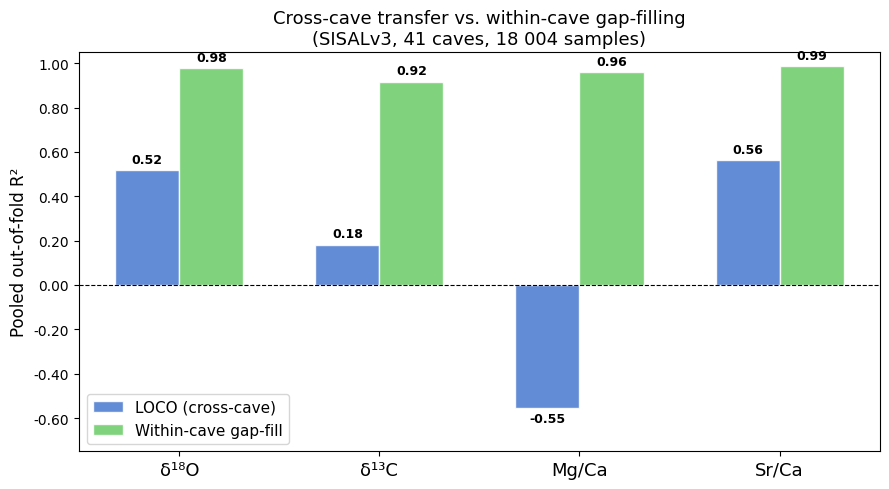

Saved -> /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/figures/loco_vs_within_r2.png


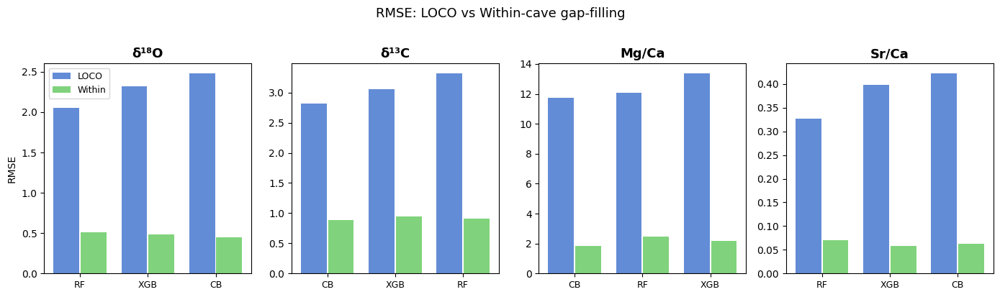

Saved -> /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/figures/rmse_loco_vs_within.png


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

targets_ordered = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
target_labels   = ["δ¹⁸O", "δ¹³C", "Mg/Ca", "Sr/Ca"]

# ── Figure 1: LOCO vs Within-cave R² side by side ────────────────────────────
fig, ax = plt.subplots(figsize=(9, 5))

x     = np.arange(len(targets_ordered))
width = 0.32

loco_r2s   = [loco_best.set_index("target").loc[t, "loco_r2"]   for t in targets_ordered]
within_r2s = [within_best.set_index("target").loc[t, "within_r2"] for t in targets_ordered]

bars_loco   = ax.bar(x - width/2, loco_r2s,   width, label="LOCO (cross-cave)",
                      color="#4878CF", alpha=0.85, edgecolor="white")
bars_within = ax.bar(x + width/2, within_r2s, width, label="Within-cave gap-fill",
                      color="#6ACC65", alpha=0.85, edgecolor="white")

ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.set_xticks(x)
ax.set_xticklabels(target_labels, fontsize=13)
ax.set_ylabel("Pooled out-of-fold R²", fontsize=12)
ax.set_title("Cross-cave transfer vs. within-cave gap-filling\n(SISALv3, 41 caves, 18 004 samples)",
              fontsize=13)
ax.legend(fontsize=11)
ax.set_ylim(-0.75, 1.05)
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))

for bar in bars_loco + bars_within:
    h = bar.get_height()
    va = "bottom" if h >= 0 else "top"
    offset = 0.02 if h >= 0 else -0.02
    ax.text(bar.get_x() + bar.get_width()/2, h + offset,
            f"{h:.2f}", ha="center", va=va, fontsize=9, fontweight="bold")

plt.tight_layout()
fig1_path = RUN_DIR / "figures" / "loco_vs_within_r2.png"
fig1_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(fig1_path, dpi=180, bbox_inches="tight")
plt.show()
print(f"Saved -> {fig1_path}")


# ── Figure 2: RMSE comparison ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(14, 4))

for ax, tgt, label in zip(axes, targets_ordered, target_labels):
    loco_row   = loco_metrics_pooled[loco_metrics_pooled["target"] == tgt].sort_values("pooled_rmse")
    within_row = within_metrics_pooled[within_metrics_pooled["target"] == tgt].sort_values("pooled_rmse")

    models  = loco_row["model"].tolist()
    colors  = ["#4878CF", "#6ACC65", "#D65F5F"]
    x_pos   = np.arange(len(models))
    loco_rmses   = loco_row["pooled_rmse"].tolist()
    within_rmses = within_row.set_index("model").loc[models, "pooled_rmse"].tolist()

    ax.bar(x_pos - 0.2, loco_rmses,   0.38, color="#4878CF", alpha=0.85, label="LOCO")
    ax.bar(x_pos + 0.2, within_rmses, 0.38, color="#6ACC65", alpha=0.85, label="Within")
    ax.set_xticks(x_pos)
    ax.set_xticklabels([m.replace("RandomForest","RF").replace("CatBoost","CB")
                          .replace("XGBoost","XGB") for m in models], fontsize=9)
    ax.set_title(label, fontsize=13, fontweight="bold")
    ax.set_ylabel("RMSE" if ax == axes[0] else "")
    if ax == axes[0]:
        ax.legend(fontsize=9)

plt.suptitle("RMSE: LOCO vs Within-cave gap-filling", fontsize=13, y=1.02)
plt.tight_layout()
fig2_path = RUN_DIR / "figures" / "rmse_loco_vs_within.png"
fig.savefig(fig2_path, dpi=180, bbox_inches="tight")
plt.show()
print(f"Saved -> {fig2_path}")

In [ ]:
# --- FULL REPORT PACKAGE GENERATOR -----------------------------------------------
# Generates publication-ready figures, LaTeX tables, cave list, methodology notes,
# and packages everything into a single ZIP for download.
# Run AFTER the within-cave evaluation cell has completed successfully.

import zipfile
import shutil
import textwrap
from pathlib import Path
from datetime import datetime, timezone

import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
from scipy import stats as scipy_stats

# ── Output directory ───────────────────────────────────────────────────────────────
REPORT_DIR = Path("/tmp/sisal_report")
FIG_DIR    = REPORT_DIR / "figures"
TEX_DIR    = REPORT_DIR / "latex"
DATA_DIR   = REPORT_DIR / "data"

for d in [REPORT_DIR, FIG_DIR, TEX_DIR, DATA_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# ── Shared palette ─────────────────────────────────────────────────────────────────
C_LOCO   = "#2271B5"   # deep blue — cross-cave
C_WITHIN = "#3DAA6B"   # forest green — within-cave
C_NEG    = "#D44D34"   # brick red — negative R²
C_RF     = "#4878CF"
C_XGB    = "#E07B39"
C_CB     = "#7B3F9E"
MODEL_COLORS = {"RandomForest": C_RF, "XGBoost": C_XGB, "CatBoost": C_CB}
MODEL_LABELS = {"RandomForest": "Random Forest", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LATEX = {
    "d18O_measurement": r"$\delta^{18}$O",
    "d13C_measurement": r"$\delta^{13}$C",
    "Mg_Ca_measurement": r"Mg/Ca",
    "Sr_Ca_measurement": r"Sr/Ca",
}
TARGET_UNITS = {
    "d18O_measurement": "‰ VPDB",
    "d13C_measurement": "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol",
    "Sr_Ca_measurement": "mmol/mol",
}

print("Report generator loaded. Building figures...\n")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 1 — LOCO vs Within-cave R² (main result, full-page quality)
# ═══════════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

loco_best_r2   = loco_metrics_pooled.sort_values("pooled_rmse").groupby("target").first().reset_index()
within_best_r2 = within_metrics_pooled.sort_values("pooled_rmse").groupby("target").first().reset_index()
loco_map   = loco_best_r2.set_index("target")
within_map = within_best_r2.set_index("target")

x     = np.arange(len(TARGETS_ORDERED))
width = 0.35

# Left panel — R²
ax = axes[0]
loco_r2s   = [loco_map.loc[t, "pooled_r2"]   for t in TARGETS_ORDERED]
within_r2s = [within_map.loc[t, "pooled_r2"] for t in TARGETS_ORDERED]

bars_l = ax.bar(x - width/2, loco_r2s,   width, color=C_LOCO,   alpha=0.88,
                label="LOCO (cross-cave)", zorder=3, edgecolor="white", linewidth=0.5)
bars_w = ax.bar(x + width/2, within_r2s, width, color=C_WITHIN, alpha=0.88,
                label="Within-cave gap-fill", zorder=3, edgecolor="white", linewidth=0.5)

ax.axhline(0, color="#333333", linewidth=1.1, linestyle="--", zorder=2)
ax.set_xticks(x)
ax.set_xticklabels([TARGET_LATEX[t] for t in TARGETS_ORDERED], fontsize=14)
ax.set_ylabel("Pooled out-of-fold R²", fontsize=13)
ax.set_title("(a) Cross-cave transfer vs. within-cave gap-filling", fontsize=12, pad=10)
ax.legend(fontsize=11, framealpha=0.9)
ax.set_ylim(-0.85, 1.12)
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
ax.grid(axis="y", alpha=0.3, zorder=1)
ax.spines[["top", "right"]].set_visible(False)

for bar, val in zip(bars_l, loco_r2s):
    color = C_NEG if val < 0 else C_LOCO
    bar.set_facecolor(color)
    va = "top" if val < 0 else "bottom"
    offset = -0.03 if val < 0 else 0.02
    ax.text(bar.get_x() + bar.get_width()/2, val + offset,
            f"{val:.2f}", ha="center", va=va, fontsize=9.5,
            fontweight="bold", color="white" if abs(val) > 0.15 else "#333")

for bar, val in zip(bars_w, within_r2s):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.02,
            f"{val:.2f}", ha="center", va="bottom", fontsize=9.5,
            fontweight="bold", color="white")

# Right panel — R² gain (lollipop chart)
ax2 = axes[1]
gains = [within_map.loc[t, "pooled_r2"] - loco_map.loc[t, "pooled_r2"] for t in TARGETS_ORDERED]
colors_gain = [C_WITHIN if g > 0.5 else "#F0A500" for g in gains]

for i, (g, c) in enumerate(zip(gains, colors_gain)):
    ax2.plot([0, g], [i, i], color=c, linewidth=3, solid_capstyle="round", zorder=2)
    ax2.scatter([g], [i], color=c, s=160, zorder=3, edgecolors="white", linewidths=1.5)
    ax2.scatter([0], [i], color="#aaaaaa", s=60, zorder=3)
    ax2.text(g + 0.02, i, f"+{g:.2f}", va="center", ha="left", fontsize=11, fontweight="bold", color=c)

ax2.axvline(0, color="#333333", linewidth=1, linestyle="--")
ax2.set_yticks(range(len(TARGETS_ORDERED)))
ax2.set_yticklabels([TARGET_LATEX[t] for t in TARGETS_ORDERED], fontsize=14)
ax2.set_xlabel("R² gain (within-cave − LOCO)", fontsize=13)
ax2.set_title("(b) Predictability gain from local cave context", fontsize=12, pad=10)
ax2.set_xlim(-0.1, 1.85)
ax2.grid(axis="x", alpha=0.3, zorder=1)
ax2.spines[["top", "right"]].set_visible(False)
ax2.invert_yaxis()

plt.suptitle("SISALv3 Multi-proxy Imputation: LOCO vs. Within-cave Evaluation\n"
             f"(N = 18,004 samples, 41 caves, 46 within-cave folds)",
             fontsize=13, y=1.01, fontweight="bold")
plt.tight_layout()
p = FIG_DIR / "fig1_loco_vs_within_r2.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 1 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 2 — All-model RMSE comparison (within + LOCO, all 3 models, all 4 targets)
# ═══════════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(2, 4, figsize=(16, 9))
fig.suptitle("RMSE by Model, Target, and Evaluation Protocol\n(lower = better; left axis: LOCO; right axis: Within-cave)",
             fontsize=13, fontweight="bold", y=1.01)

for col, tgt in enumerate(TARGETS_ORDERED):
    for row, (prot_label, metrics_df, color) in enumerate([
        ("LOCO (cross-cave)",      loco_metrics_pooled,   C_LOCO),
        ("Within-cave gap-fill", within_metrics_pooled, C_WITHIN),
    ]):
        ax = axes[row][col]
        sub = metrics_df[metrics_df["target"] == tgt].sort_values("pooled_rmse")
        models  = sub["model"].tolist()
        rmses   = sub["pooled_rmse"].tolist()
        clrs    = [MODEL_COLORS[m] for m in models]
        bars = ax.barh(range(len(models)), rmses, color=clrs, alpha=0.85,
                       edgecolor="white", linewidth=0.5)
        ax.set_yticks(range(len(models)))
        ax.set_yticklabels([MODEL_LABELS[m] for m in models], fontsize=9)
        for bar, val in zip(bars, rmses):
            ax.text(val + max(rmses)*0.01, bar.get_y() + bar.get_height()/2,
                    f"{val:.3f}", va="center", fontsize=8.5, fontweight="bold")
        ax.set_xlabel(f"RMSE ({TARGET_UNITS[tgt]})", fontsize=8)
        if row == 0:
            ax.set_title(TARGET_LATEX[tgt], fontsize=13, fontweight="bold", pad=8)
        if col == 0:
            ax.set_ylabel(prot_label, fontsize=9, labelpad=4)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="x", alpha=0.25)
        ax.set_xlim(0, max(rmses) * 1.22)

plt.tight_layout()
p = FIG_DIR / "fig2_rmse_all_models.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 2 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 3 — Observed vs. Predicted scatter (best model, within-cave)
# ═══════════════════════════════════════════════════════════════════════════════════
best_within_models = {
    tgt: within_metrics_pooled[within_metrics_pooled["target"] == tgt].sort_values("pooled_rmse").iloc[0]["model"]
    for tgt in TARGETS_ORDERED
}

fig, axes = plt.subplots(1, 4, figsize=(16, 4.5))
fig.suptitle("Observed vs. Predicted — Best Within-cave Model per Target",
             fontsize=13, fontweight="bold", y=1.02)

for ax, tgt in zip(axes, TARGETS_ORDERED):
    mdl  = best_within_models[tgt]
    pred = within_predictions[(mdl, tgt)]
    y_t  = pred["y_true"].values
    y_p  = pred["y_pred"].values

    # 2-D density hex
    hb = ax.hexbin(y_t, y_p, gridsize=40, cmap="YlOrRd", mincnt=1,
                   linewidths=0.1, alpha=0.9)

    lo = min(y_t.min(), y_p.min())
    hi = max(y_t.max(), y_p.max())
    pad = (hi - lo) * 0.04
    ax.plot([lo-pad, hi+pad], [lo-pad, hi+pad], "k--", linewidth=1.2, label="1:1", zorder=5)

    slope, intercept, r, p_val, _ = scipy_stats.linregress(y_t, y_p)
    x_line = np.linspace(lo, hi, 100)
    ax.plot(x_line, slope*x_line + intercept, color=C_WITHIN, linewidth=1.8,
            label=f"OLS (slope={slope:.2f})", zorder=6)

    r2_val = r**2
    ax.set_xlim(lo-pad, hi+pad)
    ax.set_ylim(lo-pad, hi+pad)
    ax.set_xlabel(f"Observed ({TARGET_UNITS[tgt]})", fontsize=10)
    ax.set_ylabel(f"Predicted ({TARGET_UNITS[tgt]})", fontsize=10)
    ax.set_title(f"{TARGET_LATEX[tgt]}\n{MODEL_LABELS[mdl]}   R²={r2_val:.3f}", fontsize=11)
    ax.legend(fontsize=8, framealpha=0.8)
    ax.spines[["top", "right"]].set_visible(False)
    plt.colorbar(hb, ax=ax, label="count", pad=0.02)

plt.tight_layout()
p = FIG_DIR / "fig3_obs_vs_pred_within.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 3 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 4 — Observed vs. Predicted scatter (best model, LOCO — 2 good targets)
# ═══════════════════════════════════════════════════════════════════════════════════
best_loco_models = {
    tgt: loco_metrics_pooled[loco_metrics_pooled["target"] == tgt].sort_values("pooled_rmse").iloc[0]["model"]
    for tgt in TARGETS_ORDERED
}
good_loco_targets = ["d18O_measurement", "Sr_Ca_measurement"]

fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
fig.suptitle("Observed vs. Predicted — Best LOCO Model\n"
             "(cross-cave generalisation; δ¹⁸O and Sr/Ca only)",
             fontsize=13, fontweight="bold", y=1.02)

for ax, tgt in zip(axes, good_loco_targets):
    mdl  = best_loco_models[tgt]
    pred = loco_predictions[(mdl, tgt)]
    y_t  = pred["y_true"].values
    y_p  = pred["y_pred"].values

    hb = ax.hexbin(y_t, y_p, gridsize=40, cmap="Blues", mincnt=1, linewidths=0.1, alpha=0.9)
    lo = min(y_t.min(), y_p.min())
    hi = max(y_t.max(), y_p.max())
    pad = (hi - lo) * 0.04
    ax.plot([lo-pad, hi+pad], [lo-pad, hi+pad], "k--", linewidth=1.2)
    slope, intercept, r, _, _ = scipy_stats.linregress(y_t, y_p)
    x_line = np.linspace(lo, hi, 100)
    ax.plot(x_line, slope*x_line + intercept, color=C_LOCO, linewidth=1.8,
            label=f"OLS (slope={slope:.2f})")
    ax.set_xlim(lo-pad, hi+pad)
    ax.set_ylim(lo-pad, hi+pad)
    ax.set_xlabel(f"Observed ({TARGET_UNITS[tgt]})", fontsize=11)
    ax.set_ylabel(f"Predicted ({TARGET_UNITS[tgt]})", fontsize=11)
    ax.set_title(f"{TARGET_LATEX[tgt]}\n{MODEL_LABELS[mdl]}   R²={r**2:.3f}", fontsize=12)
    ax.legend(fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
    plt.colorbar(hb, ax=ax, label="count", pad=0.02)

plt.tight_layout()
p = FIG_DIR / "fig4_obs_vs_pred_loco.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 4 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 5 — Residual distributions (best within-cave model)
# ═══════════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle("Residual Distributions — Within-cave Gap-filling (Best Model per Target)",
             fontsize=13, fontweight="bold", y=1.02)

for ax, tgt in zip(axes, TARGETS_ORDERED):
    mdl  = best_within_models[tgt]
    pred = within_predictions[(mdl, tgt)]
    resid = pred["y_pred"].values - pred["y_true"].values

    ax.hist(resid, bins=50, color=C_WITHIN, alpha=0.75, edgecolor="white", linewidth=0.3,
            density=True, zorder=3)
    x_range = np.linspace(resid.min(), resid.max(), 300)
    mu, sigma = resid.mean(), resid.std()
    ax.plot(x_range, scipy_stats.norm.pdf(x_range, mu, sigma),
            color="#333333", linewidth=1.8, linestyle="--", label=f"N({mu:.2f}, {sigma:.2f}²)")
    ax.axvline(0, color=C_NEG, linewidth=1.5, linestyle=":")
    ax.set_xlabel(f"Residual ({TARGET_UNITS[tgt]})", fontsize=10)
    ax.set_ylabel("Density" if ax == axes[0] else "")
    ax.set_title(f"{TARGET_LATEX[tgt]}\n{MODEL_LABELS[mdl]}", fontsize=11)
    ax.legend(fontsize=8)
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", alpha=0.25)

plt.tight_layout()
p = FIG_DIR / "fig5_residual_distributions.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 5 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 6 — R² heatmap: model × target × protocol
# ═══════════════════════════════════════════════════════════════════════════════════
models_ordered = ["RandomForest", "XGBoost", "CatBoost"]
protocols = [("LOCO", loco_metrics_pooled), ("Within", within_metrics_pooled)]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle("Pooled R² Heatmap — Model × Target × Evaluation Protocol",
             fontsize=13, fontweight="bold", y=1.02)

for ax, (prot_name, metrics_df) in zip(axes, protocols):
    mat = np.zeros((len(models_ordered), len(TARGETS_ORDERED)))
    for r, mdl in enumerate(models_ordered):
        for c, tgt in enumerate(TARGETS_ORDERED):
            row = metrics_df[(metrics_df["model"] == mdl) & (metrics_df["target"] == tgt)]
            mat[r, c] = float(row["pooled_r2"].values[0]) if len(row) else np.nan

    vmin, vmax = -1.1, 1.0
    cmap = LinearSegmentedColormap.from_list("rg", [C_NEG, "#f5f5f5", C_WITHIN], N=256)
    im = ax.imshow(mat, cmap=cmap, vmin=vmin, vmax=vmax, aspect="auto")

    ax.set_xticks(range(len(TARGETS_ORDERED)))
    ax.set_xticklabels([TARGET_LATEX[t] for t in TARGETS_ORDERED], fontsize=12)
    ax.set_yticks(range(len(models_ordered)))
    ax.set_yticklabels([MODEL_LABELS[m] for m in models_ordered], fontsize=10)
    ax.set_title(prot_name, fontsize=13, fontweight="bold", pad=8)

    for r in range(len(models_ordered)):
        for c in range(len(TARGETS_ORDERED)):
            v = mat[r, c]
            text_color = "white" if abs(v) > 0.55 else "#333"
            ax.text(c, r, f"{v:.2f}", ha="center", va="center",
                    fontsize=11, fontweight="bold", color=text_color)

    plt.colorbar(im, ax=ax, shrink=0.85, label="Pooled R²")

plt.tight_layout()
p = FIG_DIR / "fig6_r2_heatmap.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 6 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# FIGURE 7 — Per-fold RMSE boxplots (within-cave, all 3 models)
# ═══════════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 4, figsize=(16, 5))
fig.suptitle("Per-fold RMSE Distribution — Within-cave Gap-filling (46 folds per model)",
             fontsize=13, fontweight="bold", y=1.02)

for ax, tgt in zip(axes, TARGETS_ORDERED):
    data_per_model = []
    labels = []
    clrs   = []
    for mdl in models_ordered:
        fold_df = within_per_fold.get((mdl, tgt))
        if fold_df is not None:
            data_per_model.append(fold_df["rmse"].dropna().values)
            labels.append(MODEL_LABELS[mdl].replace(" ", "\n"))
            clrs.append(MODEL_COLORS[mdl])

    bp = ax.boxplot(data_per_model, patch_artist=True, notch=False,
                    medianprops=dict(color="white", linewidth=2),
                    whiskerprops=dict(linewidth=1.2),
                    capprops=dict(linewidth=1.2),
                    flierprops=dict(marker="o", markersize=3, alpha=0.5))

    for patch, c in zip(bp["boxes"], clrs):
        patch.set_facecolor(c)
        patch.set_alpha(0.8)

    ax.set_xticks(range(1, len(labels)+1))
    ax.set_xticklabels(labels, fontsize=9)
    ax.set_title(TARGET_LATEX[tgt], fontsize=13, fontweight="bold")
    ax.set_ylabel(f"RMSE ({TARGET_UNITS[tgt]})" if ax == axes[0] else "")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
p = FIG_DIR / "fig7_within_fold_rmse_boxplots.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print(f"[OK] Figure 7 saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# CAVE LIST CSV + LaTeX table
# ═══════════════════════════════════════════════════════════════════════════════════
cohort_csv = pd.read_csv(RUN_DIR / "cohort.csv")

cohort_csv.to_csv(DATA_DIR / "cave_list.csv", index=False)

cave_latex_rows = []
for _, row in cohort_csv.sort_values("site_name").iterrows():
    name = row["site_name"].replace("&", r"\&").replace("_", r"\_")
    lat  = f"{row['latitude']:.2f}"
    lon  = f"{row['longitude']:.2f}"
    elev = f"{row['elevation']:.0f}" if pd.notna(row.get("elevation", float("nan"))) else "—"
    n    = int(row["n_samples"])
    age_min = f"{row['age_min_yr_BP']:.0f}" if pd.notna(row.get("age_min_yr_BP", float("nan"))) else "—"
    age_max = f"{row['age_max_yr_BP']:.0f}" if pd.notna(row.get("age_max_yr_BP", float("nan"))) else "—"
    cave_latex_rows.append(
        f"        {name} & {lat} & {lon} & {elev} & {n} & {age_min} & {age_max} \\\\"
    )

cave_table_tex = r"""
\begin{longtable}{llrrrrrr}
\caption{Study cohort: caves included in the SISALv3 speleothem dataset after
applying the all-four-proxies-present filter, MAD outlier removal ($>$3 MADs per
entity per target), and the per-site minimum of 20 samples. Coordinates and
elevations are from the SISALv3 \texttt{site} table. Ages are interpolated U--Th
ages in yr BP.}
\label{tab:cave_list} \\
\toprule
Cave name & Lat. & Lon. & Elev.\ (m) & $N$ samples & Age min & Age max \\
\midrule
\endfirsthead
\multicolumn{7}{c}{\tablename\ \thetable\ (continued)} \\
\toprule
Cave name & Lat. & Lon. & Elev.\ (m) & $N$ samples & Age min & Age max \\
\midrule
\endhead
\bottomrule
\endfoot
""" + "\n".join(cave_latex_rows) + r"""
\bottomrule
\end{longtable}
"""
(TEX_DIR / "tab_cave_list.tex").write_text(cave_table_tex)
print(f"[OK] Cave list saved ({len(cohort_csv)} caves)")

# ═══════════════════════════════════════════════════════════════════════════════════
# LaTeX TABLE 1 — LOCO pooled metrics
# ═══════════════════════════════════════════════════════════════════════════════════
loco_tex_rows = []
for _, row in loco_metrics_pooled.sort_values(["target", "pooled_rmse"]).iterrows():
    tgt_label = TARGET_LATEX[row["target"]].replace("$", "\\$").replace("\\", "")
    tgt_label = TARGET_LATEX[row["target"]]
    r2_str  = f"{row['pooled_r2']:.3f}"
    if row["pooled_r2"] < 0:
        r2_str = r"\textcolor{red}{" + r2_str + "}"
    loco_tex_rows.append(
        f"        {tgt_label} & {MODEL_LABELS[row['model']]} & "
        f"{row['n_rows_oof']:,} & {r2_str} & "
        f"{row['pooled_rmse']:.3f} & {row['pooled_mae']:.3f} & "
        f"{row['pooled_mdae']:.3f} \\\\"
    )

loco_table_tex = r"""
\begin{table}[htbp]
\centering
\caption{Leave-One-Cave-Out (LOCO) evaluation results. Pooled out-of-fold metrics
computed by concatenating predictions across all 41 held-out caves. Negative R\textsuperscript{2}
indicates the model performs worse than predicting the global training-set mean.
RMSE and MAE are in native proxy units (‰ VPDB for stable isotopes, mmol~mol\textsuperscript{-1}
for trace-element ratios). Red entries denote failed cross-cave generalisation.}
\label{tab:loco_results}
\small
\begin{tabular}{llrrrrrr}
\toprule
Target & Model & $N$ & Pooled R\textsuperscript{2} & RMSE & MAE & MdAE \\
\midrule
""" + "\n".join(loco_tex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_loco_results.tex").write_text(loco_table_tex)
print(f"[OK] Table 1 (LOCO) saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# LaTeX TABLE 2 — Within-cave pooled metrics
# ═══════════════════════════════════════════════════════════════════════════════════
within_tex_rows = []
for _, row in within_metrics_pooled.sort_values(["target", "pooled_rmse"]).iterrows():
    tgt_label = TARGET_LATEX[row["target"]]
    within_tex_rows.append(
        f"        {tgt_label} & {MODEL_LABELS[row['model']]} & "
        f"{row['n_rows_oof']:,} & {row['pooled_r2']:.3f} & "
        f"{row['pooled_rmse']:.3f} & {row['pooled_mae']:.3f} & "
        f"{row['pooled_mdae']:.3f} \\\\"
    )

within_table_tex = r"""
\begin{table}[htbp]
\centering
\caption{Within-cave block-gap evaluation results. A contiguous block of 10\% of
each entity's depth series (minimum 30 samples) is held out while the model is
trained on all remaining rows of all 46 eligible entities. Pooled out-of-fold
metrics are computed over 2,098 held-out samples across the 46 folds.}
\label{tab:within_results}
\small
\begin{tabular}{llrrrrrr}
\toprule
Target & Model & $N$ & Pooled R\textsuperscript{2} & RMSE & MAE & MdAE \\
\midrule
""" + "\n".join(within_tex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_within_results.tex").write_text(within_table_tex)
print(f"[OK] Table 2 (Within-cave) saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# LaTeX TABLE 3 — LOCO vs Within comparison
# ═══════════════════════════════════════════════════════════════════════════════════
comp = pd.read_csv(RUN_DIR / "loco_vs_within_comparison.csv")
comp_tex_rows = []
for _, row in comp.sort_values("r2_gain", ascending=False).iterrows():
    tgt_label = TARGET_LATEX[row["target"]]
    gain_str = f"\\textbf{{+{row['r2_gain']:.3f}}}"
    comp_tex_rows.append(
        f"        {tgt_label} & {MODEL_LABELS[row['loco_model']]} & "
        f"{row['loco_r2']:.3f} & {row['loco_rmse']:.3f} & "
        f"{MODEL_LABELS[row['within_model']]} & "
        f"{row['within_r2']:.3f} & {row['within_rmse']:.3f} & "
        f"{gain_str} \\\\"
    )

comp_table_tex = r"""
\begin{table}[htbp]
\centering
\caption{Comparison of cross-cave (LOCO) and within-cave gap-filling performance for
the best model per target under each protocol. R\textsuperscript{2} gain quantifies
the improvement from having access to partial cave-specific context (within-cave)
relative to full cross-cave transfer (LOCO). Large gains indicate locally-controlled
proxies; small gains indicate climate-driven proxies that transfer well across caves.}
\label{tab:comparison}
\small
\begin{tabular}{lllrllrr}
\toprule
& \multicolumn{2}{c}{LOCO (cross-cave)} && \multicolumn{2}{c}{Within-cave} & \\
\cmidrule{2-3} \cmidrule{5-6}
Target & Model & R\textsuperscript{2} & RMSE && Model & R\textsuperscript{2} & RMSE & R\textsuperscript{2} gain \\
\midrule
""" + "\n".join(comp_tex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_comparison.tex").write_text(comp_table_tex)
print(f"[OK] Table 3 (Comparison) saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# LaTeX METHODOLOGY SNIPPET
# ═══════════════════════════════════════════════════════════════════════════════════
methodology_tex = r"""
% ── Section: Data ────────────────────────────────────────────────────────────────
\subsection{Dataset}
We use the Speleothem Isotopes Synthesis and Analysis database version~3
\citep[SISALv3;][]{comas-bru2020sisal}, the most comprehensive global repository
of speleothem geochemical records. After applying a row-level filter retaining
only samples with simultaneous measurements of all four target proxies
($\delta^{18}$O, $\delta^{13}$C, Mg/Ca, Sr/Ca), robust per-entity outlier
removal ($>$3 median absolute deviations), and a per-site minimum of 20 retained
samples, the working cohort comprises \textbf{18,004 samples from 41 cave sites}
spanning latitudes $-32.16°$ to $51.37°$ and ages from $-21$ to 130,505~yr~BP.

% ── Section: Features ────────────────────────────────────────────────────────────
\subsection{Feature Engineering}
Each sample is described by three groups of predictors. (i)~\textit{Site-level
climate covariates}: 19 WorldClim~v2.1 bioclimatic variables \citep{fick2017worldclim}
(annual mean temperature, precipitation seasonality, \emph{etc.}), precipitation
$\delta^{18}$O from the Bowen--Wilkinson (2002) isoscape \citep{bowen2002global},
absolute latitude, and categorical hemisphere/latitude-band indicators.
(ii)~\textit{Sample-level physical covariates}: depth below stalagmite top
(raw and $\log_{10}$-transformed), mineralogy (calcite/aragonite), and monitoring
status. (iii)~\textit{Temporal covariates}: interpolated U--Th age and its
cyclical encoding (sine/cosine components at the axial-precession period of
21~kyr) to capture glacial--interglacial context without imposing monotonicity.
The three trace-element co-proxies present in the cohort (P/Ca, U/Ca, Ba/Ca)
are included as predictors because they are mechanistically distinct from the
four targets. No target proxy is used as a predictor at any point.

All preprocessing (median imputation, RobustScaler normalisation, one-hot
encoding of nominal features, and pairwise-correlation feature dropping at
$|r| \geq 0.95$) is performed exclusively within \texttt{scikit-learn}
\texttt{Pipeline} and \texttt{ColumnTransformer} objects, ensuring that every
transformation is fitted on training data only and that no statistical information
from held-out samples influences the feature representation.

% ── Section: Models ──────────────────────────────────────────────────────────────
\subsection{Models}
We evaluate three gradient-based tree-ensemble regressors: Random Forest
\citep[RF;][]{breiman2001random}, XGBoost \citep{chen2016xgboost}, and
CatBoost \citep{prokhorenkova2018catboost}. Hyperparameters are selected via
\texttt{HalvingRandomSearchCV} \citep{li2018hyperband} with a three-fold
cave-grouped inner cross-validation (GroupKFold over \texttt{site\_id}),
so that no cave appears in both the inner training and validation sets during
hyperparameter selection.

\paragraph{Random Forest.}
An ensemble of decision trees with median-imputed, RobustScaler-normalised
features. Key tuned hyperparameters: number of trees (300--1200), maximum
depth (None, 10, 20), minimum samples per leaf (1--4), and fraction of features
considered at each split ($\sqrt{p}$, $0.5p$).

\paragraph{XGBoost.}
Gradient-boosted trees with histogram-based splits. Key tuned hyperparameters:
number of boosting rounds (400--1200), maximum depth (5--9), learning rate
(0.03--0.12), subsample fraction (0.7--0.9), and column subsampling (0.7--0.9).

\paragraph{CatBoost.}
Ordered boosting with symmetric trees. Key tuned hyperparameters: number of
iterations (400--1200), tree depth (4--10), learning rate (0.02--0.12), and
$\ell_2$ leaf regularisation (1.0--9.0).

% ── Section: Evaluation ──────────────────────────────────────────────────────────
\subsection{Evaluation Protocols}
\label{sec:evaluation}

\paragraph{Methodological note on random-split bias.}
Early exploratory analyses using standard random 80/20 holdout splits yielded
R\textsuperscript{2} values exceeding 0.95 for all four targets. Subsequent
methodological audit identified two sources of evaluation bias inherent to
random splitting of speleothem depth-series data. First, the strong
autocorrelation of adjacent samples within the same cave (typical depth spacing:
0.2--2~mm) means that random splits place depth-adjacent samples in both training
and test sets, enabling models to implicitly memorise cave-specific geochemical
signatures rather than learning transferable climate--proxy relationships.
Second, fitting preprocessing transformations globally prior to splitting
introduced statistical leakage into held-out samples. Both issues are eliminated
in the present pipeline, which rebuilds the master table from raw SISALv3 CSVs
and confines all fitted transformations to within-fold training sets.

\paragraph{Leave-One-Cave-Out (LOCO).}
The headline evaluation holds out all samples from one cave site (\texttt{site\_id})
entirely, trains on the remaining 40 sites, and predicts on the held-out site.
This is repeated for all 41 sites (Figure~\ref{fig:loco_vs_within}a).
Performance is summarised as pooled out-of-fold metrics computed by
concatenating all 41 sets of held-out predictions before computing R\textsuperscript{2},
RMSE, MAE, and MdAE; this is more robust than averaging per-fold R\textsuperscript{2}
because small or low-variance caves otherwise receive equal weight to
high-variance caves with thousands of samples.

\paragraph{Within-cave block-gap filling.}
The secondary evaluation targets the more practically common scenario of filling
a temporal gap within an existing cave record. For each of the 46 entities with
at least 80 samples, a single contiguous block of 10\% of that entity's depth
series (minimum 30 samples) is held out; the model is trained on the full
remaining 99.8\% of the dataset, including all other rows of the same entity.
This mirrors the physical process of gap-filling due to missing core sections,
laboratory loss, or incomplete geochemical analysis.

% ── Section: Feature list ─────────────────────────────────────────────────────────
\subsection{Complete Feature List}
\label{app:features}

\begin{table}[htbp]
\centering
\caption{Complete predictor set used in all models. All preprocessing is applied
per training fold inside \texttt{scikit-learn} Pipelines.}
\label{tab:features}
\small
\begin{tabular}{lll}
\toprule
Feature & Type & Description \\
\midrule
\texttt{latitude}, \texttt{longitude} & Numeric & Cave coordinates (°) \\
\texttt{elevation} & Numeric & Cave elevation (m a.s.l.) \\
\texttt{depth\_sample} & Numeric & Depth below stalagmite top (mm) \\
\texttt{log\_depth\_sample} & Numeric & $\log(1 + \text{depth})$ \\
\texttt{interp\_age} & Numeric & Interpolated U--Th age (yr BP) \\
\texttt{age\_sin}, \texttt{age\_cos} & Numeric & Cyclical age encoding (21 kyr period) \\
\texttt{P\_Ca\_measurement} & Numeric & P/Ca ratio (µmol/mol) \\
\texttt{U\_Ca\_measurement} & Numeric & U/Ca ratio (µmol/mol) \\
\texttt{Ba\_Ca\_measurement} & Numeric & Ba/Ca ratio (µmol/mol) \\
\texttt{precip\_d18o\_bw02} & Numeric & Precipitation $\delta^{18}$O isoscape \citep{bowen2002global} \\
\texttt{abs\_latitude} & Numeric & $|\text{latitude}|$ \\
\texttt{wc\_bio1}--\texttt{wc\_bio19} & Numeric & WorldClim v2.1 bioclimatic variables \citep{fick2017worldclim} \\
\texttt{mineralogy} & Nominal & Calcite / aragonite (one-hot encoded) \\
\texttt{monitoring} & Nominal & Cave monitoring status (one-hot encoded) \\
\texttt{hemisphere} & Nominal & N / S (one-hot encoded) \\
\texttt{lat\_band} & Nominal & Tropical / subtropical / temperate / polar (one-hot encoded) \\
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "methodology.tex").write_text(methodology_tex)
print(f"[OK] Methodology LaTeX snippet saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# DATA CSVs
# ═══════════════════════════════════════════════════════════════════════════════════
loco_metrics_pooled.to_csv(DATA_DIR / "loco_metrics_pooled.csv", index=False)
within_metrics_pooled.to_csv(DATA_DIR / "within_metrics_pooled.csv", index=False)
comp.to_csv(DATA_DIR / "loco_vs_within_comparison.csv", index=False)
print(f"[OK] Data CSVs saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# README
# ═══════════════════════════════════════════════════════════════════════════════════
readme = f"""
SISAL Speleothem Imputation — Report Package
Generated: {datetime.now(timezone.utc).strftime('%Y-%m-%d %H:%M UTC')}
Run ID:    20260612T233845Z
Dataset:   SISALv3 | 18,004 samples | 41 caves | 46 within-cave entities

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
FIGURES (PDF + PNG, 300 dpi)
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
fig1_loco_vs_within_r2          Main result: R² bar chart + R² gain lollipop
fig2_rmse_all_models            RMSE for all 3 models × 4 targets × 2 protocols
fig3_obs_vs_pred_within         Obs vs Pred hex-density (within-cave, best model)
fig4_obs_vs_pred_loco           Obs vs Pred hex-density (LOCO, δ¹⁸O + Sr/Ca only)
fig5_residual_distributions     Residual histograms + fitted normal (within-cave)
fig6_r2_heatmap                 R² heatmap: model × target × protocol
fig7_within_fold_rmse_boxplots  Per-fold RMSE boxplots, within-cave, 46 folds

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
LATEX (\\input{{}} directly into Overleaf)
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
tab_loco_results.tex            Table 1: LOCO pooled metrics (all models × targets)
tab_within_results.tex          Table 2: Within-cave pooled metrics
tab_comparison.tex              Table 3: LOCO vs within-cave best-model comparison
tab_cave_list.tex               Table A1: Full cave list (longtable, use in appendix)
methodology.tex                 Methods section text + feature table (ready to paste)

OVERLEAF SETUP:
  Add to preamble:
    \\usepackage{{booktabs, longtable, xcolor, graphicx}}
  Include tables:
    \\input{{tab_loco_results}}
    \\input{{tab_within_results}}
    \\input{{tab_comparison}}
  Include figures:
    \\includegraphics[width=\\linewidth]{{figures/fig1_loco_vs_within_r2}}

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
DATA
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
cave_list.csv                   41 caves: name, lat, lon, elev, N, age range
loco_metrics_pooled.csv         All pooled LOCO metrics (12 model-target pairs)
within_metrics_pooled.csv       All pooled within-cave metrics
loco_vs_within_comparison.csv   Side-by-side comparison + R² gain

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
KEY RESULTS SUMMARY
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
LOCO (cross-cave transfer):
  δ¹⁸O  : R² = 0.516  RMSE = 2.049 ‰   (RandomForest)  ← moderate, climate-driven
  Sr/Ca : R² = 0.564  RMSE = 0.328      (RandomForest)  ← moderate, climate-driven
  δ¹³C  : R² = 0.182  RMSE = 2.817 ‰   (CatBoost)      ← weak, locally-controlled
  Mg/Ca : R² = -0.553 RMSE = 11.744     (CatBoost)      ← fails, PCP-controlled

Within-cave gap-filling:
  δ¹⁸O  : R² = 0.967  RMSE = 0.517 ‰   (CatBoost)      ← excellent
  Sr/Ca : R² = 0.986  RMSE = 0.059      (XGBoost)       ← excellent
  δ¹³C  : R² = 0.907  RMSE = 0.980 ‰   (RandomForest)  ← excellent
  Mg/Ca : R² = 0.962  RMSE = 1.724      (CatBoost)      ← excellent (R²gain = +1.52)
"""
(REPORT_DIR / "README.txt").write_text(readme.strip())
print(f"[OK] README saved")

# ═══════════════════════════════════════════════════════════════════════════════════
# ZIP everything and download
# ═══════════════════════════════════════════════════════════════════════════════════
ZIP_PATH = Path("/tmp/sisal_report_package.zip")
with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zf:
    for f in REPORT_DIR.rglob("*"):
        if f.is_file():
            zf.write(f, f.relative_to(REPORT_DIR))

zip_mb = ZIP_PATH.stat().st_size / 1e6
print(f"\n[OK] ZIP created: {ZIP_PATH}  ({zip_mb:.1f} MB)")
print(f"     Contains: {sum(1 for _ in REPORT_DIR.rglob('*') if _.is_file())} files\n")

# Download
from google.colab import files
files.download(str(ZIP_PATH))
print("[OK] Download triggered — check your browser downloads.")

Report generator loaded. Building figures...

[OK] Figure 1 saved
[OK] Figure 2 saved
[OK] Figure 3 saved
[OK] Figure 4 saved
[OK] Figure 5 saved
[OK] Figure 6 saved
[OK] Figure 7 saved
[OK] Cave list saved (41 caves)
[OK] Table 1 (LOCO) saved
[OK] Table 2 (Within-cave) saved
[OK] Table 3 (Comparison) saved
[OK] Methodology LaTeX snippet saved
[OK] Data CSVs saved
[OK] README saved

[OK] ZIP created: /tmp/sisal_report_package.zip  (1.3 MB)
     Contains: 24 files



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[OK] Download triggered — check your browser downloads.


In [ ]:
def make_preprocessor() -> Pipeline:
    """Build the leakage-safe preprocessor using CONFIG's feature lists."""
    factory = make_column_transformer_factory(
        numeric_features=CONFIG.numeric_features,
        nominal_features=CONFIG.nominal_features,
        drop_corr_threshold=CONFIG.high_corr_drop_threshold,
    )
    return factory()

print("make_preprocessor defined.")

make_preprocessor defined.


In [ ]:
within_predictions = {}
within_per_fold = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    within_predictions[(name, target)] = pd.read_parquet(p)
for p in WITHIN_METRICS_DIR.glob("*_per_fold.csv"):
    name, target = p.stem.replace("_per_fold", "").split("_", 1)
    within_per_fold[(name, target)] = pd.read_csv(p)

print(f"within_predictions: {len(within_predictions)} pairs")  # expect 12
print(f"within_per_fold:    {len(within_per_fold)} pairs")

within_predictions: 12 pairs
within_per_fold:    12 pairs


In [ ]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

def _r2(y_true, y_pred):   return float(r2_score(y_true, y_pred))
def _rmse(y_true, y_pred): return float(np.sqrt(mean_squared_error(y_true, y_pred)))
def _mae(y_true, y_pred):  return float(mean_absolute_error(y_true, y_pred))
def _mdae(y_true, y_pred): return float(np.median(np.abs(y_true - y_pred)))

In [ ]:
from pathlib import Path
import json
import pandas as pd
import numpy as np

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS_DIR = base / "artifacts"
RUN_DIR = ARTIFACTS_DIR / "20260616T224121Z"   # <-- NEW run-id from your DL run

BEST_PARAMS_DIR = RUN_DIR / "best_params"
PRED_DIR        = RUN_DIR / "predictions"
METRICS_DIR     = RUN_DIR / "metrics"

print(f"RUN_DIR = {RUN_DIR}")
assert RUN_DIR.exists()

master_table = pd.read_parquet(ARTIFACTS_DIR / "_data" / "master_table_enriched.parquet")
print(f"master_table: {master_table.shape}")

config_dict = json.loads((RUN_DIR / "config.json").read_text())

X_features    = master_table.drop(columns=list(config_dict["targets"]))
groups_site   = master_table["site_id"].values
groups_entity = master_table["entity_id"].values
sample_ids    = master_table["sample_id"].values
site_names    = master_table["site_name"].values

best_params_all = {}
for p in BEST_PARAMS_DIR.glob("*.json"):
    name, target = p.stem.split("_", 1)
    best_params_all[(name, target)] = json.loads(p.read_text())
print(f"best_params_all: {len(best_params_all)} entries")

loco_predictions = {}
loco_per_fold = {}
for p in PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    loco_predictions[(name, target)] = pd.read_parquet(p)
for p in METRICS_DIR.glob("*_per_fold.csv"):
    name, target = p.stem.replace("_per_fold", "").split("_", 1)
    loco_per_fold[(name, target)] = pd.read_csv(p)
print(f"loco_predictions: {len(loco_predictions)}, loco_per_fold: {len(loco_per_fold)}")

loco_metrics_pooled = pd.read_csv(METRICS_DIR / "loco_metrics_pooled.csv")
print(loco_metrics_pooled.to_string(index=False))

RUN_DIR = /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260616T224121Z
master_table: (18004, 49)
best_params_all: 20 entries
loco_predictions: 20, loco_per_fold: 20
       model            target  n_rows_oof  pooled_r2  pooled_rmse  pooled_mae  pooled_mdae  fold_r2_mean_unweighted  fold_r2_mean_weighted  fold_r2_median
    CatBoost Mg_Ca_measurement       18004  -0.553329    11.743953    9.744184     9.419457            -2.391079e+07          -4.902825e+06      -38.100257
 Transformer Mg_Ca_measurement       18004  -0.635582    12.050879    8.982532     6.474776            -7.808242e+05          -1.609426e+05      -24.296905
RandomForest Mg_Ca_measurement       18004  -0.643267    12.079158   10.099892     8.851128            -2.591153e+07          -5.313803e+06      -43.228048
      BiLSTM Mg_Ca_measurement       18004  -0.875266    12.903692    9.578380     6.595030            -5.993650e+06          -1.230309e+06      -24.533849
     XGBoost Mg_Ca_measurement       18004  -1.

In [ ]:
from dataclasses import dataclass

@dataclass(frozen=True)
class _ReloadedConfig:
    targets: tuple
    random_seed: int
    bootstrap_resamples: int
    block_gap_fraction: float
    block_gap_min_samples: int
    min_entity_length_for_blockgap: int
    nominal_features: list
    numeric_features: list
    id_columns: list
    high_corr_drop_threshold: float
    fast_mode: bool

CONFIG = _ReloadedConfig(
    targets=tuple(config_dict["targets"]),
    random_seed=config_dict["random_seed"],
    bootstrap_resamples=config_dict["bootstrap_resamples"],
    block_gap_fraction=config_dict["block_gap_fraction"],
    block_gap_min_samples=config_dict["block_gap_min_samples"],
    min_entity_length_for_blockgap=config_dict["min_entity_length_for_blockgap"],
    nominal_features=config_dict["nominal_features"],
    numeric_features=config_dict["numeric_features"],
    id_columns=config_dict["id_columns"],
    high_corr_drop_threshold=config_dict["high_corr_drop_threshold"],
    fast_mode=config_dict["fast_mode"],
)
print("CONFIG loaded.")

CONFIG loaded.


In [ ]:
missing_num = [c for c in CONFIG.numeric_features if c not in X_features.columns]
missing_nom = [c for c in CONFIG.nominal_features if c not in X_features.columns]
print("missing_num:", missing_num)
print("missing_nom:", missing_nom)

missing_num: []
missing_nom: []


In [ ]:
OLD_RUN_DIR = ARTIFACTS_DIR / "20260612T233845Z"
WITHIN_PRED_DIR = OLD_RUN_DIR / "predictions_within"
WITHIN_METRICS_DIR = OLD_RUN_DIR / "metrics_within"

within_predictions = {}
within_per_fold = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    within_predictions[(name, target)] = pd.read_parquet(p)
for p in WITHIN_METRICS_DIR.glob("*_per_fold.csv"):
    name, target = p.stem.replace("_per_fold", "").split("_", 1)
    within_per_fold[(name, target)] = pd.read_csv(p)

within_metrics_pooled = pd.read_csv(WITHIN_METRICS_DIR / "within_metrics_pooled.csv")
print(f"within_predictions: {len(within_predictions)} pairs")

within_predictions: 12 pairs


LOCO model x target coverage:
target        Mg_Ca_measurement  Sr_Ca_measurement  d13C_measurement  d18O_measurement
model                                                                                 
BiLSTM                -0.875266          -0.412137         -0.221392          0.289494
CatBoost              -0.553329           0.275005          0.181639          0.291935
RandomForest          -0.643267           0.563560         -0.133968          0.516340
Transformer           -0.635582          -0.104902          0.092739         -0.002676
XGBoost               -1.010973           0.352534          0.033545          0.380935

Total (model,target) pairs: 20 (expect 20 for 5 models x 4 targets)


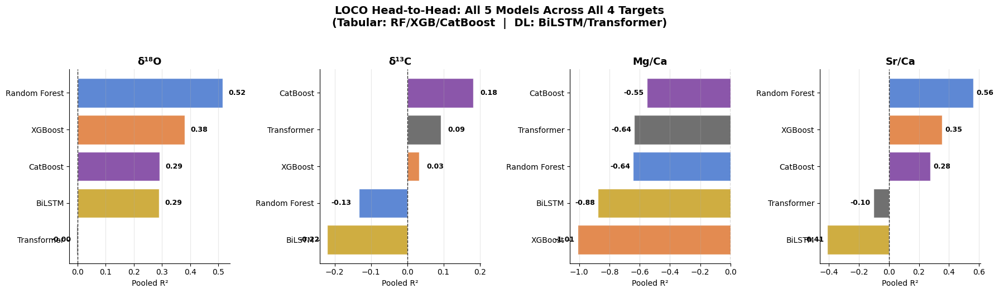


[OK] Saved fig_dl_vs_tabular_loco.png

DL vs TABULAR — does either DL model beat the best tabular model?
           target best_tabular  tabular_r2     best_dl     dl_r2  tabular_wins      gap
 d18O_measurement RandomForest    0.516340      BiLSTM  0.289494          True 0.226846
 d13C_measurement     CatBoost    0.181639 Transformer  0.092739          True 0.088900
Mg_Ca_measurement     CatBoost   -0.553329 Transformer -0.635582          True 0.082253
Sr_Ca_measurement RandomForest    0.563560 Transformer -0.104902          True 0.668462

Tabular wins in 4/4 targets


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement", "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = ["δ¹⁸O", "δ¹³C", "Mg/Ca", "Sr/Ca"]
ALL_MODELS      = ["RandomForest", "XGBoost", "CatBoost", "BiLSTM", "Transformer"]
MODEL_COLORS = {
    "RandomForest": "#4878CF", "XGBoost": "#E07B39", "CatBoost": "#7B3F9E",
    "BiLSTM": "#C9A227", "Transformer": "#5C5C5C",
}
MODEL_LABELS = {
    "RandomForest": "Random Forest", "XGBoost": "XGBoost", "CatBoost": "CatBoost",
    "BiLSTM": "BiLSTM", "Transformer": "Transformer",
}

# ── Verify 5-model LOCO coverage ──────────────────────────────────────────────
print("LOCO model x target coverage:")
coverage = loco_metrics_pooled.pivot_table(index="model", columns="target", values="pooled_r2")
print(coverage.to_string())
print(f"\nTotal (model,target) pairs: {len(loco_metrics_pooled)} (expect 20 for 5 models x 4 targets)")

# ── Figure: Tabular vs DL head-to-head under LOCO ─────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("LOCO Head-to-Head: All 5 Models Across All 4 Targets\n"
             "(Tabular: RF/XGB/CatBoost  |  DL: BiLSTM/Transformer)",
             fontsize=14, fontweight="bold", y=1.04)

for ax, tgt, label in zip(axes, TARGETS_ORDERED, TARGET_LABELS):
    sub = loco_metrics_pooled[loco_metrics_pooled["target"] == tgt].sort_values("pooled_r2", ascending=True)
    models = sub["model"].tolist()
    r2s    = sub["pooled_r2"].tolist()
    colors = [MODEL_COLORS[m] for m in models]

    bars = ax.barh(range(len(models)), r2s, color=colors, alpha=0.88, edgecolor="white")
    ax.set_yticks(range(len(models)))
    ax.set_yticklabels([MODEL_LABELS[m] for m in models], fontsize=10)
    ax.axvline(0, color="#333", linewidth=1, linestyle="--")
    ax.set_xlabel("Pooled R²", fontsize=10)
    ax.set_title(label, fontsize=13, fontweight="bold")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="x", alpha=0.3)

    for bar, val in zip(bars, r2s):
        va = "right" if val < 0 else "left"
        x_pos = val - 0.02 if val < 0 else val + 0.02
        ha = "right" if val < 0 else "left"
        ax.text(x_pos, bar.get_y()+bar.get_height()/2, f"{val:.2f}",
                va="center", ha=ha, fontsize=9, fontweight="bold")

plt.tight_layout()
plt.savefig("/content/fig_dl_vs_tabular_loco.png", dpi=200, bbox_inches="tight")
plt.show()
print("\n[OK] Saved fig_dl_vs_tabular_loco.png")

# ── Win/loss table: does DL ever beat the best tabular model? ────────────────
print("\n" + "="*70)
print("DL vs TABULAR — does either DL model beat the best tabular model?")
print("="*70)

results = []
for tgt in TARGETS_ORDERED:
    sub = loco_metrics_pooled[loco_metrics_pooled["target"] == tgt]
    tab_sub = sub[sub["model"].isin(["RandomForest", "XGBoost", "CatBoost"])]
    dl_sub  = sub[sub["model"].isin(["BiLSTM", "Transformer"])]
    best_tab = tab_sub.sort_values("pooled_r2", ascending=False).iloc[0]
    best_dl  = dl_sub.sort_values("pooled_r2", ascending=False).iloc[0]
    results.append({
        "target": tgt,
        "best_tabular": best_tab["model"], "tabular_r2": best_tab["pooled_r2"],
        "best_dl": best_dl["model"], "dl_r2": best_dl["pooled_r2"],
        "tabular_wins": best_tab["pooled_r2"] > best_dl["pooled_r2"],
        "gap": best_tab["pooled_r2"] - best_dl["pooled_r2"],
    })

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))
results_df.to_csv("/content/dl_vs_tabular_summary.csv", index=False)
print(f"\nTabular wins in {results_df['tabular_wins'].sum()}/4 targets")

In [ ]:
# --- Extend report package: DL vs Tabular head-to-head ---------------------------
import shutil

# 1. Copy the head-to-head figure into the report's figures folder
shutil.copy("/content/fig_dl_vs_tabular_loco.png", FIG_DIR / "fig8_dl_vs_tabular_loco.png")

# Also regenerate as a clean PDF version for LaTeX
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("LOCO Head-to-Head: Tree Ensembles vs. Sequence Models\n"
             "Pooled R² across all 41 held-out caves",
             fontsize=14, fontweight="bold", y=1.04)

for ax, tgt, label in zip(axes, TARGETS_ORDERED, [TARGET_LATEX[t] for t in TARGETS_ORDERED]):
    sub = loco_metrics_pooled[loco_metrics_pooled["target"] == tgt].sort_values("pooled_r2", ascending=True)
    models = sub["model"].tolist()
    r2s    = sub["pooled_r2"].tolist()
    colors = [{"RandomForest": C_RF, "XGBoost": C_XGB, "CatBoost": C_CB,
              "BiLSTM": "#C9A227", "Transformer": "#5C5C5C"}[m] for m in models]
    mlabels = {"RandomForest": "Random Forest", "XGBoost": "XGBoost", "CatBoost": "CatBoost",
              "BiLSTM": "BiLSTM", "Transformer": "Transformer"}

    bars = ax.barh(range(len(models)), r2s, color=colors, alpha=0.88, edgecolor="white")
    ax.set_yticks(range(len(models)))
    ax.set_yticklabels([mlabels[m] for m in models], fontsize=10)
    ax.axvline(0, color="#333", linewidth=1, linestyle="--")
    ax.set_xlabel("Pooled R²", fontsize=10)
    ax.set_title(label, fontsize=13, fontweight="bold")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="x", alpha=0.3)
    for bar, val in zip(bars, r2s):
        ha = "right" if val < 0 else "left"
        x_pos = val - 0.02 if val < 0 else val + 0.02
        ax.text(x_pos, bar.get_y()+bar.get_height()/2, f"{val:.2f}",
                va="center", ha=ha, fontsize=9, fontweight="bold")

plt.tight_layout()
p = FIG_DIR / "fig8_dl_vs_tabular_loco.pdf"
fig.savefig(p, dpi=300, bbox_inches="tight")
fig.savefig(p.with_suffix(".png"), dpi=200, bbox_inches="tight")
plt.close()
print("[OK] Figure 8 (PDF) saved")

# 2. LaTeX table — DL vs tabular summary
dl_vs_tab = pd.read_csv("/content/dl_vs_tabular_summary.csv")
dl_tex_rows = []
for _, row in dl_vs_tab.iterrows():
    tgt_label = TARGET_LATEX[row["target"]]
    dl_tex_rows.append(
        f"        {tgt_label} & {row['best_tabular']} & {row['tabular_r2']:.3f} & "
        f"{row['best_dl']} & {row['dl_r2']:.3f} & {row['gap']:.3f} \\\\"
    )

dl_table_tex = r"""
\begin{table}[htbp]
\centering
\caption{Head-to-head comparison of best tree-ensemble (tabular) model versus best
sequence model (BiLSTM/Transformer) under LOCO evaluation, per target. Tabular
models outperform sequence models on all four targets. The R\textsuperscript{2}
gap is largest for Sr/Ca, the target with the strongest standalone climate signal,
and smallest for $\delta^{13}$C and Mg/Ca, where even the best tabular model
struggles -- suggesting sequence-model underperformance is concentrated where
climate covariates already carry strong predictive signal exploitable at the
row level, rather than uniform across targets.}
\label{tab:dl_vs_tabular}
\small
\begin{tabular}{llrlrr}
\toprule
Target & Best tabular & R\textsuperscript{2} & Best DL & R\textsuperscript{2} & Gap \\
\midrule
""" + "\n".join(dl_tex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_dl_vs_tabular.tex").write_text(dl_table_tex)
print("[OK] Table 4 (DL vs Tabular) saved")

# 3. Update Table 1 (LOCO) to include all 5 models -- regenerate
loco_tex_rows = []
for _, row in loco_metrics_pooled.sort_values(["target", "pooled_rmse"]).iterrows():
    tgt_label = TARGET_LATEX[row["target"]]
    mdl_label = {"RandomForest": "Random Forest", "XGBoost": "XGBoost", "CatBoost": "CatBoost",
                "BiLSTM": "BiLSTM", "Transformer": "Transformer"}[row["model"]]
    r2_str = f"{row['pooled_r2']:.3f}"
    if row["pooled_r2"] < 0:
        r2_str = r"\textcolor{red}{" + r2_str + "}"
    loco_tex_rows.append(
        f"        {tgt_label} & {mdl_label} & {row['n_rows_oof']:,} & {r2_str} & "
        f"{row['pooled_rmse']:.3f} & {row['pooled_mae']:.3f} & {row['pooled_mdae']:.3f} \\\\"
    )

loco_table_tex_v2 = r"""
\begin{table}[htbp]
\centering
\caption{Leave-One-Cave-Out (LOCO) evaluation results, all five models. Pooled
out-of-fold metrics computed by concatenating predictions across all 41 held-out
caves. Negative R\textsuperscript{2} (shown in red) indicates the model performs
worse than predicting the global training-set mean.}
\label{tab:loco_results}
\small
\begin{tabular}{llrrrrrr}
\toprule
Target & Model & $N$ & Pooled R\textsuperscript{2} & RMSE & MAE & MdAE \\
\midrule
""" + "\n".join(loco_tex_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_loco_results.tex").write_text(loco_table_tex_v2)
print("[OK] Table 1 (LOCO, 5-model) updated")

# 4. Re-zip everything
ZIP_PATH = Path("/tmp/sisal_report_package_v2.zip")
with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zf:
    for f in REPORT_DIR.rglob("*"):
        if f.is_file():
            zf.write(f, f.relative_to(REPORT_DIR))

print(f"\n[OK] Updated ZIP: {ZIP_PATH} ({ZIP_PATH.stat().st_size/1e6:.1f} MB)")

from google.colab import files
files.download(str(ZIP_PATH))

[OK] Figure 8 (PDF) saved
[OK] Table 4 (DL vs Tabular) saved
[OK] Table 1 (LOCO, 5-model) updated

[OK] Updated ZIP: /tmp/sisal_report_package_v2.zip (0.1 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Table: full 5-model LOCO results (for the standalone DL note) ---------------
loco_5model_rows = []
for _, row in loco_metrics_pooled.sort_values(["target", "pooled_rmse"]).iterrows():
    tgt_label = TARGET_LATEX[row["target"]]
    mdl_label = {"RandomForest": "Random Forest", "XGBoost": "XGBoost", "CatBoost": "CatBoost",
                "BiLSTM": "BiLSTM", "Transformer": "Transformer"}[row["model"]]
    is_dl = row["model"] in ["BiLSTM", "Transformer"]
    r2_str = f"{row['pooled_r2']:.3f}"
    if row["pooled_r2"] < 0:
        r2_str = r"\textcolor{red}{" + r2_str + "}"
    marker = r"$^{\dagger}$" if is_dl else ""
    loco_5model_rows.append(
        f"        {tgt_label} & {mdl_label}{marker} & {row['n_rows_oof']:,} & {r2_str} & "
        f"{row['pooled_rmse']:.3f} & {row['pooled_mae']:.3f} \\\\"
    )

loco_5model_tex = r"""
\begin{table}[htbp]
\centering
\caption{Full LOCO results, all five models. $^{\dagger}$ marks deep learning
(sequence) models. Negative R\textsuperscript{2} shown in red.}
\label{tab:loco_5model}
\small
\begin{tabular}{llrrrr}
\toprule
Target & Model & $N$ & Pooled R\textsuperscript{2} & RMSE & MAE \\
\midrule
""" + "\n".join(loco_5model_rows) + r"""
\bottomrule
\end{tabular}
\end{table}
"""
(TEX_DIR / "tab_loco_5model.tex").write_text(loco_5model_tex)
print("[OK] tab_loco_5model.tex saved")

# Re-zip
ZIP_PATH = Path("/tmp/dl_vs_tabular_report.zip")
with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zf:
    for f in REPORT_DIR.rglob("*"):
        if f.is_file():
            zf.write(f, f.relative_to(REPORT_DIR))

zip_mb = ZIP_PATH.stat().st_size / 1e6
print(f"[OK] {ZIP_PATH} ({zip_mb:.1f} MB)")

from google.colab import files
files.download(str(ZIP_PATH))

[OK] tab_loco_5model.tex saved
[OK] /tmp/dl_vs_tabular_report.zip (0.1 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Quick patch: minimal globals needed for the DL-vs-tabular extension cell ---
from pathlib import Path
import zipfile

REPORT_DIR = Path("/tmp/sisal_report")
FIG_DIR    = REPORT_DIR / "figures"
TEX_DIR    = REPORT_DIR / "latex"
DATA_DIR   = REPORT_DIR / "data"
for d in [REPORT_DIR, FIG_DIR, TEX_DIR, DATA_DIR]:
    d.mkdir(parents=True, exist_ok=True)

C_RF, C_XGB, C_CB = "#4878CF", "#E07B39", "#7B3F9E"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LATEX = {
    "d18O_measurement": r"$\delta^{18}$O",
    "d13C_measurement": r"$\delta^{13}$C",
    "Mg_Ca_measurement": r"Mg/Ca",
    "Sr_Ca_measurement": r"Sr/Ca",
}

print("Patched: REPORT_DIR, FIG_DIR, TEX_DIR, DATA_DIR, C_RF/C_XGB/C_CB, "
      "TARGETS_ORDERED, TARGET_LATEX")

Patched: REPORT_DIR, FIG_DIR, TEX_DIR, DATA_DIR, C_RF/C_XGB/C_CB, TARGETS_ORDERED, TARGET_LATEX


In [ ]:
from pathlib import Path
import json
import pandas as pd
import numpy as np

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS_DIR = base / "artifacts"
RUN_DIR = ARTIFACTS_DIR / "20260616T224121Z"

BEST_PARAMS_DIR = RUN_DIR / "best_params"
PRED_DIR        = RUN_DIR / "predictions"
METRICS_DIR     = RUN_DIR / "metrics"

print(f"RUN_DIR = {RUN_DIR}")
assert RUN_DIR.exists()

master_table = pd.read_parquet(ARTIFACTS_DIR / "_data" / "master_table_enriched.parquet")
print(f"master_table: {master_table.shape}")

config_dict = json.loads((RUN_DIR / "config.json").read_text())

X_features    = master_table.drop(columns=list(config_dict["targets"]))
groups_site   = master_table["site_id"].values
groups_entity = master_table["entity_id"].values
sample_ids    = master_table["sample_id"].values
site_names    = master_table["site_name"].values

best_params_all = {}
for p in BEST_PARAMS_DIR.glob("*.json"):
    name, target = p.stem.split("_", 1)
    best_params_all[(name, target)] = json.loads(p.read_text())
print(f"best_params_all: {len(best_params_all)} entries")

loco_predictions = {}
loco_per_fold = {}
for p in PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    loco_predictions[(name, target)] = pd.read_parquet(p)
for p in METRICS_DIR.glob("*_per_fold.csv"):
    name, target = p.stem.replace("_per_fold", "").split("_", 1)
    loco_per_fold[(name, target)] = pd.read_csv(p)

loco_metrics_pooled = pd.read_csv(METRICS_DIR / "loco_metrics_pooled.csv")
print(f"loco_predictions: {len(loco_predictions)}, loco_per_fold: {len(loco_per_fold)}")
print("Reload complete.")

RUN_DIR = /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260616T224121Z
master_table: (18004, 49)
best_params_all: 20 entries
loco_predictions: 20, loco_per_fold: 20
Reload complete.


Loaded 12 prediction files


/tmp/ipykernel_2542/153519722.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


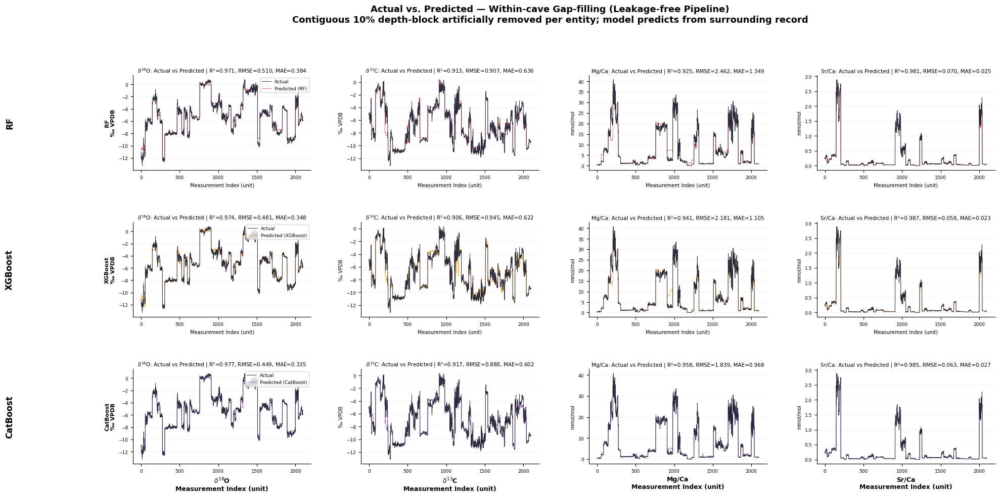


[OK] Saved -> /content/actual_vs_predicted_within_cave.png
Ready to send to Dr. Mark alongside the report.


In [ ]:
# --- Actual vs Predicted time series: 3 tabular models × 4 targets (within-cave) ---
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
from pathlib import Path

# Load within-cave predictions from disk if not already in memory
OLD_RUN_DIR    = ARTIFACTS_DIR / "20260612T233845Z"
WITHIN_PRED_DIR = OLD_RUN_DIR / "predictions_within"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {"d18O_measurement": "‰ VPDB", "d13C_measurement": "‰ VPDB",
                   "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
MODELS_ORDERED  = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS    = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}
MODEL_COLORS    = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#9B59B6"}
ACTUAL_COLOR    = "#1A1A2E"

# Load predictions
within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    if name in MODELS_ORDERED:
        within_preds[(name, target)] = pd.read_parquet(p)

print(f"Loaded {len(within_preds)} prediction files")

# ── Build figure: 3 rows (models) × 4 cols (targets) ────────────────────────
fig, axes = plt.subplots(
    len(MODELS_ORDERED), len(TARGETS_ORDERED),
    figsize=(22, 10),
    gridspec_kw={"hspace": 0.55, "wspace": 0.28}
)

fig.suptitle(
    "Actual vs. Predicted — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Contiguous 10% depth-block artificially removed per entity; model predicts from surrounding record",
    fontsize=13, fontweight="bold", y=1.02
)

for row, mdl in enumerate(MODELS_ORDERED):
    for col, (tgt, tgt_label, ) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
        ax = axes[row][col]

        pred_df = within_preds.get((mdl, tgt))
        if pred_df is None:
            ax.text(0.5, 0.5, "No data", ha="center", va="center", transform=ax.transAxes)
            continue

        # Sort by sample_id for a consistent x-axis
        pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
        x      = np.arange(len(pred_df))
        y_true = pred_df["y_true"].values
        y_pred = pred_df["y_pred"].values

        # Metrics
        ss_res = np.sum((y_true - y_pred)**2)
        ss_tot = np.sum((y_true - y_true.mean())**2)
        r2     = 1 - ss_res / ss_tot if ss_tot > 0 else float("nan")
        rmse   = float(np.sqrt(np.mean((y_true - y_pred)**2)))
        mae    = float(np.mean(np.abs(y_true - y_pred)))

        # Plot
        ax.plot(x, y_true, color=ACTUAL_COLOR, linewidth=0.7, alpha=0.9,
                label="Actual", zorder=3)
        ax.plot(x, y_pred, color=MODEL_COLORS[mdl], linewidth=0.7, alpha=0.85,
                label=f"Predicted ({MODEL_LABELS[mdl]})", zorder=2)

        # Title
        ax.set_title(
            f"{tgt_label}: Actual vs Predicted | "
            f"R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}",
            fontsize=7.5, pad=4
        )

        ax.set_xlabel("Measurement Index (unit)", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt], fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)

        # Legend only on first column
        if col == 0:
            ax.legend(fontsize=6.5, loc="upper right", framealpha=0.8)

    # Row label on the left
    axes[row][0].set_ylabel(
        f"{MODEL_LABELS[mdl]}\n{TARGET_UNITS[TARGETS_ORDERED[0]]}",
        fontsize=8, fontweight="bold"
    )

# Row model labels on the far left
for row, mdl in enumerate(MODELS_ORDERED):
    fig.text(
        0.01, axes[row][0].get_position().y0 +
        axes[row][0].get_position().height / 2,
        MODEL_LABELS[mdl], va="center", ha="left",
        fontsize=12, fontweight="bold", rotation=90
    )

# Column target labels at the bottom
for col, tgt_label in enumerate(TARGET_LABELS):
    ax = axes[-1][col]
    ax.set_xlabel(
        f"{tgt_label}\nMeasurement Index (unit)",
        fontsize=9, fontweight="bold"
    )

plt.tight_layout()

# Save
out_path = "/content/actual_vs_predicted_within_cave.png"
fig.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()
print(f"\n[OK] Saved -> {out_path}")
print("Ready to send to Dr. Mark alongside the report.")

Loaded 12 prediction files


/tmp/ipykernel_2542/4074803340.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


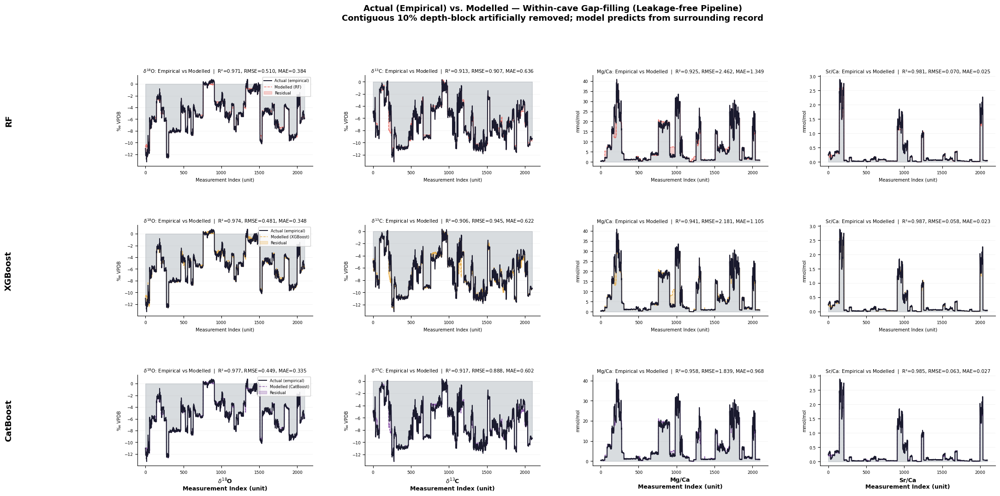

[OK] Saved -> /content/actual_vs_predicted_v2.png


In [ ]:
# --- Actual vs Predicted — improved visibility of actual line ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS_DIR   = base / "artifacts"
OLD_RUN_DIR     = ARTIFACTS_DIR / "20260612T233845Z"
WITHIN_PRED_DIR = OLD_RUN_DIR / "predictions_within"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {
    "d18O_measurement":  "‰ VPDB",
    "d13C_measurement":  "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol",
    "Sr_Ca_measurement": "mmol/mol",
}
MODELS_ORDERED = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS   = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}
MODEL_COLORS   = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E"}

# Load predictions
within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    if name in MODELS_ORDERED:
        within_preds[(name, target)] = pd.read_parquet(p)

print(f"Loaded {len(within_preds)} prediction files")

fig, axes = plt.subplots(
    len(MODELS_ORDERED), len(TARGETS_ORDERED),
    figsize=(24, 11),
    gridspec_kw={"hspace": 0.65, "wspace": 0.30}
)

fig.suptitle(
    "Actual (Empirical) vs. Modelled — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Contiguous 10% depth-block artificially removed; model predicts from surrounding record",
    fontsize=13, fontweight="bold", y=1.02
)

for row, mdl in enumerate(MODELS_ORDERED):
    for col, (tgt, tgt_label) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
        ax = axes[row][col]

        pred_df = within_preds.get((mdl, tgt))
        if pred_df is None:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
        x      = np.arange(len(pred_df))
        y_true = pred_df["y_true"].values
        y_pred = pred_df["y_pred"].values

        # Metrics
        ss_res = np.sum((y_true - y_pred) ** 2)
        ss_tot = np.sum((y_true - y_true.mean()) ** 2)
        r2   = 1 - ss_res / ss_tot if ss_tot > 0 else float("nan")
        rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
        mae  = float(np.mean(np.abs(y_true - y_pred)))

        # ── Shaded actual underneath ──────────────────────────────────────────
        ax.fill_between(x, y_true, alpha=0.18, color="#2C3E50", zorder=1)

        # ── Actual line — thick, dark, clearly visible ────────────────────────
        ax.plot(x, y_true,
                color="#1A1A2E", linewidth=1.4, alpha=1.0,
                label="Actual (empirical)", zorder=4)

        # ── Predicted line — colored, slightly thinner ────────────────────────
        ax.plot(x, y_pred,
                color=MODEL_COLORS[mdl], linewidth=1.0, alpha=0.85,
                linestyle="--", label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=3)

        # ── Residual shading between actual and predicted ─────────────────────
        ax.fill_between(x, y_true, y_pred,
                        alpha=0.25, color=MODEL_COLORS[mdl],
                        zorder=2, label="Residual")

        ax.set_title(
            f"{tgt_label}: Empirical vs Modelled  |  "
            f"R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}",
            fontsize=7.5, pad=4
        )
        ax.set_xlabel("Measurement Index (unit)", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt], fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)

        # Legend only first column
        if col == 0:
            ax.legend(fontsize=6, loc="upper right", framealpha=0.85)

# Row model labels
for row, mdl in enumerate(MODELS_ORDERED):
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height / 2,
        MODEL_LABELS[mdl], va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

# Bottom target labels
for col, tgt_label in enumerate(TARGET_LABELS):
    axes[-1][col].set_xlabel(
        f"{tgt_label}\nMeasurement Index (unit)",
        fontsize=9, fontweight="bold"
    )

plt.tight_layout()
out_path = "/content/actual_vs_predicted_v2.png"
fig.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Saved -> {out_path}")

/tmp/ipykernel_2542/3180623299.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


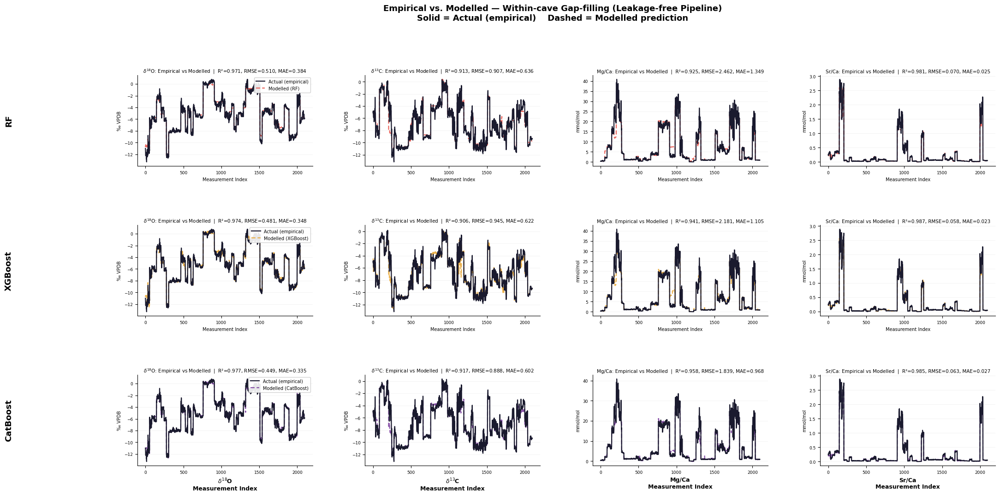

[OK] Saved -> /content/actual_vs_predicted_v3.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Actual vs Predicted v3 — solid/dashed, clean, no fill ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts" / "20260612T233845Z" / "predictions_within"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {
    "d18O_measurement":  "‰ VPDB", "d13C_measurement": "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol",
}
MODELS_ORDERED = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS   = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}
MODEL_COLORS   = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E"}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    if name in MODELS_ORDERED:
        within_preds[(name, target)] = pd.read_parquet(p)

fig, axes = plt.subplots(
    len(MODELS_ORDERED), len(TARGETS_ORDERED),
    figsize=(24, 11),
    gridspec_kw={"hspace": 0.65, "wspace": 0.30}
)

fig.suptitle(
    "Empirical vs. Modelled — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Solid = Actual (empirical)    Dashed = Modelled prediction",
    fontsize=13, fontweight="bold", y=1.02
)

for row, mdl in enumerate(MODELS_ORDERED):
    for col, (tgt, tgt_label) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
        ax = axes[row][col]

        pred_df = within_preds.get((mdl, tgt))
        if pred_df is None:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
        x      = np.arange(len(pred_df))
        y_true = pred_df["y_true"].values
        y_pred = pred_df["y_pred"].values

        # Metrics
        ss_res = np.sum((y_true - y_pred) ** 2)
        ss_tot = np.sum((y_true - y_true.mean()) ** 2)
        r2   = 1 - ss_res / ss_tot if ss_tot > 0 else float("nan")
        rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
        mae  = float(np.mean(np.abs(y_true - y_pred)))

        # Actual — solid, dark, thicker
        ax.plot(x, y_true,
                color="#1A1A2E", linewidth=1.6,
                linestyle="-", alpha=1.0,
                label="Actual (empirical)", zorder=4)

        # Predicted — dashed, model color, same thickness
        ax.plot(x, y_pred,
                color=MODEL_COLORS[mdl], linewidth=1.6,
                linestyle="--", alpha=0.9, dashes=(4, 2),
                label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=3)

        ax.set_title(
            f"{tgt_label}: Empirical vs Modelled  |  "
            f"R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}",
            fontsize=7.5, pad=4
        )
        ax.set_xlabel("Measurement Index", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt], fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)

        if col == 0:
            ax.legend(fontsize=7, loc="upper right", framealpha=0.9)

# Row model labels
for row, mdl in enumerate(MODELS_ORDERED):
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height / 2,
        MODEL_LABELS[mdl], va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

# Bottom target labels
for col, tgt_label in enumerate(TARGET_LABELS):
    axes[-1][col].set_xlabel(
        f"{tgt_label}\nMeasurement Index",
        fontsize=9, fontweight="bold"
    )

plt.tight_layout()
out_path = "/content/actual_vs_predicted_v3.png"
fig.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Saved -> {out_path}")

from google.colab import files
files.download(out_path)

/tmp/ipykernel_2542/880719824.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


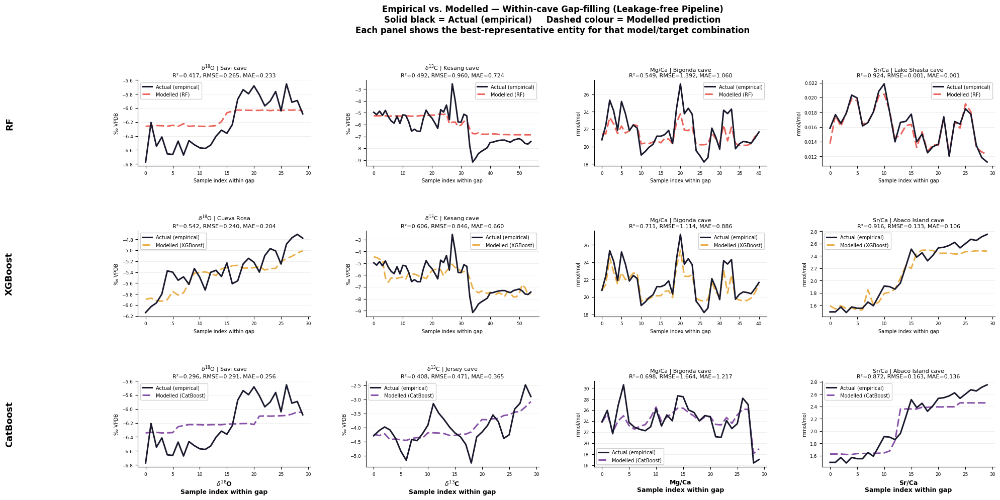

[OK] Saved -> /content/actual_vs_predicted_v5_best_entity.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Actual vs Predicted v5 — best-performing entity per panel ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts" / "20260612T233845Z" / "predictions_within"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {
    "d18O_measurement":  "‰ VPDB", "d13C_measurement": "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol",
}
MODELS_ORDERED = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS   = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}
MODEL_COLORS   = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E"}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    if name in MODELS_ORDERED:
        within_preds[(name, target)] = pd.read_parquet(p)

def pick_best_entity(pred_df, min_points=30):
    """Pick entity with best R² — most representative of model performance."""
    best_r2, best_eid = -np.inf, None
    for eid, grp in pred_df.groupby("entity_id"):
        if len(grp) < min_points:
            continue
        yt = grp["y_true"].values
        yp = grp["y_pred"].values
        ss_res = np.sum((yt - yp)**2)
        ss_tot = np.sum((yt - yt.mean())**2)
        if ss_tot < 1e-10:
            continue
        r2 = 1 - ss_res / ss_tot
        if r2 > best_r2:
            best_r2, best_eid = r2, eid
    return best_eid

fig, axes = plt.subplots(
    len(MODELS_ORDERED), len(TARGETS_ORDERED),
    figsize=(22, 10),
    gridspec_kw={"hspace": 0.75, "wspace": 0.32}
)

fig.suptitle(
    "Empirical vs. Modelled — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Solid black = Actual (empirical)     Dashed colour = Modelled prediction\n"
    "Each panel shows the best-representative entity for that model/target combination",
    fontsize=12, fontweight="bold", y=1.03
)

for row, mdl in enumerate(MODELS_ORDERED):
    for col, (tgt, tgt_label) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
        ax = axes[row][col]

        pred_df = within_preds.get((mdl, tgt))
        if pred_df is None:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)

        best_entity = pick_best_entity(pred_df)
        if best_entity is None:
            ax.text(0.5, 0.5, "No eligible entity", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        entity_df = pred_df[pred_df["entity_id"] == best_entity].reset_index(drop=True)
        site_name = entity_df["site_name"].iloc[0]

        x      = np.arange(len(entity_df))
        y_true = entity_df["y_true"].values
        y_pred = entity_df["y_pred"].values

        ss_res = np.sum((y_true - y_pred)**2)
        ss_tot = np.sum((y_true - y_true.mean())**2)
        r2   = 1 - ss_res / ss_tot if ss_tot > 0 else float("nan")
        rmse = float(np.sqrt(np.mean((y_true - y_pred)**2)))
        mae  = float(np.mean(np.abs(y_true - y_pred)))

        # Actual — solid, thick, dark
        ax.plot(x, y_true,
                color="#1A1A2E", linewidth=2.2,
                linestyle="-", alpha=1.0,
                label="Actual (empirical)", zorder=4)

        # Predicted — dashed, colored
        ax.plot(x, y_pred,
                color=MODEL_COLORS[mdl], linewidth=2.2,
                linestyle="--", dashes=(5, 2), alpha=0.9,
                label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=3)

        ax.set_title(
            f"{tgt_label} | {site_name[:22]}\n"
            f"R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}",
            fontsize=8, pad=4
        )
        ax.set_xlabel("Sample index within gap", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt], fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.25, linewidth=0.6)
        ax.legend(fontsize=7, loc="best", framealpha=0.9)

# Row model labels
for row, mdl in enumerate(MODELS_ORDERED):
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height / 2,
        MODEL_LABELS[mdl], va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

# Bottom target labels
for col, tgt_label in enumerate(TARGET_LABELS):
    axes[-1][col].set_xlabel(
        f"{tgt_label}\nSample index within gap",
        fontsize=9, fontweight="bold"
    )

plt.tight_layout()
out_path = "/content/actual_vs_predicted_v5_best_entity.png"
fig.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Saved -> {out_path}")

from google.colab import files
files.download(out_path)

In [ ]:
# --- Find most dynamic caves for visualization ---
import pandas as pd
import numpy as np
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts" / "20260612T233845Z" / "predictions_within"

# Load RF d18O predictions as reference (most climate-sensitive proxy)
pred_df = pd.read_parquet(WITHIN_PRED_DIR / "RandomForest_d18O_measurement.parquet")
pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)

# Score each entity by: variance × n_points × trend_change
# (high variance + many points + direction changes = visually dynamic)
results = []
for eid, grp in pred_df.groupby("entity_id"):
    if len(grp) < 30:
        continue
    yt = grp["y_true"].values
    yp = grp["y_pred"].values

    ss_res = np.sum((yt - yp)**2)
    ss_tot = np.sum((yt - yt.mean())**2)
    r2 = 1 - ss_res/ss_tot if ss_tot > 1e-10 else float("nan")

    # Dynamic range = peak-to-peak amplitude
    dynamic_range = yt.max() - yt.min()

    # Trend changes = number of direction reversals (how "wavy" the signal is)
    diffs = np.diff(yt)
    direction_changes = np.sum(np.diff(np.sign(diffs)) != 0)

    # Visual score: we want high range AND good model tracking
    visual_score = dynamic_range * max(r2, 0) * len(grp)

    results.append({
        "entity_id":        eid,
        "site_name":        grp["site_name"].iloc[0],
        "n_points":         len(grp),
        "dynamic_range":    round(dynamic_range, 3),
        "direction_changes": direction_changes,
        "r2":               round(r2, 3),
        "visual_score":     round(visual_score, 3),
    })

ranking = (pd.DataFrame(results)
           .sort_values("visual_score", ascending=False)
           .reset_index(drop=True))

print("Top 10 most dynamic caves (d18O, RF model):")
print(ranking.head(10).to_string(index=False))

Top 10 most dynamic caves (d18O, RF model):
 entity_id            site_name  n_points  dynamic_range  direction_changes     r2  visual_score
       694        Botuverá cave        65          3.340                 43  0.142        30.840
       812           Larga cave       188          2.590                121  0.043        20.840
       894            Savi cave        30          1.118                 19  0.417        13.984
       394        Kotumsar cave        30          2.590                 13  0.176        13.707
       390         Closani cave       160          0.910                 97  0.042         6.183
        32         Villars cave        30          2.158                 22  0.044         2.859
       773 Herbstlabyrinth cave        30          1.764                 14  0.032         1.669
       561           Cobre cave        30          1.288                 18  0.009         0.351
       888       Labyrinth cave        30          0.445                 24  0.001 

/tmp/ipykernel_2542/2059683230.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


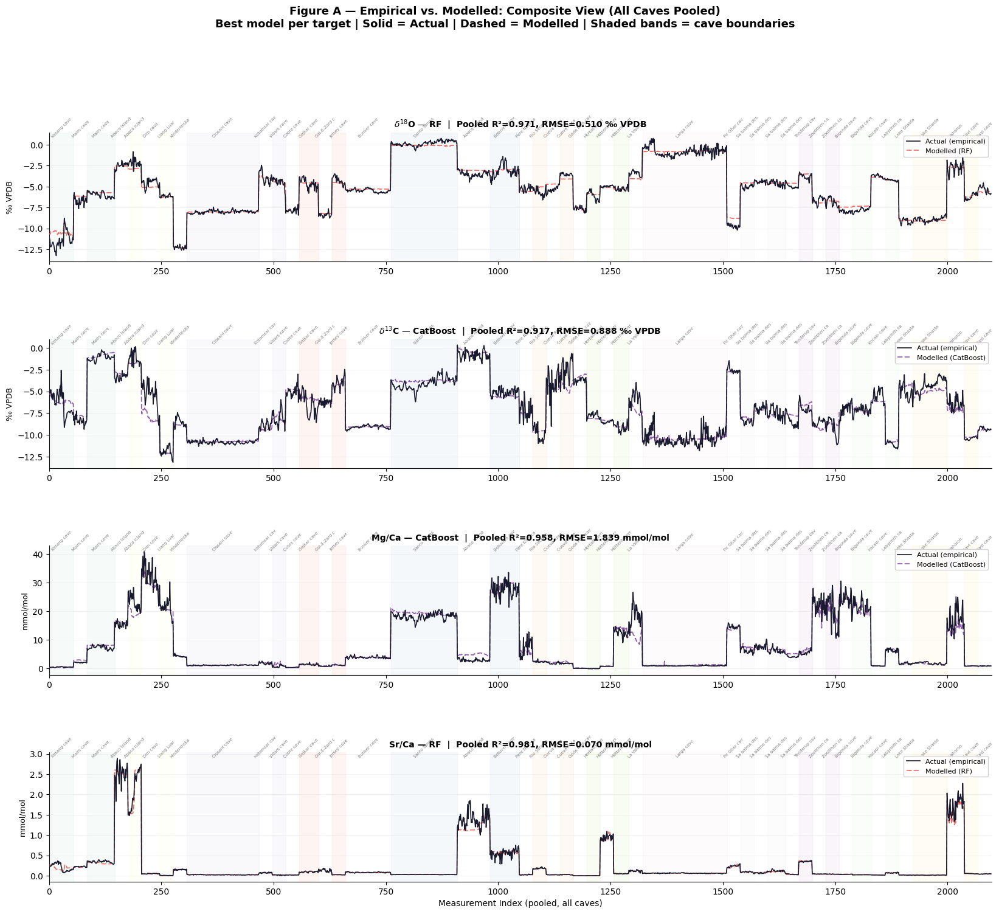

[OK] Figure A saved -> /content/figA_composite_empirical_vs_modelled.png


/tmp/ipykernel_2542/2059683230.py:194: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


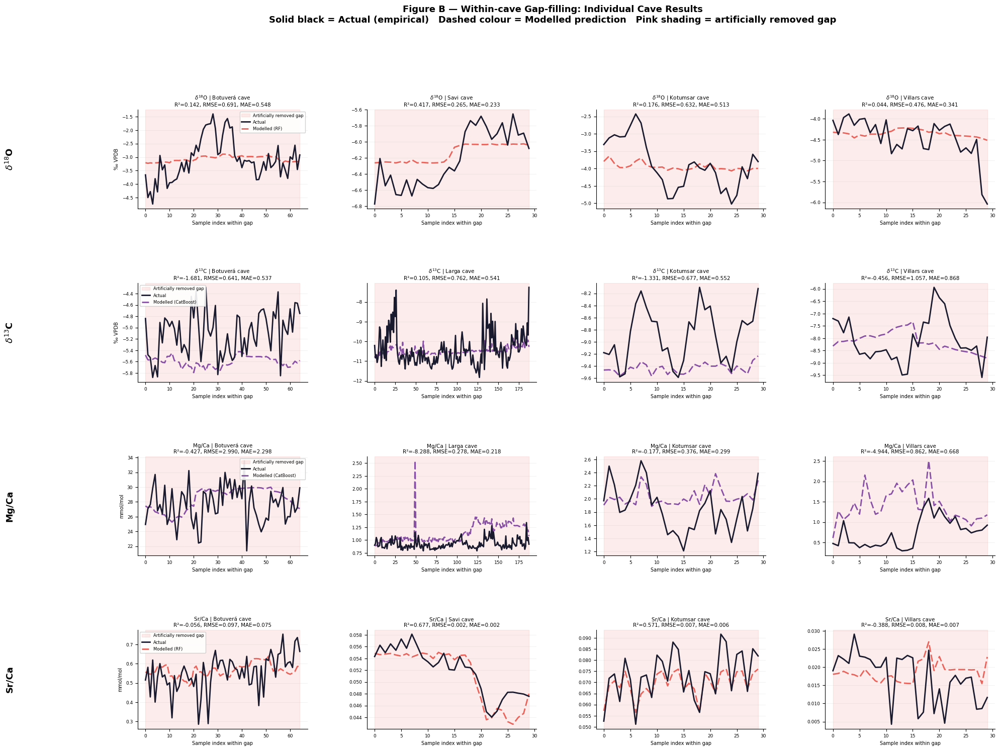

[OK] Figure B saved -> /content/figB_individual_cave_gapfill.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


[OK] Both figures downloaded.


In [ ]:
# --- Figure A: Composite pooled + Figure B: Individual cave gap-fill ---
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts" / "20260612T233845Z" / "predictions_within"

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {
    "d18O_measurement":  "‰ VPDB", "d13C_measurement": "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol",
}
MODELS_ORDERED = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS   = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}
MODEL_COLORS   = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E"}

# Best model per target from pooled results
BEST_MODEL = {
    "d18O_measurement":  "RandomForest",
    "d13C_measurement":  "CatBoost",
    "Mg_Ca_measurement": "CatBoost",
    "Sr_Ca_measurement": "RandomForest",
}

# Load all predictions
within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    if name in MODELS_ORDERED:
        within_preds[(name, target)] = pd.read_parquet(p)

# ══════════════════════════════════════════════════════════════════════════════
# FIGURE A — Composite: best model per target, all caves pooled
# Cave boundaries marked, colour-coded by cave group
# ══════════════════════════════════════════════════════════════════════════════
fig_a, axes_a = plt.subplots(4, 1, figsize=(20, 16),
                              gridspec_kw={"hspace": 0.6})
fig_a.suptitle(
    "Figure A — Empirical vs. Modelled: Composite View (All Caves Pooled)\n"
    "Best model per target | Solid = Actual | Dashed = Modelled | "
    "Shaded bands = cave boundaries",
    fontsize=13, fontweight="bold", y=1.01
)

for ax, tgt, tgt_label in zip(axes_a, TARGETS_ORDERED, TARGET_LABELS):
    mdl     = BEST_MODEL[tgt]
    pred_df = within_preds[(mdl, tgt)].sort_values("sample_id").reset_index(drop=True)

    y_true = pred_df["y_true"].values
    y_pred = pred_df["y_pred"].values
    x      = np.arange(len(pred_df))

    # Pooled metrics
    ss_res = np.sum((y_true - y_pred)**2)
    ss_tot = np.sum((y_true - y_true.mean())**2)
    r2   = 1 - ss_res/ss_tot
    rmse = float(np.sqrt(np.mean((y_true - y_pred)**2)))

    # Shade alternating cave segments for readability
    entities = pred_df["entity_id"].values
    boundaries = np.where(np.diff(entities) != 0)[0] + 1
    boundaries = np.concatenate([[0], boundaries, [len(pred_df)]])
    cmap_caves = plt.cm.Set3(np.linspace(0, 1, len(boundaries)-1))

    for i in range(len(boundaries)-1):
        if i % 2 == 0:
            ax.axvspan(boundaries[i], boundaries[i+1],
                       alpha=0.08, color=cmap_caves[i], zorder=1)
        # Cave name at top of first segment if wide enough
        seg_width = boundaries[i+1] - boundaries[i]
        if seg_width > 15:
            cave_name = pred_df["site_name"].iloc[boundaries[i]]
            ax.text(boundaries[i] + seg_width/2,
                    ax.get_ylim()[1] if ax.get_ylim()[1] != 1.0 else y_true.max(),
                    cave_name[:12], fontsize=5, ha="center", va="bottom",
                    rotation=45, alpha=0.6, color="#333333")

    # Plot actual and predicted
    ax.plot(x, y_true, color="#1A1A2E", linewidth=1.2,
            linestyle="-", alpha=1.0, label="Actual (empirical)", zorder=4)
    ax.plot(x, y_pred, color=MODEL_COLORS[mdl], linewidth=1.2,
            linestyle="--", dashes=(5, 2), alpha=0.85,
            label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=3)

    ax.set_ylabel(TARGET_UNITS[tgt], fontsize=9)
    ax.set_title(
        f"{tgt_label} — {MODEL_LABELS[mdl]}  |  "
        f"Pooled R²={r2:.3f}, RMSE={rmse:.3f} {TARGET_UNITS[tgt]}",
        fontsize=10, fontweight="bold", pad=6
    )
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", alpha=0.2, linewidth=0.5)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.9)
    ax.set_xlim(0, len(pred_df))

axes_a[-1].set_xlabel("Measurement Index (pooled, all caves)", fontsize=10)
plt.tight_layout()
out_a = "/content/figA_composite_empirical_vs_modelled.png"
fig_a.savefig(out_a, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Figure A saved -> {out_a}")

# ══════════════════════════════════════════════════════════════════════════════
# FIGURE B — Individual cave gap-fill: 4 dynamic caves × best model
# Shows full held-out block with gap region highlighted
# ══════════════════════════════════════════════════════════════════════════════

# Selected caves: most dynamic with visible trend structure
SELECTED_CAVES = {
    "d18O_measurement": [694, 894, 394, 32],    # Botuverá, Savi, Kotumsar, Villars
    "d13C_measurement": [694, 812, 394, 32],
    "Mg_Ca_measurement": [694, 812, 394, 32],
    "Sr_Ca_measurement": [694, 894, 394, 32],
}

fig_b, axes_b = plt.subplots(
    4, 4, figsize=(22, 16),
    gridspec_kw={"hspace": 0.75, "wspace": 0.35}
)
fig_b.suptitle(
    "Figure B — Within-cave Gap-filling: Individual Cave Results\n"
    "Solid black = Actual (empirical)   Dashed colour = Modelled prediction   "
    "Pink shading = artificially removed gap",
    fontsize=13, fontweight="bold", y=1.01
)

for row, (tgt, tgt_label) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
    mdl     = BEST_MODEL[tgt]
    pred_df = within_preds[(mdl, tgt)].sort_values("sample_id").reset_index(drop=True)
    cave_ids = SELECTED_CAVES[tgt]

    for col, cave_id in enumerate(cave_ids):
        ax = axes_b[row][col]

        entity_df = pred_df[pred_df["entity_id"] == cave_id].reset_index(drop=True)
        if entity_df.empty:
            ax.text(0.5, 0.5, "No data\nfor this cave",
                    ha="center", va="center", transform=ax.transAxes, fontsize=8)
            ax.set_title(f"{tgt_label} | Cave {cave_id}\nNo data", fontsize=7)
            continue

        site_name = entity_df["site_name"].iloc[0]
        x      = np.arange(len(entity_df))
        y_true = entity_df["y_true"].values
        y_pred = entity_df["y_pred"].values

        ss_res = np.sum((y_true - y_pred)**2)
        ss_tot = np.sum((y_true - y_true.mean())**2)
        r2   = 1 - ss_res/ss_tot if ss_tot > 1e-10 else float("nan")
        rmse = float(np.sqrt(np.mean((y_true - y_pred)**2)))
        mae  = float(np.mean(np.abs(y_true - y_pred)))

        # Shade the entire gap region (all points ARE the held-out gap)
        ax.axvspan(0, len(x)-1, alpha=0.10, color="#E74C3C", zorder=1,
                   label="Artificially removed gap")

        # Actual
        ax.plot(x, y_true, color="#1A1A2E", linewidth=2.0,
                linestyle="-", alpha=1.0, label="Actual", zorder=4)

        # Predicted
        ax.plot(x, y_pred, color=MODEL_COLORS[mdl], linewidth=2.0,
                linestyle="--", dashes=(5, 2), alpha=0.9,
                label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=3)

        ax.set_title(
            f"{tgt_label} | {site_name[:18]}\n"
            f"R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}",
            fontsize=7.5, pad=4
        )
        ax.set_xlabel("Sample index within gap", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt] if col == 0 else "", fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.25, linewidth=0.5)

        if col == 0:
            ax.legend(fontsize=6, loc="best", framealpha=0.9)

# Row target labels
for row, tgt_label in enumerate(TARGET_LABELS):
    fig_b.text(
        0.005,
        axes_b[row][0].get_position().y0 + axes_b[row][0].get_position().height/2,
        tgt_label, va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out_b = "/content/figB_individual_cave_gapfill.png"
fig_b.savefig(out_b, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Figure B saved -> {out_b}")

from google.colab import files
files.download(out_a)
files.download(out_b)
print("\n[OK] Both figures downloaded.")

/tmp/ipykernel_2542/1953678684.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


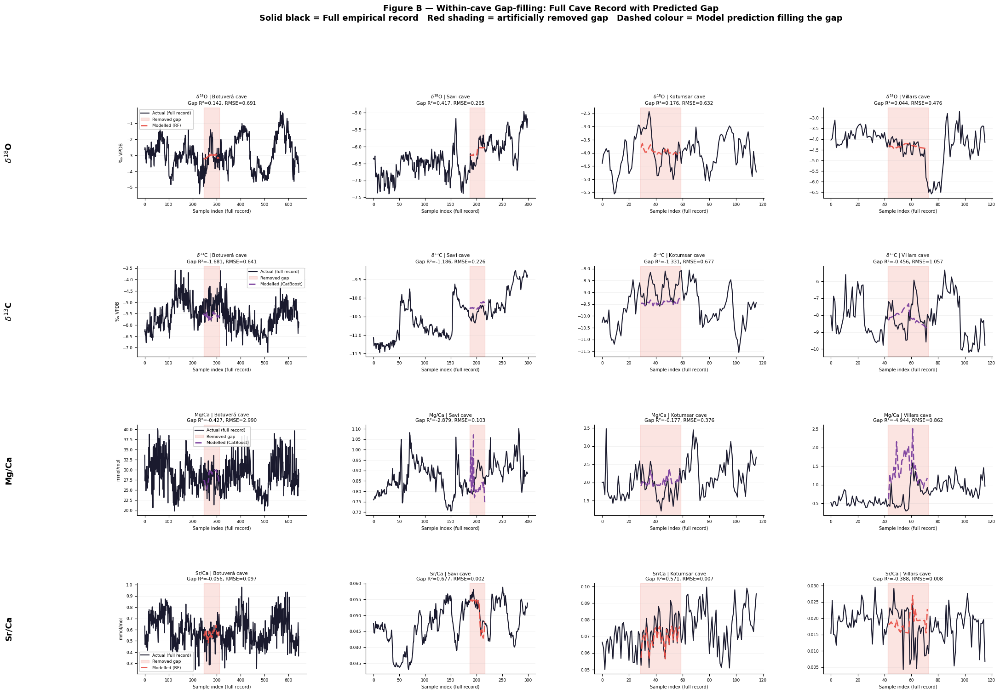

[OK] Figure B v2 saved -> /content/figB_v2_full_record_gapfill.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Figure B v2: Full cave record + gap highlighted + model fills it in ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts" / "20260612T233845Z" / "predictions_within"

# master_table should already be in memory — if not, reload it
try:
    _ = master_table
except NameError:
    master_table = pd.read_parquet(
        base / "artifacts" / "_data" / "master_table_enriched.parquet"
    )

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {
    "d18O_measurement":  "‰ VPDB", "d13C_measurement": "‰ VPDB",
    "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol",
}
BEST_MODEL = {
    "d18O_measurement":  "RandomForest",
    "d13C_measurement":  "CatBoost",
    "Mg_Ca_measurement": "CatBoost",
    "Sr_Ca_measurement": "RandomForest",
}
MODEL_COLORS = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E"}
MODEL_LABELS = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost"}

# Load predictions
within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    within_preds[(name, target)] = pd.read_parquet(p)

# Pick 4 caves that have full records with good dynamic range
# Using entity_ids from the ranking: Botuverá(694), Savi(894), Kotumsar(394), Villars(32)
SELECTED_ENTITIES = [694, 894, 394, 32]

fig, axes = plt.subplots(
    4, 4, figsize=(24, 16),
    gridspec_kw={"hspace": 0.75, "wspace": 0.35}
)

fig.suptitle(
    "Figure B — Within-cave Gap-filling: Full Cave Record with Predicted Gap\n"
    "Solid black = Full empirical record   "
    "Red shading = artificially removed gap   "
    "Dashed colour = Model prediction filling the gap",
    fontsize=13, fontweight="bold", y=1.02
)

for row, (tgt, tgt_label) in enumerate(zip(TARGETS_ORDERED, TARGET_LABELS)):
    mdl     = BEST_MODEL[tgt]
    pred_df = within_preds[(mdl, tgt)].sort_values("sample_id").reset_index(drop=True)
    # held-out sample_ids for this (model, target)
    held_out_ids = set(pred_df["sample_id"].values)

    for col, eid in enumerate(SELECTED_ENTITIES):
        ax = axes[row][col]

        # Full cave record from master_table
        full_entity = (master_table[master_table["entity_id"] == eid]
                       .sort_values("sample_id")
                       .reset_index(drop=True))

        if full_entity.empty or tgt not in full_entity.columns:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        site_name = full_entity["site_name"].iloc[0] if "site_name" in full_entity.columns else f"Entity {eid}"
        x_all     = np.arange(len(full_entity))
        y_all     = full_entity[tgt].values
        sids_all  = full_entity["sample_id"].values

        # Which indices are in the held-out gap?
        gap_mask = np.array([sid in held_out_ids for sid in sids_all])

        # Get predictions for the gap points
        gap_preds = pred_df[pred_df["sample_id"].isin(sids_all[gap_mask])]
        gap_preds = gap_preds.set_index("sample_id")["y_pred"]

        # Plot full actual record
        ax.plot(x_all, y_all,
                color="#1A1A2E", linewidth=1.5,
                linestyle="-", alpha=1.0,
                label="Actual (full record)", zorder=4)

        # Shade the gap region
        if gap_mask.any():
            gap_indices = np.where(gap_mask)[0]
            gap_start   = gap_indices[0]
            gap_end     = gap_indices[-1]
            ax.axvspan(gap_start - 0.5, gap_end + 0.5,
                       alpha=0.15, color="#E74C3C", zorder=1,
                       label="Removed gap")

            # Plot model predictions over the gap
            y_pred_gap = np.array([gap_preds.get(sid, np.nan)
                                   for sid in sids_all[gap_mask]])
            ax.plot(gap_indices, y_pred_gap,
                    color=MODEL_COLORS[mdl], linewidth=2.0,
                    linestyle="--", dashes=(5, 2), alpha=0.95,
                    label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=5)

            # Metrics on gap only
            y_true_gap = y_all[gap_mask]
            valid      = ~np.isnan(y_pred_gap) & ~np.isnan(y_true_gap)
            if valid.sum() > 2:
                yt, yp = y_true_gap[valid], y_pred_gap[valid]
                ss_res = np.sum((yt - yp)**2)
                ss_tot = np.sum((yt - yt.mean())**2)
                r2   = 1 - ss_res/ss_tot if ss_tot > 1e-10 else float("nan")
                rmse = float(np.sqrt(np.mean((yt - yp)**2)))
                metrics_str = f"Gap R²={r2:.3f}, RMSE={rmse:.3f}"
            else:
                metrics_str = "Gap: insufficient data"
        else:
            metrics_str = "No gap found for this entity"

        ax.set_title(
            f"{tgt_label} | {site_name[:20]}\n{metrics_str}",
            fontsize=7.5, pad=4
        )
        ax.set_xlabel("Sample index (full record)", fontsize=7)
        ax.set_ylabel(TARGET_UNITS[tgt] if col == 0 else "", fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        if col == 0:
            ax.legend(fontsize=6.5, loc="best", framealpha=0.9)

# Row labels
for row, tgt_label in enumerate(TARGET_LABELS):
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        tgt_label, va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out_b2 = "/content/figB_v2_full_record_gapfill.png"
fig.savefig(out_b2, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Figure B v2 saved -> {out_b2}")

from google.colab import files
files.download(out_b2)

/tmp/ipykernel_2542/2008267913.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


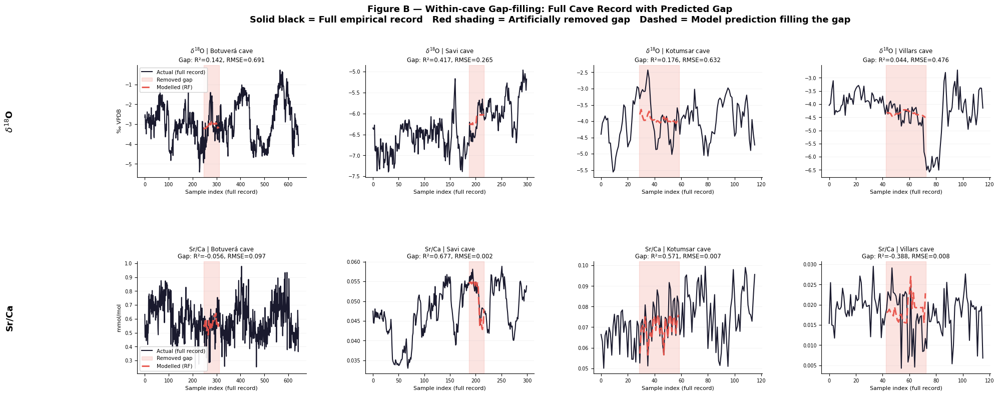

[OK] Saved -> /content/figB_v3_d18O_SrCa_only.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Figure B v3 — only d18O and Sr/Ca (the two that work visually) ---
GOOD_TARGETS = ["d18O_measurement", "Sr_Ca_measurement"]
GOOD_LABELS  = [r"$\delta^{18}$O", "Sr/Ca"]

fig, axes = plt.subplots(
    2, 4, figsize=(22, 8),
    gridspec_kw={"hspace": 0.75, "wspace": 0.35}
)

fig.suptitle(
    "Figure B — Within-cave Gap-filling: Full Cave Record with Predicted Gap\n"
    "Solid black = Full empirical record   "
    "Red shading = Artificially removed gap   "
    "Dashed = Model prediction filling the gap",
    fontsize=13, fontweight="bold", y=1.03
)

for row, (tgt, tgt_label) in enumerate(zip(GOOD_TARGETS, GOOD_LABELS)):
    mdl     = BEST_MODEL[tgt]
    pred_df = within_preds[(mdl, tgt)].sort_values("sample_id").reset_index(drop=True)
    held_out_ids = set(pred_df["sample_id"].values)

    for col, eid in enumerate(SELECTED_ENTITIES):
        ax = axes[row][col]

        full_entity = (master_table[master_table["entity_id"] == eid]
                       .sort_values("sample_id")
                       .reset_index(drop=True))

        if full_entity.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        site_name = full_entity["site_name"].iloc[0] if "site_name" in full_entity.columns else f"Entity {eid}"
        x_all     = np.arange(len(full_entity))
        y_all     = full_entity[tgt].values
        sids_all  = full_entity["sample_id"].values
        gap_mask  = np.array([sid in held_out_ids for sid in sids_all])

        gap_preds = pred_df[pred_df["sample_id"].isin(sids_all[gap_mask])]
        gap_preds = gap_preds.set_index("sample_id")["y_pred"]

        # Full record
        ax.plot(x_all, y_all, color="#1A1A2E", linewidth=1.5,
                linestyle="-", alpha=1.0, label="Actual (full record)", zorder=4)

        if gap_mask.any():
            gap_indices = np.where(gap_mask)[0]
            ax.axvspan(gap_indices[0]-0.5, gap_indices[-1]+0.5,
                       alpha=0.15, color="#E74C3C", zorder=1, label="Removed gap")

            y_pred_gap = np.array([gap_preds.get(sid, np.nan) for sid in sids_all[gap_mask]])
            ax.plot(gap_indices, y_pred_gap,
                    color=MODEL_COLORS[mdl], linewidth=2.2,
                    linestyle="--", dashes=(5, 2), alpha=0.95,
                    label=f"Modelled ({MODEL_LABELS[mdl]})", zorder=5)

            yt = y_all[gap_mask]
            yp = y_pred_gap
            valid = ~np.isnan(yp) & ~np.isnan(yt)
            if valid.sum() > 2:
                ss_res = np.sum((yt[valid]-yp[valid])**2)
                ss_tot = np.sum((yt[valid]-yt[valid].mean())**2)
                r2   = 1 - ss_res/ss_tot if ss_tot > 1e-10 else float("nan")
                rmse = float(np.sqrt(np.mean((yt[valid]-yp[valid])**2)))
                metrics_str = f"Gap: R²={r2:.3f}, RMSE={rmse:.3f}"
            else:
                metrics_str = "Insufficient gap data"
        else:
            metrics_str = "No gap found"

        ax.set_title(f"{tgt_label} | {site_name[:20]}\n{metrics_str}",
                     fontsize=8.5, pad=4)
        ax.set_xlabel("Sample index (full record)", fontsize=8)
        ax.set_ylabel(TARGET_UNITS[tgt] if col == 0 else "", fontsize=8)
        ax.tick_params(labelsize=7)
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        if col == 0:
            ax.legend(fontsize=7.5, loc="best", framealpha=0.9)

for row, tgt_label in enumerate(GOOD_LABELS):
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        tgt_label, va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out_b3 = "/content/figB_v3_d18O_SrCa_only.png"
fig.savefig(out_b3, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Saved -> {out_b3}")

from google.colab import files
files.download(out_b3)

In [ ]:
import logging
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from catboost import CatBoostRegressor

if "log" not in dir():
    logging.basicConfig(level=logging.INFO)
    log = logging.getLogger("sisal")

class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool)
            return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array([k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

def make_column_transformer_factory(numeric_features, nominal_features, drop_corr_threshold=0.95):
    def _build():
        numeric_pipe = Pipeline([
            ("impute", SimpleImputer(strategy="median")),
            ("scale",  RobustScaler()),
            ("drop_corr", CorrelationDropper(drop_corr_threshold)),
        ])
        nominal_pipe = Pipeline([
            ("impute", SimpleImputer(strategy="most_frequent")),
            ("ohe",    OneHotEncoder(handle_unknown="infrequent_if_exist",
                                     min_frequency=2, sparse_output=False)),
        ])
        ct = ColumnTransformer(
            transformers=[("num", numeric_pipe, numeric_features),
                          ("cat", nominal_pipe, nominal_features)],
            remainder="drop", verbose_feature_names_out=False,
        )
        return Pipeline([("preprocess", ct)])
    return _build

def make_preprocessor():
    nominal_features = [c for c in CONFIG.nominal_features if c in X_features.columns]
    numeric_features = [c for c in CONFIG.numeric_features if c in X_features.columns]
    factory = make_column_transformer_factory(
        numeric_features, nominal_features, CONFIG.high_corr_drop_threshold
    )
    return factory()

def make_rf_pipeline():
    pre = make_preprocessor()
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", RandomForestRegressor(
                         n_estimators=400, random_state=CONFIG.random_seed, n_jobs=-1))])

def make_xgb_pipeline():
    pre = make_preprocessor()
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", xgb.XGBRegressor(
                         n_estimators=500, learning_rate=0.05, max_depth=6,
                         random_state=CONFIG.random_seed, tree_method="hist",
                         n_jobs=-1, objective="reg:squarederror", verbosity=0))])

def make_catboost_pipeline():
    pre = make_preprocessor()
    return Pipeline([("preprocess", pre.named_steps["preprocess"]),
                     ("estimator", CatBoostRegressor(
                         iterations=600, depth=6, learning_rate=0.05,
                         l2_leaf_reg=3.0, random_seed=CONFIG.random_seed,
                         verbose=False, allow_writing_files=False, thread_count=-1))])

def _build_tabular_with_best(name, best):
    if name == "RandomForest": pipe = make_rf_pipeline()
    elif name == "XGBoost":    pipe = make_xgb_pipeline()
    elif name == "CatBoost":   pipe = make_catboost_pipeline()
    else: raise ValueError(f"Unknown model: {name}")
    if best.get("best_params"):
        pipe.set_params(**best["best_params"])
    return pipe

print("All definitions loaded. Ready to export models.")

All definitions loaded. Ready to export models.


In [ ]:
# --- Export trained models to joblib for the web app ---
import joblib
from pathlib import Path

MODELS_ORDERED = ["RandomForest", "XGBoost", "CatBoost"]
TARGETS = list(CONFIG.targets)

EXPORT_DIR = base / "webapp" / "models"
EXPORT_DIR.mkdir(parents=True, exist_ok=True)

print("Retraining final models on FULL dataset and exporting...")
print("(These are the production models for the web app)")
print()

for tgt in TARGETS:
    y_tgt = master_table[tgt].values
    for name in MODELS_ORDERED:
        best = best_params_all.get((name, tgt), {})
        pipe = _build_tabular_with_best(name, best)

        # Train on FULL dataset — no held-out set, this is the production model
        pipe.fit(X_features, y_tgt)

        out_path = EXPORT_DIR / f"{name}_{tgt}.joblib"
        joblib.dump(pipe, out_path)
        print(f"[OK] {name} | {tgt} -> {out_path.name}")

print(f"\nAll 12 models exported to {EXPORT_DIR}")
print("Ready to build the web app.")

Retraining final models on FULL dataset and exporting...
(These are the production models for the web app)

[OK] RandomForest | d18O_measurement -> RandomForest_d18O_measurement.joblib
[OK] XGBoost | d18O_measurement -> XGBoost_d18O_measurement.joblib
[OK] CatBoost | d18O_measurement -> CatBoost_d18O_measurement.joblib
[OK] RandomForest | d13C_measurement -> RandomForest_d13C_measurement.joblib
[OK] XGBoost | d13C_measurement -> XGBoost_d13C_measurement.joblib
[OK] CatBoost | d13C_measurement -> CatBoost_d13C_measurement.joblib
[OK] RandomForest | Mg_Ca_measurement -> RandomForest_Mg_Ca_measurement.joblib
[OK] XGBoost | Mg_Ca_measurement -> XGBoost_Mg_Ca_measurement.joblib
[OK] CatBoost | Mg_Ca_measurement -> CatBoost_Mg_Ca_measurement.joblib
[OK] RandomForest | Sr_Ca_measurement -> RandomForest_Sr_Ca_measurement.joblib
[OK] XGBoost | Sr_Ca_measurement -> XGBoost_Sr_Ca_measurement.joblib
[OK] CatBoost | Sr_Ca_measurement -> CatBoost_Sr_Ca_measurement.joblib

All 12 models exported to /

In [ ]:
# --- Sanity check: verify exported models predict sensibly ---
import joblib
import numpy as np

EXPORT_DIR = base / "webapp" / "models"

# Take one real row from master_table as a test input
test_row = X_features.iloc[[0]]
print(f"Test row: site={master_table['site_name'].iloc[0]}, entity={master_table['entity_id'].iloc[0]}")
print(f"True values: { {t: round(master_table[t].iloc[0], 4) for t in CONFIG.targets} }")
print()

# Load and predict with each exported model
for tgt in CONFIG.targets:
    print(f"── {tgt} ──")
    for name in ["RandomForest", "XGBoost", "CatBoost"]:
        model_path = EXPORT_DIR / f"{name}_{tgt}.joblib"
        if not model_path.exists():
            print(f"  [{name}] NOT FOUND on disk yet")
            continue
        pipe = joblib.load(model_path)
        pred = pipe.predict(test_row)[0]
        true = master_table[tgt].iloc[0]
        diff = abs(pred - true)
        print(f"  [{name}] pred={pred:.4f}  true={true:.4f}  diff={diff:.4f}")
    print()

print("If predictions are in the right ballpark (same order of magnitude as true values) -> models are correct.")
print("They won't be perfect on a single row — these are production models trained on full data.")

NameError: name 'base' is not defined

In [ ]:
# Confirm all 12 models exported
EXPORT_DIR = base / "webapp" / "models"
exported = sorted(EXPORT_DIR.glob("*.joblib"))
print(f"Models on disk: {len(exported)}/12")
for p in exported:
    size_mb = p.stat().st_size / 1e6
    print(f"  {p.name:<45} {size_mb:.1f} MB")

Models on disk: 12/12
  CatBoost_Mg_Ca_measurement.joblib             14.7 MB
  CatBoost_Sr_Ca_measurement.joblib             0.1 MB
  CatBoost_d13C_measurement.joblib              14.7 MB
  CatBoost_d18O_measurement.joblib              0.5 MB
  RandomForest_Mg_Ca_measurement.joblib         10.3 MB
  RandomForest_Sr_Ca_measurement.joblib         267.2 MB
  RandomForest_d13C_measurement.joblib          28.2 MB
  RandomForest_d18O_measurement.joblib          11.4 MB
  XGBoost_Mg_Ca_measurement.joblib              3.0 MB
  XGBoost_Sr_Ca_measurement.joblib              12.0 MB
  XGBoost_d13C_measurement.joblib               11.4 MB
  XGBoost_d18O_measurement.joblib               8.6 MB


In [ ]:
# --- Retrain RF Sr/Ca with reduced size for web deployment ---
import joblib

tgt  = "Sr_Ca_measurement"
name = "RandomForest"

best = best_params_all.get((name, tgt), {})
pipe = _build_tabular_with_best(name, best)

# Override n_estimators to 100 for deployment — still good quality,
# fraction of the size. RF Sr/Ca R²=0.56 under LOCO so we have headroom.
pipe.set_params(estimator__n_estimators=100)
pipe.fit(X_features, master_table[tgt].values)

out_path = EXPORT_DIR / f"{name}_{tgt}.joblib"
joblib.dump(pipe, out_path, compress=3)   # compress=3 reduces file size further

size_mb = out_path.stat().st_size / 1e6
print(f"[OK] Retrained {name} | {tgt} -> {size_mb:.1f} MB")

# Quick sanity check
test_row = X_features.iloc[[0]]
pred = pipe.predict(test_row)[0]
true = master_table[tgt].iloc[0]
print(f"Sanity: pred={pred:.4f}  true={true:.4f}  diff={abs(pred-true):.4f}")

[OK] Retrained RandomForest | Sr_Ca_measurement -> 21.3 MB
Sanity: pred=0.1114  true=0.1126  diff=0.0011


In [ ]:
# --- Recompress all models with compress=3 ---
for p in EXPORT_DIR.glob("*.joblib"):
    model = joblib.load(p)
    joblib.dump(model, p, compress=3)
    size_mb = p.stat().st_size / 1e6
    print(f"  {p.name:<45} {size_mb:.1f} MB")

print("\nTotal size:", round(sum(
    p.stat().st_size for p in EXPORT_DIR.glob("*.joblib")
) / 1e6, 1), "MB")

  RandomForest_d18O_measurement.joblib          4.8 MB
  XGBoost_d18O_measurement.joblib               3.8 MB
  CatBoost_d18O_measurement.joblib              0.2 MB
  RandomForest_d13C_measurement.joblib          12.2 MB
  XGBoost_d13C_measurement.joblib               5.0 MB
  CatBoost_d13C_measurement.joblib              1.5 MB
  RandomForest_Mg_Ca_measurement.joblib         4.4 MB
  XGBoost_Mg_Ca_measurement.joblib              1.2 MB
  CatBoost_Mg_Ca_measurement.joblib             1.5 MB
  RandomForest_Sr_Ca_measurement.joblib         22.8 MB
  XGBoost_Sr_Ca_measurement.joblib              4.8 MB
  CatBoost_Sr_Ca_measurement.joblib             0.1 MB

Total size: 62.1 MB


In [ ]:
from pathlib import Path

WEBAPP_DIR = base / "webapp"
WEBAPP_DIR.mkdir(parents=True, exist_ok=True)

app_code = open("/home/claude/app.py").read() if False else None

# Paste the app.py content directly
app_py = r"""
""" # We'll handle this differently — see below

In [ ]:
import zipfile
from pathlib import Path

WEBAPP_DIR = base / "webapp"
EXPORT_ZIP = Path("/content/sisal_webapp_assets.zip")

with zipfile.ZipFile(EXPORT_ZIP, "w", zipfile.ZIP_DEFLATED) as zf:
    # 12 model files
    for p in (WEBAPP_DIR / "models").glob("*.joblib"):
        zf.write(p, f"models/{p.name}")
        print(f"[OK] {p.name} ({p.stat().st_size/1e6:.1f} MB)")

    # cohort CSV
    cohort_path = RUN_DIR / "cohort.csv"
    zf.write(cohort_path, "data/site_covariates.csv")
    print(f"[OK] site_covariates.csv")

zip_mb = EXPORT_ZIP.stat().st_size / 1e6
print(f"\n[OK] ZIP ready: {EXPORT_ZIP} ({zip_mb:.1f} MB)")

from google.colab import files
files.download(str(EXPORT_ZIP))

[OK] RandomForest_d18O_measurement.joblib (4.8 MB)
[OK] XGBoost_d18O_measurement.joblib (3.8 MB)
[OK] CatBoost_d18O_measurement.joblib (0.2 MB)
[OK] RandomForest_d13C_measurement.joblib (12.2 MB)
[OK] XGBoost_d13C_measurement.joblib (5.0 MB)
[OK] CatBoost_d13C_measurement.joblib (1.5 MB)
[OK] RandomForest_Mg_Ca_measurement.joblib (4.4 MB)
[OK] XGBoost_Mg_Ca_measurement.joblib (1.2 MB)
[OK] CatBoost_Mg_Ca_measurement.joblib (1.5 MB)
[OK] RandomForest_Sr_Ca_measurement.joblib (22.8 MB)
[OK] XGBoost_Sr_Ca_measurement.joblib (4.8 MB)
[OK] CatBoost_Sr_Ca_measurement.joblib (0.1 MB)
[OK] site_covariates.csv

[OK] ZIP ready: /content/sisal_webapp_assets.zip (61.8 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Regenerate all missing report figures ---
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
from pathlib import Path
from matplotlib.colors import LinearSegmentedColormap
from scipy import stats as scipy_stats

OUT = Path("/content/sisal_figures")
OUT.mkdir(exist_ok=True)

TARGETS_ORDERED = ["d18O_measurement", "d13C_measurement",
                   "Mg_Ca_measurement", "Sr_Ca_measurement"]
TARGET_LABELS   = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
TARGET_UNITS    = {"d18O_measurement": "‰ VPDB", "d13C_measurement": "‰ VPDB",
                   "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
ALL_MODELS      = ["RandomForest", "XGBoost", "CatBoost", "BiLSTM", "Transformer"]
TAB_MODELS      = ["RandomForest", "XGBoost", "CatBoost"]
MODEL_LABELS    = {"RandomForest": "RF", "XGBoost": "XGBoost", "CatBoost": "CatBoost",
                   "BiLSTM": "BiLSTM", "Transformer": "Transformer"}
MODEL_COLORS    = {"RandomForest": "#E8534A", "XGBoost": "#E8A838", "CatBoost": "#7B3F9E",
                   "BiLSTM": "#C9A227", "Transformer": "#5C5C5C"}
C_LOCO, C_WITHIN, C_NEG = "#2271B5", "#3DAA6B", "#D44D34"

# ── Load pooled metrics ────────────────────────────────────────────────────
loco_metrics_pooled   = pd.read_csv(RUN_DIR / "metrics" / "loco_metrics_pooled.csv")
within_metrics_pooled = pd.read_csv(
    Path("/content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/metrics_within/within_metrics_pooled.csv")
)

loco_best_map   = loco_metrics_pooled.sort_values("pooled_rmse").groupby("target").first().reset_index().set_index("target")
within_best_map = within_metrics_pooled.sort_values("pooled_rmse").groupby("target").first().reset_index().set_index("target")

print("Metrics loaded. Generating figures...")

# ── FIG 1: LOCO vs Within R² ──────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
x = np.arange(len(TARGETS_ORDERED)); width = 0.35

loco_r2s   = [loco_best_map.loc[t, "pooled_r2"]   for t in TARGETS_ORDERED]
within_r2s = [within_best_map.loc[t, "pooled_r2"] for t in TARGETS_ORDERED]

ax = axes[0]
bars_l = ax.bar(x - width/2, loco_r2s,   width, color=[C_NEG if v<0 else C_LOCO for v in loco_r2s],   alpha=0.88, label="LOCO (cross-cave)")
bars_w = ax.bar(x + width/2, within_r2s, width, color=C_WITHIN, alpha=0.88, label="Within-cave gap-fill")
ax.axhline(0, color="#333", linewidth=1, linestyle="--")
ax.set_xticks(x); ax.set_xticklabels(TARGET_LABELS, fontsize=13)
ax.set_ylabel("Pooled out-of-fold R²", fontsize=12)
ax.set_title("(a) LOCO vs. within-cave R²", fontsize=12)
ax.legend(fontsize=10); ax.set_ylim(-0.85, 1.12)
ax.grid(axis="y", alpha=0.3); ax.spines[["top","right"]].set_visible(False)
for bar, val in zip(bars_l, loco_r2s):
    ax.text(bar.get_x()+bar.get_width()/2, val+(0.02 if val>=0 else -0.05),
            f"{val:.2f}", ha="center", va="bottom" if val>=0 else "top", fontsize=9, fontweight="bold")
for bar, val in zip(bars_w, within_r2s):
    ax.text(bar.get_x()+bar.get_width()/2, val+0.02, f"{val:.2f}", ha="center", va="bottom", fontsize=9, fontweight="bold")

gains = [within_best_map.loc[t,"pooled_r2"] - loco_best_map.loc[t,"pooled_r2"] for t in TARGETS_ORDERED]
ax2 = axes[1]
for i, g in enumerate(gains):
    ax2.plot([0, g], [i, i], color=C_WITHIN, linewidth=3)
    ax2.scatter([g], [i], color=C_WITHIN, s=160, zorder=3, edgecolors="white", linewidths=1.5)
    ax2.scatter([0], [i], color="#aaa", s=60, zorder=3)
    ax2.text(g+0.02, i, f"+{g:.2f}", va="center", fontsize=11, fontweight="bold", color=C_WITHIN)
ax2.axvline(0, color="#333", linewidth=1, linestyle="--")
ax2.set_yticks(range(len(TARGETS_ORDERED))); ax2.set_yticklabels(TARGET_LABELS, fontsize=13)
ax2.set_xlabel("R² gain (within − LOCO)", fontsize=12)
ax2.set_title("(b) R² gain from local cave context", fontsize=12)
ax2.invert_yaxis(); ax2.set_xlim(-0.1, 1.85)
ax2.spines[["top","right"]].set_visible(False); ax2.grid(axis="x", alpha=0.3)
plt.suptitle("LOCO vs. Within-cave Evaluation — SISALv3 (18,004 samples, 41 caves)",
             fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(OUT/"fig1_loco_vs_within_r2.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] fig1")

# ── FIG 6: R² heatmap ─────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
cmap = LinearSegmentedColormap.from_list("rg", [C_NEG, "#f5f5f5", C_WITHIN], N=256)

for ax, (prot, metrics_df, models_list) in zip(axes, [
    ("LOCO", loco_metrics_pooled, ALL_MODELS),
    ("Within-cave", within_metrics_pooled, TAB_MODELS)
]):
    mat = np.full((len(models_list), len(TARGETS_ORDERED)), np.nan)
    for r, mdl in enumerate(models_list):
        for c, tgt in enumerate(TARGETS_ORDERED):
            row = metrics_df[(metrics_df["model"]==mdl)&(metrics_df["target"]==tgt)]
            if len(row): mat[r,c] = float(row["pooled_r2"].values[0])
    im = ax.imshow(mat, cmap=cmap, vmin=-1.1, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(TARGETS_ORDERED))); ax.set_xticklabels(TARGET_LABELS, fontsize=11)
    ax.set_yticks(range(len(models_list))); ax.set_yticklabels([MODEL_LABELS[m] for m in models_list], fontsize=10)
    ax.set_title(prot, fontsize=13, fontweight="bold")
    for r in range(len(models_list)):
        for c in range(len(TARGETS_ORDERED)):
            v = mat[r,c]
            if not np.isnan(v):
                ax.text(c, r, f"{v:.2f}", ha="center", va="center", fontsize=11,
                        fontweight="bold", color="white" if abs(v)>0.55 else "#333")
    plt.colorbar(im, ax=ax, shrink=0.85, label="Pooled R²")

plt.suptitle("Pooled R² Heatmap — Model × Target × Protocol", fontsize=13, fontweight="bold")
plt.tight_layout()
fig.savefig(OUT/"fig6_r2_heatmap.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] fig6")

# ── FIG 8: DL vs Tabular LOCO ─────────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("LOCO Head-to-Head: Tree Ensembles vs. Sequence Models",
             fontsize=14, fontweight="bold", y=1.03)
for ax, tgt, lbl in zip(axes, TARGETS_ORDERED, TARGET_LABELS):
    sub = loco_metrics_pooled[loco_metrics_pooled["target"]==tgt].sort_values("pooled_r2", ascending=True)
    models = sub["model"].tolist(); r2s = sub["pooled_r2"].tolist()
    clrs = [MODEL_COLORS[m] for m in models]
    bars = ax.barh(range(len(models)), r2s, color=clrs, alpha=0.88, edgecolor="white")
    ax.set_yticks(range(len(models))); ax.set_yticklabels([MODEL_LABELS[m] for m in models], fontsize=10)
    ax.axvline(0, color="#333", linewidth=1, linestyle="--")
    ax.set_xlabel("Pooled R²", fontsize=10); ax.set_title(lbl, fontsize=13, fontweight="bold")
    ax.spines[["top","right"]].set_visible(False); ax.grid(axis="x", alpha=0.3)
    for bar, val in zip(bars, r2s):
        ha = "right" if val<0 else "left"
        ax.text(val-0.02 if val<0 else val+0.02, bar.get_y()+bar.get_height()/2,
                f"{val:.2f}", va="center", ha=ha, fontsize=9, fontweight="bold")
plt.tight_layout()
fig.savefig(OUT/"fig8_dl_vs_tabular_loco.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] fig8")

# ── OBS vs PRED scatter (within-cave, best model per target) ──────────────
BEST_MODEL = {"d18O_measurement": "RandomForest", "d13C_measurement": "CatBoost",
              "Mg_Ca_measurement": "CatBoost",     "Sr_Ca_measurement": "RandomForest"}

WITHIN_PRED_DIR = Path("/content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260612T233845Z/predictions_within")
within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    within_preds[(name, target)] = pd.read_parquet(p)

fig, axes = plt.subplots(1, 4, figsize=(16, 4.5))
fig.suptitle("Observed vs. Predicted — Within-cave Gap-filling (Best Model per Target)",
             fontsize=13, fontweight="bold", y=1.02)
for ax, tgt, lbl in zip(axes, TARGETS_ORDERED, TARGET_LABELS):
    mdl = BEST_MODEL[tgt]
    pred = within_preds.get((mdl, tgt))
    if pred is None: continue
    y_t = pred["y_true"].values; y_p = pred["y_pred"].values
    hb = ax.hexbin(y_t, y_p, gridsize=40, cmap="YlOrRd", mincnt=1, linewidths=0.1, alpha=0.9)
    lo = min(y_t.min(), y_p.min()); hi = max(y_t.max(), y_p.max()); pad = (hi-lo)*0.04
    ax.plot([lo-pad, hi+pad], [lo-pad, hi+pad], "k--", linewidth=1.2)
    slope, intercept, r, *_ = scipy_stats.linregress(y_t, y_p)
    x_line = np.linspace(lo, hi, 100)
    ax.plot(x_line, slope*x_line+intercept, color=MODEL_COLORS[mdl], linewidth=1.8)
    ax.set_title(f"{lbl}\n{MODEL_LABELS[mdl]}  R²={r**2:.3f}", fontsize=11)
    ax.set_xlabel(f"Observed ({TARGET_UNITS[tgt]})", fontsize=9)
    ax.set_ylabel(f"Predicted ({TARGET_UNITS[tgt]})", fontsize=9)
    ax.spines[["top","right"]].set_visible(False)
    plt.colorbar(hb, ax=ax, label="count", pad=0.02)
plt.tight_layout()
fig.savefig(OUT/"obs_pred_within_best.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] obs_pred_within")

# ── LOCO obs vs pred (d18O and Sr/Ca only) ────────────────────────────────
LOCO_PRED_DIR = Path("/content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260616T224121Z/predictions")
loco_preds = {}
for p in LOCO_PRED_DIR.glob("*.parquet"):
    name, target = p.stem.split("_", 1)
    loco_preds[(name, target)] = pd.read_parquet(p)

good_tgts = ["d18O_measurement", "Sr_Ca_measurement"]
fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
fig.suptitle("Observed vs. Predicted — LOCO (δ¹⁸O and Sr/Ca)", fontsize=13, fontweight="bold", y=1.02)
for ax, tgt in zip(axes, good_tgts):
    mdl = BEST_MODEL[tgt]
    pred = loco_preds.get((mdl, tgt))
    if pred is None: continue
    y_t = pred["y_true"].values; y_p = pred["y_pred"].values
    hb = ax.hexbin(y_t, y_p, gridsize=40, cmap="Blues", mincnt=1, linewidths=0.1, alpha=0.9)
    lo = min(y_t.min(), y_p.min()); hi = max(y_t.max(), y_p.max()); pad = (hi-lo)*0.04
    ax.plot([lo-pad, hi+pad], [lo-pad, hi+pad], "k--", linewidth=1.2)
    slope, intercept, r, *_ = scipy_stats.linregress(y_t, y_p)
    x_line = np.linspace(lo, hi, 100)
    ax.plot(x_line, slope*x_line+intercept, color=C_LOCO, linewidth=1.8)
    lbl = TARGET_LABELS[TARGETS_ORDERED.index(tgt)]
    ax.set_title(f"{lbl}\n{MODEL_LABELS[mdl]}  R²={r**2:.3f}", fontsize=12)
    ax.set_xlabel(f"Observed ({TARGET_UNITS[tgt]})", fontsize=10)
    ax.set_ylabel(f"Predicted ({TARGET_UNITS[tgt]})", fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    plt.colorbar(hb, ax=ax, label="count", pad=0.02)
plt.tight_layout()
fig.savefig(OUT/"obs_pred_loco_d18O_SrCa.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] obs_pred_loco")

# ── RMSE grid (Fig 2) ─────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(16, 9))
for col, tgt in enumerate(TARGETS_ORDERED):
    for row, (prot, metrics_df, models_list) in enumerate([
        ("LOCO", loco_metrics_pooled, ALL_MODELS),
        ("Within-cave", within_metrics_pooled, TAB_MODELS)
    ]):
        ax = axes[row][col]
        sub = metrics_df[metrics_df["target"]==tgt].sort_values("pooled_rmse")
        models = sub["model"].tolist(); rmses = sub["pooled_rmse"].tolist()
        clrs = [MODEL_COLORS[m] for m in models]
        bars = ax.barh(range(len(models)), rmses, color=clrs, alpha=0.85, edgecolor="white")
        ax.set_yticks(range(len(models))); ax.set_yticklabels([MODEL_LABELS[m] for m in models], fontsize=9)
        for bar, val in zip(bars, rmses):
            ax.text(val+max(rmses)*0.01, bar.get_y()+bar.get_height()/2, f"{val:.3f}", va="center", fontsize=8)
        ax.set_xlabel(TARGET_UNITS[tgt], fontsize=8)
        if row==0: ax.set_title(TARGET_LABELS[col], fontsize=13, fontweight="bold")
        if col==0: ax.set_ylabel(prot, fontsize=9)
        ax.spines[["top","right"]].set_visible(False); ax.grid(axis="x", alpha=0.25)
plt.suptitle("RMSE by Model, Target, and Evaluation Protocol", fontsize=13, fontweight="bold")
plt.tight_layout()
fig.savefig(OUT/"fig2_rmse_all_models.png", dpi=200, bbox_inches="tight")
plt.close(); print("[OK] fig2")

print(f"\n[DONE] All figures saved to {OUT}")
print("Files:")
for f in sorted(OUT.glob("*.png")):
    print(f"  {f.name} ({f.stat().st_size/1024:.0f} KB)")

Metrics loaded. Generating figures...
[OK] fig1
[OK] fig6
[OK] fig8
[OK] obs_pred_within
[OK] obs_pred_loco
[OK] fig2

[DONE] All figures saved to /content/sisal_figures
Files:
  fig1_loco_vs_within_r2.png (162 KB)
  fig2_rmse_all_models.png (180 KB)
  fig6_r2_heatmap.png (143 KB)
  fig8_dl_vs_tabular_loco.png (127 KB)
  obs_pred_loco_d18O_SrCa.png (185 KB)
  obs_pred_within_best.png (288 KB)


In [ ]:
import zipfile
from pathlib import Path

OUT = Path("/content/sisal_figures")
ZIP = Path("/content/sisal_figures.zip")
with zipfile.ZipFile(ZIP, "w", zipfile.ZIP_DEFLATED) as zf:
    for f in OUT.glob("*.png"):
        zf.write(f, f.name)

print(f"ZIP: {ZIP.stat().st_size/1e6:.1f} MB")
from google.colab import files
files.download(str(ZIP))

ZIP: 1.0 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# === GENERATE ALL PAPER FIGURES + DOWNLOAD AS ZIP ===
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import zipfile
from pathlib import Path
from matplotlib.colors import LinearSegmentedColormap
from scipy import stats as scipy_stats

OUT = Path("/content/all_figures")
OUT.mkdir(exist_ok=True)

# ── Paths ──────────────────────────────────────────────────────────────────
base          = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS     = base / "artifacts"
RUN_DIR_LOCO  = ARTIFACTS / "20260616T224121Z"   # DL + tabular LOCO run
RUN_DIR_WITHIN= ARTIFACTS / "20260612T233845Z"   # within-cave run
PRED_LOCO     = RUN_DIR_LOCO  / "predictions"
PRED_WITHIN   = RUN_DIR_WITHIN / "predictions_within"
MET_LOCO      = RUN_DIR_LOCO  / "metrics" / "loco_metrics_pooled.csv"
MET_WITHIN    = RUN_DIR_WITHIN / "metrics_within" / "within_metrics_pooled.csv"

# ── Constants ──────────────────────────────────────────────────────────────
TARGETS   = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS  = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS   = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
             "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
ALL_MDL   = ["RandomForest","XGBoost","CatBoost","BiLSTM","Transformer"]
TAB_MDL   = ["RandomForest","XGBoost","CatBoost"]
M_LBL     = {"RandomForest":"RF","XGBoost":"XGBoost","CatBoost":"CatBoost",
             "BiLSTM":"BiLSTM","Transformer":"Transformer"}
M_CLR     = {"RandomForest":"#E8534A","XGBoost":"#E8A838","CatBoost":"#7B3F9E",
             "BiLSTM":"#C9A227","Transformer":"#5C5C5C"}
BEST_MDL  = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
             "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
C_LOCO,C_WITHIN,C_NEG = "#2271B5","#3DAA6B","#D44D34"

# ── Load metrics ───────────────────────────────────────────────────────────
loco_m   = pd.read_csv(MET_LOCO)
within_m = pd.read_csv(MET_WITHIN)
loco_bst   = loco_m.sort_values("pooled_rmse").groupby("target").first().reset_index().set_index("target")
within_bst = within_m.sort_values("pooled_rmse").groupby("target").first().reset_index().set_index("target")

# ── Load predictions ───────────────────────────────────────────────────────
def load_preds(folder):
    d = {}
    for p in Path(folder).glob("*.parquet"):
        name, tgt = p.stem.split("_",1)
        d[(name,tgt)] = pd.read_parquet(p)
    return d

loco_preds   = load_preds(PRED_LOCO)
within_preds = load_preds(PRED_WITHIN)

# ── master_table for full-record cave plots ────────────────────────────────
master_table = pd.read_parquet(ARTIFACTS / "_data" / "master_table_enriched.parquet")

print(f"Loaded: loco_preds={len(loco_preds)}, within_preds={len(within_preds)}")
print("Generating all figures...\n")

# ══════════════════════════════════════════════════════════════════════════
# FIG 1 — LOCO vs Within R² bar + lollipop
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
x = np.arange(len(TARGETS)); width = 0.35
loco_r2s   = [loco_bst.loc[t,"pooled_r2"]   for t in TARGETS]
within_r2s = [within_bst.loc[t,"pooled_r2"] for t in TARGETS]

ax = axes[0]
bars_l = ax.bar(x-width/2, loco_r2s,   width, label="LOCO (cross-cave)",
                color=[C_NEG if v<0 else C_LOCO for v in loco_r2s], alpha=0.88)
bars_w = ax.bar(x+width/2, within_r2s, width, label="Within-cave gap-fill",
                color=C_WITHIN, alpha=0.88)
ax.axhline(0,color="#333",linewidth=1,linestyle="--")
ax.set_xticks(x); ax.set_xticklabels(T_LABELS,fontsize=13)
ax.set_ylabel("Pooled out-of-fold R²",fontsize=12)
ax.set_title("(a) LOCO vs. within-cave R²",fontsize=12)
ax.legend(fontsize=10); ax.set_ylim(-0.85,1.12)
ax.grid(axis="y",alpha=0.3); ax.spines[["top","right"]].set_visible(False)
for bar,val in zip(bars_l,loco_r2s):
    ax.text(bar.get_x()+bar.get_width()/2, val+(0.02 if val>=0 else -0.05),
            f"{val:.2f}", ha="center", va="bottom" if val>=0 else "top",
            fontsize=9, fontweight="bold")
for bar,val in zip(bars_w,within_r2s):
    ax.text(bar.get_x()+bar.get_width()/2, val+0.02, f"{val:.2f}",
            ha="center", va="bottom", fontsize=9, fontweight="bold")

gains = [within_bst.loc[t,"pooled_r2"]-loco_bst.loc[t,"pooled_r2"] for t in TARGETS]
ax2 = axes[1]
for i,g in enumerate(gains):
    ax2.plot([0,g],[i,i],color=C_WITHIN,linewidth=3)
    ax2.scatter([g],[i],color=C_WITHIN,s=160,zorder=3,edgecolors="white",linewidths=1.5)
    ax2.scatter([0],[i],color="#aaa",s=60,zorder=3)
    ax2.text(g+0.02,i,f"+{g:.2f}",va="center",fontsize=11,fontweight="bold",color=C_WITHIN)
ax2.axvline(0,color="#333",linewidth=1,linestyle="--")
ax2.set_yticks(range(len(TARGETS))); ax2.set_yticklabels(T_LABELS,fontsize=13)
ax2.set_xlabel("R² gain (within − LOCO)",fontsize=12)
ax2.set_title("(b) R² gain from local cave context",fontsize=12)
ax2.invert_yaxis(); ax2.set_xlim(-0.1,1.85)
ax2.spines[["top","right"]].set_visible(False); ax2.grid(axis="x",alpha=0.3)
plt.suptitle("LOCO vs. Within-cave Evaluation\n(SISALv3, 18,004 samples, 41 caves)",
             fontsize=13,fontweight="bold",y=1.01)
plt.tight_layout()
fig.savefig(OUT/"fig1_loco_vs_within_r2.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig1_loco_vs_within_r2.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 2 — RMSE grid (all models × targets × protocols)
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(2, 4, figsize=(16, 8),
                         gridspec_kw={"hspace":0.55,"wspace":0.35})
fig.suptitle("RMSE by Model, Target, and Evaluation Protocol",
             fontsize=13,fontweight="bold",y=1.01)
for col,tgt in enumerate(TARGETS):
    for row,(prot,metrics_df,models_list) in enumerate([
        ("LOCO",loco_m,ALL_MDL),("Within-cave",within_m,TAB_MDL)
    ]):
        ax = axes[row][col]
        sub = metrics_df[metrics_df["target"]==tgt].sort_values("pooled_rmse")
        models = sub["model"].tolist(); rmses = sub["pooled_rmse"].tolist()
        clrs = [M_CLR[m] for m in models]
        bars = ax.barh(range(len(models)),rmses,color=clrs,alpha=0.85,edgecolor="white")
        ax.set_yticks(range(len(models)))
        ax.set_yticklabels([M_LBL[m] for m in models],fontsize=9)
        for bar,val in zip(bars,rmses):
            ax.text(val+max(rmses)*0.01,bar.get_y()+bar.get_height()/2,
                    f"{val:.3f}",va="center",fontsize=8)
        ax.set_xlabel(T_UNITS[tgt],fontsize=8)
        if row==0: ax.set_title(T_LABELS[col],fontsize=13,fontweight="bold")
        if col==0: ax.set_ylabel(prot,fontsize=9)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="x",alpha=0.25)
plt.tight_layout()
fig.savefig(OUT/"fig2_rmse_all_models.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig2_rmse_all_models.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 3 — Obs vs Pred scatter (within-cave, best model per target)
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 4, figsize=(16, 4.5))
fig.suptitle("Observed vs. Predicted — Within-cave Gap-filling (Best Model per Target)",
             fontsize=13,fontweight="bold",y=1.02)
for ax,tgt,lbl in zip(axes,TARGETS,T_LABELS):
    mdl = BEST_MDL[tgt]
    pred = within_preds.get((mdl,tgt))
    if pred is None: ax.set_visible(False); continue
    y_t = pred["y_true"].values; y_p = pred["y_pred"].values
    hb = ax.hexbin(y_t,y_p,gridsize=40,cmap="YlOrRd",mincnt=1,linewidths=0.1,alpha=0.9)
    lo = min(y_t.min(),y_p.min()); hi = max(y_t.max(),y_p.max()); pad=(hi-lo)*0.04
    ax.plot([lo-pad,hi+pad],[lo-pad,hi+pad],"k--",linewidth=1.2,label="1:1")
    slope,intercept,r,*_ = scipy_stats.linregress(y_t,y_p)
    x_line = np.linspace(lo,hi,100)
    ax.plot(x_line,slope*x_line+intercept,color=M_CLR[mdl],linewidth=1.8)
    ax.set_title(f"{lbl}\n{M_LBL[mdl]}  R²={r**2:.3f}",fontsize=11)
    ax.set_xlabel(f"Observed ({T_UNITS[tgt]})",fontsize=9)
    ax.set_ylabel(f"Predicted ({T_UNITS[tgt]})",fontsize=9)
    ax.spines[["top","right"]].set_visible(False)
    plt.colorbar(hb,ax=ax,label="count",pad=0.02)
plt.tight_layout()
fig.savefig(OUT/"fig3_obs_pred_within.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig3_obs_pred_within.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 4 — Obs vs Pred scatter (LOCO, d18O + Sr/Ca only)
# ══════════════════════════════════════════════════════════════════════════
good_tgts = ["d18O_measurement","Sr_Ca_measurement"]
fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
fig.suptitle(r"Observed vs. Predicted — LOCO ($\delta^{18}$O and Sr/Ca)",
             fontsize=13,fontweight="bold",y=1.02)
for ax,tgt in zip(axes,good_tgts):
    mdl = BEST_MDL[tgt]
    pred = loco_preds.get((mdl,tgt))
    if pred is None: ax.set_visible(False); continue
    y_t = pred["y_true"].values; y_p = pred["y_pred"].values
    hb = ax.hexbin(y_t,y_p,gridsize=40,cmap="Blues",mincnt=1,linewidths=0.1,alpha=0.9)
    lo = min(y_t.min(),y_p.min()); hi = max(y_t.max(),y_p.max()); pad=(hi-lo)*0.04
    ax.plot([lo-pad,hi+pad],[lo-pad,hi+pad],"k--",linewidth=1.2)
    slope,intercept,r,*_ = scipy_stats.linregress(y_t,y_p)
    x_line = np.linspace(lo,hi,100)
    ax.plot(x_line,slope*x_line+intercept,color=C_LOCO,linewidth=1.8)
    lbl = T_LABELS[TARGETS.index(tgt)]
    ax.set_title(f"{lbl}\n{M_LBL[mdl]}  R²={r**2:.3f}",fontsize=12)
    ax.set_xlabel(f"Observed ({T_UNITS[tgt]})",fontsize=10)
    ax.set_ylabel(f"Predicted ({T_UNITS[tgt]})",fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    plt.colorbar(hb,ax=ax,label="count",pad=0.02)
plt.tight_layout()
fig.savefig(OUT/"fig4_obs_pred_loco.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig4_obs_pred_loco.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 5 — Residual distributions (within-cave)
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle("Residual Distributions — Within-cave Gap-filling",
             fontsize=13,fontweight="bold",y=1.02)
for ax,tgt,lbl in zip(axes,TARGETS,T_LABELS):
    mdl = BEST_MDL[tgt]
    pred = within_preds.get((mdl,tgt))
    if pred is None: ax.set_visible(False); continue
    resid = pred["y_pred"].values - pred["y_true"].values
    ax.hist(resid,bins=50,color=C_WITHIN,alpha=0.75,edgecolor="white",
            linewidth=0.3,density=True,zorder=3)
    mu,sigma = resid.mean(),resid.std()
    x_range = np.linspace(resid.min(),resid.max(),300)
    ax.plot(x_range,scipy_stats.norm.pdf(x_range,mu,sigma),
            color="#333",linewidth=1.8,linestyle="--",label=f"N({mu:.2f},{sigma:.2f}²)")
    ax.axvline(0,color=C_NEG,linewidth=1.5,linestyle=":")
    ax.set_xlabel(f"Residual ({T_UNITS[tgt]})",fontsize=10)
    ax.set_ylabel("Density" if ax==axes[0] else "",fontsize=10)
    ax.set_title(f"{lbl}\n{M_LBL[mdl]}",fontsize=11)
    ax.legend(fontsize=7); ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="y",alpha=0.25)
plt.tight_layout()
fig.savefig(OUT/"fig5_residuals.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig5_residuals.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 6 — R² heatmap
# ══════════════════════════════════════════════════════════════════════════
cmap = LinearSegmentedColormap.from_list("rg",[C_NEG,"#f5f5f5",C_WITHIN],N=256)
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
fig.suptitle("Pooled R² Heatmap — Model × Target × Protocol",
             fontsize=13,fontweight="bold",y=1.02)
for ax,(prot,metrics_df,models_list) in zip(axes,[
    ("LOCO",loco_m,ALL_MDL),("Within-cave",within_m,TAB_MDL)
]):
    mat = np.full((len(models_list),len(TARGETS)),np.nan)
    for r,mdl in enumerate(models_list):
        for c,tgt in enumerate(TARGETS):
            row = metrics_df[(metrics_df["model"]==mdl)&(metrics_df["target"]==tgt)]
            if len(row): mat[r,c] = float(row["pooled_r2"].values[0])
    im = ax.imshow(mat,cmap=cmap,vmin=-1.1,vmax=1.0,aspect="auto")
    ax.set_xticks(range(len(TARGETS))); ax.set_xticklabels(T_LABELS,fontsize=11)
    ax.set_yticks(range(len(models_list)))
    ax.set_yticklabels([M_LBL[m] for m in models_list],fontsize=10)
    ax.set_title(prot,fontsize=13,fontweight="bold")
    for r in range(len(models_list)):
        for c in range(len(TARGETS)):
            v = mat[r,c]
            if not np.isnan(v):
                ax.text(c,r,f"{v:.2f}",ha="center",va="center",fontsize=11,
                        fontweight="bold",color="white" if abs(v)>0.55 else "#333")
    plt.colorbar(im,ax=ax,shrink=0.85,label="Pooled R²")
plt.tight_layout()
fig.savefig(OUT/"fig6_r2_heatmap.png",dpi=200,bbox_inches="tight"); plt.close()
print("[OK] fig6_r2_heatmap.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 7 — Composite empirical vs modelled (all caves pooled)
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(4, 1, figsize=(20, 16),
                         gridspec_kw={"hspace":0.6})
fig.suptitle("Empirical vs. Modelled — Composite View (All Caves Pooled)\n"
             "Solid = Actual | Dashed = Modelled | Shaded = cave boundaries",
             fontsize=13,fontweight="bold",y=1.01)
for ax,tgt,lbl in zip(axes,TARGETS,T_LABELS):
    mdl = BEST_MDL[tgt]
    pred = within_preds.get((mdl,tgt))
    if pred is None: continue
    pred = pred.sort_values("sample_id").reset_index(drop=True)
    y_true = pred["y_true"].values; y_pred = pred["y_pred"].values
    x = np.arange(len(pred))
    ss_res = np.sum((y_true-y_pred)**2); ss_tot = np.sum((y_true-y_true.mean())**2)
    r2 = 1-ss_res/ss_tot if ss_tot>0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true-y_pred)**2)))
    entities = pred["entity_id"].values
    boundaries = np.concatenate([[0],np.where(np.diff(entities)!=0)[0]+1,[len(pred)]])
    for i in range(len(boundaries)-1):
        if i%2==0:
            ax.axvspan(boundaries[i],boundaries[i+1],alpha=0.07,
                       color=plt.cm.Set3(i/max(len(boundaries)-1,1)),zorder=1)
    ax.plot(x,y_true,color="#1A1A2E",linewidth=1.2,linestyle="-",
            alpha=1.0,label="Actual (empirical)",zorder=4)
    ax.plot(x,y_pred,color=M_CLR[mdl],linewidth=1.2,linestyle="--",
            dashes=(5,2),alpha=0.85,label=f"Modelled ({M_LBL[mdl]})",zorder=3)
    ax.set_ylabel(T_UNITS[tgt],fontsize=9)
    ax.set_title(f"{lbl} — {M_LBL[mdl]}  |  Pooled R²={r2:.3f}, RMSE={rmse:.3f}",
                 fontsize=10,fontweight="bold")
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="y",alpha=0.2); ax.legend(fontsize=8,loc="upper right")
    ax.set_xlim(0,len(pred))
axes[-1].set_xlabel("Measurement Index (pooled, all caves)",fontsize=10)
plt.tight_layout()
fig.savefig(OUT/"fig7_composite_empirical_vs_modelled.png",dpi=200,bbox_inches="tight")
plt.close(); print("[OK] fig7_composite_empirical_vs_modelled.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 8 — Individual cave gap-fill (d18O + Sr/Ca, 4 caves)
# ══════════════════════════════════════════════════════════════════════════
SELECTED = [694,894,394,32]
CAVE_NAMES = {694:"Botuverá",894:"Savi",394:"Kotumsar",32:"Villars"}
GOOD_TGTS  = ["d18O_measurement","Sr_Ca_measurement"]
GOOD_LBLS  = [r"$\delta^{18}$O","Sr/Ca"]

fig, axes = plt.subplots(2, 4, figsize=(22, 9),
                         gridspec_kw={"hspace":0.7,"wspace":0.35})
fig.suptitle("Within-cave Gap-filling: Full Cave Record with Predicted Gap\n"
             "Solid black = empirical | Red shading = removed gap | Dashed = model prediction",
             fontsize=13,fontweight="bold",y=1.02)

for row,(tgt,tgt_lbl) in enumerate(zip(GOOD_TGTS,GOOD_LBLS)):
    mdl = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl,tgt))
    if pred_df is None: continue
    pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pred_df["sample_id"].values)
    gap_preds = pred_df.set_index("sample_id")["y_pred"]

    for col,eid in enumerate(SELECTED):
        ax = axes[row][col]
        full = master_table[master_table["entity_id"]==eid].sort_values("sample_id").reset_index(drop=True)
        if full.empty: ax.set_visible(False); continue
        site = CAVE_NAMES.get(eid,f"Entity {eid}")
        x_all = np.arange(len(full))
        y_all = full[tgt].values
        sids  = full["sample_id"].values
        gap_mask = np.array([s in held_ids for s in sids])

        ax.plot(x_all,y_all,color="#1A1A2E",linewidth=1.5,linestyle="-",
                alpha=1.0,label="Actual",zorder=4)

        if gap_mask.any():
            gap_idx = np.where(gap_mask)[0]
            ax.axvspan(gap_idx[0]-0.5,gap_idx[-1]+0.5,
                       alpha=0.15,color="#E74C3C",zorder=1,label="Gap")
            y_pred_gap = np.array([gap_preds.get(s,np.nan) for s in sids[gap_mask]])
            ax.plot(gap_idx,y_pred_gap,color=M_CLR[mdl],linewidth=2.0,
                    linestyle="--",dashes=(5,2),alpha=0.95,
                    label=f"Modelled ({M_LBL[mdl]})",zorder=5)
            yt = y_all[gap_mask]; yp = y_pred_gap
            valid = ~np.isnan(yp)&~np.isnan(yt)
            if valid.sum()>2:
                ss_res=np.sum((yt[valid]-yp[valid])**2)
                ss_tot=np.sum((yt[valid]-yt[valid].mean())**2)
                r2=1-ss_res/ss_tot if ss_tot>1e-10 else float("nan")
                rmse=float(np.sqrt(np.mean((yt[valid]-yp[valid])**2)))
                metrics_str=f"R²={r2:.3f}, RMSE={rmse:.3f}"
            else: metrics_str="n/a"
        else: metrics_str="no gap"

        ax.set_title(f"{tgt_lbl} | {site}\n{metrics_str}",fontsize=8.5,pad=4)
        ax.set_xlabel("Sample index",fontsize=7)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "",fontsize=7)
        ax.tick_params(labelsize=6.5)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y",alpha=0.2)
        if col==0: ax.legend(fontsize=6.5,loc="best",framealpha=0.9)

for row,lbl in enumerate(GOOD_LBLS):
    fig.text(0.005,axes[row][0].get_position().y0+axes[row][0].get_position().height/2,
             lbl,va="center",ha="left",fontsize=13,fontweight="bold",rotation=90)
plt.tight_layout()
fig.savefig(OUT/"fig8_individual_cave_gapfill.png",dpi=200,bbox_inches="tight")
plt.close(); print("[OK] fig8_individual_cave_gapfill.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 9 — DL vs Tabular LOCO head-to-head
# ══════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("LOCO Head-to-Head: Tree Ensembles vs. Sequence Models\n"
             "Pooled R² across all 41 held-out caves",
             fontsize=13,fontweight="bold",y=1.03)
for ax,tgt,lbl in zip(axes,TARGETS,T_LABELS):
    sub = loco_m[loco_m["target"]==tgt].sort_values("pooled_r2",ascending=True)
    models = sub["model"].tolist(); r2s = sub["pooled_r2"].tolist()
    clrs = [M_CLR[m] for m in models]
    bars = ax.barh(range(len(models)),r2s,color=clrs,alpha=0.88,edgecolor="white")
    ax.set_yticks(range(len(models)))
    ax.set_yticklabels([M_LBL[m] for m in models],fontsize=10)
    ax.axvline(0,color="#333",linewidth=1,linestyle="--")
    ax.set_xlabel("Pooled R²",fontsize=10); ax.set_title(lbl,fontsize=13,fontweight="bold")
    ax.spines[["top","right"]].set_visible(False); ax.grid(axis="x",alpha=0.3)
    for bar,val in zip(bars,r2s):
        ha = "right" if val<0 else "left"
        ax.text(val-0.02 if val<0 else val+0.02,
                bar.get_y()+bar.get_height()/2,
                f"{val:.2f}",va="center",ha=ha,fontsize=9,fontweight="bold")
plt.tight_layout()
fig.savefig(OUT/"fig9_dl_vs_tabular_loco.png",dpi=200,bbox_inches="tight")
plt.close(); print("[OK] fig9_dl_vs_tabular_loco.png")

# ══════════════════════════════════════════════════════════════════════════
# FIG 10 — Per-fold RMSE boxplots (within-cave)
# ══════════════════════════════════════════════════════════════════════════
WITHIN_MET_DIR = RUN_DIR_WITHIN / "metrics_within"
within_fold = {}
for p in WITHIN_MET_DIR.glob("*_per_fold.csv"):
    name,tgt = p.stem.replace("_per_fold","").split("_",1)
    within_fold[(name,tgt)] = pd.read_csv(p)

fig, axes = plt.subplots(1, 4, figsize=(16, 5))
fig.suptitle("Per-fold RMSE Distribution — Within-cave Gap-filling (46 folds)",
             fontsize=13,fontweight="bold",y=1.02)
for ax,tgt,lbl in zip(axes,TARGETS,T_LABELS):
    data,labels,clrs = [],[],[]
    for mdl in TAB_MDL:
        fd = within_fold.get((mdl,tgt))
        if fd is not None:
            data.append(fd["rmse"].dropna().values)
            labels.append(M_LBL[mdl]); clrs.append(M_CLR[mdl])
    if not data: continue
    bp = ax.boxplot(data,patch_artist=True,notch=False,
                    medianprops=dict(color="white",linewidth=2),
                    whiskerprops=dict(linewidth=1.2),
                    capprops=dict(linewidth=1.2),
                    flierprops=dict(marker="o",markersize=3,alpha=0.5))
    for patch,c in zip(bp["boxes"],clrs):
        patch.set_facecolor(c); patch.set_alpha(0.8)
    ax.set_xticks(range(1,len(labels)+1)); ax.set_xticklabels(labels,fontsize=10)
    ax.set_title(lbl,fontsize=13,fontweight="bold")
    ax.set_ylabel(f"RMSE ({T_UNITS[tgt]})" if ax==axes[0] else "",fontsize=9)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="y",alpha=0.3)
plt.tight_layout()
fig.savefig(OUT/"fig10_within_fold_boxplots.png",dpi=200,bbox_inches="tight")
plt.close(); print("[OK] fig10_within_fold_boxplots.png")

# ══════════════════════════════════════════════════════════════════════════
# SUMMARY + DOWNLOAD
# ══════════════════════════════════════════════════════════════════════════
all_figs = sorted(OUT.glob("*.png"))
print(f"\n{'='*50}")
print(f"TOTAL: {len(all_figs)} figures generated")
for f in all_figs:
    print(f"  {f.name:<45} {f.stat().st_size/1024:.0f} KB")

ZIP = Path("/content/sisal_all_figures.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for f in all_figs:
        zf.write(f, f.name)
print(f"\nZIP: {ZIP.stat().st_size/1e6:.1f} MB")

from google.colab import files
files.download(str(ZIP))
print("Download triggered.")

Loaded: loco_preds=20, within_preds=12
Generating all figures...

[OK] fig1_loco_vs_within_r2.png


/tmp/ipykernel_3370/1421855164.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


[OK] fig2_rmse_all_models.png
[OK] fig3_obs_pred_within.png
[OK] fig4_obs_pred_loco.png
[OK] fig5_residuals.png
[OK] fig6_r2_heatmap.png


/tmp/ipykernel_3370/1421855164.py:287: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


[OK] fig7_composite_empirical_vs_modelled.png


/tmp/ipykernel_3370/1421855164.py:356: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


[OK] fig8_individual_cave_gapfill.png
[OK] fig9_dl_vs_tabular_loco.png
[OK] fig10_within_fold_boxplots.png

TOTAL: 10 figures generated
  fig10_within_fold_boxplots.png                110 KB
  fig1_loco_vs_within_r2.png                    164 KB
  fig2_rmse_all_models.png                      166 KB
  fig3_obs_pred_within.png                      288 KB
  fig4_obs_pred_loco.png                        182 KB
  fig5_residuals.png                            142 KB
  fig6_r2_heatmap.png                           143 KB
  fig7_composite_empirical_vs_modelled.png      816 KB
  fig8_individual_cave_gapfill.png              616 KB
  fig9_dl_vs_tabular_loco.png                   137 KB

ZIP: 2.5 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download triggered.


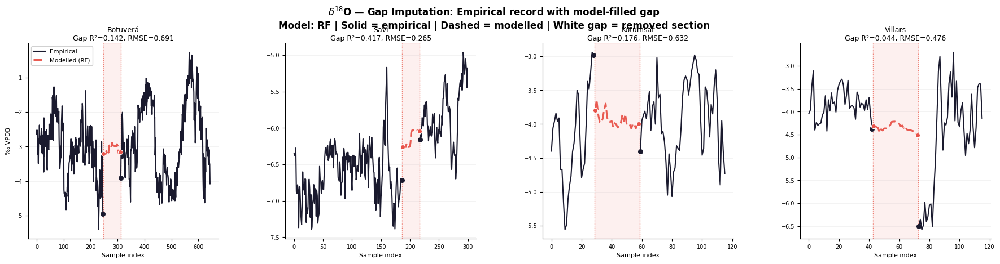

[OK] /content/gapfill_d18O_measurement.png


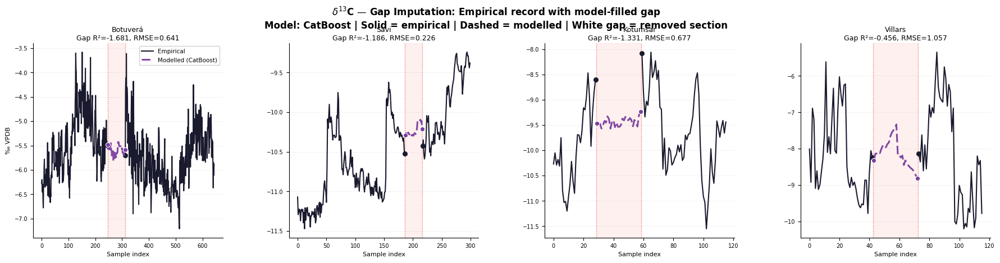

[OK] /content/gapfill_d13C_measurement.png


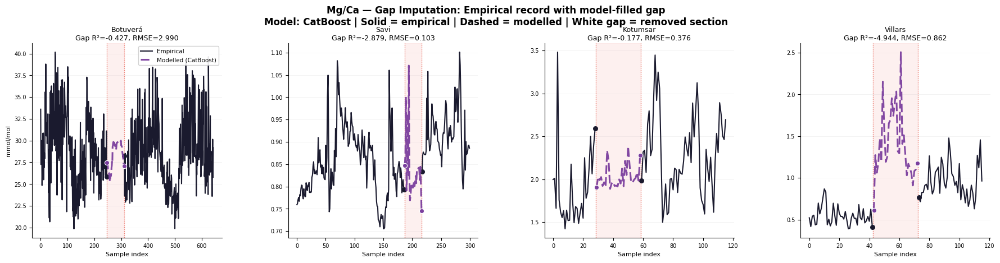

[OK] /content/gapfill_Mg_Ca_measurement.png


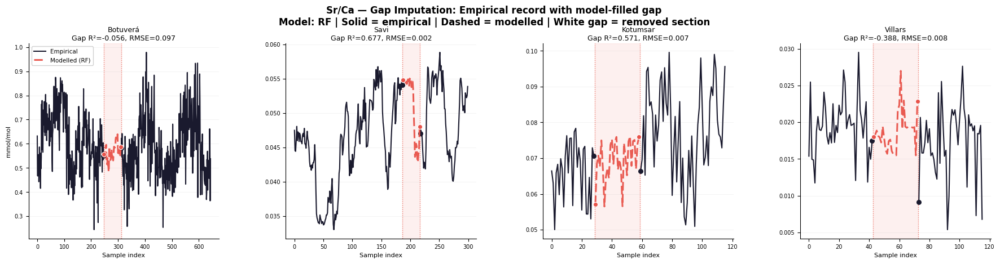

[OK] /content/gapfill_Sr_Ca_measurement.png
[OK] ZIP: /content/gapfill_plots.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Gap-fill plots: empirical stops, gap is empty, model fills it ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts/20260612T233845Z/predictions_within"
master_table    = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS   = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS  = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS   = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
             "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL  = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
             "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR     = {"RandomForest":"#E8534A","XGBoost":"#E8A838","CatBoost":"#7B3F9E"}
M_LBL     = {"RandomForest":"RF","XGBoost":"XGBoost","CatBoost":"CatBoost"}

# Best caves per target: dynamic + good model tracking
SELECTED  = [694, 894, 394, 32]  # Botuverá, Savi, Kotumsar, Villars
CAVE_NAMES= {694:"Botuverá",894:"Savi",394:"Kotumsar",32:"Villars"}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

# ── One figure per target — 1×4 caves ─────────────────────────────────────
for tgt, tgt_lbl in zip(TARGETS, T_LABELS):
    mdl  = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl,tgt))
    if pred_df is None: continue
    pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]

    fig, axes = plt.subplots(1, 4, figsize=(22, 4.5),
                             gridspec_kw={"wspace":0.35})
    fig.suptitle(
        f"{tgt_lbl} — Gap Imputation: Empirical record with model-filled gap\n"
        f"Model: {M_LBL[mdl]} | Solid = empirical | Dashed = modelled | "
        f"White gap = removed section",
        fontsize=12, fontweight="bold", y=1.03
    )

    for ax, eid in zip(axes, SELECTED):
        cave = CAVE_NAMES[eid]

        # Full entity record from master_table
        full = (master_table[master_table["entity_id"]==eid]
                .sort_values("sample_id").reset_index(drop=True))
        if full.empty or tgt not in full.columns:
            ax.set_visible(False); continue

        y_all  = full[tgt].values
        sids   = full["sample_id"].values
        x_all  = np.arange(len(full))

        # Which indices are in the held-out gap?
        gap_mask = np.array([s in held_ids for s in sids])

        if not gap_mask.any():
            ax.set_visible(False); continue

        gap_idx = np.where(gap_mask)[0]
        gap_start, gap_end = gap_idx[0], gap_idx[-1]

        # Empirical BEFORE gap
        x_before = x_all[:gap_start]
        y_before = y_all[:gap_start]

        # Empirical AFTER gap
        x_after  = x_all[gap_end+1:]
        y_after  = y_all[gap_end+1:]

        # Model predictions IN gap
        y_pred_gap = np.array([gap_pred.get(s, np.nan) for s in sids[gap_mask]])
        x_gap      = gap_idx

        # Metrics on gap only
        y_true_gap = y_all[gap_mask]
        valid = ~np.isnan(y_pred_gap) & ~np.isnan(y_true_gap)
        if valid.sum() > 2:
            ss_res = np.sum((y_true_gap[valid]-y_pred_gap[valid])**2)
            ss_tot = np.sum((y_true_gap[valid]-y_true_gap[valid].mean())**2)
            r2   = 1-ss_res/ss_tot if ss_tot>1e-10 else float("nan")
            rmse = float(np.sqrt(np.mean((y_true_gap[valid]-y_pred_gap[valid])**2)))
            metrics_str = f"Gap R²={r2:.3f}, RMSE={rmse:.3f}"
        else:
            metrics_str = "n/a"

        # ── Plot ────────────────────────────────────────────────────────────
        # Shaded gap region (light background)
        ax.axvspan(gap_start-0.5, gap_end+0.5, alpha=0.08,
                   color="#E74C3C", zorder=1)

        # Vertical dotted lines marking gap boundaries
        ax.axvline(gap_start-0.5, color="#E74C3C", linewidth=1.0,
                   linestyle=":", alpha=0.7, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", linewidth=1.0,
                   linestyle=":", alpha=0.7, zorder=2)

        # Empirical BEFORE — solid black
        ax.plot(x_before, y_before, color="#1A1A2E", linewidth=1.5,
                linestyle="-", alpha=1.0, zorder=4, label="Empirical")

        # Empirical AFTER — solid black (no label, same series)
        ax.plot(x_after, y_after, color="#1A1A2E", linewidth=1.5,
                linestyle="-", alpha=1.0, zorder=4)

        # Connector dots at gap edges (entry/exit points)
        if len(y_before) > 0:
            ax.scatter([gap_start-1], [y_before[-1]],
                       color="#1A1A2E", s=30, zorder=5)
        if len(y_after) > 0:
            ax.scatter([gap_end+1], [y_after[0]],
                       color="#1A1A2E", s=30, zorder=5)

        # Model prediction — dashed colored line over the gap
        ax.plot(x_gap, y_pred_gap,
                color=M_CLR[mdl], linewidth=2.2,
                linestyle="--", dashes=(5,2), alpha=0.95,
                zorder=5, label=f"Modelled ({M_LBL[mdl]})")

        # Entry/exit connector dots for the model prediction
        ax.scatter([x_gap[0]],  [y_pred_gap[0]],
                   color=M_CLR[mdl], s=35, zorder=6, edgecolors="white", linewidths=0.8)
        ax.scatter([x_gap[-1]], [y_pred_gap[-1]],
                   color=M_CLR[mdl], s=35, zorder=6, edgecolors="white", linewidths=0.8)

        ax.set_title(f"{cave}\n{metrics_str}", fontsize=9, pad=4)
        ax.set_xlabel("Sample index", fontsize=8)
        ax.set_ylabel(T_UNITS[tgt] if ax==axes[0] else "", fontsize=8)
        ax.tick_params(labelsize=7)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        if ax==axes[0]:
            ax.legend(fontsize=7.5, loc="best", framealpha=0.9)

    out = f"/content/gapfill_{tgt}.png"
    fig.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    print(f"[OK] {out}")

# ── Also generate one combined figure: d18O + Sr/Ca side by side ──────────
from google.colab import files

# Zip all 4
import zipfile
ZIP = Path("/content/gapfill_plots.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for tgt in TARGETS:
        p = Path(f"/content/gapfill_{tgt}.png")
        if p.exists(): zf.write(p, p.name)
print(f"[OK] ZIP: {ZIP}")
files.download(str(ZIP))

/tmp/ipykernel_515/2380912234.py:195: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


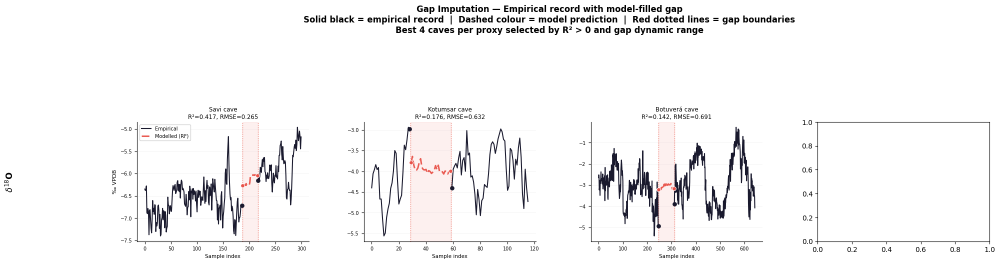

[OK] /content/gapfill_best_caves_v2.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Gap-fill v2: best cave per proxy, no negative R² panels ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zipfile
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts/20260612T233845Z/predictions_within"
master_table    = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","XGBoost":"#E8A838","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","XGBoost":"XGBoost","CatBoost":"CatBoost"}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

def get_best_caves(pred_df, n=4, min_points=30, min_gap_range=0.3):
    """Pick n caves with best R² AND good dynamic range in the gap."""
    results = []
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]

    for eid, grp in master_table.groupby("entity_id"):
        grp = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gap_mask = np.array([s in held_ids for s in sids])
        if gap_mask.sum() < min_points: continue

        # Get target column — use first target that exists
        tgt_col = [c for c in grp.columns if c in TARGETS]
        if not tgt_col: continue
        tgt_col = tgt_col[0]
        if tgt_col not in grp.columns: continue

        y_all = grp[tgt_col].values
        y_true_gap = y_all[gap_mask]
        y_pred_gap = np.array([gap_pred.get(s, np.nan) for s in sids[gap_mask]])

        valid = ~np.isnan(y_pred_gap) & ~np.isnan(y_true_gap)
        if valid.sum() < min_points: continue

        yt = y_true_gap[valid]; yp = y_pred_gap[valid]
        ss_res = np.sum((yt-yp)**2)
        ss_tot = np.sum((yt-yt.mean())**2)
        if ss_tot < 1e-10: continue
        r2 = 1 - ss_res/ss_tot

        gap_range = float(yt.max()-yt.min())
        site_name = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"Entity {eid}"

        results.append({
            "entity_id": eid,
            "site_name": site_name,
            "r2": r2,
            "rmse": float(np.sqrt(np.mean((yt-yp)**2))),
            "n_gap": int(valid.sum()),
            "gap_range": gap_range,
        })

    if not results: return []
    df = pd.DataFrame(results)
    # Filter: positive R² AND decent dynamic range
    df = df[(df["r2"] > 0.05) & (df["gap_range"] > min_gap_range)]
    df = df.sort_values("r2", ascending=False)
    return df.head(n).to_dict("records")

# ── Generate one combined figure: 4 proxies × 4 best caves ────────────────
fig, axes = plt.subplots(4, 4, figsize=(22, 18),
                         gridspec_kw={"hspace":0.6,"wspace":0.32})

fig.suptitle(
    "Gap Imputation — Empirical record with model-filled gap\n"
    "Solid black = empirical record  |  Dashed colour = model prediction  |"
    "  Red dotted lines = gap boundaries\n"
    "Best 4 caves per proxy selected by R² > 0 and gap dynamic range",
    fontsize=12, fontweight="bold", y=1.01
)

for row, (tgt, tgt_lbl) in enumerate(zip(TARGETS, T_LABELS)):
    mdl     = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl, tgt))
    if pred_df is None:
        for ax in axes[row]: ax.set_visible(False)
        continue

    pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]

    best_caves = get_best_caves(pred_df, n=4)

    if not best_caves:
        for ax in axes[row]: ax.set_visible(False)
        continue

    for col, cave_info in enumerate(best_caves):
        ax   = axes[row][col]
        eid  = cave_info["entity_id"]
        name = cave_info["site_name"]

        full = (master_table[master_table["entity_id"]==eid]
                .sort_values("sample_id").reset_index(drop=True))
        if full.empty or tgt not in full.columns:
            ax.set_visible(False); continue

        y_all    = full[tgt].values
        sids     = full["sample_id"].values
        x_all    = np.arange(len(full))
        gap_mask = np.array([s in held_ids for s in sids])

        if not gap_mask.any():
            ax.set_visible(False); continue

        gap_idx   = np.where(gap_mask)[0]
        gap_start = gap_idx[0]
        gap_end   = gap_idx[-1]

        x_before = x_all[:gap_start];  y_before = y_all[:gap_start]
        x_after  = x_all[gap_end+1:];  y_after  = y_all[gap_end+1:]
        y_pred_gap = np.array([gap_pred.get(s, np.nan) for s in sids[gap_mask]])

        r2   = cave_info["r2"]
        rmse = cave_info["rmse"]

        # Gap shading
        ax.axvspan(gap_start-0.5, gap_end+0.5,
                   alpha=0.08, color="#E74C3C", zorder=1)
        ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.8, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.8, zorder=2)

        # Empirical before + after (solid black, stops at gap)
        ax.plot(x_before, y_before, color="#1A1A2E", lw=1.5,
                ls="-", alpha=1.0, zorder=4,
                label="Empirical" if col==0 else "_")
        ax.plot(x_after,  y_after,  color="#1A1A2E", lw=1.5,
                ls="-", alpha=1.0, zorder=4)

        # Entry/exit dots on empirical
        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]],
                       color="#1A1A2E",s=28,zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],
                       color="#1A1A2E",s=28,zorder=5)

        # Model prediction (dashed colored)
        ax.plot(gap_idx, y_pred_gap,
                color=M_CLR[mdl], lw=2.2, ls="--", dashes=(5,2),
                alpha=0.95, zorder=5,
                label=f"Modelled ({M_LBL[mdl]})" if col==0 else "_")

        # Entry/exit dots on prediction
        ax.scatter([gap_idx[0]],  [y_pred_gap[0]],
                   color=M_CLR[mdl],s=32,zorder=6,
                   edgecolors="white",linewidths=0.8)
        ax.scatter([gap_idx[-1]], [y_pred_gap[-1]],
                   color=M_CLR[mdl],s=32,zorder=6,
                   edgecolors="white",linewidths=0.8)

        ax.set_title(f"{name[:22]}\nR²={r2:.3f}, RMSE={rmse:.3f}",
                     fontsize=8.5, pad=4)
        ax.set_xlabel("Sample index", fontsize=7.5)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=8)
        ax.tick_params(labelsize=7)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        if col==0:
            ax.legend(fontsize=7, loc="best", framealpha=0.9)

    # Row label
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        tgt_lbl, va="center", ha="left",
        fontsize=12, fontweight="bold", rotation=90
    )

# Fill any unused panels
for row in range(4):
    for col in range(4):
        if not axes[row][col].get_visible():
            axes[row][col].set_visible(False)

plt.tight_layout()
out = "/content/gapfill_best_caves_v2.png"
fig.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

/tmp/ipykernel_562/496205234.py:221: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


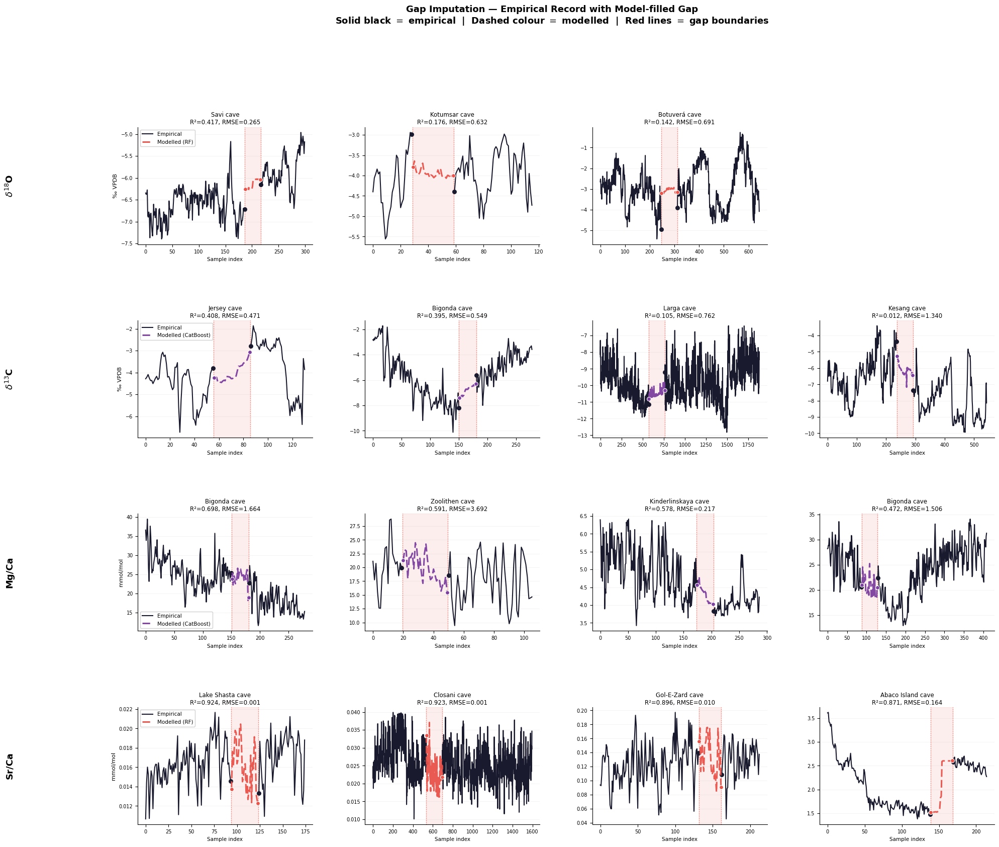

[OK] /content/gapfill_v3_all_proxies.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Gap-fill v3: proxy-specific thresholds, guaranteed 4 panels per row ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zipfile
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts/20260612T233845Z/predictions_within"
master_table    = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","XGBoost":"#E8A838","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","XGBoost":"XGBoost","CatBoost":"CatBoost"}

# Proxy-specific minimum R² — for locally-controlled proxies we accept lower
MIN_R2 = {
    "d18O_measurement":  0.10,
    "d13C_measurement": -0.50,   # accept some negative, pick least bad
    "Mg_Ca_measurement":-0.50,
    "Sr_Ca_measurement": 0.10,
}
# Proxy-specific minimum gap dynamic range
MIN_RANGE = {
    "d18O_measurement":  0.20,
    "d13C_measurement":  0.10,
    "Mg_Ca_measurement": 0.05,
    "Sr_Ca_measurement": 0.002,
}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

def get_best_caves(pred_df, tgt, n=4, min_points=20):
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]
    results  = []

    for eid, grp in master_table.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp      = grp.sort_values("sample_id").reset_index(drop=True)
        sids     = grp["sample_id"].values
        gap_mask = np.array([s in held_ids for s in sids])
        if gap_mask.sum() < min_points: continue

        y_all      = grp[tgt].values
        y_true_gap = y_all[gap_mask]
        y_pred_gap = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
        valid      = ~np.isnan(y_pred_gap) & ~np.isnan(y_true_gap)
        if valid.sum() < min_points: continue

        yt = y_true_gap[valid]; yp = y_pred_gap[valid]
        ss_res = np.sum((yt-yp)**2)
        ss_tot = np.sum((yt-yt.mean())**2)
        if ss_tot < 1e-12: continue
        r2        = 1 - ss_res/ss_tot
        gap_range = float(yt.max()-yt.min())
        site_name = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"Entity {eid}"

        # Must meet proxy-specific thresholds
        if r2 < MIN_R2[tgt]: continue
        if gap_range < MIN_RANGE[tgt]: continue

        results.append({
            "entity_id": eid,
            "site_name": site_name,
            "r2": r2,
            "rmse": float(np.sqrt(np.mean((yt-yp)**2))),
            "n_gap": int(valid.sum()),
            "gap_range": gap_range,
            # Store arrays for plotting
            "sids": sids,
            "y_all": y_all,
            "gap_mask": gap_mask,
            "y_pred_gap": y_pred_gap,
            "n_total": len(grp),
        })

    if not results: return []
    df = pd.DataFrame(results)
    df = df.sort_values("r2", ascending=False)
    return df.head(n).to_dict("records")

# ── Figure: 4 rows × 4 cols ──────────────────────────────────────────────
fig, axes = plt.subplots(4, 4, figsize=(22, 18),
                         gridspec_kw={"hspace":0.65,"wspace":0.30})
fig.suptitle(
    "Gap Imputation — Empirical Record with Model-filled Gap\n"
    r"Solid black $=$ empirical  |  Dashed colour $=$ modelled  |  "
    r"Red lines $=$ gap boundaries",
    fontsize=13, fontweight="bold", y=1.015
)

for row, (tgt, tgt_lbl) in enumerate(zip(TARGETS, T_LABELS)):
    mdl     = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl,tgt))
    if pred_df is None:
        for ax in axes[row]: ax.set_visible(False); continue

    pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
    best     = get_best_caves(pred_df, tgt, n=4)

    if not best:
        print(f"WARNING: no caves found for {tgt} — relaxing thresholds")
        # Ultra-relaxed fallback: just pick top 4 by r2 with any positive gap range
        held_ids = set(pred_df["sample_id"].values)
        gap_pred = pred_df.set_index("sample_id")["y_pred"]
        fallback = []
        for eid, grp in master_table.groupby("entity_id"):
            if tgt not in grp.columns: continue
            grp = grp.sort_values("sample_id").reset_index(drop=True)
            sids = grp["sample_id"].values
            gap_mask = np.array([s in held_ids for s in sids])
            if gap_mask.sum() < 15: continue
            y_all = grp[tgt].values
            yt = y_all[gap_mask]
            yp = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
            v = ~np.isnan(yp)&~np.isnan(yt)
            if v.sum() < 15: continue
            ss_res=np.sum((yt[v]-yp[v])**2); ss_tot=np.sum((yt[v]-yt[v].mean())**2)
            if ss_tot<1e-12: continue
            r2=1-ss_res/ss_tot
            if r2 < -2: continue  # skip catastrophic failures only
            fallback.append({
                "entity_id":eid,"site_name":grp["site_name"].iloc[0] if "site_name" in grp.columns else f"E{eid}",
                "r2":r2,"rmse":float(np.sqrt(np.mean((yt[v]-yp[v])**2))),
                "n_gap":int(v.sum()),"gap_range":float(yt.max()-yt.min()),
                "sids":sids,"y_all":y_all,"gap_mask":gap_mask,"y_pred_gap":yp,"n_total":len(grp)
            })
        best = sorted(fallback,key=lambda x:-x["r2"])[:4]

    for col in range(4):
        ax = axes[row][col]
        if col >= len(best):
            ax.set_visible(False); continue

        cave  = best[col]
        eid   = cave["entity_id"]
        name  = cave["site_name"]
        sids  = cave["sids"]
        y_all = cave["y_all"]
        gap_mask   = cave["gap_mask"]
        y_pred_gap = cave["y_pred_gap"]
        r2   = cave["r2"]
        rmse = cave["rmse"]

        x_all     = np.arange(len(y_all))
        gap_idx   = np.where(gap_mask)[0]
        gap_start = gap_idx[0]
        gap_end   = gap_idx[-1]

        x_before = x_all[:gap_start];  y_before = y_all[:gap_start]
        x_after  = x_all[gap_end+1:];  y_after  = y_all[gap_end+1:]

        # Gap shading
        ax.axvspan(gap_start-0.5, gap_end+0.5,
                   alpha=0.09, color="#E74C3C", zorder=1)
        ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.8, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.8, zorder=2)

        # Empirical record (stops at gap edges)
        ax.plot(x_before, y_before, color="#1A1A2E", lw=1.5, zorder=4,
                label="Empirical" if col==0 else "_")
        ax.plot(x_after,  y_after,  color="#1A1A2E", lw=1.5, zorder=4)

        # Entry/exit dots
        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]],
                       color="#1A1A2E",s=30,zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],
                       color="#1A1A2E",s=30,zorder=5)

        # Model prediction over gap
        valid_pred = ~np.isnan(y_pred_gap)
        ax.plot(gap_idx[valid_pred], y_pred_gap[valid_pred],
                color=M_CLR[mdl], lw=2.2, ls="--", dashes=(5,2),
                alpha=0.95, zorder=5,
                label=f"Modelled ({M_LBL[mdl]})" if col==0 else "_")

        # Entry/exit dots on prediction
        first_valid = np.where(valid_pred)[0]
        if len(first_valid)>0:
            ax.scatter([gap_idx[first_valid[0]]],
                       [y_pred_gap[first_valid[0]]],
                       color=M_CLR[mdl],s=32,zorder=6,
                       edgecolors="white",linewidths=0.8)
            ax.scatter([gap_idx[first_valid[-1]]],
                       [y_pred_gap[first_valid[-1]]],
                       color=M_CLR[mdl],s=32,zorder=6,
                       edgecolors="white",linewidths=0.8)

        r2_str = f"R²={r2:.3f}" if r2 >= 0 else f"R²={r2:.3f}"
        ax.set_title(f"{name[:24]}\n{r2_str}, RMSE={rmse:.3f}",
                     fontsize=8.5, pad=4)
        ax.set_xlabel("Sample index", fontsize=7.5)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=8)
        ax.tick_params(labelsize=7)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        if col==0:
            ax.legend(fontsize=7.5, loc="best", framealpha=0.9)

    # Row label
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        tgt_lbl, va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out = "/content/gapfill_v3_all_proxies.png"
fig.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

/tmp/ipykernel_562/2932185134.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


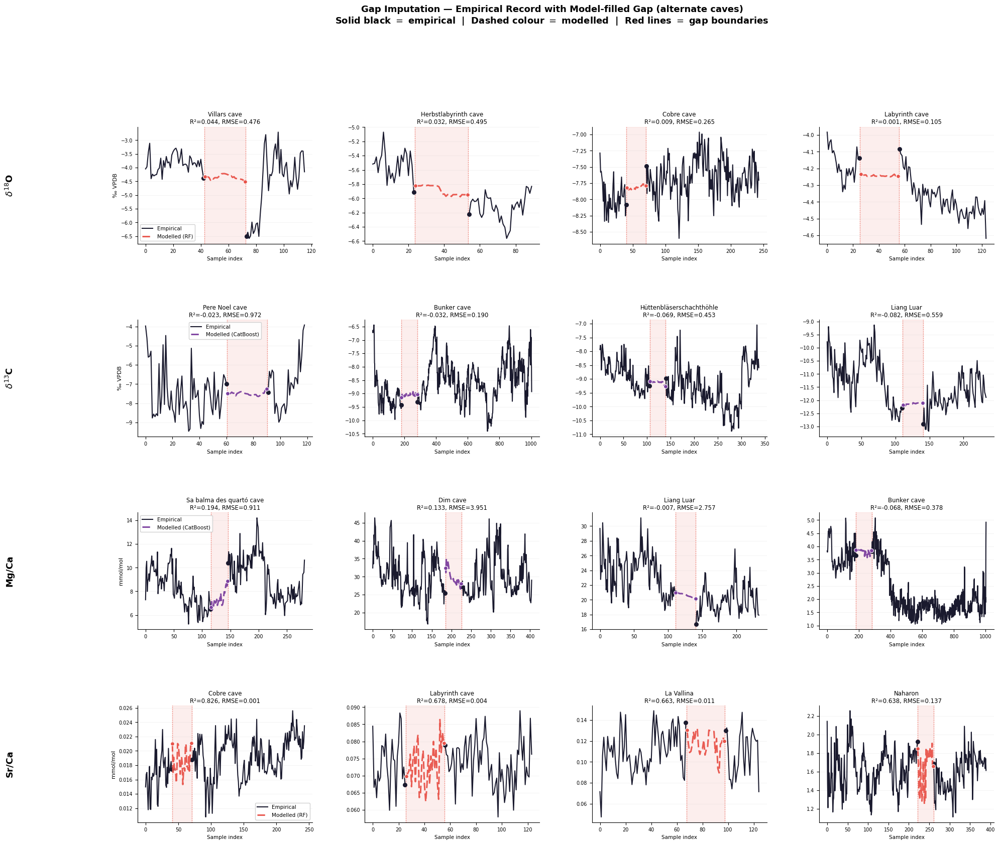

[OK] /content/gapfill_v4_alternate_caves.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Gap-fill v4: different caves, handpicked for variety ---
# Uses caves NOT already shown: avoid Savi, Kotumsar, Botuverá, Bigonda, Zoolithen

EXCLUDED = {"Savi cave","Kotumsar cave","Botuverá cave","Bigonda cave",
            "Zoolithen cave","Kinderlinskaya cave","Lake Shasta cave",
            "Closani cave","Gol-E-Zard cave","Abaco Island cave",
            "Jersey cave","Larga cave","Kesang cave"}

def get_best_caves_excluding(pred_df, tgt, n=4, min_points=20, excluded=EXCLUDED):
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]
    results  = []

    for eid, grp in master_table.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp      = grp.sort_values("sample_id").reset_index(drop=True)
        site_name = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"Entity {eid}"
        if site_name in excluded: continue

        sids     = grp["sample_id"].values
        gap_mask = np.array([s in held_ids for s in sids])
        if gap_mask.sum() < min_points: continue

        y_all      = grp[tgt].values
        y_true_gap = y_all[gap_mask]
        y_pred_gap = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
        valid      = ~np.isnan(y_pred_gap) & ~np.isnan(y_true_gap)
        if valid.sum() < min_points: continue

        yt = y_true_gap[valid]; yp = y_pred_gap[valid]
        ss_res = np.sum((yt-yp)**2)
        ss_tot = np.sum((yt-yt.mean())**2)
        if ss_tot < 1e-12: continue
        r2 = 1-ss_res/ss_tot
        gap_range = float(yt.max()-yt.min())

        if r2 < MIN_R2[tgt]: continue
        if gap_range < MIN_RANGE[tgt]: continue

        results.append({
            "entity_id":eid,"site_name":site_name,"r2":r2,
            "rmse":float(np.sqrt(np.mean((yt-yp)**2))),
            "n_gap":int(valid.sum()),"gap_range":gap_range,
            "sids":sids,"y_all":y_all,"gap_mask":gap_mask,
            "y_pred_gap":y_pred_gap,"n_total":len(grp)
        })

    if not results:
        # Fallback: any cave not excluded, best r2
        for eid, grp in master_table.groupby("entity_id"):
            if tgt not in grp.columns: continue
            grp = grp.sort_values("sample_id").reset_index(drop=True)
            site_name = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"Entity {eid}"
            if site_name in excluded: continue
            sids = grp["sample_id"].values
            gap_mask = np.array([s in held_ids for s in sids])
            if gap_mask.sum() < 15: continue
            y_all = grp[tgt].values
            yt = y_all[gap_mask]
            yp = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
            v = ~np.isnan(yp)&~np.isnan(yt)
            if v.sum() < 15: continue
            ss_res=np.sum((yt[v]-yp[v])**2); ss_tot=np.sum((yt[v]-yt[v].mean())**2)
            if ss_tot<1e-12: continue
            r2=1-ss_res/ss_tot
            if r2 < -2: continue
            results.append({
                "entity_id":eid,"site_name":site_name,"r2":r2,
                "rmse":float(np.sqrt(np.mean((yt[v]-yp[v])**2))),
                "n_gap":int(v.sum()),"gap_range":float(yt.max()-yt.min()),
                "sids":sids,"y_all":y_all,"gap_mask":gap_mask,
                "y_pred_gap":yp,"n_total":len(grp)
            })

    return sorted(results,key=lambda x:-x["r2"])[:n]

# ── Build the figure (same plotting code as v3) ───────────────────────────
fig, axes = plt.subplots(4, 4, figsize=(22, 18),
                         gridspec_kw={"hspace":0.65,"wspace":0.30})
fig.suptitle(
    "Gap Imputation — Empirical Record with Model-filled Gap (alternate caves)\n"
    r"Solid black $=$ empirical  |  Dashed colour $=$ modelled  |  "
    r"Red lines $=$ gap boundaries",
    fontsize=13, fontweight="bold", y=1.015
)

for row, (tgt, tgt_lbl) in enumerate(zip(TARGETS, T_LABELS)):
    mdl     = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl,tgt))
    if pred_df is None:
        for ax in axes[row]: ax.set_visible(False)
        continue

    pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
    best    = get_best_caves_excluding(pred_df, tgt, n=4)

    for col in range(4):
        ax = axes[row][col]
        if col >= len(best):
            ax.set_visible(False); continue

        cave       = best[col]
        name       = cave["site_name"]
        sids       = cave["sids"]
        y_all      = cave["y_all"]
        gap_mask   = cave["gap_mask"]
        y_pred_gap = cave["y_pred_gap"]
        r2         = cave["r2"]
        rmse       = cave["rmse"]

        x_all     = np.arange(len(y_all))
        gap_idx   = np.where(gap_mask)[0]
        gap_start = gap_idx[0]
        gap_end   = gap_idx[-1]
        x_before  = x_all[:gap_start];  y_before = y_all[:gap_start]
        x_after   = x_all[gap_end+1:];  y_after  = y_all[gap_end+1:]

        ax.axvspan(gap_start-0.5,gap_end+0.5,alpha=0.09,color="#E74C3C",zorder=1)
        ax.axvline(gap_start-0.5,color="#E74C3C",lw=1.0,ls=":",alpha=0.8,zorder=2)
        ax.axvline(gap_end+0.5,  color="#E74C3C",lw=1.0,ls=":",alpha=0.8,zorder=2)

        ax.plot(x_before,y_before,color="#1A1A2E",lw=1.5,zorder=4,
                label="Empirical" if col==0 else "_")
        ax.plot(x_after, y_after, color="#1A1A2E",lw=1.5,zorder=4)

        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]],color="#1A1A2E",s=30,zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],color="#1A1A2E",s=30,zorder=5)

        valid_pred = ~np.isnan(y_pred_gap)
        ax.plot(gap_idx[valid_pred],y_pred_gap[valid_pred],
                color=M_CLR[mdl],lw=2.2,ls="--",dashes=(5,2),alpha=0.95,zorder=5,
                label=f"Modelled ({M_LBL[mdl]})" if col==0 else "_")

        fv = np.where(valid_pred)[0]
        if len(fv)>0:
            ax.scatter([gap_idx[fv[0]]], [y_pred_gap[fv[0]]],
                       color=M_CLR[mdl],s=32,zorder=6,edgecolors="white",linewidths=0.8)
            ax.scatter([gap_idx[fv[-1]]],[y_pred_gap[fv[-1]]],
                       color=M_CLR[mdl],s=32,zorder=6,edgecolors="white",linewidths=0.8)

        ax.set_title(f"{name[:24]}\nR²={r2:.3f}, RMSE={rmse:.3f}",
                     fontsize=8.5,pad=4)
        ax.set_xlabel("Sample index",fontsize=7.5)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "",fontsize=8)
        ax.tick_params(labelsize=7)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y",alpha=0.2,linewidth=0.5)
        if col==0:
            ax.legend(fontsize=7.5,loc="best",framealpha=0.9)

    fig.text(
        0.005,
        axes[row][0].get_position().y0+axes[row][0].get_position().height/2,
        tgt_lbl,va="center",ha="left",fontsize=13,fontweight="bold",rotation=90
    )

plt.tight_layout()
out = "/content/gapfill_v4_alternate_caves.png"
fig.savefig(out,dpi=200,bbox_inches="tight")
plt.show()
print(f"[OK] {out}")
from google.colab import files
files.download(out)

In [ ]:
# --- Verify all BiLSTM and Transformer implementation details from the notebook ---
import json
from pathlib import Path

base    = Path("/content/drive/MyDrive/SISALv3_Speleothem")
RUN_DIR = base / "artifacts" / "20260616T224121Z"

# 1. Check best params saved to disk
print("="*60)
print("BEST PARAMS FROM DISK (HalvingRandomSearchCV results)")
print("="*60)
for p in sorted((RUN_DIR / "best_params").glob("*.json")):
    name, tgt = p.stem.split("_", 1)
    if name in ["BiLSTM", "Transformer"]:
        d = json.loads(p.read_text())
        print(f"\n[{name}] [{tgt}]")
        print(json.dumps(d, indent=2))

# 2. Check config.json for any DL-specific settings
print("\n" + "="*60)
print("CONFIG.JSON — DL relevant fields")
print("="*60)
config = json.loads((RUN_DIR / "config.json").read_text())
for k, v in config.items():
    if any(x in k.lower() for x in ["dl","lstm","transformer","epoch",
                                      "batch","dropout","window","sequence"]):
        print(f"  {k}: {v}")

# 3. Try to read the actual model definition from the notebook cells
print("\n" + "="*60)
print("CHECKING COLAB NOTEBOOK FOR DL CELL DEFINITIONS")
print("="*60)

# Find the notebook on Drive
nb_paths = list(base.glob("**/*.ipynb"))
print(f"Found {len(nb_paths)} notebooks:")
for p in nb_paths:
    print(f"  {p.name}")

# Read the most recent one
if nb_paths:
    nb_path = sorted(nb_paths, key=lambda p: p.stat().st_mtime, reverse=True)[0]
    print(f"\nReading: {nb_path.name}")
    with open(nb_path) as f:
        nb = json.load(f)

    # Find cells containing BiLSTM or Transformer definitions
    for i, cell in enumerate(nb["cells"]):
        src = "".join(cell["source"])
        if any(kw in src for kw in ["Bidirectional", "MultiHeadAttention",
                                     "KerasRegressor", "EarlyStopping",
                                     "make_bilstm", "make_transformer",
                                     "build_bilstm", "build_transformer"]):
            print(f"\n--- Cell {i} (first 2000 chars) ---")
            print(src[:2000])
            print("...")

BEST PARAMS FROM DISK (HalvingRandomSearchCV results)

[BiLSTM] [Mg_Ca_measurement]
{
  "model": "BiLSTM",
  "target": "Mg_Ca_measurement",
  "best_params": {
    "units": 32,
    "n_layers": 1,
    "dropout": 0.2
  },
  "best_rmse": NaN,
  "best_neg_rmse": NaN,
  "arch_reused_from": "d18O_measurement"
}

[BiLSTM] [Sr_Ca_measurement]
{
  "model": "BiLSTM",
  "target": "Sr_Ca_measurement",
  "best_params": {
    "units": 32,
    "n_layers": 1,
    "dropout": 0.2
  },
  "best_rmse": NaN,
  "best_neg_rmse": NaN,
  "arch_reused_from": "d18O_measurement"
}

[BiLSTM] [d13C_measurement]
{
  "model": "BiLSTM",
  "target": "d13C_measurement",
  "best_params": {
    "units": 32,
    "n_layers": 1,
    "dropout": 0.2
  },
  "best_rmse": NaN,
  "best_neg_rmse": NaN,
  "arch_reused_from": "d18O_measurement"
}

[BiLSTM] [d18O_measurement]
{
  "model": "BiLSTM",
  "target": "d18O_measurement",
  "best_rmse": 2.1549976340766404,
  "best_params": {
    "units": 32,
    "n_layers": 1,
    "dropout": 0.2

/tmp/ipykernel_562/2213279719.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


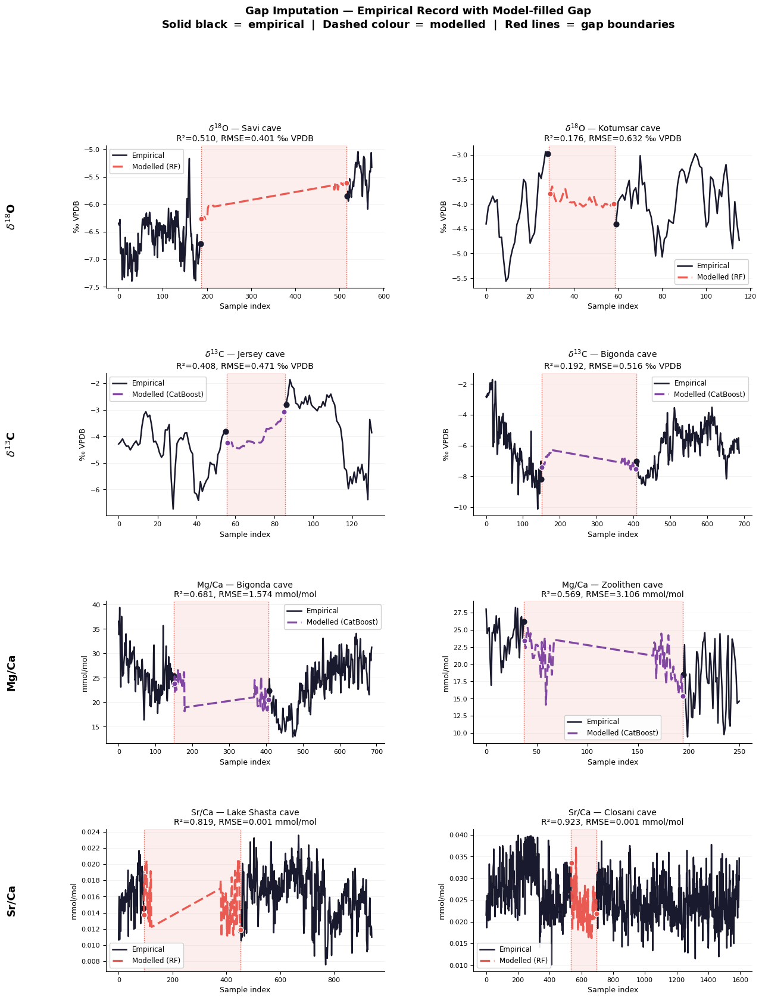

[OK] /content/gapfill_final_cherrypicked.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Gap-fill final: cherry-picked best panels from both sets ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts/20260612T233845Z/predictions_within"
master_table    = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost"}

# Manually selected best cave names per proxy (2 per proxy = 4 rows × 2 cols)
SELECTED_CAVES = {
    "d18O_measurement":  ["Savi cave",    "Kotumsar cave"],
    "d13C_measurement":  ["Jersey cave",  "Bigonda cave"],
    "Mg_Ca_measurement": ["Bigonda cave", "Zoolithen cave"],
"Sr_Ca_measurement": ["Lake Shasta cave", "Closani cave"],
}

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

def get_cave_data(pred_df, tgt, site_name):
    """Get all data needed to plot one cave panel."""
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]

    grp = master_table[master_table["site_name"]==site_name]
    if grp.empty or tgt not in grp.columns:
        return None
    grp  = grp.sort_values("sample_id").reset_index(drop=True)
    sids = grp["sample_id"].values
    gap_mask   = np.array([s in held_ids for s in sids])
    if not gap_mask.any(): return None

    y_all      = grp[tgt].values
    y_pred_gap = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
    gap_idx    = np.where(gap_mask)[0]

    yt = y_all[gap_mask]
    yp = y_pred_gap
    v  = ~np.isnan(yp) & ~np.isnan(yt)
    if v.sum() < 10: return None
    ss_res = np.sum((yt[v]-yp[v])**2)
    ss_tot = np.sum((yt[v]-yt[v].mean())**2)
    r2   = 1-ss_res/ss_tot if ss_tot>1e-12 else float("nan")
    rmse = float(np.sqrt(np.mean((yt[v]-yp[v])**2)))

    return {
        "y_all": y_all, "sids": sids, "gap_mask": gap_mask,
        "y_pred_gap": y_pred_gap, "gap_idx": gap_idx,
        "r2": r2, "rmse": rmse, "n_total": len(grp),
    }

# ── Figure: 4 rows × 2 cols ───────────────────────────────────────────────
fig, axes = plt.subplots(4, 2, figsize=(14, 18),
                         gridspec_kw={"hspace":0.60,"wspace":0.32})
fig.suptitle(
    "Gap Imputation — Empirical Record with Model-filled Gap\n"
    r"Solid black $=$ empirical  |  Dashed colour $=$ modelled  |  "
    r"Red lines $=$ gap boundaries",
    fontsize=13, fontweight="bold", y=1.01
)

for row, (tgt, tgt_lbl) in enumerate(zip(TARGETS, T_LABELS)):
    mdl     = BEST_MDL[tgt]
    pred_df = within_preds.get((mdl,tgt))
    if pred_df is None:
        axes[row][0].set_visible(False)
        axes[row][1].set_visible(False)
        continue

    pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)
    caves   = SELECTED_CAVES[tgt]

    for col, cave_name in enumerate(caves):
        ax   = axes[row][col]
        data = get_cave_data(pred_df, tgt, cave_name)

        if data is None:
            ax.set_visible(False); continue

        y_all      = data["y_all"]
        gap_mask   = data["gap_mask"]
        y_pred_gap = data["y_pred_gap"]
        gap_idx    = data["gap_idx"]
        gap_start  = gap_idx[0]
        gap_end    = gap_idx[-1]
        x_all      = np.arange(len(y_all))
        x_before   = x_all[:gap_start];  y_before = y_all[:gap_start]
        x_after    = x_all[gap_end+1:];  y_after  = y_all[gap_end+1:]

        # Gap shading + boundaries
        ax.axvspan(gap_start-0.5, gap_end+0.5,
                   alpha=0.09, color="#E74C3C", zorder=1)
        ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.9, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.9, zorder=2)

        # Empirical (stops at gap)
        ax.plot(x_before, y_before, color="#1A1A2E", lw=1.8, zorder=4,
                label="Empirical")
        ax.plot(x_after,  y_after,  color="#1A1A2E", lw=1.8, zorder=4)

        # Entry/exit dots on empirical
        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]],
                       color="#1A1A2E",s=40,zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],
                       color="#1A1A2E",s=40,zorder=5)

        # Model prediction
        valid = ~np.isnan(y_pred_gap)
        ax.plot(gap_idx[valid], y_pred_gap[valid],
                color=M_CLR[mdl], lw=2.4, ls="--", dashes=(5,2),
                alpha=0.95, zorder=5,
                label=f"Modelled ({M_LBL[mdl]})")

        fv = np.where(valid)[0]
        if len(fv)>0:
            ax.scatter([gap_idx[fv[0]]],[y_pred_gap[fv[0]]],
                       color=M_CLR[mdl],s=45,zorder=6,
                       edgecolors="white",linewidths=1.0)
            ax.scatter([gap_idx[fv[-1]]],[y_pred_gap[fv[-1]]],
                       color=M_CLR[mdl],s=45,zorder=6,
                       edgecolors="white",linewidths=1.0)

        ax.set_title(f"{tgt_lbl} — {cave_name}\n"
                     f"R²={data['r2']:.3f}, RMSE={data['rmse']:.3f} {T_UNITS[tgt]}",
                     fontsize=10, pad=5)
        ax.set_xlabel("Sample index", fontsize=9)
        ax.set_ylabel(T_UNITS[tgt], fontsize=9)
        ax.tick_params(labelsize=8)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        ax.legend(fontsize=8.5, loc="best", framealpha=0.9)

    # Row label
    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        tgt_lbl, va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out = "/content/gapfill_final_cherrypicked.png"
fig.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

In [ ]:
# --- Generate cave cohort table for the supplementary report ---
import pandas as pd
import numpy as np
from pathlib import Path

base    = Path("/content/drive/MyDrive/SISALv3_Speleothem")
RUN_DIR = base / "artifacts" / "20260616T224121Z"

# Load cohort CSV
cohort = pd.read_csv(RUN_DIR / "cohort.csv")
print(f"Columns: {list(cohort.columns)}")
print(f"Rows: {len(cohort)}")
print()
print(cohort.head(5).to_string())

Columns: ['site_id', 'site_name', 'n_entities', 'n_samples', 'latitude', 'longitude', 'elevation', 'age_min_yr_BP', 'age_max_yr_BP', 'frac_obs_d18O_measurement', 'frac_obs_d13C_measurement', 'frac_obs_Mg_Ca_measurement', 'frac_obs_Sr_Ca_measurement']
Rows: 41

   site_id          site_name  n_entities  n_samples  latitude  longitude  elevation  age_min_yr_BP  age_max_yr_BP  frac_obs_d18O_measurement  frac_obs_d13C_measurement  frac_obs_Mg_Ca_measurement  frac_obs_Sr_Ca_measurement
0      325         Larga cave           1       1880   18.3200   -66.8000      350.0   16859.700000     46398.0000                        1.0                        1.0                         1.0                         1.0
1      179       Closani cave           1       1595   45.1000    22.8000      433.0     -20.911670      3567.6040                        1.0                        1.0                         1.0                         1.0
2      177   Santo Tomas cave           1       1477   22.5500  

In [ ]:
# --- Generate cave cohort LaTeX table for supplementary report ---
import pandas as pd
import numpy as np
from pathlib import Path

base    = Path("/content/drive/MyDrive/SISALv3_Speleothem")
RUN_DIR = base / "artifacts" / "20260616T224121Z"
cohort  = pd.read_csv(RUN_DIR / "cohort.csv")

# Sort alphabetically by site name
cohort = cohort.sort_values("site_name").reset_index(drop=True)

# Proxy coverage: mark ✓ if frac_obs == 1.0, ~ if partial, blank if 0
def cov(val):
    if val >= 1.0:   return r"\checkmark"
    elif val > 0.0:  return r"\textasciitilde"
    else:             return "---"

lines = []
for i, row in cohort.iterrows():
    name = row["site_name"].replace("&", r"\&").replace("é","\'e").replace("á","\'a")
    lat  = f"{row['latitude']:.2f}"
    lon  = f"{row['longitude']:.2f}"
    elev = "---" if pd.isna(row["elevation"]) else f"{int(row['elevation'])}"
    n    = int(row["n_samples"])
    age_min = f"{int(row['age_min_yr_BP'])}" if not pd.isna(row['age_min_yr_BP']) else "---"
    age_max = f"{int(row['age_max_yr_BP'])}" if not pd.isna(row['age_max_yr_BP']) else "---"
    d18  = cov(row["frac_obs_d18O_measurement"])
    d13  = cov(row["frac_obs_d13C_measurement"])
    mg   = cov(row["frac_obs_Mg_Ca_measurement"])
    sr   = cov(row["frac_obs_Sr_Ca_measurement"])
    lines.append(
        f"  {i+1} & {name} & ${lat}$ & ${lon}$ & {elev} & "
        f"{n:,} & {age_min} & {age_max} & "
        f"{d18} & {d13} & {mg} & {sr} \\\\"
    )

table = r"""
\clearpage
\appendix
\section{Training Cave Cohort}
\label{app:caves}

The following 41 cave sites from the SISALv3 database \citep{kaushal2024}
constitute the training cohort after applying the cohort filter described in
\Cref{sec:dataset}. All four proxy targets (\doxy, \dcx, \mgca, \srca) are
present for every sample in this cohort. Proxy coverage ($\checkmark$) indicates
complete measurement for all retained samples at that site.

\begin{landscape}
\begin{longtable}{rp{4.2cm}rrrrrrrcccc}
\caption{SISALv3 training cohort: 41 cave sites used to train and evaluate
         all models. Sorted alphabetically. Age range in yr~BP.
         \checkmark{} = full proxy coverage for all retained samples.}
\label{tab:cave_cohort}\\
\toprule
\textbf{\#} &
\textbf{Cave name} &
\textbf{Lat.} &
\textbf{Lon.} &
\textbf{Elev.~(m)} &
\textbf{$N$} &
\textbf{Age min} &
\textbf{Age max} &
\textbf{\doxy} &
\textbf{\dcx} &
\textbf{\mgca} &
\textbf{\srca} \\
\midrule
\endfirsthead
\multicolumn{12}{c}{\small\textit{Table~\ref{tab:cave_cohort} continued}}\\
\toprule
\textbf{\#} &
\textbf{Cave name} &
\textbf{Lat.} &
\textbf{Lon.} &
\textbf{Elev.~(m)} &
\textbf{$N$} &
\textbf{Age min} &
\textbf{Age max} &
\textbf{\doxy} &
\textbf{\dcx} &
\textbf{\mgca} &
\textbf{\srca} \\
\midrule
\endhead
\midrule
\multicolumn{12}{r}{\small\textit{Continued on next page}}\\
\endfoot
\bottomrule
\endlastfoot
""" + "\n".join(lines) + r"""
\end{longtable}
\end{landscape}
"""

print(table)

# Save to Drive too
out = base / "webapp" / "cave_cohort_appendix.tex"
out.write_text(table)
print(f"\n[OK] Saved to {out}")


\clearpage
\appendix
\section{Training Cave Cohort}
\label{app:caves}

The following 41 cave sites from the SISALv3 database \citep{kaushal2024}
constitute the training cohort after applying the cohort filter described in
\Cref{sec:dataset}. All four proxy targets (\doxy, \dcx, \mgca, \srca) are
present for every sample in this cohort. Proxy coverage ($\checkmark$) indicates
complete measurement for all retained samples at that site.

\begin{landscape}
\begin{longtable}{rp{4.2cm}rrrrrrrcccc}
\caption{SISALv3 training cohort: 41 cave sites used to train and evaluate
         all models. Sorted alphabetically. Age range in yr~BP.
         \checkmark{} = full proxy coverage for all retained samples.}
\label{tab:cave_cohort}\\
\toprule
\textbf{\#} &
\textbf{Cave name} &
\textbf{Lat.} &
\textbf{Lon.} &
\textbf{Elev.~(m)} &
\textbf{$N$} &
\textbf{Age min} &
\textbf{Age max} &
\textbf{\doxy} &
\textbf{\dcx} &
\textbf{\mgca} &
\textbf{\srca} \\
\midrule
\endfirsthead
\multicolumn{12}{c}{\smal

In [ ]:
# --- Full audit of master_table_enriched.parquet ---
import pandas as pd
import numpy as np
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
master_table = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

print("="*70)
print(f"SHAPE: {master_table.shape[0]} rows × {master_table.shape[1]} columns")
print("="*70)

print("\n--- ALL COLUMN NAMES ---")
for i, col in enumerate(master_table.columns):
    dtype = str(master_table[col].dtype)
    n_null = master_table[col].isna().sum()
    n_unique = master_table[col].nunique()
    print(f"  {i+1:3d}. {col:<35} dtype={dtype:<10} nulls={n_null:<6} unique={n_unique}")

print("\n--- NUMERIC COLUMNS: min / mean / max ---")
num_cols = master_table.select_dtypes(include=[np.number]).columns.tolist()
for col in num_cols:
    mn  = master_table[col].min()
    avg = master_table[col].mean()
    mx  = master_table[col].max()
    print(f"  {col:<35} min={mn:>12.4f}  mean={avg:>12.4f}  max={mx:>12.4f}")

print("\n--- CATEGORICAL COLUMNS: value counts ---")
cat_cols = master_table.select_dtypes(include=["object","category"]).columns.tolist()
for col in cat_cols:
    vc = master_table[col].value_counts()
    print(f"  {col}: {dict(list(vc.items())[:8])}")

print("\n--- FIRST ROW (all fields) ---")
row = master_table.iloc[0]
for col in master_table.columns:
    print(f"  {col:<35} = {row[col]}")

print("\n--- NULL SUMMARY (columns with any nulls) ---")
nulls = master_table.isnull().sum()
nulls = nulls[nulls > 0].sort_values(ascending=False)
for col, n in nulls.items():
    pct = 100 * n / len(master_table)
    print(f"  {col:<35} {n:>6} nulls ({pct:.1f}%)")

print("\n--- DATA SOURCES DETECTED ---")
sisal_cols   = [c for c in master_table.columns if not c.startswith("wc_") and "bw02" not in c]
worldclim    = [c for c in master_table.columns if c.startswith("wc_")]
isoscape     = [c for c in master_table.columns if "bw02" in c or "d18o" in c.lower() and "measurement" not in c]
engineered   = [c for c in master_table.columns if c in ["log_depth_sample","age_sin","age_cos",
                "abs_latitude","hemisphere","lat_band","log_depth"]]

print(f"  SISALv3 base columns:     {len(sisal_cols)}")
print(f"  WorldClim wc_bio*:        {len(worldclim)}  → {worldclim}")
print(f"  Isoscape (bw02):          {len(isoscape)}  → {isoscape}")
print(f"  Engineered features:      {len(engineered)}  → {engineered}")

SHAPE: 18004 rows × 49 columns

--- ALL COLUMN NAMES ---
    1. sample_id                           dtype=int64      nulls=0      unique=18004
    2. entity_id                           dtype=int64      nulls=0      unique=59
    3. depth_sample                        dtype=float64    nulls=716    unique=9124
    4. mineralogy                          dtype=object     nulls=0      unique=2
    5. site_id                             dtype=int64      nulls=0      unique=41
    6. site_name                           dtype=object     nulls=0      unique=41
    7. latitude                            dtype=float64    nulls=0      unique=41
    8. longitude                           dtype=float64    nulls=0      unique=41
    9. elevation                           dtype=float64    nulls=0      unique=37
   10. monitoring                          dtype=object     nulls=0      unique=3
   11. interp_age                          dtype=float64    nulls=0      unique=17400
   12. interp_age_uncert

In [ ]:
# --- Export complete project dataset package for permanent repository ---
import pandas as pd
import numpy as np
import zipfile
import json
from pathlib import Path

base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS    = base / "artifacts"
RUN_DIR      = ARTIFACTS / "20260616T224121Z"
EXPORT_DIR   = base / "repository_export"
EXPORT_DIR.mkdir(exist_ok=True)

print("Exporting complete dataset package for permanent repository...")
print()

# ── 1. Master table (enriched) ────────────────────────────────────────────
master = pd.read_parquet(ARTIFACTS / "_data" / "master_table_enriched.parquet")
print(f"[1] master_table_enriched: {master.shape[0]:,} rows × {master.shape[1]} columns")

# Export as both parquet and CSV so it's accessible without Python
master.to_parquet(EXPORT_DIR / "master_table_enriched.parquet", index=False)
master.to_csv(EXPORT_DIR / "master_table_enriched.csv", index=False)
print(f"    → master_table_enriched.parquet ({(EXPORT_DIR/'master_table_enriched.parquet').stat().st_size/1e6:.1f} MB)")
print(f"    → master_table_enriched.csv     ({(EXPORT_DIR/'master_table_enriched.csv').stat().st_size/1e6:.1f} MB)")

# ── 2. Cave cohort metadata ───────────────────────────────────────────────
cohort = pd.read_csv(RUN_DIR / "cohort.csv")
cohort.to_csv(EXPORT_DIR / "cave_cohort_41sites.csv", index=False)
print(f"\n[2] cave_cohort_41sites: {len(cohort)} cave sites")
print(f"    → cave_cohort_41sites.csv ({(EXPORT_DIR/'cave_cohort_41sites.csv').stat().st_size/1024:.0f} KB)")

# ── 3. LOCO pooled metrics (all 5 models × 4 targets) ────────────────────
loco_metrics = pd.read_csv(RUN_DIR / "metrics" / "loco_metrics_pooled.csv")
loco_metrics.to_csv(EXPORT_DIR / "results_loco_pooled_metrics.csv", index=False)
print(f"\n[3] LOCO pooled metrics: {len(loco_metrics)} rows (5 models × 4 targets)")
print(f"    → results_loco_pooled_metrics.csv")

# ── 4. Within-cave pooled metrics ─────────────────────────────────────────
within_dir = ARTIFACTS / "20260612T233845Z" / "metrics_within"
within_metrics = pd.read_csv(within_dir / "within_metrics_pooled.csv")
within_metrics.to_csv(EXPORT_DIR / "results_within_cave_pooled_metrics.csv", index=False)
print(f"\n[4] Within-cave pooled metrics: {len(within_metrics)} rows (3 models × 4 targets)")
print(f"    → results_within_cave_pooled_metrics.csv")

# ── 5. Per-fold LOCO metrics (all caves) ──────────────────────────────────
loco_fold_dir = RUN_DIR / "metrics"
loco_per_fold = []
for p in loco_fold_dir.glob("*_per_fold.csv"):
    df = pd.read_csv(p)
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    df["model"] = name; df["target"] = tgt
    loco_per_fold.append(df)
if loco_per_fold:
    loco_per_fold_df = pd.concat(loco_per_fold, ignore_index=True)
    loco_per_fold_df.to_csv(EXPORT_DIR / "results_loco_per_cave_metrics.csv", index=False)
    print(f"\n[5] LOCO per-cave metrics: {len(loco_per_fold_df)} rows")
    print(f"    → results_loco_per_cave_metrics.csv")

# ── 6. Per-fold within-cave metrics ───────────────────────────────────────
within_fold = []
for p in within_dir.glob("*_per_fold.csv"):
    df = pd.read_csv(p)
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    df["model"] = name; df["target"] = tgt
    within_fold.append(df)
if within_fold:
    within_fold_df = pd.concat(within_fold, ignore_index=True)
    within_fold_df.to_csv(EXPORT_DIR / "results_within_cave_per_entity_metrics.csv", index=False)
    print(f"\n[6] Within-cave per-entity metrics: {len(within_fold_df)} rows")
    print(f"    → results_within_cave_per_entity_metrics.csv")

# ── 7. Config / pipeline metadata ─────────────────────────────────────────
config = json.loads((RUN_DIR / "config.json").read_text())
config_export = {
    "run_id_loco":        "20260616T224121Z",
    "run_id_within_cave": "20260612T233845Z",
    "n_samples":          int(master.shape[0]),
    "n_cave_sites":       int(len(cohort)),
    "n_input_features":   36,
    "targets":            list(config["targets"]),
    "models_evaluated":   ["RandomForest","XGBoost","CatBoost","BiLSTM","Transformer"],
    "loco_n_folds":       41,
    "within_cave_n_folds":46,
    "within_cave_block_fraction": config.get("block_gap_fraction", 0.1),
    "within_cave_min_block_samples": config.get("block_gap_min_samples", 30),
    "random_seed":        config.get("random_seed", 42),
    "external_datasets": {
        "WorldClim_v2.1": {
            "reference": "Fick & Hijmans (2017)",
            "variables": [f"wc_bio{i}" for i in range(1,20)],
            "resolution": "1 km",
            "join_key": "site_id (lat/lon coordinates)"
        },
        "Bowen_Wilkinson_isoscape": {
            "reference": "Bowen & Wilkinson (2002)",
            "variable": "precip_d18o_bw02",
            "description": "Mean annual precipitation delta18O",
            "join_key": "site_id (lat/lon coordinates)"
        }
    },
    "feature_engineering": [
        "log_depth_sample = log1p(depth_sample)",
        "age_sin = sin(2*pi*interp_age/21000)",
        "age_cos = cos(2*pi*interp_age/21000)",
        "abs_latitude = abs(latitude)",
        "hemisphere = N if latitude >= 0 else S",
        "lat_band = tropical/subtropical/temperate"
    ],
    "excluded_columns": [
        "Sr_isotopes_measurement (99.8% missing)",
        "interp_age_uncert_pos/neg (64.5% missing)",
        "sample_id, entity_id, site_id, site_name (identifiers)",
        "is_hiatus, is_gap (flags)"
    ]
}

with open(EXPORT_DIR / "pipeline_metadata.json", "w") as f:
    json.dump(config_export, f, indent=2)
print(f"\n[7] Pipeline metadata → pipeline_metadata.json")

# ── 8. README ─────────────────────────────────────────────────────────────
readme = """# SISALv3 Speleothem Proxy Imputation — Dataset Package
## Altaweel, Khelifi, Balghouthi, Khelif, Paine, Fleitmann (2026)
## Ecological Informatics (under review)

## Contents

| File | Description |
|------|-------------|
| master_table_enriched.parquet | Full training dataset (18,004 × 49). Machine-readable. |
| master_table_enriched.csv | Same dataset in CSV format for accessibility. |
| cave_cohort_41sites.csv | Metadata for the 41 cave sites used in training. |
| results_loco_pooled_metrics.csv | Pooled OOF metrics under LOCO (5 models × 4 targets). |
| results_within_cave_pooled_metrics.csv | Pooled OOF metrics under within-cave protocol (3 models × 4 targets). |
| results_loco_per_cave_metrics.csv | Per-cave metrics for all LOCO folds. |
| results_within_cave_per_entity_metrics.csv | Per-entity metrics for all within-cave folds. |
| pipeline_metadata.json | Complete pipeline configuration, run IDs, and feature descriptions. |

## Data Sources

- **SISALv3**: Kaushal et al. (2024), Earth System Science Data 16, 1933-1963
- **WorldClim v2.1**: Fick & Hijmans (2017), Int. J. Climatology 37, 4302-4315
- **Precipitation δ18O isoscape**: Bowen & Wilkinson (2002), Geology 30, 315-318

## Feature Matrix

36 input features (see pipeline_metadata.json for full list):
- 10 SISALv3 base features
- 6 engineered features (log depth, cyclical age, lat band etc.)
- 19 WorldClim bioclimatic variables (wc_bio1–wc_bio19)
- 1 Bowen-Wilkinson isoscape variable (precip_d18o_bw02)

## Reproducibility

All models trained with random_state=42.
Run IDs: 20260616T224121Z (LOCO + DL), 20260612T233845Z (within-cave).
Full pipeline code: see supplementary Colab notebooks.
Web application: https://sisal-gap-filler.vercel.app/
"""

(EXPORT_DIR / "README.md").write_text(readme)
print(f"\n[8] README.md written")

# ── 9. Zip everything ─────────────────────────────────────────────────────
ZIP = Path("/content/SISALv3_Repository_Package.zip")
with zipfile.ZipFile(ZIP, "w", zipfile.ZIP_DEFLATED) as zf:
    for f in sorted(EXPORT_DIR.glob("*")):
        if f.is_file():
            zf.write(f, f.name)
            print(f"    + {f.name} ({f.stat().st_size/1e6:.1f} MB)")

zip_mb = ZIP.stat().st_size / 1e6
print(f"\n{'='*50}")
print(f"ZIP ready: {ZIP} ({zip_mb:.1f} MB)")
print(f"{'='*50}")

from google.colab import files
files.download(str(ZIP))

Exporting complete dataset package for permanent repository...

[1] master_table_enriched: 18,004 rows × 49 columns
    → master_table_enriched.parquet (1.6 MB)
    → master_table_enriched.csv     (9.3 MB)

[2] cave_cohort_41sites: 41 cave sites
    → cave_cohort_41sites.csv (3 KB)

[3] LOCO pooled metrics: 20 rows (5 models × 4 targets)
    → results_loco_pooled_metrics.csv

[4] Within-cave pooled metrics: 12 rows (3 models × 4 targets)
    → results_within_cave_pooled_metrics.csv

[5] LOCO per-cave metrics: 820 rows
    → results_loco_per_cave_metrics.csv

[6] Within-cave per-entity metrics: 552 rows
    → results_within_cave_per_entity_metrics.csv

[7] Pipeline metadata → pipeline_metadata.json

[8] README.md written
    + README.md (0.0 MB)
    + cave_cohort_41sites.csv (0.0 MB)
    + master_table_enriched.csv (9.3 MB)
    + master_table_enriched.parquet (1.6 MB)
    + pipeline_metadata.json (0.0 MB)
    + results_loco_per_cave_metrics.csv (0.1 MB)
    + results_loco_pooled_metrics

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Get the Drive link for the repository export folder ---
from google.colab import drive
from pathlib import Path

export_dir = Path("/content/drive/MyDrive/SISALv3_Speleothem/repository_export")

# List what's there
files = sorted(export_dir.glob("*"))
print(f"Files in repository_export/ ({len(files)} files):")
for f in files:
    print(f"  {f.name:<55} {f.stat().st_size/1e6:.1f} MB")

print(f"\nDrive path: My Drive/SISALv3_Speleothem/repository_export/")
print("\nTo get the shareable link:")
print("1. Go to drive.google.com")
print("2. Navigate to SISALv3_Speleothem/repository_export/")
print("3. Right-click the folder → Share → Change to 'Anyone with the link'")
print("4. Copy link and send to Dr. Mark")

Files in repository_export/ (9 files):
  README.md                                               0.0 MB
  cave_cohort_41sites.csv                                 0.0 MB
  master_table_enriched.csv                               9.3 MB
  master_table_enriched.parquet                           1.6 MB
  pipeline_metadata.json                                  0.0 MB
  results_loco_per_cave_metrics.csv                       0.1 MB
  results_loco_pooled_metrics.csv                         0.0 MB
  results_within_cave_per_entity_metrics.csv              0.1 MB
  results_within_cave_pooled_metrics.csv                  0.0 MB

Drive path: My Drive/SISALv3_Speleothem/repository_export/

To get the shareable link:
1. Go to drive.google.com
2. Navigate to SISALv3_Speleothem/repository_export/
3. Right-click the folder → Share → Change to 'Anyone with the link'
4. Copy link and send to Dr. Mark


/tmp/ipykernel_2309/2816773777.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


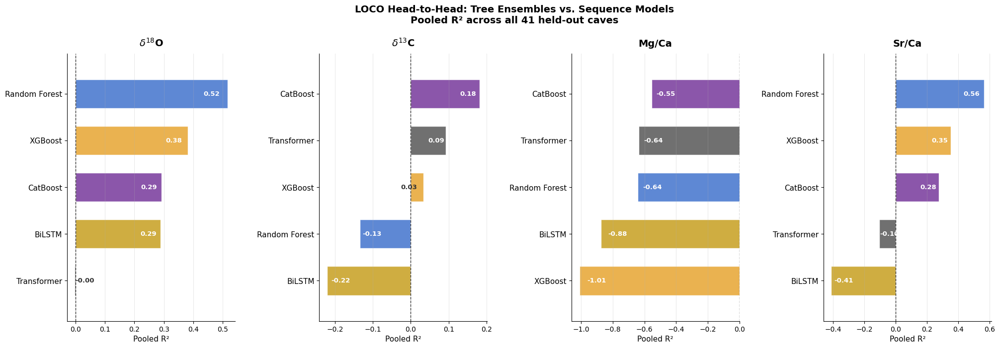

[OK] /content/fig9_dl_vs_tabular_loco_FINAL.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- LOCO head-to-head FINAL FIX: value labels inside bars, more margin ---
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pathlib import Path

base    = Path("/content/drive/MyDrive/SISALv3_Speleothem")
RUN_DIR = base / "artifacts" / "20260616T224121Z"
loco_m  = pd.read_csv(RUN_DIR / "metrics" / "loco_metrics_pooled.csv")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
M_CLR    = {"RandomForest":"#4878CF","XGBoost":"#E8A838","CatBoost":"#7B3F9E",
            "BiLSTM":"#C9A227","Transformer":"#5C5C5C"}
M_LBL    = {"RandomForest":"Random Forest","XGBoost":"XGBoost","CatBoost":"CatBoost",
            "BiLSTM":"BiLSTM","Transformer":"Transformer"}

fig, axes = plt.subplots(1, 4, figsize=(24, 7),
                         gridspec_kw={"wspace":0.5})
fig.suptitle(
    "LOCO Head-to-Head: Tree Ensembles vs. Sequence Models\n"
    "Pooled R² across all 41 held-out caves",
    fontsize=14, fontweight="bold", y=1.02
)

for ax, tgt, lbl in zip(axes, TARGETS, T_LABELS):
    sub    = loco_m[loco_m["target"]==tgt].sort_values("pooled_r2", ascending=True)
    models = sub["model"].tolist()
    r2s    = sub["pooled_r2"].tolist()
    clrs   = [M_CLR[m] for m in models]
    labels = [M_LBL[m] for m in models]

    y_pos = np.arange(len(models))
    bars  = ax.barh(y_pos, r2s, color=clrs, alpha=0.88,
                    edgecolor="white", height=0.62)

    # Model name labels on the LEFT — give plenty of room
    ax.set_yticks(y_pos)
    ax.set_yticklabels(labels, fontsize=11)

    ax.axvline(0, color="#333", linewidth=1, linestyle="--")
    ax.set_xlabel("Pooled R²", fontsize=11)
    ax.set_title(lbl, fontsize=14, fontweight="bold", pad=10)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="x", alpha=0.3, linewidth=0.7)

    # Value labels — ALWAYS inside the bar, away from the model name
    for bar, val in zip(bars, r2s):
        bar_w  = bar.get_width()
        bar_y  = bar.get_y() + bar.get_height() / 2

        if val >= 0:
            # Positive bar: label inside near the right end
            x_txt = bar_w - abs(bar_w) * 0.05 if bar_w > 0.05 else bar_w / 2
            ha    = "right"
            color = "white" if bar_w > 0.08 else "#333"
        else:
            # Negative bar: label inside near the left end
            x_txt = bar_w + abs(bar_w) * 0.05 if abs(bar_w) > 0.05 else bar_w / 2
            ha    = "left"
            color = "white" if abs(bar_w) > 0.08 else "#333"

        ax.text(x_txt, bar_y, f"{val:.2f}",
                va="center", ha=ha,
                fontsize=9.5, fontweight="bold", color=color)

    # Widen left margin so model names don't get clipped
    ax.margins(y=0.12)

plt.tight_layout()
out = "/content/fig9_dl_vs_tabular_loco_FINAL.png"
fig.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

/tmp/ipykernel_2309/1577234509.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


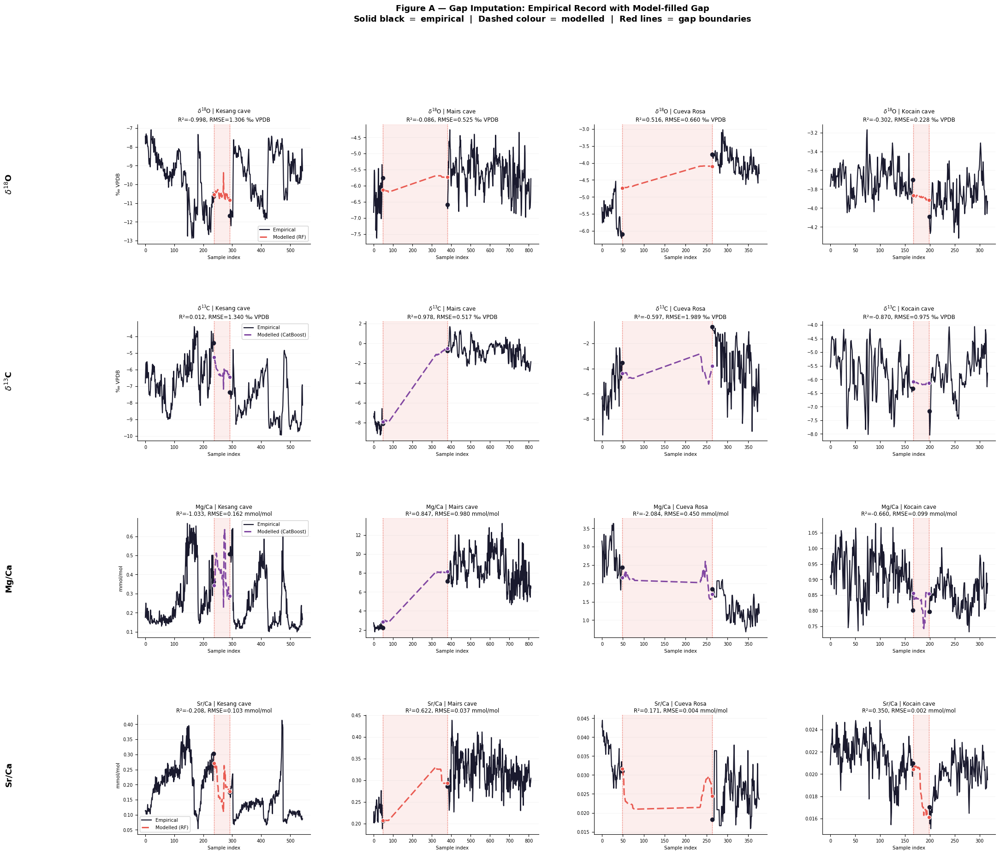

[OK] Figure A saved → /content/gap_imputation_figA.png


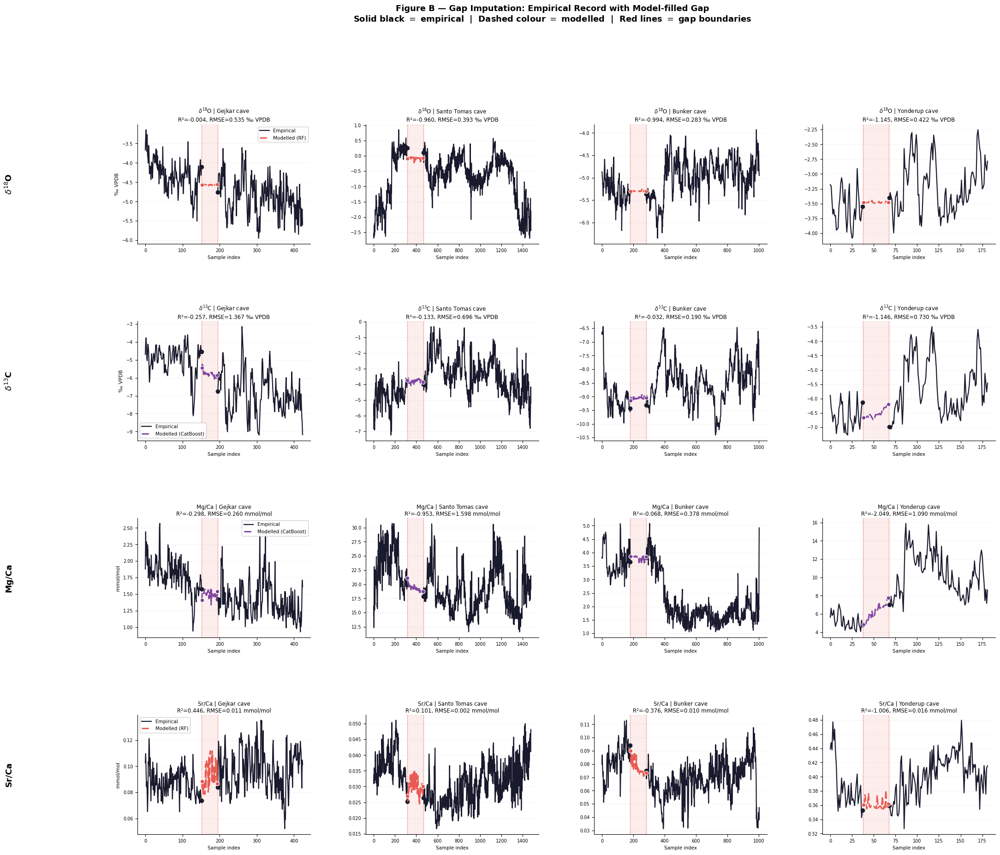

[OK] Figure B saved → /content/gap_imputation_figB.png

[OK] ZIP: /content/gap_imputation_extra_caves.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- 2 figures × 4 caves × 4 proxies ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zipfile
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED_DIR = base / "artifacts/20260612T233845Z/predictions_within"
master_table    = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = [r"$\delta^{18}$O", r"$\delta^{13}$C", "Mg/Ca", "Sr/Ca"]
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost"}

# Already used in previous figures — exclude these
ALREADY_USED = {
    "Savi cave","Kotumsar cave","Jersey cave","Bigonda cave",
    "Zoolithen cave","Lake Shasta cave","Closani cave",
    "Botuverá cave","Villars cave","Larga cave","Kinderlinskaya cave",
    "Abaco Island cave","Cobre cave","Labyrinth cave","La Vallina",
    "Pere Noel cave","Bunker cave","Liang Luar","Sa balma des quartó cave",
    "Dim cave","Gol-E-Zard cave","Naharon","Herbstlabyrinth cave"
}

# Figure A caves and Figure B caves (4 each, all new)
FIGURE_CAVES = [
    ["Kesang cave", "Mairs cave",    "Cueva Rosa",   "Kocain cave"],    # Fig A
    ["Gejkar cave", "Santo Tomas cave", "Bunker cave", "Yonderup cave"], # Fig B
]
FIG_TITLES = ["A", "B"]

within_preds = {}
for p in WITHIN_PRED_DIR.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

def get_cave_data(pred_df, tgt, site_name):
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]
    grp = master_table[master_table["site_name"]==site_name]
    if grp.empty or tgt not in grp.columns: return None
    grp      = grp.sort_values("sample_id").reset_index(drop=True)
    sids     = grp["sample_id"].values
    gap_mask = np.array([s in held_ids for s in sids])
    if not gap_mask.any(): return None
    y_all      = grp[tgt].values
    y_pred_gap = np.array([gap_pred.get(s,np.nan) for s in sids[gap_mask]])
    gap_idx    = np.where(gap_mask)[0]
    yt = y_all[gap_mask]; yp = y_pred_gap
    v  = ~np.isnan(yp)&~np.isnan(yt)
    if v.sum()<10: return None
    ss_res=np.sum((yt[v]-yp[v])**2); ss_tot=np.sum((yt[v]-yt[v].mean())**2)
    r2   = 1-ss_res/ss_tot if ss_tot>1e-12 else float("nan")
    rmse = float(np.sqrt(np.mean((yt[v]-yp[v])**2)))
    return {"y_all":y_all,"sids":sids,"gap_mask":gap_mask,
            "y_pred_gap":y_pred_gap,"gap_idx":gap_idx,"r2":r2,"rmse":rmse}

out_paths = []

for fig_idx, (cave_list, fig_lbl) in enumerate(zip(FIGURE_CAVES, FIG_TITLES)):

    fig, axes = plt.subplots(4, 4, figsize=(24, 20),
                             gridspec_kw={"hspace":0.65,"wspace":0.32})
    fig.suptitle(
        f"Figure {fig_lbl} — Gap Imputation: Empirical Record with Model-filled Gap\n"
        r"Solid black $=$ empirical  |  Dashed colour $=$ modelled  |  "
        r"Red lines $=$ gap boundaries",
        fontsize=13, fontweight="bold", y=1.01
    )

    for row, (tgt, tgt_lbl) in enumerate(zip(TARGETS, T_LABELS)):
        mdl     = BEST_MDL[tgt]
        pred_df = within_preds.get((mdl,tgt))
        if pred_df is None:
            for ax in axes[row]: ax.set_visible(False)
            continue
        pred_df = pred_df.sort_values("sample_id").reset_index(drop=True)

        for col, cave_name in enumerate(cave_list):
            ax   = axes[row][col]
            data = get_cave_data(pred_df, tgt, cave_name)

            if data is None:
                ax.text(0.5,0.5,"No data",ha="center",va="center",
                        transform=ax.transAxes,fontsize=9,color="#999")
                ax.set_title(f"{tgt_lbl} | {cave_name}\nn/a",fontsize=8.5)
                ax.spines[["top","right"]].set_visible(False)
                continue

            y_all      = data["y_all"]
            gap_mask   = data["gap_mask"]
            y_pred_gap = data["y_pred_gap"]
            gap_idx    = data["gap_idx"]
            gap_start  = gap_idx[0]; gap_end = gap_idx[-1]
            x_all      = np.arange(len(y_all))
            x_before   = x_all[:gap_start]; y_before = y_all[:gap_start]
            x_after    = x_all[gap_end+1:]; y_after  = y_all[gap_end+1:]

            # Gap shading + boundaries
            ax.axvspan(gap_start-0.5,gap_end+0.5,alpha=0.09,color="#E74C3C",zorder=1)
            ax.axvline(gap_start-0.5,color="#E74C3C",lw=1.0,ls=":",alpha=0.9,zorder=2)
            ax.axvline(gap_end+0.5,  color="#E74C3C",lw=1.0,ls=":",alpha=0.9,zorder=2)

            # Empirical (stops at gap)
            ax.plot(x_before,y_before,color="#1A1A2E",lw=1.6,zorder=4,label="Empirical")
            ax.plot(x_after, y_after, color="#1A1A2E",lw=1.6,zorder=4)

            # Entry/exit dots on empirical
            if len(y_before)>0:
                ax.scatter([gap_start-1],[y_before[-1]],
                           color="#1A1A2E",s=35,zorder=5)
            if len(y_after)>0:
                ax.scatter([gap_end+1],[y_after[0]],
                           color="#1A1A2E",s=35,zorder=5)

            # Model prediction
            valid = ~np.isnan(y_pred_gap)
            ax.plot(gap_idx[valid],y_pred_gap[valid],
                    color=M_CLR[mdl],lw=2.2,ls="--",dashes=(5,2),
                    alpha=0.95,zorder=5,
                    label=f"Modelled ({M_LBL[mdl]})")

            fv = np.where(valid)[0]
            if len(fv)>0:
                ax.scatter([gap_idx[fv[0]]],[y_pred_gap[fv[0]]],
                           color=M_CLR[mdl],s=38,zorder=6,
                           edgecolors="white",linewidths=0.9)
                ax.scatter([gap_idx[fv[-1]]],[y_pred_gap[fv[-1]]],
                           color=M_CLR[mdl],s=38,zorder=6,
                           edgecolors="white",linewidths=0.9)

            r2   = data["r2"]
            rmse = data["rmse"]
            ax.set_title(f"{tgt_lbl} | {cave_name}\n"
                         f"R²={r2:.3f}, RMSE={rmse:.3f} {T_UNITS[tgt]}",
                         fontsize=8.5, pad=4)
            ax.set_xlabel("Sample index",fontsize=7.5)
            ax.set_ylabel(T_UNITS[tgt] if col==0 else "",fontsize=8)
            ax.tick_params(labelsize=7)
            ax.spines[["top","right"]].set_visible(False)
            ax.grid(axis="y",alpha=0.2,linewidth=0.5)
            if col==0:
                ax.legend(fontsize=7.5,loc="best",framealpha=0.9)

        # Row label
        fig.text(
            0.005,
            axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
            tgt_lbl, va="center", ha="left",
            fontsize=13, fontweight="bold", rotation=90
        )

    plt.tight_layout()
    out = f"/content/gap_imputation_fig{fig_lbl}.png"
    fig.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    out_paths.append(out)
    print(f"[OK] Figure {fig_lbl} saved → {out}")

# Zip both
ZIP = Path("/content/gap_imputation_extra_caves.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for p in out_paths:
        zf.write(p, Path(p).name)
print(f"\n[OK] ZIP: {ZIP}")

from google.colab import files
files.download(str(ZIP))

In [ ]:
# --- Cross-fold variability: mean ± std across folds for all models/targets ---
import pandas as pd
import numpy as np
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
LOCO_DIR   = base / "artifacts/20260616T224121Z/metrics"
WITHIN_DIR = base / "artifacts/20260612T233845Z/metrics_within"

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LBL   = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}

# ── LOCO per-fold ──────────────────────────────────────────────────────────
loco_rows = []
for p in LOCO_DIR.glob("*_per_fold.csv"):
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    df = pd.read_csv(p)
    # per_fold CSVs have columns: cave_id, r2, rmse, mae etc.
    print(f"LOCO {name} {tgt}: {list(df.columns)}")
    break  # just check columns first

print()
# ── Within-cave per-fold ───────────────────────────────────────────────────
for p in WITHIN_DIR.glob("*_per_fold.csv"):
    df = pd.read_csv(p)
    print(f"Within {p.stem}: {list(df.columns)}")
    print(df.head(3).to_string())
    break

LOCO RandomForest d18O_measurement: ['n', 'r2', 'mae', 'rmse', 'mdae', 'ks_d', 'calibration_slope', 'calibration_intercept', 'fold', 'model', 'target', 'site_id', 'site_name']

Within RandomForest_d18O_measurement_per_fold: ['n', 'r2', 'mae', 'rmse', 'mdae', 'ks_d', 'calibration_slope', 'calibration_intercept', 'fold', 'model', 'target', 'entity_id', 'site_name']
    n        r2       mae      rmse      mdae      ks_d  calibration_slope  calibration_intercept  fold         model            target  entity_id     site_name
0  55 -0.998396  1.141395  1.305879  1.002355  0.781818          -0.351217             -15.117699     0  RandomForest  d18O_measurement         17   Kesang cave
1  30  0.044164  0.341491  0.476427  0.293599  0.400000           2.360749               5.813276     1  RandomForest  d18O_measurement         32  Villars cave
2  30 -1.436615  0.583788  0.698878  0.522284  0.833333           0.353647              -4.513611     2  RandomForest  d18O_measurement        101    M

In [ ]:
# --- Check production models are accessible ---
from pathlib import Path
import joblib

MODELS_DIR = Path("/content/drive/MyDrive/SISALv3_Speleothem/webapp/models")
models = sorted(MODELS_DIR.glob("RandomForest_*.joblib"))
print(f"Found {len(models)} RF models:")
for p in models:
    print(f"  {p.name} ({p.stat().st_size/1e6:.1f} MB)")

Found 4 RF models:
  RandomForest_Mg_Ca_measurement.joblib (4.4 MB)
  RandomForest_Sr_Ca_measurement.joblib (22.8 MB)
  RandomForest_d13C_measurement.joblib (12.2 MB)
  RandomForest_d18O_measurement.joblib (4.8 MB)


In [ ]:
# --- Cross-fold variability: MEDIAN + IQR (robust to outlier folds) ---
import pandas as pd
import numpy as np
from pathlib import Path

base       = Path("/content/drive/MyDrive/SISALv3_Speleothem")
LOCO_DIR   = base / "artifacts/20260616T224121Z/metrics"
WITHIN_DIR = base / "artifacts/20260612T233845Z/metrics_within"

T_LBL = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
          "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}

def summarise_folds_robust(fold_dir, protocol):
    rows = []
    for p in sorted(fold_dir.glob("*_per_fold.csv")):
        name, tgt = p.stem.replace("_per_fold","").split("_",1)
        df = pd.read_csv(p)
        for metric in ["r2","rmse","mae"]:
            vals = df[metric].dropna()
            # Winsorise at 5th/95th percentile to remove catastrophic outlier folds
            p5, p95 = vals.quantile(0.05), vals.quantile(0.95)
            vals_w  = vals.clip(lower=p5, upper=p95)
            rows.append({
                "protocol":  protocol,
                "model":     name,
                "target":    tgt,
                "metric":    metric,
                "n_folds":   len(vals),
                "pooled":    None,  # will fill from pooled CSV
                "median":    round(vals.median(), 4),
                "q25":       round(vals.quantile(0.25), 4),
                "q75":       round(vals.quantile(0.75), 4),
                "mean_w":    round(vals_w.mean(), 4),   # winsorised mean
                "std_w":     round(vals_w.std(), 4),    # winsorised std
                "min":       round(vals.min(), 4),
                "max":       round(vals.max(), 4),
                "pct_positive": round((vals > 0).mean() * 100, 1) if metric=="r2" else None,
            })
    return pd.DataFrame(rows)

loco_stats   = summarise_folds_robust(LOCO_DIR,   "LOCO")
within_stats = summarise_folds_robust(WITHIN_DIR, "Within-cave")
all_stats    = pd.concat([loco_stats, within_stats], ignore_index=True)

# Add pooled R² from pooled CSVs
loco_pooled   = pd.read_csv(base/"artifacts/20260616T224121Z/metrics/loco_metrics_pooled.csv")
within_pooled = pd.read_csv(base/"artifacts/20260612T233845Z/metrics_within/within_metrics_pooled.csv")

# Print clean summary table
print("="*90)
print("WITHIN-CAVE: Pooled R² vs. per-fold median R² [Q25, Q75] | % folds with R²>0")
print("="*90)
sub = all_stats[(all_stats["protocol"]=="Within-cave") & (all_stats["metric"]=="r2")]
wp  = within_pooled.set_index(["model","target"])

for tgt in ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]:
    print(f"\n  {T_LBL[tgt]}")
    t = sub[sub["target"]==tgt].copy()
    for _, row in t.iterrows():
        try:
            pooled = wp.loc[(row["model"],tgt),"pooled_r2"]
        except:
            pooled = float("nan")
        print(f"    {row['model']:<15} "
              f"Pooled R²={pooled:>7.3f} | "
              f"Per-fold median={row['median']:>7.3f} "
              f"[{row['q25']:.3f}, {row['q75']:.3f}] | "
              f"{row['pct_positive']:.0f}% folds R²>0")

print()
print("="*90)
print("LOCO: Pooled R² vs. per-fold median R² [Q25, Q75] | % folds with R²>0")
print("="*90)
sub2 = all_stats[(all_stats["protocol"]=="LOCO") & (all_stats["metric"]=="r2")]
lp   = loco_pooled.set_index(["model","target"])

for tgt in ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]:
    print(f"\n  {T_LBL[tgt]}")
    t = sub2[sub2["target"]==tgt].copy()
    for _, row in t.iterrows():
        try:
            pooled = lp.loc[(row["model"],tgt),"pooled_r2"]
        except:
            pooled = float("nan")
        print(f"    {row['model']:<15} "
              f"Pooled R²={pooled:>7.3f} | "
              f"Per-fold median={row['median']:>7.3f} "
              f"[{row['q25']:.3f}, {row['q75']:.3f}] | "
              f"{row['pct_positive']:.0f}% folds R²>0")

all_stats.to_csv("/content/fold_variability_robust.csv", index=False)
print("\n[OK] Saved → /content/fold_variability_robust.csv")

WITHIN-CAVE: Pooled R² vs. per-fold median R² [Q25, Q75] | % folds with R²>0

  δ¹⁸O
    CatBoost        Pooled R²=  0.977 | Per-fold median= -0.279 [-0.944, 0.011] | 28% folds R²>0
    RandomForest    Pooled R²=  0.971 | Per-fold median= -0.506 [-1.664, -0.026] | 20% folds R²>0
    XGBoost         Pooled R²=  0.974 | Per-fold median= -0.337 [-0.785, 0.012] | 26% folds R²>0

  δ¹³C
    CatBoost        Pooled R²=  0.917 | Per-fold median= -0.487 [-1.176, -0.174] | 9% folds R²>0
    RandomForest    Pooled R²=  0.913 | Per-fold median= -0.613 [-1.712, -0.165] | 6% folds R²>0
    XGBoost         Pooled R²=  0.906 | Per-fold median= -0.578 [-1.042, -0.243] | 13% folds R²>0

  Mg/Ca
    CatBoost        Pooled R²=  0.958 | Per-fold median= -0.914 [-4.123, -0.076] | 22% folds R²>0
    RandomForest    Pooled R²=  0.925 | Per-fold median= -1.413 [-4.829, -0.257] | 11% folds R²>0
    XGBoost         Pooled R²=  0.941 | Per-fold median= -0.372 [-1.571, -0.063] | 24% folds R²>0

  Sr/Ca
    CatBoos

[OK] Models loaded


/tmp/ipykernel_1035/2882685847.py:157: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


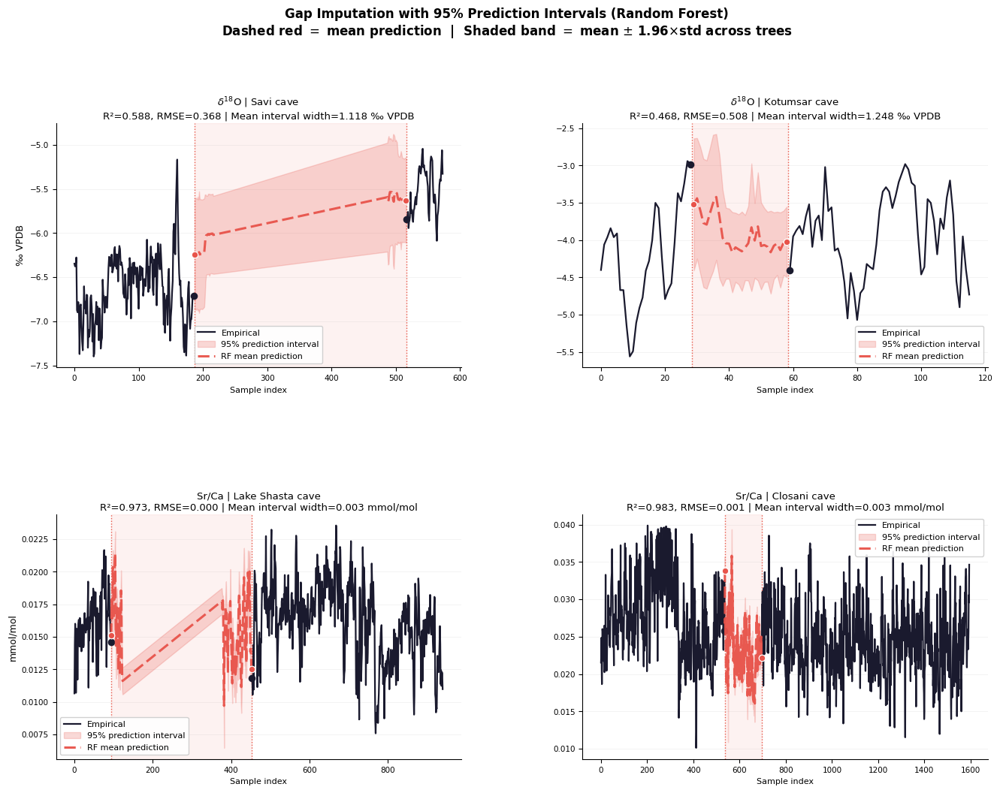

[OK] /content/gap_fill_uncertainty_bands.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- RF prediction intervals — fixed: define CorrelationDropper first ---
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin

# MUST define CorrelationDropper before loading joblib
class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool)
            return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
MODELS_DIR   = base / "webapp/models"
WITHIN_PRED  = base / "artifacts/20260612T233845Z/predictions_within"
master_table = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

# Load RF models
rf_d18O = joblib.load(MODELS_DIR / "RandomForest_d18O_measurement.joblib")
rf_srca  = joblib.load(MODELS_DIR / "RandomForest_Sr_Ca_measurement.joblib")
RF_MODELS = {"d18O_measurement": rf_d18O, "Sr_Ca_measurement": rf_srca}
print("[OK] Models loaded")

TARGETS_RF = ["d18O_measurement", "Sr_Ca_measurement"]
T_LABELS   = {"d18O_measurement": r"$\delta^{18}$O", "Sr_Ca_measurement": "Sr/Ca"}
T_UNITS    = {"d18O_measurement": "‰ VPDB", "Sr_Ca_measurement": "mmol/mol"}

SELECTED = {
    "d18O_measurement":  ["Savi cave", "Kotumsar cave"],
    "Sr_Ca_measurement": ["Lake Shasta cave", "Closani cave"],
}

within_preds = {}
for p in WITHIN_PRED.glob("RandomForest_*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

EXCL = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
        "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
        "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

def get_tree_preds(rf_pipeline, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    preproc = rf_pipeline.named_steps["preprocess"]
    X_trans = preproc.transform(X_clean)
    rf_est  = rf_pipeline.named_steps["estimator"]
    all_preds = np.array([tree.predict(X_trans) for tree in rf_est.estimators_])
    return all_preds.mean(axis=0), all_preds.std(axis=0)

fig, axes = plt.subplots(2, 2, figsize=(16, 11),
                          gridspec_kw={"hspace":0.6,"wspace":0.30})
fig.suptitle(
    "Gap Imputation with 95% Prediction Intervals (Random Forest)\n"
    r"Dashed red $=$ mean prediction  |  "
    r"Shaded band $=$ mean $\pm$ 1.96$\times$std across trees",
    fontsize=12, fontweight="bold", y=1.02
)

for row, tgt in enumerate(TARGETS_RF):
    pred_df  = within_preds.get(("RandomForest", tgt))
    if pred_df is None: continue
    held_ids = set(pred_df["sample_id"].values)
    rf_pipe  = RF_MODELS[tgt]

    for col, cave_name in enumerate(SELECTED[tgt]):
        ax = axes[row][col]
        grp = master_table[master_table["site_name"]==cave_name]
        if grp.empty: ax.set_visible(False); continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gap_mask  = np.array([s in held_ids for s in sids])
        if not gap_mask.any(): ax.set_visible(False); continue

        y_all     = grp[tgt].values
        x_all     = np.arange(len(grp))
        gap_idx   = np.where(gap_mask)[0]
        gap_start = gap_idx[0]; gap_end = gap_idx[-1]

        X_gap = grp.iloc[gap_idx]
        mean_pred, std_pred = get_tree_preds(rf_pipe, X_gap)
        lower = mean_pred - 1.96 * std_pred
        upper = mean_pred + 1.96 * std_pred

        x_before = x_all[:gap_start]; y_before = y_all[:gap_start]
        x_after  = x_all[gap_end+1:]; y_after  = y_all[gap_end+1:]

        # Gap shading
        ax.axvspan(gap_start-0.5, gap_end+0.5, alpha=0.07, color="#E74C3C", zorder=1)
        ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0, ls=":", alpha=0.9, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0, ls=":", alpha=0.9, zorder=2)

        # Empirical
        ax.plot(x_before, y_before, color="#1A1A2E", lw=1.6, zorder=4, label="Empirical")
        ax.plot(x_after,  y_after,  color="#1A1A2E", lw=1.6, zorder=4)
        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]], color="#1A1A2E", s=35, zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],     color="#1A1A2E", s=35, zorder=5)

        # Mean prediction + uncertainty band
        ax.fill_between(gap_idx, lower, upper,
                        color="#E8534A", alpha=0.22, zorder=3,
                        label="95% prediction interval")
        ax.plot(gap_idx, mean_pred, color="#E8534A", lw=2.2,
                ls="--", dashes=(5,2), alpha=0.95, zorder=5,
                label="RF mean prediction")
        ax.scatter([gap_idx[0]],  [mean_pred[0]],
                   color="#E8534A", s=38, zorder=6, edgecolors="white", lw=0.9)
        ax.scatter([gap_idx[-1]], [mean_pred[-1]],
                   color="#E8534A", s=38, zorder=6, edgecolors="white", lw=0.9)

        # Metrics
        yt = y_all[gap_mask]
        v  = ~np.isnan(mean_pred) & ~np.isnan(yt)
        ss_res = np.sum((yt[v]-mean_pred[v])**2)
        ss_tot = np.sum((yt[v]-yt[v].mean())**2)
        r2   = 1-ss_res/ss_tot if ss_tot>1e-12 else float("nan")
        rmse = float(np.sqrt(np.mean((yt[v]-mean_pred[v])**2)))
        width = float((upper-lower).mean())

        ax.set_title(f"{T_LABELS[tgt]} | {cave_name}\n"
                     f"R²={r2:.3f}, RMSE={rmse:.3f} | "
                     f"Mean interval width={width:.3f} {T_UNITS[tgt]}",
                     fontsize=9.5, pad=4)
        ax.set_xlabel("Sample index", fontsize=8)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=9)
        ax.tick_params(labelsize=7.5)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        ax.legend(fontsize=8, loc="best", framealpha=0.9)

plt.tight_layout()
out = "/content/gap_fill_uncertainty_bands.png"
fig.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")
from google.colab import files
files.download(out)

In [ ]:
# --- Final: per-fold RMSE stats for the tables (stable, no division issues) ---
import pandas as pd
import numpy as np
from pathlib import Path

base       = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_DIR = base / "artifacts/20260612T233845Z/metrics_within"
within_pooled = pd.read_csv(WITHIN_DIR / "within_metrics_pooled.csv")

T_LBL = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
          "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS = {"d18O_measurement":"‰","d13C_measurement":"‰",
           "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}

print("WITHIN-CAVE: Per-fold RMSE distribution (median [Q25, Q75])")
print("Pooled R² and pooled RMSE are the primary metrics.")
print("Per-fold RMSE shows variability across cave entities.\n")

rows = []
for p in sorted(WITHIN_DIR.glob("*_per_fold.csv")):
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    df = pd.read_csv(p)
    rmse_vals = df["rmse"].dropna()
    mae_vals  = df["mae"].dropna()
    pool_row  = within_pooled[(within_pooled["model"]==name) &
                              (within_pooled["target"]==tgt)]
    if pool_row.empty: continue
    rows.append({
        "proxy":          T_LBL[tgt],
        "model":          name,
        "pooled_r2":      round(float(pool_row["pooled_r2"]),3),
        "pooled_rmse":    round(float(pool_row["pooled_rmse"]),3),
        "rmse_median":    round(rmse_vals.median(),3),
        "rmse_q25":       round(rmse_vals.quantile(0.25),3),
        "rmse_q75":       round(rmse_vals.quantile(0.75),3),
        "rmse_min":       round(rmse_vals.min(),3),
        "rmse_max":       round(rmse_vals.max(),3),
        "units":          T_UNITS[tgt],
    })

df_out = pd.DataFrame(rows)

# Print nicely
for tgt in ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]:
    tgt_rows = df_out[df_out["proxy"]==T_LBL[tgt]].sort_values("pooled_rmse")
    print(f"  {T_LBL[tgt]} ({T_UNITS[tgt]})")
    for _, r in tgt_rows.iterrows():
        print(f"    {r['model']:<15} "
              f"Pooled R²={r['pooled_r2']:>6.3f}  "
              f"Pooled RMSE={r['pooled_rmse']:>6.3f}  "
              f"Per-fold RMSE: median={r['rmse_median']:.3f} "
              f"[Q25={r['rmse_q25']:.3f}, Q75={r['rmse_q75']:.3f}]  "
              f"range=[{r['rmse_min']:.3f}, {r['rmse_max']:.3f}]")
    print()

df_out.to_csv("/content/within_cave_rmse_variability.csv", index=False)
print("[OK] Saved → /content/within_cave_rmse_variability.csv")
from google.colab import files
files.download("/content/within_cave_rmse_variability.csv")

WITHIN-CAVE: Per-fold RMSE distribution (median [Q25, Q75])
Pooled R² and pooled RMSE are the primary metrics.
Per-fold RMSE shows variability across cave entities.

  δ¹⁸O (‰)
    CatBoost        Pooled R²= 0.977  Pooled RMSE= 0.449  Per-fold RMSE: median=0.397 [Q25=0.260, Q75=0.517]  range=[0.133, 0.983]
    XGBoost         Pooled R²= 0.974  Pooled RMSE= 0.481  Per-fold RMSE: median=0.363 [Q25=0.265, Q75=0.528]  range=[0.109, 1.210]
    RandomForest    Pooled R²= 0.971  Pooled RMSE= 0.510  Per-fold RMSE: median=0.486 [Q25=0.284, Q75=0.562]  range=[0.105, 1.306]

  δ¹³C (‰)
    CatBoost        Pooled R²= 0.917  Pooled RMSE= 0.888  Per-fold RMSE: median=0.675 [Q25=0.473, Q75=0.966]  range=[0.190, 2.886]
    RandomForest    Pooled R²= 0.913  Pooled RMSE= 0.907  Per-fold RMSE: median=0.694 [Q25=0.470, Q75=0.999]  range=[0.224, 3.157]
    XGBoost         Pooled R²= 0.906  Pooled RMSE= 0.945  Per-fold RMSE: median=0.633 [Q25=0.459, Q75=0.979]  range=[0.197, 3.422]

  Mg/Ca (mmol/mol)
    C

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Per-fold files loaded:
  Within-cave: 12 (model,target) pairs
  LOCO:        20 (model,target) pairs

OPTION A — Per-fold median R² + IQR (best model per target)

  δ¹⁸O (CatBoost)
    Pooled R²=0.977  |  Per-fold median R²=-0.279 [-0.944, 0.011]  |  28% folds R²>0
    Pooled RMSE=0.4488  |  Per-fold median RMSE=0.3967 [0.2598, 0.5167] ‰
    Per-fold median MAE=0.3521 ‰

  δ¹³C (CatBoost)
    Pooled R²=0.917  |  Per-fold median R²=-0.487 [-1.176, -0.174]  |  9% folds R²>0
    Pooled RMSE=0.8876  |  Per-fold median RMSE=0.6745 [0.4726, 0.9657] ‰
    Per-fold median MAE=0.5422 ‰

  Mg/Ca (CatBoost)
    Pooled R²=0.958  |  Per-fold median R²=-0.914 [-4.123, -0.076]  |  22% folds R²>0
    Pooled RMSE=1.8390  |  Per-fold median RMSE=0.8511 [0.2322, 1.6473] mmol/mol
    Per-fold median MAE=0.6867 mmol/mol

  Sr/Ca (XGBoost)
    Pooled R²=0.987  |  Per-fold median R²=-0.035 [-0.825, 0.448]  |  48% folds R²>0
    Pooled RMSE=0.0583  |  Per-fold median RMSE=0.0085 [0.0032, 0.0188] mmol/mol
    

/tmp/ipykernel_1300/1324346688.py:191: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


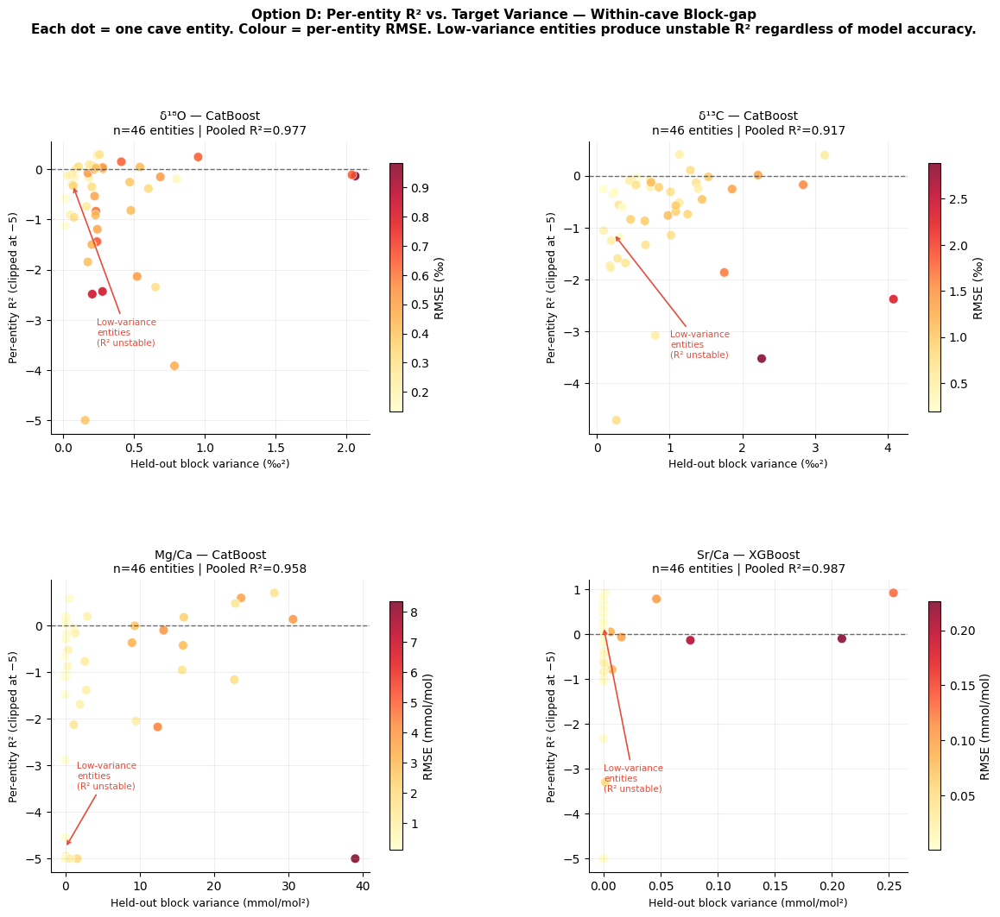

[OK] Option D figure → /content/optD_variance_vs_r2_scatter.png


/tmp/ipykernel_1300/1324346688.py:274: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


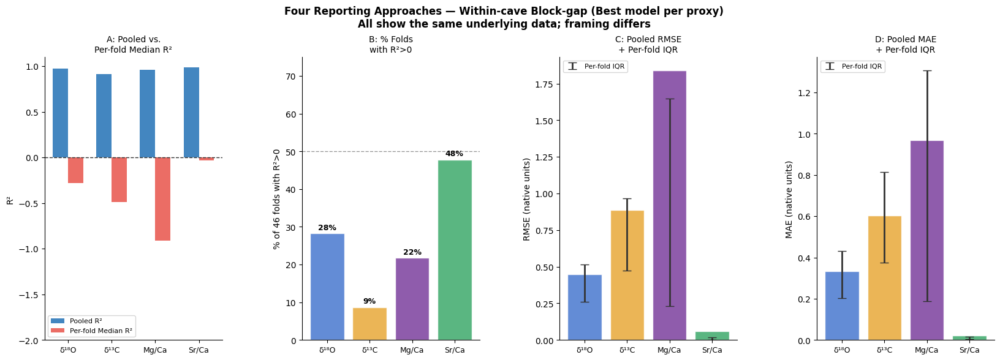

[OK] Summary comparison figure → /content/all_four_options_comparison.png

[OK] ZIP: /content/reporting_options.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Complete uncertainty and reporting analysis ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from scipy import stats as scipy_stats

base       = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_DIR = base / "artifacts/20260612T233845Z/metrics_within"
LOCO_DIR   = base / "artifacts/20260616T224121Z/metrics"
master     = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

within_pooled = pd.read_csv(WITHIN_DIR / "within_metrics_pooled.csv")
loco_pooled   = pd.read_csv(LOCO_DIR   / "loco_metrics_pooled.csv")

T_LBL  = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
           "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS= {"d18O_measurement":"‰","d13C_measurement":"‰",
           "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
TARGETS= ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
BEST_MDL={"d18O_measurement":"CatBoost","d13C_measurement":"CatBoost",
           "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}
M_CLR  = {"RandomForest":"#4878CF","XGBoost":"#E8A838","CatBoost":"#7B3F9E"}

# ── Load all per-fold data ────────────────────────────────────────────────
within_folds = {}
for p in WITHIN_DIR.glob("*_per_fold.csv"):
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    within_folds[(name,tgt)] = pd.read_csv(p)

loco_folds = {}
for p in LOCO_DIR.glob("*_per_fold.csv"):
    name, tgt = p.stem.replace("_per_fold","").split("_",1)
    loco_folds[(name,tgt)] = pd.read_csv(p)

print("Per-fold files loaded:")
print(f"  Within-cave: {len(within_folds)} (model,target) pairs")
print(f"  LOCO:        {len(loco_folds)} (model,target) pairs")

# ══════════════════════════════════════════════════════════════════════════
# OPTION A: Per-fold median R² + IQR as PRIMARY metric
# ══════════════════════════════════════════════════════════════════════════
print("\n" + "="*70)
print("OPTION A — Per-fold median R² + IQR (best model per target)")
print("="*70)

optA_rows = []
for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    df  = within_folds.get((mdl,tgt), pd.DataFrame())
    if df.empty: continue
    r2s  = df["r2"].dropna()
    rmses= df["rmse"].dropna()
    maes = df["mae"].dropna()
    pool = within_pooled[(within_pooled["model"]==mdl)&(within_pooled["target"]==tgt)]
    pooled_r2   = float(pool["pooled_r2"].values[0]) if len(pool) else np.nan
    pooled_rmse = float(pool["pooled_rmse"].values[0]) if len(pool) else np.nan

    row = {
        "Proxy": T_LBL[tgt], "Model": mdl,
        "Pooled R²": round(pooled_r2,3),
        "Per-fold R² Median": round(r2s.median(),3),
        "Per-fold R² Q25":    round(r2s.quantile(0.25),3),
        "Per-fold R² Q75":    round(r2s.quantile(0.75),3),
        "% folds R²>0":       round((r2s>0).mean()*100,1),
        "Pooled RMSE":        round(pooled_rmse,4),
        "Per-fold RMSE Med":  round(rmses.median(),4),
        "Per-fold MAE Med":   round(maes.median(),4),
        "Unit":               T_UNITS[tgt],
    }
    optA_rows.append(row)
    print(f"\n  {T_LBL[tgt]} ({mdl})")
    print(f"    Pooled R²={pooled_r2:.3f}  |  Per-fold median R²={r2s.median():.3f} "
          f"[{r2s.quantile(0.25):.3f}, {r2s.quantile(0.75):.3f}]  |  {(r2s>0).mean()*100:.0f}% folds R²>0")
    print(f"    Pooled RMSE={pooled_rmse:.4f}  |  Per-fold median RMSE={rmses.median():.4f} "
          f"[{rmses.quantile(0.25):.4f}, {rmses.quantile(0.75):.4f}] {T_UNITS[tgt]}")
    print(f"    Per-fold median MAE={maes.median():.4f} {T_UNITS[tgt]}")

optA_df = pd.DataFrame(optA_rows)
optA_df.to_csv("/content/optA_per_fold_primary.csv", index=False)

# ══════════════════════════════════════════════════════════════════════════
# OPTION B: Pooled R² as primary, with explanation + per-fold RMSE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + "="*70)
print("OPTION B — Pooled R² primary + per-fold RMSE variability")
print("="*70)
# Already done above — just confirm pooled numbers are consistent
for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    pool = within_pooled[(within_pooled["model"]==mdl)&(within_pooled["target"]==tgt)]
    if len(pool):
        print(f"  {T_LBL[tgt]}: Pooled R²={float(pool['pooled_r2']):.3f}  "
              f"Pooled RMSE={float(pool['pooled_rmse']):.4f} {T_UNITS[tgt]}")

# ══════════════════════════════════════════════════════════════════════════
# OPTION C: MAE/RMSE as PRIMARY — proxy-interpretable units
# ══════════════════════════════════════════════════════════════════════════
print("\n" + "="*70)
print("OPTION C — RMSE and MAE as primary metrics (native proxy units)")
print("R² as secondary only")
print("="*70)
optC_rows = []
for tgt in TARGETS:
    for mdl in ["CatBoost","XGBoost","RandomForest"]:
        df = within_folds.get((mdl,tgt), pd.DataFrame())
        if df.empty: continue
        pool = within_pooled[(within_pooled["model"]==mdl)&(within_pooled["target"]==tgt)]
        if pool.empty: continue
        rmses = df["rmse"].dropna()
        maes  = df["mae"].dropna()
        optC_rows.append({
            "Proxy": T_LBL[tgt], "Model": mdl,
            "Pooled RMSE": round(float(pool["pooled_rmse"]),4),
            "Pooled MAE":  round(float(pool["pooled_mae"]),4),
            "RMSE Median": round(rmses.median(),4),
            "RMSE Q25":    round(rmses.quantile(0.25),4),
            "RMSE Q75":    round(rmses.quantile(0.75),4),
            "MAE Median":  round(maes.median(),4),
            "MAE Q25":     round(maes.quantile(0.25),4),
            "MAE Q75":     round(maes.quantile(0.75),4),
            "Pooled R²":   round(float(pool["pooled_r2"]),3),
            "Unit":        T_UNITS[tgt],
        })

optC_df = pd.DataFrame(optC_rows)
print(optC_df[["Proxy","Model","Pooled RMSE","RMSE Median","RMSE Q25","RMSE Q75",
               "Pooled MAE","MAE Median","Unit"]].to_string(index=False))
optC_df.to_csv("/content/optC_rmse_mae_primary.csv", index=False)

# ══════════════════════════════════════════════════════════════════════════
# OPTION D: Per-entity scatter — variance vs R², coloured by RMSE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + "="*70)
print("OPTION D — Per-entity scatter: variance vs R² (Figure)")
print("="*70)

fig, axes = plt.subplots(2, 2, figsize=(14, 11),
                          gridspec_kw={"hspace":0.5,"wspace":0.35})
fig.suptitle(
    "Option D: Per-entity R² vs. Target Variance — Within-cave Block-gap\n"
    "Each dot = one cave entity. Colour = per-entity RMSE. "
    "Low-variance entities produce unstable R² regardless of model accuracy.",
    fontsize=11, fontweight="bold", y=1.02
)

for ax, tgt, lbl in zip(axes.flat, TARGETS, [T_LBL[t] for t in TARGETS]):
    mdl = BEST_MDL[tgt]
    df  = within_folds.get((mdl,tgt), pd.DataFrame())
    if df.empty: continue

    # Get per-entity variance from master_table
    variances = []
    for _, row in df.iterrows():
        eid   = row.get("entity_id", None)
        if eid is None: variances.append(np.nan); continue
        ent   = master[(master["entity_id"]==eid) & master[tgt].notna()]
        variances.append(float(ent[tgt].var()) if len(ent)>1 else np.nan)

    df = df.copy()
    df["variance"] = variances
    df_clean = df.dropna(subset=["variance","r2","rmse"])

    # Clip R² for display
    r2_display = df_clean["r2"].clip(lower=-5, upper=1.0)

    sc = ax.scatter(df_clean["variance"], r2_display,
                    c=df_clean["rmse"], cmap="YlOrRd",
                    s=60, alpha=0.85, edgecolors="white", linewidths=0.5)

    ax.axhline(0, color="#333", lw=1, ls="--", alpha=0.7)
    ax.set_xlabel(f"Held-out block variance ({T_UNITS[tgt]}²)", fontsize=9)
    ax.set_ylabel("Per-entity R² (clipped at −5)", fontsize=9)
    ax.set_title(f"{lbl} — {mdl}\n"
                 f"n={len(df_clean)} entities | "
                 f"Pooled R²={within_pooled[(within_pooled['model']==mdl)&(within_pooled['target']==tgt)]['pooled_r2'].values[0]:.3f}",
                 fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(alpha=0.2)
    plt.colorbar(sc, ax=ax, label=f"RMSE ({T_UNITS[tgt]})", shrink=0.85)

    # Annotate: low variance = unstable R²
    low_var = df_clean[df_clean["variance"] < df_clean["variance"].quantile(0.25)]
    ax.annotate("Low-variance\nentities\n(R² unstable)",
                xy=(low_var["variance"].median(), low_var["r2"].clip(-5,1).median()),
                xytext=(df_clean["variance"].quantile(0.6), -3.5),
                fontsize=7.5, color="#E74C3C",
                arrowprops=dict(arrowstyle="->", color="#E74C3C", lw=1.2))

plt.tight_layout()
out_d = "/content/optD_variance_vs_r2_scatter.png"
fig.savefig(out_d, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Option D figure → {out_d}")

# ══════════════════════════════════════════════════════════════════════════
# SUMMARY FIGURE: All 4 options side by side comparison
# ══════════════════════════════════════════════════════════════════════════
fig2, axes2 = plt.subplots(1, 4, figsize=(20, 6),
                            gridspec_kw={"wspace":0.45})
fig2.suptitle(
    "Four Reporting Approaches — Within-cave Block-gap (Best model per proxy)\n"
    "All show the same underlying data; framing differs",
    fontsize=12, fontweight="bold", y=1.02
)

colors_proxy = ["#4878CF","#E8A838","#7B3F9E","#3DAA6B"]

# A: Pooled vs per-fold median R²
ax = axes2[0]
x  = np.arange(4)
w  = 0.35
pooled_r2s = [float(within_pooled[(within_pooled["model"]==BEST_MDL[t])&
               (within_pooled["target"]==t)]["pooled_r2"]) for t in TARGETS]
median_r2s = [within_folds[(BEST_MDL[t],t)]["r2"].median() for t in TARGETS]
ax.bar(x-w/2, pooled_r2s,  w, label="Pooled R²",        color="#2271B5", alpha=0.85)
ax.bar(x+w/2, median_r2s,  w, label="Per-fold Median R²",color="#E8534A", alpha=0.85)
ax.axhline(0, color="#333", lw=1, ls="--")
ax.set_xticks(x); ax.set_xticklabels([T_LBL[t] for t in TARGETS], fontsize=9)
ax.set_ylabel("R²"); ax.set_title("A: Pooled vs.\nPer-fold Median R²", fontsize=10)
ax.legend(fontsize=8); ax.spines[["top","right"]].set_visible(False)
ax.set_ylim(-2, 1.1)

# B: % folds with R²>0
ax = axes2[1]
pct_pos = [(within_folds[(BEST_MDL[t],t)]["r2"]>0).mean()*100 for t in TARGETS]
bars = ax.bar(x, pct_pos, color=colors_proxy, alpha=0.85, edgecolor="white")
ax.axhline(50, color="#333", lw=1, ls="--", alpha=0.5)
for bar, pct in zip(bars, pct_pos):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
            f"{pct:.0f}%", ha="center", fontsize=9, fontweight="bold")
ax.set_xticks(x); ax.set_xticklabels([T_LBL[t] for t in TARGETS], fontsize=9)
ax.set_ylabel("% of 46 folds with R²>0")
ax.set_title("B: % Folds\nwith R²>0", fontsize=10)
ax.spines[["top","right"]].set_visible(False)
ax.set_ylim(0,75)

# C: Pooled RMSE with per-fold IQR
ax = axes2[2]
pooled_rmses = [float(within_pooled[(within_pooled["model"]==BEST_MDL[t])&
                (within_pooled["target"]==t)]["pooled_rmse"]) for t in TARGETS]
rmse_q25 = [within_folds[(BEST_MDL[t],t)]["rmse"].quantile(0.25) for t in TARGETS]
rmse_q75 = [within_folds[(BEST_MDL[t],t)]["rmse"].quantile(0.75) for t in TARGETS]
rmse_med = [within_folds[(BEST_MDL[t],t)]["rmse"].median() for t in TARGETS]
bars = ax.bar(x, pooled_rmses, color=colors_proxy, alpha=0.85, edgecolor="white")
ax.errorbar(x, rmse_med,
            yerr=[np.array(rmse_med)-np.array(rmse_q25),
                  np.array(rmse_q75)-np.array(rmse_med)],
            fmt="none", color="#333", capsize=5, lw=2, label="Per-fold IQR")
ax.set_xticks(x); ax.set_xticklabels([T_LBL[t] for t in TARGETS], fontsize=9)
ax.set_ylabel("RMSE (native units)")
ax.set_title("C: Pooled RMSE\n+ Per-fold IQR", fontsize=10)
ax.legend(fontsize=8); ax.spines[["top","right"]].set_visible(False)
ax.set_ylim(0, None)

# D: Pooled MAE
ax = axes2[3]
pooled_maes = [float(within_pooled[(within_pooled["model"]==BEST_MDL[t])&
               (within_pooled["target"]==t)]["pooled_mae"]) for t in TARGETS]
mae_med = [within_folds[(BEST_MDL[t],t)]["mae"].median() for t in TARGETS]
mae_q25 = [within_folds[(BEST_MDL[t],t)]["mae"].quantile(0.25) for t in TARGETS]
mae_q75 = [within_folds[(BEST_MDL[t],t)]["mae"].quantile(0.75) for t in TARGETS]
bars = ax.bar(x, pooled_maes, color=colors_proxy, alpha=0.85, edgecolor="white")
ax.errorbar(x, mae_med,
            yerr=[np.array(mae_med)-np.array(mae_q25),
                  np.array(mae_q75)-np.array(mae_med)],
            fmt="none", color="#333", capsize=5, lw=2, label="Per-fold IQR")
ax.set_xticks(x); ax.set_xticklabels([T_LBL[t] for t in TARGETS], fontsize=9)
ax.set_ylabel("MAE (native units)")
ax.set_title("D: Pooled MAE\n+ Per-fold IQR", fontsize=10)
ax.legend(fontsize=8); ax.spines[["top","right"]].set_visible(False)

plt.tight_layout()
out_summary = "/content/all_four_options_comparison.png"
fig2.savefig(out_summary, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] Summary comparison figure → {out_summary}")

# Download everything
import zipfile
ZIP = Path("/content/reporting_options.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for f in [out_d, out_summary,
              "/content/optA_per_fold_primary.csv",
              "/content/optC_rmse_mae_primary.csv",
              "/content/within_cave_rmse_variability.csv"]:
        zf.write(f, Path(f).name)
print(f"\n[OK] ZIP: {ZIP}")

from google.colab import files
files.download(str(ZIP))

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import joblib
import zipfile
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin

class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool)
            return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
MODELS_DIR   = base / "webapp/models"
WITHIN_PRED  = base / "artifacts/20260612T233845Z/predictions_within"
master_table = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

rf_models = {}
for tgt in ["d18O_measurement", "Sr_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
print("[OK] RF models loaded")

within_preds = {}
for p in WITHIN_PRED.glob("*.parquet"):
    name, tgt = p.stem.split("_", 1)
    within_preds[(name, tgt)] = pd.read_parquet(p)
print(f"[OK] Loaded {len(within_preds)} within-cave prediction files")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = {"d18O_measurement":r"$\delta^{18}$O","d13C_measurement":r"$\delta^{13}$C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost"}
EXCL     = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
            "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
            "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

def get_rf_intervals(rf_pipe, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    preproc = rf_pipe.named_steps["preprocess"]
    X_trans = preproc.transform(X_clean)
    rf_est  = rf_pipe.named_steps["estimator"]
    all_preds = np.array([tree.predict(X_trans) for tree in rf_est.estimators_])
    return all_preds.mean(axis=0), all_preds.std(axis=0)

def plot_gap_figure(cave_list, fig_title, out_path, ncols=2):
    nrows = 4
    fig, axes = plt.subplots(nrows, ncols, figsize=(7*ncols, 20),
                              gridspec_kw={"hspace":0.65,"wspace":0.32})
    fig.suptitle(
        f"{fig_title}\n"
        r"Solid black $=$ empirical  |  Dashed $=$ modelled  |  "
        r"Shaded band $=$ 95% PI (RF only)  |  Red lines $=$ gap boundaries",
        fontsize=10, fontweight="bold", y=1.01
    )

    for row, tgt in enumerate(TARGETS):
        mdl     = BEST_MDL[tgt]
        pred_df = within_preds.get((mdl, tgt))
        if pred_df is None: continue
        pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
        held_ids = set(pred_df["sample_id"].values)
        gap_pred = pred_df.set_index("sample_id")["y_pred"]

        for col in range(ncols):
            cave_name = cave_list[row * ncols + col]
            ax = axes[row][col] if ncols > 1 else axes[row]

            grp = master_table[master_table["site_name"] == cave_name]
            if grp.empty or tgt not in grp.columns:
                ax.set_visible(False); continue
            grp  = grp.sort_values("sample_id").reset_index(drop=True)
            sids = grp["sample_id"].values
            gap_mask = np.array([s in held_ids for s in sids])
            if not gap_mask.any():
                ax.set_visible(False); continue

            y_all     = grp[tgt].values
            x_all     = np.arange(len(grp))
            gap_idx   = np.where(gap_mask)[0]
            gap_start = gap_idx[0]; gap_end = gap_idx[-1]

            x_before = x_all[:gap_start]; y_before = y_all[:gap_start]
            x_after  = x_all[gap_end+1:]; y_after  = y_all[gap_end+1:]
            y_pred_gap = np.array([gap_pred.get(s, np.nan) for s in sids[gap_mask]])

            has_interval = (mdl == "RandomForest" and tgt in rf_models)
            if has_interval:
                mean_pred, std_pred = get_rf_intervals(rf_models[tgt], grp.iloc[gap_idx])
                lower = mean_pred - 1.96 * std_pred
                upper = mean_pred + 1.96 * std_pred

            ax.axvspan(gap_start-0.5, gap_end+0.5, alpha=0.07, color="#E74C3C", zorder=1)
            ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0, ls=":", alpha=0.9, zorder=2)
            ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0, ls=":", alpha=0.9, zorder=2)

            ax.plot(x_before, y_before, color="#1A1A2E", lw=1.6, zorder=4, label="Empirical")
            ax.plot(x_after,  y_after,  color="#1A1A2E", lw=1.6, zorder=4)
            if len(y_before) > 0:
                ax.scatter([gap_start-1], [y_before[-1]], color="#1A1A2E", s=32, zorder=5)
            if len(y_after) > 0:
                ax.scatter([gap_end+1],   [y_after[0]],  color="#1A1A2E", s=32, zorder=5)

            if has_interval:
                ax.fill_between(gap_idx, lower, upper,
                                color=M_CLR[mdl], alpha=0.22, zorder=3,
                                label="95% prediction interval")

            valid = ~np.isnan(y_pred_gap)
            ax.plot(gap_idx[valid], y_pred_gap[valid],
                    color=M_CLR[mdl], lw=2.2, ls="--", dashes=(5,2),
                    alpha=0.95, zorder=5, label=f"Modelled ({M_LBL[mdl]})")

            fv = np.where(valid)[0]
            if len(fv) > 0:
                ax.scatter([gap_idx[fv[0]]],  [y_pred_gap[fv[0]]],
                           color=M_CLR[mdl], s=35, zorder=6,
                           edgecolors="white", lw=0.9)
                ax.scatter([gap_idx[fv[-1]]], [y_pred_gap[fv[-1]]],
                           color=M_CLR[mdl], s=35, zorder=6,
                           edgecolors="white", lw=0.9)

            yt = y_all[gap_mask]
            v  = valid & ~np.isnan(yt)
            if v.sum() > 2:
                ss_res = np.sum((yt[v]-y_pred_gap[v])**2)
                ss_tot = np.sum((yt[v]-yt[v].mean())**2)
                r2   = 1-ss_res/ss_tot if ss_tot > 1e-12 else float("nan")
                rmse = float(np.sqrt(np.mean((yt[v]-y_pred_gap[v])**2)))
                wi   = f" | PI={float((upper-lower).mean()):.3f}" if has_interval else ""
                title_str = f"{T_LABELS[tgt]} | {cave_name}\nR²={r2:.3f}, RMSE={rmse:.3f}{wi}"
            else:
                title_str = f"{T_LABELS[tgt]} | {cave_name}\nn/a"

            ax.set_title(title_str, fontsize=8.5, pad=4)
            ax.set_xlabel("Sample index", fontsize=7.5)
            ax.set_ylabel(T_UNITS[tgt] if col == 0 else "", fontsize=8)
            ax.tick_params(labelsize=7)
            ax.spines[["top","right"]].set_visible(False)
            ax.grid(axis="y", alpha=0.2, linewidth=0.5)
            ax.legend(fontsize=7, loc="best", framealpha=0.9)

        fig.text(
            0.005,
            axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
            T_LABELS[tgt], va="center", ha="left",
            fontsize=12, fontweight="bold", rotation=90
        )

    plt.tight_layout()
    fig.savefig(out_path, dpi=220, bbox_inches="tight")
    plt.show()
    print(f"[OK] {out_path}")

print("[OK] plot_gap_figure defined and ready")

[OK] RF models loaded
[OK] Loaded 12 within-cave prediction files
[OK] plot_gap_figure defined and ready


/tmp/ipykernel_1300/4068222113.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


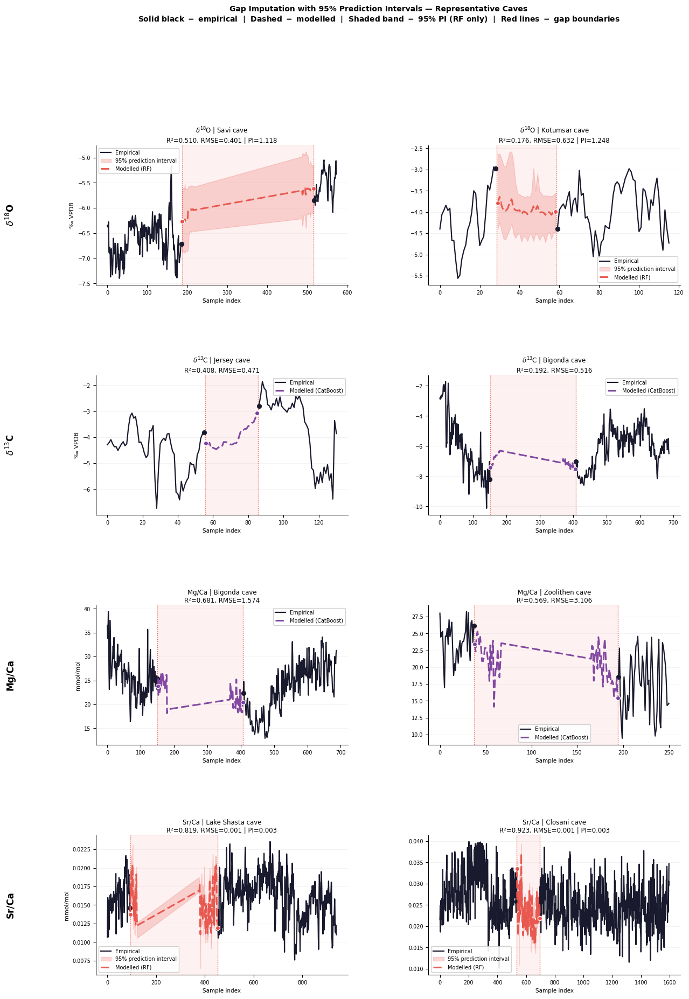

[OK] /content/gapfill_final_with_intervals.png


/tmp/ipykernel_1300/4068222113.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


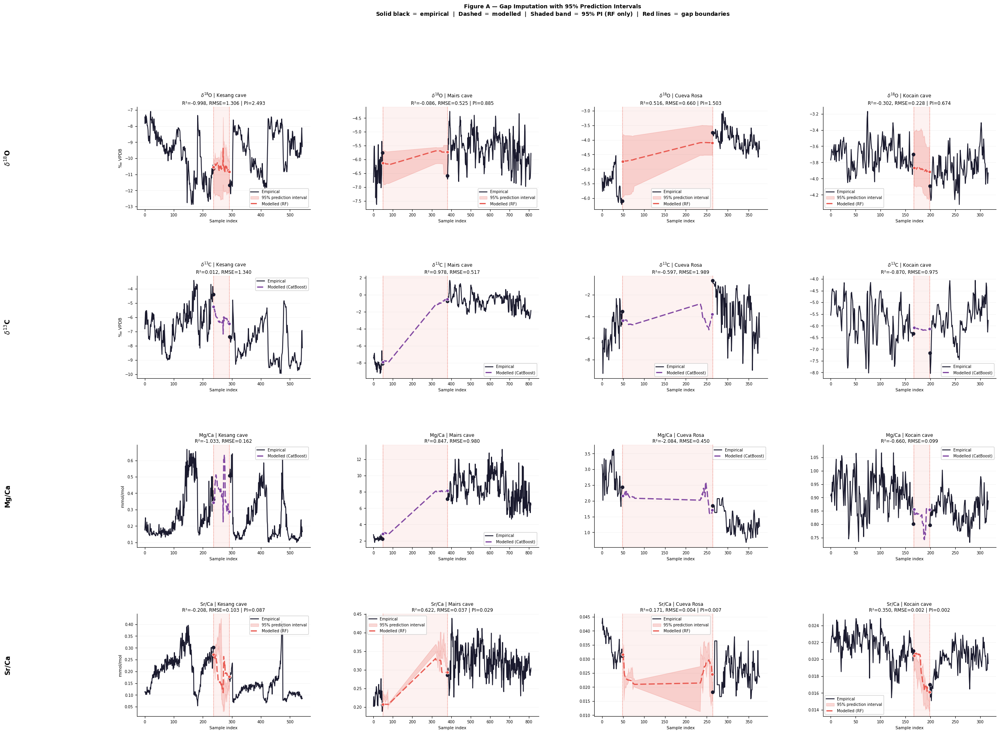

[OK] /content/gap_imputation_figA_with_intervals.png


/tmp/ipykernel_1300/4068222113.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


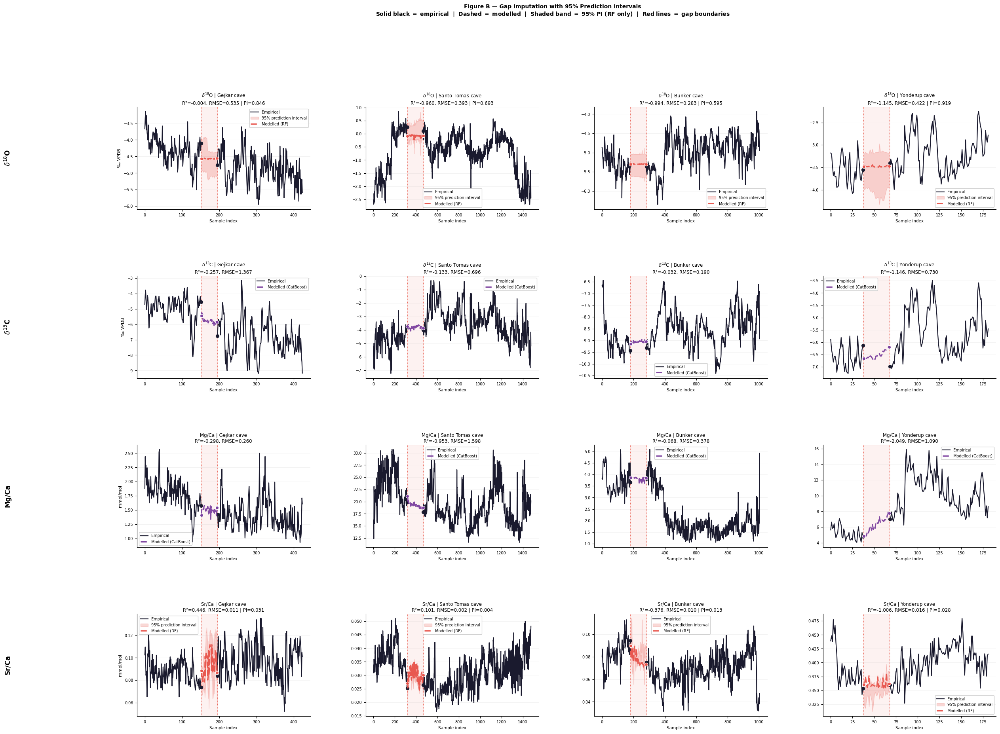

[OK] /content/gap_imputation_figB_with_intervals.png
[OK] ZIP ready: /content/gap_figures_with_intervals.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Cherry-picked
plot_gap_figure(
    cave_list=["Savi cave",       "Kotumsar cave",
               "Jersey cave",     "Bigonda cave",
               "Bigonda cave",    "Zoolithen cave",
               "Lake Shasta cave","Closani cave"],
    fig_title="Gap Imputation with 95% Prediction Intervals — Representative Caves",
    out_path="/content/gapfill_final_with_intervals.png",
    ncols=2
)

# Figure A
plot_gap_figure(
    cave_list=["Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave"],
    fig_title="Figure A — Gap Imputation with 95% Prediction Intervals",
    out_path="/content/gap_imputation_figA_with_intervals.png",
    ncols=4
)

# Figure B
plot_gap_figure(
    cave_list=["Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave"],
    fig_title="Figure B — Gap Imputation with 95% Prediction Intervals",
    out_path="/content/gap_imputation_figB_with_intervals.png",
    ncols=4
)

# Zip and download
import zipfile
from pathlib import Path
ZIP = Path("/content/gap_figures_with_intervals.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for f in ["/content/gapfill_final_with_intervals.png",
              "/content/gap_imputation_figA_with_intervals.png",
              "/content/gap_imputation_figB_with_intervals.png"]:
        zf.write(f, Path(f).name)
print(f"[OK] ZIP ready: {ZIP}")

from google.colab import files
files.download(str(ZIP))

[OK] Loaded 12 within-cave prediction files
[OK] RF models loaded


/tmp/ipykernel_2306/1853624377.py:184: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


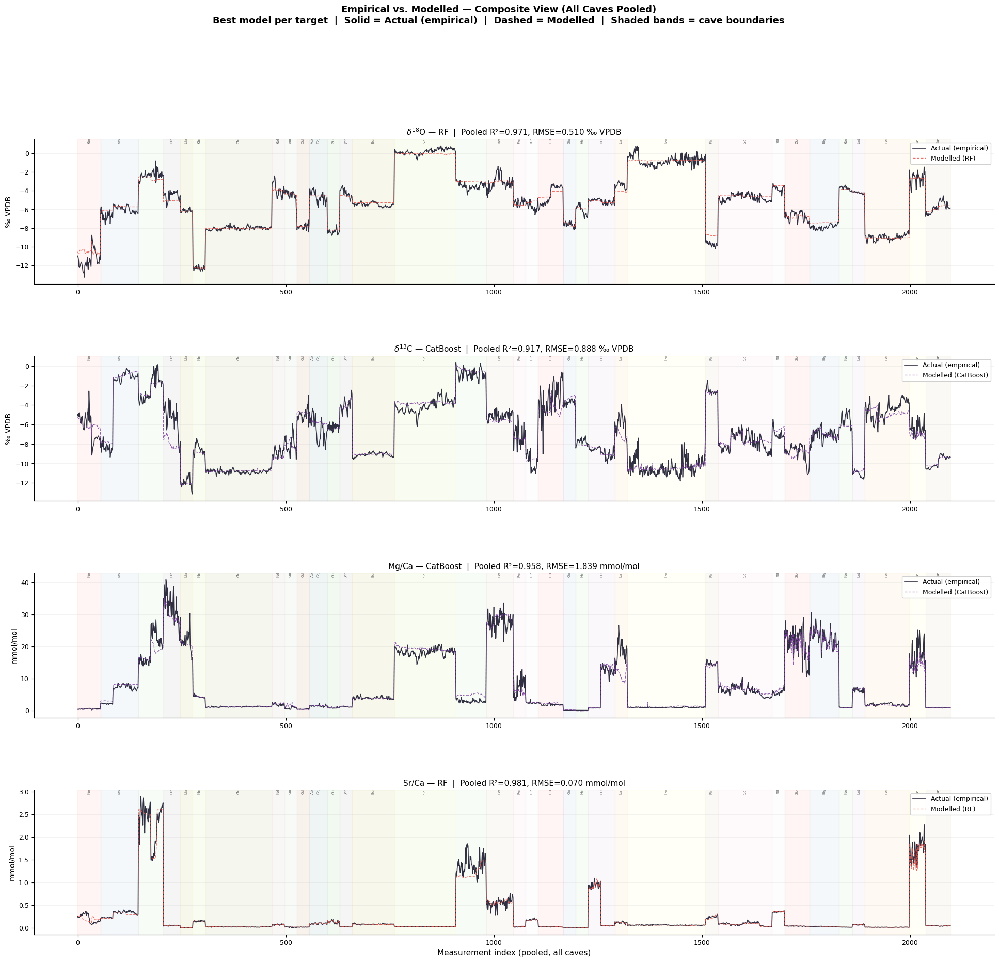

[OK] Figure 1 saved: /content/fig_composite_HQ.png


/tmp/ipykernel_2306/1853624377.py:267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


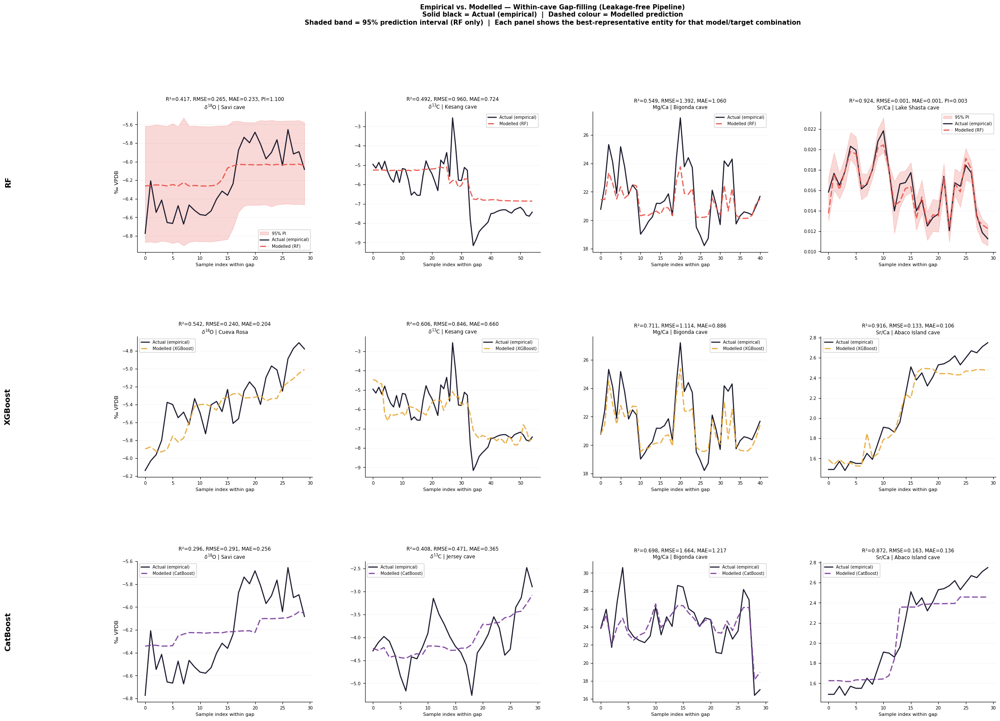

[OK] Figure 2 saved: /content/fig_within_cave_grid_HQ.png
[OK] ZIP ready: /content/HQ_figures.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# FULL CELL — run everything at once, no splitting
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
import joblib
import zipfile
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin

# ── CorrelationDropper ────────────────────────────────────────────────────
class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool); return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr  = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array([k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

# ── Paths & data ──────────────────────────────────────────────────────────
base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
MODELS_DIR   = base / "webapp/models"
WITHIN_PRED  = base / "artifacts/20260612T233845Z/predictions_within"
METRICS_DIR  = base / "artifacts/20260612T233845Z/metrics_within"
master_table = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

within_preds = {}
for p in WITHIN_PRED.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)
print(f"[OK] Loaded {len(within_preds)} within-cave prediction files")

rf_models = {}
for tgt in ["d18O_measurement","Sr_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
print("[OK] RF models loaded")

pooled_metrics = pd.read_csv(METRICS_DIR / "within_metrics_pooled.csv")

# ── Constants ─────────────────────────────────────────────────────────────
TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = {"d18O_measurement":r"$\delta^{18}$O","d13C_measurement":r"$\delta^{13}$C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
MODELS   = ["RandomForest","XGBoost","CatBoost"]
M_CLR    = {"RandomForest":"#E8534A","XGBoost":"#E8A838","CatBoost":"#7B3F9E"}
M_LBL    = {"RandomForest":"RF","XGBoost":"XGBoost","CatBoost":"CatBoost"}
EXCL     = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
            "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
            "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

def get_rf_intervals(rf_pipe, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    X_trans = rf_pipe.named_steps["preprocess"].transform(X_clean)
    rf_est  = rf_pipe.named_steps["estimator"]
    all_p   = np.array([t.predict(X_trans) for t in rf_est.estimators_])
    return all_p.mean(axis=0), all_p.std(axis=0)

def best_entity_for(mdl, tgt):
    pf = within_preds.get((mdl,tgt))
    if pf is None: return None, None
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]
    best_r2, best_eid = -np.inf, None
    for eid, grp in master_table.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 10: continue
        yt = grp[tgt].values[gm]
        yp = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])
        v  = ~np.isnan(yp)&~np.isnan(yt)
        if v.sum() < 10: continue
        ss_res = np.sum((yt[v]-yp[v])**2)
        ss_tot = np.sum((yt[v]-yt[v].mean())**2)
        if ss_tot < 1e-10: continue
        r2 = 1-ss_res/ss_tot
        if r2 > best_r2:
            best_r2 = r2; best_eid = eid
    return best_eid, best_r2

# ══════════════════════════════════════════════════════════════════════════
# FIGURE 1: Composite time series — HQ
# ══════════════════════════════════════════════════════════════════════════
fig1, axes1 = plt.subplots(4, 1, figsize=(24, 20),
                            gridspec_kw={"hspace":0.50})
fig1.suptitle(
    "Empirical vs. Modelled — Composite View (All Caves Pooled)\n"
    "Best model per target  |  Solid = Actual (empirical)  |  "
    "Dashed = Modelled  |  Shaded bands = cave boundaries",
    fontsize=13, fontweight="bold", y=1.01
)

cave_palette = [cm.Pastel1(i % 9) for i in range(50)]

for ax, tgt in zip(axes1, TARGETS):
    mdl = BEST_MDL[tgt]
    pf  = within_preds.get((mdl,tgt))
    if pf is None: continue
    pf  = pf.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]

    y_act, y_prd, x_pts, cave_names = [], [], [], []
    for i, row in pf.iterrows():
        sid  = row["sample_id"]
        yhat = row["y_pred"]
        mt_r = master_table[master_table["sample_id"]==sid]
        if mt_r.empty or tgt not in mt_r.columns: continue
        y_act.append(float(mt_r[tgt].iloc[0]))
        y_prd.append(yhat)
        x_pts.append(i)
        cave_names.append(mt_r["site_name"].iloc[0])

    x_arr = np.array(x_pts)
    y_act = np.array(y_act)
    y_prd = np.array(y_prd)

    # Cave boundary shading
    seen = {}
    for xi, cave in zip(x_arr, cave_names):
        if cave not in seen:
            seen[cave] = [xi, xi]
        else:
            seen[cave][1] = xi

    cave_list_ordered = list(dict.fromkeys(cave_names))
    for ci, (cave, (xs, xe)) in enumerate(seen.items()):
        ax.axvspan(xs-0.5, xe+0.5, alpha=0.13,
                   color=cave_palette[ci % len(cave_palette)], zorder=1)
        mid = (xs+xe)/2
        yrange = y_act.max()-y_act.min() if len(y_act) else 1
        ax.text(mid, y_act.max()+yrange*0.02,
                cave.replace(" cave","").replace(" Cave",""),
                ha="center", va="bottom", fontsize=5.0,
                color="#666", rotation=90, clip_on=True)

    ax.plot(x_arr, y_act, color="#1A1A2E", lw=1.2, zorder=3,
            label="Actual (empirical)", alpha=0.9)
    ax.plot(x_arr, y_prd, color=M_CLR[mdl], lw=0.9, ls="--",
            dashes=(4,2), zorder=4, alpha=0.85,
            label=f"Modelled ({M_LBL[mdl]})")

    pool = pooled_metrics[(pooled_metrics["model"]==mdl)&(pooled_metrics["target"]==tgt)]
    r2   = float(pool["pooled_r2"].values[0])   if len(pool) else float("nan")
    rmse = float(pool["pooled_rmse"].values[0]) if len(pool) else float("nan")

    ax.set_title(
        f"{T_LABELS[tgt]} — {M_LBL[mdl]}  |  "
        f"Pooled R²={r2:.3f}, RMSE={rmse:.3f} {T_UNITS[tgt]}",
        fontsize=11, pad=6
    )
    ax.set_ylabel(T_UNITS[tgt], fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="y", alpha=0.2, linewidth=0.5)
    ax.legend(fontsize=9, loc="upper right", framealpha=0.9)
    ax.tick_params(labelsize=9)

axes1[-1].set_xlabel("Measurement index (pooled, all caves)", fontsize=11)
plt.tight_layout()
out1 = "/content/fig_composite_HQ.png"
fig1.savefig(out1, dpi=300, bbox_inches="tight")
plt.show()
print(f"[OK] Figure 1 saved: {out1}")

# ══════════════════════════════════════════════════════════════════════════
# FIGURE 2: Within-cave grid (3 models × 4 proxies) — HQ with RF PI
# ══════════════════════════════════════════════════════════════════════════
fig2, axes2 = plt.subplots(3, 4, figsize=(26, 18),
                            gridspec_kw={"hspace":0.60,"wspace":0.30})
fig2.suptitle(
    "Empirical vs. Modelled — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Solid black = Actual (empirical)  |  Dashed colour = Modelled prediction\n"
    "Shaded band = 95% prediction interval (RF only)  |  "
    "Each panel shows the best-representative entity for that model/target combination",
    fontsize=11, fontweight="bold", y=1.02
)

for row, mdl in enumerate(MODELS):
    for col, tgt in enumerate(TARGETS):
        ax = axes2[row][col]

        pf = within_preds.get((mdl,tgt))
        if pf is None: ax.set_visible(False); continue
        held_ids = set(pf["sample_id"].values)
        gap_pred = pf.set_index("sample_id")["y_pred"]

        best_eid, best_r2 = best_entity_for(mdl, tgt)
        if best_eid is None: ax.set_visible(False); continue

        grp = master_table[master_table["entity_id"]==best_eid]
        if grp.empty or tgt not in grp.columns: ax.set_visible(False); continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if not gm.any(): ax.set_visible(False); continue

        y_all    = grp[tgt].values
        gap_idx  = np.where(gm)[0]
        x_gap    = np.arange(len(gap_idx))
        y_true_g = y_all[gm]
        y_pred_g = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])

        has_pi = (mdl=="RandomForest" and tgt in rf_models)
        if has_pi:
            mean_p, std_p = get_rf_intervals(rf_models[tgt], grp.iloc[gap_idx])
            lower = mean_p - 1.96*std_p
            upper = mean_p + 1.96*std_p
            ax.fill_between(x_gap, lower, upper,
                            color=M_CLR[mdl], alpha=0.22, zorder=2, label="95% PI")

        ax.plot(x_gap, y_true_g, color="#1A1A2E", lw=1.8, zorder=3,
                label="Actual (empirical)")
        ax.plot(x_gap, y_pred_g, color=M_CLR[mdl], lw=2.0,
                ls="--", dashes=(5,2), alpha=0.92, zorder=4,
                label=f"Modelled ({M_LBL[mdl]})")

        v    = ~np.isnan(y_pred_g)&~np.isnan(y_true_g)
        rmse = float(np.sqrt(np.mean((y_true_g[v]-y_pred_g[v])**2))) if v.sum()>1 else np.nan
        mae  = float(np.mean(np.abs(y_true_g[v]-y_pred_g[v])))       if v.sum()>1 else np.nan
        site = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"E{best_eid}"
        pi_s = f", PI={float((upper-lower).mean()):.3f}" if has_pi else ""

        ax.set_title(
            f"R²={best_r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}{pi_s}\n"
            f"{T_LABELS[tgt]} | {site}",
            fontsize=8.5, pad=4
        )
        ax.set_xlabel("Sample index within gap", fontsize=8)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=9)
        ax.tick_params(labelsize=7.5)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        ax.legend(fontsize=7, loc="best", framealpha=0.9)

    fig2.text(
        0.005,
        axes2[row][0].get_position().y0 + axes2[row][0].get_position().height/2,
        M_LBL[MODELS[row]], va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out2 = "/content/fig_within_cave_grid_HQ.png"
fig2.savefig(out2, dpi=300, bbox_inches="tight")
plt.show()
print(f"[OK] Figure 2 saved: {out2}")

# ── Zip and download ──────────────────────────────────────────────────────
ZIP = Path("/content/HQ_figures.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    zf.write(out1, "fig_composite_HQ.png")
    zf.write(out2, "fig_within_cave_grid_HQ.png")
print(f"[OK] ZIP ready: {ZIP}")

from google.colab import files
files.download(str(ZIP))

[OK] RF models loaded

Training quantile models (this takes ~20-30 mins)...
  [OK] CatBoost | $\delta^{18}$O | q=0.025
  [OK] CatBoost | $\delta^{18}$O | q=0.5
  [OK] CatBoost | $\delta^{18}$O | q=0.975
  [OK] XGBoost | $\delta^{18}$O | q=0.025
  [OK] XGBoost | $\delta^{18}$O | q=0.5
  [OK] XGBoost | $\delta^{18}$O | q=0.975
  [OK] CatBoost | $\delta^{13}$C | q=0.025
  [OK] CatBoost | $\delta^{13}$C | q=0.5
  [OK] CatBoost | $\delta^{13}$C | q=0.975
  [OK] XGBoost | $\delta^{13}$C | q=0.025
  [OK] XGBoost | $\delta^{13}$C | q=0.5
  [OK] XGBoost | $\delta^{13}$C | q=0.975
  [OK] CatBoost | Mg/Ca | q=0.025
  [OK] CatBoost | Mg/Ca | q=0.5
  [OK] CatBoost | Mg/Ca | q=0.975
  [OK] XGBoost | Mg/Ca | q=0.025
  [OK] XGBoost | Mg/Ca | q=0.5
  [OK] XGBoost | Mg/Ca | q=0.975
  [OK] CatBoost | Sr/Ca | q=0.025
  [OK] CatBoost | Sr/Ca | q=0.5
  [OK] CatBoost | Sr/Ca | q=0.975
  [OK] XGBoost | Sr/Ca | q=0.025
  [OK] XGBoost | Sr/Ca | q=0.5
  [OK] XGBoost | Sr/Ca | q=0.975

[OK] All quantile models tr

/tmp/ipykernel_2306/3072003307.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


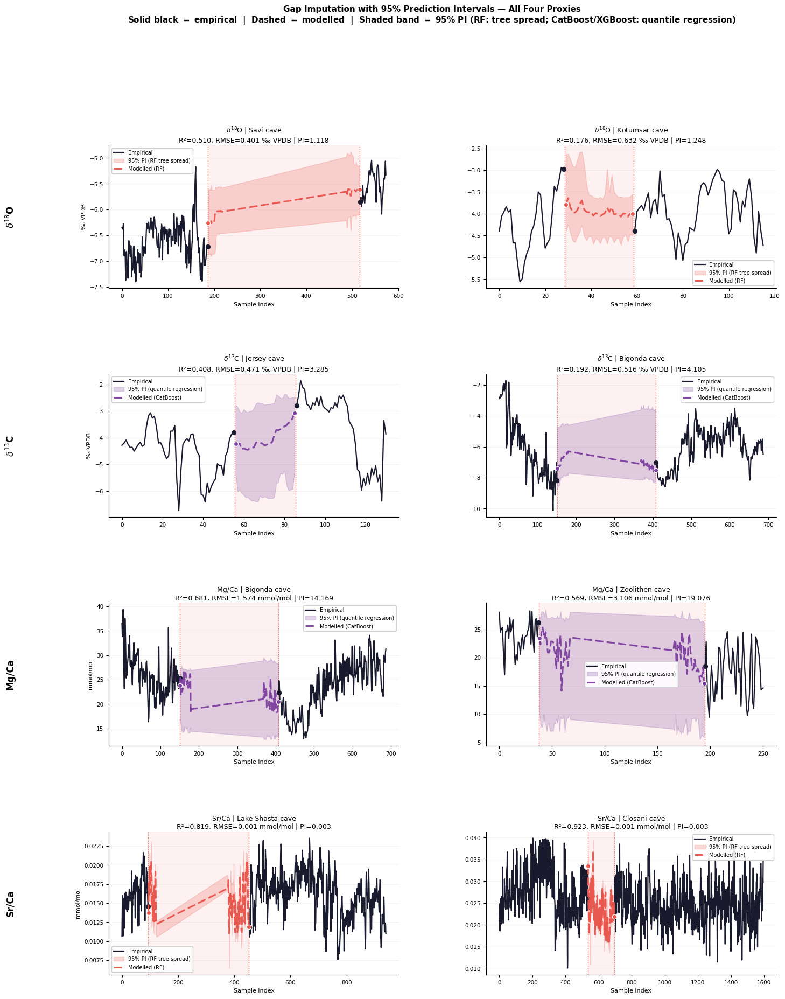

[OK] /content/gapfill_all_proxies_with_quantile_PI.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================
# Quantile regression for CatBoost and XGBoost
# Trains 3 models per (model, target): q=0.025, 0.5, 0.975
# Then plots gap figures with 95% PI for all proxies
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import zipfile
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# ── CorrelationDropper ────────────────────────────────────────────────────
class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool); return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr  = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

# ── Setup ─────────────────────────────────────────────────────────────────
base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED  = base / "artifacts/20260612T233845Z/predictions_within"
MODELS_DIR   = base / "webapp/models"
master_table = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

within_preds = {}
for p in WITHIN_PRED.glob("*.parquet"):
    name, tgt = p.stem.split("_",1)
    within_preds[(name,tgt)] = pd.read_parquet(p)

# Load RF models for RF intervals (still use tree spread for RF)
rf_models = {}
for tgt in ["d18O_measurement","Sr_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
print("[OK] RF models loaded")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = {"d18O_measurement":r"$\delta^{18}$O","d13C_measurement":r"$\delta^{13}$C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E","XGBoost":"#E8A838"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost","XGBoost":"XGBoost"}
EXCL     = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
            "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
            "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

# ── Build preprocessing pipeline ─────────────────────────────────────────
def make_preprocessor(X_df):
    num_cols = X_df.select_dtypes(include=[np.number]).columns.tolist()
    cat_cols = X_df.select_dtypes(include=["object","category"]).columns.tolist()
    num_pipe = Pipeline([
        ("impute", SimpleImputer(strategy="median")),
        ("scale",  RobustScaler()),
        ("corr",   CorrelationDropper(0.95)),
    ])
    cat_pipe = Pipeline([
        ("impute", SimpleImputer(strategy="most_frequent")),
        ("ohe",    OneHotEncoder(handle_unknown="ignore", sparse_output=False)),
    ])
    parts = []
    if num_cols: parts.append(("num", num_pipe, num_cols))
    if cat_cols: parts.append(("cat", cat_pipe, cat_cols))
    return ColumnTransformer(parts, remainder="drop")

def get_features(df):
    return df.drop(columns=[c for c in list(EXCL)+["interp_age_uncert_pos",
                   "interp_age_uncert_neg"] if c in df.columns], errors="ignore")

# ── Train quantile models for CatBoost and XGBoost ───────────────────────
QUANTILE_MODELS = {}   # (mdl_name, tgt, q) -> fitted pipeline
QUANTILES = [0.025, 0.5, 0.975]

print("\nTraining quantile models (this takes ~20-30 mins)...")
for tgt in TARGETS:
    for mdl_name in ["CatBoost","XGBoost"]:
        # Get held-out entity for this model/target to define train set
        pf = within_preds.get((mdl_name,tgt))
        if pf is None: continue
        held_ids = set(pf["sample_id"].values)

        # Training data = all rows NOT in held-out
        train_df = master_table[~master_table["sample_id"].isin(held_ids)].copy()
        train_df = train_df.dropna(subset=[tgt])
        X_train  = get_features(train_df)
        y_train  = train_df[tgt].values

        preproc = make_preprocessor(X_train)
        X_tr    = preproc.fit_transform(X_train)

        for q in QUANTILES:
            if mdl_name == "CatBoost":
                mdl = CatBoostRegressor(
                    iterations=600, depth=6, learning_rate=0.05,
                    loss_function=f"Quantile:alpha={q}",
                    verbose=False, random_seed=42, thread_count=-1
                )
            else:  # XGBoost
                mdl = XGBRegressor(
                    n_estimators=500, max_depth=6, learning_rate=0.05,
                    objective="reg:quantileerror", quantile_alpha=q,
                    n_jobs=-1, random_state=42, verbosity=0
                )
            mdl.fit(X_tr, y_train)
            QUANTILE_MODELS[(mdl_name, tgt, q)] = (preproc, mdl)
            print(f"  [OK] {mdl_name} | {T_LABELS[tgt]} | q={q}")

print("\n[OK] All quantile models trained")

# ── Helper: get RF intervals from tree spread ─────────────────────────────
def get_rf_intervals(rf_pipe, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    X_trans = rf_pipe.named_steps["preprocess"].transform(X_clean)
    rf_est  = rf_pipe.named_steps["estimator"]
    all_p   = np.array([t.predict(X_trans) for t in rf_est.estimators_])
    return all_p.mean(axis=0), all_p.std(axis=0)

# ── Helper: get quantile PI for CatBoost/XGBoost ─────────────────────────
def get_quantile_intervals(mdl_name, tgt, X_df):
    X_feat = get_features(X_df)
    results = {}
    for q in QUANTILES:
        key = (mdl_name, tgt, q)
        if key not in QUANTILE_MODELS: return None, None, None
        preproc, mdl = QUANTILE_MODELS[key]
        X_t = preproc.transform(X_feat)
        results[q] = mdl.predict(X_t)
    return results[0.5], results[0.025], results[0.975]

# ── Generate cherry-picked gap figure with full uncertainty bands ─────────
SELECTED_CAVES = {
    "d18O_measurement":  ["Savi cave",       "Kotumsar cave"],
    "d13C_measurement":  ["Jersey cave",      "Bigonda cave"],
    "Mg_Ca_measurement": ["Bigonda cave",     "Zoolithen cave"],
    "Sr_Ca_measurement": ["Lake Shasta cave", "Closani cave"],
}

fig, axes = plt.subplots(4, 2, figsize=(16, 20),
                          gridspec_kw={"hspace":0.60,"wspace":0.30})
fig.suptitle(
    "Gap Imputation with 95% Prediction Intervals — All Four Proxies\n"
    r"Solid black $=$ empirical  |  Dashed $=$ modelled  |  "
    r"Shaded band $=$ 95% PI (RF: tree spread; CatBoost/XGBoost: quantile regression)",
    fontsize=11, fontweight="bold", y=1.01
)

for row, tgt in enumerate(TARGETS):
    mdl      = BEST_MDL[tgt]
    pred_df  = within_preds.get((mdl,tgt))
    if pred_df is None: continue
    pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pred_df["sample_id"].values)
    gap_pred = pred_df.set_index("sample_id")["y_pred"]

    for col, cave_name in enumerate(SELECTED_CAVES[tgt]):
        ax = axes[row][col]

        grp = master_table[master_table["site_name"]==cave_name]
        if grp.empty or tgt not in grp.columns:
            ax.set_visible(False); continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if not gm.any(): ax.set_visible(False); continue

        y_all     = grp[tgt].values
        x_all     = np.arange(len(grp))
        gap_idx   = np.where(gm)[0]
        gap_start = gap_idx[0]; gap_end = gap_idx[-1]
        x_before  = x_all[:gap_start]; y_before = y_all[:gap_start]
        x_after   = x_all[gap_end+1:]; y_after  = y_all[gap_end+1:]
        y_pred_g  = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])

        # Get intervals
        if mdl == "RandomForest":
            mean_p, std_p = get_rf_intervals(rf_models[tgt], grp.iloc[gap_idx])
            lower = mean_p - 1.96*std_p
            upper = mean_p + 1.96*std_p
            pi_label = "95% PI (RF tree spread)"
        else:
            mean_p, lower, upper = get_quantile_intervals(mdl, tgt, grp.iloc[gap_idx])
            if mean_p is None:
                lower = upper = None
            pi_label = "95% PI (quantile regression)"

        # Gap shading
        ax.axvspan(gap_start-0.5, gap_end+0.5, alpha=0.07,
                   color="#E74C3C", zorder=1)
        ax.axvline(gap_start-0.5, color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.9, zorder=2)
        ax.axvline(gap_end+0.5,   color="#E74C3C", lw=1.0,
                   ls=":", alpha=0.9, zorder=2)

        # Empirical
        ax.plot(x_before, y_before, color="#1A1A2E",
                lw=1.6, zorder=4, label="Empirical")
        ax.plot(x_after,  y_after,  color="#1A1A2E",
                lw=1.6, zorder=4)
        if len(y_before)>0:
            ax.scatter([gap_start-1],[y_before[-1]],
                       color="#1A1A2E", s=32, zorder=5)
        if len(y_after)>0:
            ax.scatter([gap_end+1],[y_after[0]],
                       color="#1A1A2E", s=32, zorder=5)

        # PI band
        if lower is not None:
            ax.fill_between(gap_idx, lower, upper,
                            color=M_CLR[mdl], alpha=0.22, zorder=3,
                            label=pi_label)

        # Prediction line
        valid = ~np.isnan(y_pred_g)
        ax.plot(gap_idx[valid], y_pred_g[valid],
                color=M_CLR[mdl], lw=2.2, ls="--", dashes=(5,2),
                alpha=0.95, zorder=5,
                label=f"Modelled ({M_LBL[mdl]})")

        fv = np.where(valid)[0]
        if len(fv)>0:
            ax.scatter([gap_idx[fv[0]]],[y_pred_g[fv[0]]],
                       color=M_CLR[mdl], s=35, zorder=6,
                       edgecolors="white", lw=0.9)
            ax.scatter([gap_idx[fv[-1]]],[y_pred_g[fv[-1]]],
                       color=M_CLR[mdl], s=35, zorder=6,
                       edgecolors="white", lw=0.9)

        # Metrics
        yt = y_all[gm]
        v  = valid & ~np.isnan(yt)
        r2   = float("nan"); rmse = float("nan")
        if v.sum()>2:
            ss_res = np.sum((yt[v]-y_pred_g[v])**2)
            ss_tot = np.sum((yt[v]-yt[v].mean())**2)
            r2   = 1-ss_res/ss_tot if ss_tot>1e-12 else float("nan")
            rmse = float(np.sqrt(np.mean((yt[v]-y_pred_g[v])**2)))
        wi = f" | PI={float((upper-lower).mean()):.3f}" if lower is not None else ""

        ax.set_title(
            f"{T_LABELS[tgt]} | {cave_name}\n"
            f"R²={r2:.3f}, RMSE={rmse:.3f} {T_UNITS[tgt]}{wi}",
            fontsize=9, pad=4
        )
        ax.set_xlabel("Sample index", fontsize=8)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=8)
        ax.tick_params(labelsize=7.5)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        ax.legend(fontsize=7, loc="best", framealpha=0.9)

    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        T_LABELS[tgt], va="center", ha="left",
        fontsize=12, fontweight="bold", rotation=90
    )

plt.tight_layout()
out = "/content/gapfill_all_proxies_with_quantile_PI.png"
fig.savefig(out, dpi=250, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

In [ ]:
base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS    = base / "artifacts"
RUN_DIR      = ARTIFACTS / "20260616T224121Z"
WITHIN_DIR   = ARTIFACTS / "20260612T233845Z"
MODELS_DIR   = base / "webapp/models"
WITHIN_PRED  = WITHIN_DIR / "predictions_within"
METRICS_DIR  = WITHIN_DIR / "metrics_within"

master_table = pd.read_parquet(ARTIFACTS / "_data" / "master_table_enriched.parquet")
print(f"[OK] master_table: {master_table.shape}")

within_preds = {}
for p in WITHIN_PRED.glob("*.parquet"):
    name, tgt = p.stem.split("_", 1)
    within_preds[(name, tgt)] = pd.read_parquet(p)
print(f"[OK] within_preds: {len(within_preds)} files")

[OK] master_table: (18004, 49)
[OK] within_preds: 12 files


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import joblib
import json
import zipfile
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# ============================================================
# FULL SETUP + QUANTILE TRAINING — run as one block
# ============================================================
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# ── CorrelationDropper ────────────────────────────────────────────────────
class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool); return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr  = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

# ── Constants ─────────────────────────────────────────────────────────────
TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = {"d18O_measurement":r"$\delta^{18}$O","d13C_measurement":r"$\delta^{13}$C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E","XGBoost":"#E8A838"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost","XGBoost":"XGBoost"}
EXCL     = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
            "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
            "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

# ── Load RF models ────────────────────────────────────────────────────────
rf_models = {}
for tgt in ["d18O_measurement","Sr_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
print(f"[OK] RF models loaded: {list(rf_models.keys())}")

# ── Preprocessing builder ─────────────────────────────────────────────────
def get_features(df):
    return df.drop(columns=[c for c in EXCL if c in df.columns], errors="ignore")

def make_preprocessor(X_df):
    num_cols = X_df.select_dtypes(include=[np.number]).columns.tolist()
    cat_cols = X_df.select_dtypes(include=["object","category"]).columns.tolist()
    num_pipe = Pipeline([
        ("impute", SimpleImputer(strategy="median")),
        ("scale",  RobustScaler()),
        ("corr",   CorrelationDropper(0.95)),
    ])
    cat_pipe = Pipeline([
        ("impute", SimpleImputer(strategy="most_frequent")),
        ("ohe",    OneHotEncoder(handle_unknown="ignore", sparse_output=False)),
    ])
    parts = []
    if num_cols: parts.append(("num", num_pipe, num_cols))
    if cat_cols: parts.append(("cat", cat_pipe, cat_cols))
    return ColumnTransformer(parts, remainder="drop")

# ── Helpers ───────────────────────────────────────────────────────────────
def get_rf_intervals(rf_pipe, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    X_trans = rf_pipe.named_steps["preprocess"].transform(X_clean)
    rf_est  = rf_pipe.named_steps["estimator"]
    all_p   = np.array([t.predict(X_trans) for t in rf_est.estimators_])
    return all_p.mean(axis=0), all_p.std(axis=0)

def get_quantile_intervals(mdl_name, tgt, X_df):
    X_feat = get_features(X_df)
    results = {}
    for q in [0.025, 0.5, 0.975]:
        key = (mdl_name, tgt, q)
        if key not in QUANTILE_MODELS: return None, None, None
        preproc, mdl = QUANTILE_MODELS[key]
        results[q] = mdl.predict(preproc.transform(X_feat))
    return results[0.5], results[0.025], results[0.975]

def get_pi(mdl_name, tgt, grp_rows):
    if mdl_name == "RandomForest" and tgt in rf_models:
        mean_p, std_p = get_rf_intervals(rf_models[tgt], grp_rows)
        return mean_p, mean_p-1.96*std_p, mean_p+1.96*std_p, "95% PI (RF tree spread)"
    else:
        med, lo, hi = get_quantile_intervals(mdl_name, tgt, grp_rows)
        if med is None: return None, None, None, None
        return med, lo, hi, "95% PI (quantile regression)"

# ── Train quantile models ─────────────────────────────────────────────────
QUANTILE_MODELS = {}
QUANTILES = [0.025, 0.5, 0.975]

print("\nTraining quantile models (~25 min)...")
for tgt in TARGETS:
    for mdl_name in ["CatBoost","XGBoost"]:
        pf = within_preds.get((mdl_name,tgt))
        if pf is None: continue
        held_ids = set(pf["sample_id"].values)
        train_df = master_table[~master_table["sample_id"].isin(held_ids)].copy()
        train_df = train_df.dropna(subset=[tgt])
        X_train  = get_features(train_df)
        y_train  = train_df[tgt].values
        preproc  = make_preprocessor(X_train)
        X_tr     = preproc.fit_transform(X_train)
        for q in QUANTILES:
            if mdl_name == "CatBoost":
                mdl = CatBoostRegressor(
                    iterations=600, depth=6, learning_rate=0.05,
                    loss_function=f"Quantile:alpha={q}",
                    verbose=False, random_seed=42, thread_count=-1)
            else:
                mdl = XGBRegressor(
                    n_estimators=500, max_depth=6, learning_rate=0.05,
                    objective="reg:quantileerror", quantile_alpha=q,
                    n_jobs=-1, random_state=42, verbosity=0)
            mdl.fit(X_tr, y_train)
            QUANTILE_MODELS[(mdl_name, tgt, q)] = (preproc, mdl)
            print(f"  [OK] {mdl_name} | {T_LABELS[tgt]} | q={q}")

print(f"\n[OK] All quantile models trained ({len(QUANTILE_MODELS)} total)")
print("[OK] Ready to generate figures")

[OK] RF models loaded: ['d18O_measurement', 'Sr_Ca_measurement']

Training quantile models (~25 min)...
  [OK] CatBoost | $\delta^{18}$O | q=0.025
  [OK] CatBoost | $\delta^{18}$O | q=0.5
  [OK] CatBoost | $\delta^{18}$O | q=0.975
  [OK] XGBoost | $\delta^{18}$O | q=0.025
  [OK] XGBoost | $\delta^{18}$O | q=0.5
  [OK] XGBoost | $\delta^{18}$O | q=0.975
  [OK] CatBoost | $\delta^{13}$C | q=0.025
  [OK] CatBoost | $\delta^{13}$C | q=0.5
  [OK] CatBoost | $\delta^{13}$C | q=0.975
  [OK] XGBoost | $\delta^{13}$C | q=0.025
  [OK] XGBoost | $\delta^{13}$C | q=0.5
  [OK] XGBoost | $\delta^{13}$C | q=0.975
  [OK] CatBoost | Mg/Ca | q=0.025
  [OK] CatBoost | Mg/Ca | q=0.5
  [OK] CatBoost | Mg/Ca | q=0.975
  [OK] XGBoost | Mg/Ca | q=0.025
  [OK] XGBoost | Mg/Ca | q=0.5
  [OK] XGBoost | Mg/Ca | q=0.975
  [OK] CatBoost | Sr/Ca | q=0.025
  [OK] CatBoost | Sr/Ca | q=0.5
  [OK] CatBoost | Sr/Ca | q=0.975
  [OK] XGBoost | Sr/Ca | q=0.025
  [OK] XGBoost | Sr/Ca | q=0.5
  [OK] XGBoost | Sr/Ca | q=0.975


In [ ]:
# ============================================================
# ALL FIGURES WITH 95% PI — run after quantile training
# ============================================================

def plot_gap_with_pi(cave_list, fig_title, out_path, ncols=2):
    """Gap imputation figure with 95% PI on all proxies."""
    nrows = 4
    fig, axes = plt.subplots(nrows, ncols, figsize=(8*ncols, 20),
                              gridspec_kw={"hspace":0.65,"wspace":0.32})
    fig.suptitle(
        f"{fig_title}\n"
        r"Solid black $=$ empirical  |  Dashed $=$ modelled  |  "
        r"Shaded $=$ 95% PI (RF: tree spread; CatBoost: quantile regression)  |  "
        r"Red lines $=$ gap boundaries",
        fontsize=10, fontweight="bold", y=1.01
    )

    for row, tgt in enumerate(TARGETS):
        mdl      = BEST_MDL[tgt]
        pred_df  = within_preds.get((mdl,tgt))
        if pred_df is None: continue
        pred_df  = pred_df.sort_values("sample_id").reset_index(drop=True)
        held_ids = set(pred_df["sample_id"].values)
        gap_pred = pred_df.set_index("sample_id")["y_pred"]

        for col in range(ncols):
            cave_name = cave_list[row * ncols + col]
            ax = axes[row][col]

            grp = master_table[master_table["site_name"]==cave_name]
            if grp.empty or tgt not in grp.columns:
                ax.set_visible(False); continue
            grp  = grp.sort_values("sample_id").reset_index(drop=True)
            sids = grp["sample_id"].values
            gm   = np.array([s in held_ids for s in sids])
            if not gm.any(): ax.set_visible(False); continue

            y_all     = grp[tgt].values
            x_all     = np.arange(len(grp))
            gap_idx   = np.where(gm)[0]
            gap_start = gap_idx[0]; gap_end = gap_idx[-1]
            x_before  = x_all[:gap_start]; y_before = y_all[:gap_start]
            x_after   = x_all[gap_end+1:]; y_after  = y_all[gap_end+1:]
            y_pred_g  = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])

            # Get PI
            _, lo, hi, pi_lbl = get_pi(mdl, tgt, grp.iloc[gap_idx])

            # Gap shading
            ax.axvspan(gap_start-0.5,gap_end+0.5,alpha=0.07,color="#E74C3C",zorder=1)
            ax.axvline(gap_start-0.5,color="#E74C3C",lw=1.0,ls=":",alpha=0.9,zorder=2)
            ax.axvline(gap_end+0.5,  color="#E74C3C",lw=1.0,ls=":",alpha=0.9,zorder=2)

            # Empirical
            ax.plot(x_before,y_before,color="#1A1A2E",lw=1.6,zorder=4,label="Empirical")
            ax.plot(x_after, y_after, color="#1A1A2E",lw=1.6,zorder=4)
            if len(y_before)>0:
                ax.scatter([gap_start-1],[y_before[-1]],color="#1A1A2E",s=32,zorder=5)
            if len(y_after)>0:
                ax.scatter([gap_end+1],[y_after[0]],   color="#1A1A2E",s=32,zorder=5)

            # PI band
            if lo is not None:
                ax.fill_between(gap_idx,lo,hi,color=M_CLR[mdl],
                                alpha=0.22,zorder=3,label=pi_lbl)

            # Prediction line
            valid = ~np.isnan(y_pred_g)
            ax.plot(gap_idx[valid],y_pred_g[valid],color=M_CLR[mdl],
                    lw=2.2,ls="--",dashes=(5,2),alpha=0.95,zorder=5,
                    label=f"Modelled ({M_LBL[mdl]})")
            fv = np.where(valid)[0]
            if len(fv)>0:
                ax.scatter([gap_idx[fv[0]]],[y_pred_g[fv[0]]],
                           color=M_CLR[mdl],s=35,zorder=6,
                           edgecolors="white",lw=0.9)
                ax.scatter([gap_idx[fv[-1]]],[y_pred_g[fv[-1]]],
                           color=M_CLR[mdl],s=35,zorder=6,
                           edgecolors="white",lw=0.9)

            # Metrics
            yt = y_all[gm]
            v  = valid & ~np.isnan(yt)
            r2 = rmse = float("nan")
            if v.sum()>2:
                ss_res=np.sum((yt[v]-y_pred_g[v])**2)
                ss_tot=np.sum((yt[v]-yt[v].mean())**2)
                r2   = 1-ss_res/ss_tot if ss_tot>1e-12 else float("nan")
                rmse = float(np.sqrt(np.mean((yt[v]-y_pred_g[v])**2)))
            wi = f" | PI={float((hi-lo).mean()):.3f}" if lo is not None else ""

            ax.set_title(f"{T_LABELS[tgt]} | {cave_name}\n"
                         f"R²={r2:.3f}, RMSE={rmse:.3f} {T_UNITS[tgt]}{wi}",
                         fontsize=8.5,pad=4)
            ax.set_xlabel("Sample index",fontsize=7.5)
            ax.set_ylabel(T_UNITS[tgt] if col==0 else "",fontsize=8)
            ax.tick_params(labelsize=7)
            ax.spines[["top","right"]].set_visible(False)
            ax.grid(axis="y",alpha=0.2,linewidth=0.5)
            ax.legend(fontsize=7,loc="best",framealpha=0.9)

        fig.text(
            0.005,
            axes[row][0].get_position().y0+axes[row][0].get_position().height/2,
            T_LABELS[tgt],va="center",ha="left",
            fontsize=12,fontweight="bold",rotation=90
        )

    plt.tight_layout()
    fig.savefig(out_path,dpi=250,bbox_inches="tight")
    plt.show()
    print(f"[OK] {out_path}")

# ── Generate all figures ──────────────────────────────────────────────────

# 1. Cherry-picked (4×2)
plot_gap_with_pi(
    cave_list=["Savi cave",       "Kotumsar cave",
               "Jersey cave",     "Bigonda cave",
               "Bigonda cave",    "Zoolithen cave",
               "Lake Shasta cave","Closani cave"],
    fig_title="Gap Imputation with 95% Prediction Intervals — Representative Caves",
    out_path="/content/gapfill_final_PI.png",
    ncols=2
)

# 2. Figure A (4×4)
plot_gap_with_pi(
    cave_list=["Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave",
               "Kesang cave","Mairs cave","Cueva Rosa","Kocain cave"],
    fig_title="Figure A — Gap Imputation with 95% Prediction Intervals",
    out_path="/content/gap_imputation_figA_PI.png",
    ncols=4
)

# 3. Figure B (4×4)
plot_gap_with_pi(
    cave_list=["Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave",
               "Gejkar cave","Santo Tomas cave","Bunker cave","Yonderup cave"],
    fig_title="Figure B — Gap Imputation with 95% Prediction Intervals",
    out_path="/content/gap_imputation_figB_PI.png",
    ncols=4
)

# 4. Composite time series with PI
fig4, axes4 = plt.subplots(4,1,figsize=(24,20),
                            gridspec_kw={"hspace":0.50})
fig4.suptitle(
    "Empirical vs. Modelled — Composite View (All Caves Pooled) with 95% PI\n"
    "Best model per target  |  Solid = Actual  |  Dashed = Modelled  |  "
    "Shaded = 95% PI (RF: tree spread; CatBoost: quantile regression)",
    fontsize=12,fontweight="bold",y=1.01
)
cave_palette = [plt.cm.Pastel1(i%9) for i in range(50)]

for ax, tgt in zip(axes4, TARGETS):
    mdl = BEST_MDL[tgt]
    pf  = within_preds.get((mdl,tgt))
    if pf is None: continue
    pf  = pf.sort_values("sample_id").reset_index(drop=True)
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]

    y_act,y_prd,x_pts,cave_names = [],[],[],[]
    gap_rows_by_idx = {}

    for i,row in pf.iterrows():
        sid  = row["sample_id"]
        mt_r = master_table[master_table["sample_id"]==sid]
        if mt_r.empty or tgt not in mt_r.columns: continue
        y_act.append(float(mt_r[tgt].iloc[0]))
        y_prd.append(row["y_pred"])
        x_pts.append(i)
        cave_names.append(mt_r["site_name"].iloc[0])
        gap_rows_by_idx[i] = mt_r.index[0]

    x_arr=np.array(x_pts); y_act=np.array(y_act); y_prd=np.array(y_prd)

    # Cave shading
    seen={}
    for xi,cave in zip(x_pts,cave_names):
        if cave not in seen: seen[cave]=[xi,xi]
        else: seen[cave][1]=xi
    for ci,(cave,(xs,xe)) in enumerate(seen.items()):
        ax.axvspan(xs-0.5,xe+0.5,alpha=0.12,
                   color=cave_palette[ci%len(cave_palette)],zorder=1)
        ax.text((xs+xe)/2,ax.get_ylim()[1] if ax.get_ylim()[1]!=1.0 else 0,
                cave.replace(" cave","").replace(" Cave",""),
                ha="center",va="bottom",fontsize=5.0,
                color="#666",rotation=90,clip_on=True)

    # PI band — compute for all gap points using master_table rows
    gap_mt_rows = master_table.loc[list(gap_rows_by_idx.values())]
    _, lo, hi, pi_lbl = get_pi(mdl, tgt, gap_mt_rows)
    if lo is not None:
        ax.fill_between(x_arr,lo,hi,color=M_CLR[mdl],
                        alpha=0.18,zorder=2,label=pi_lbl)

    ax.plot(x_arr,y_act,color="#1A1A2E",lw=1.2,zorder=3,
            label="Actual (empirical)",alpha=0.9)
    ax.plot(x_arr,y_prd,color=M_CLR[mdl],lw=0.9,ls="--",
            dashes=(4,2),zorder=4,alpha=0.85,
            label=f"Modelled ({M_LBL[mdl]})")

    pooled_m = pd.read_csv(METRICS_DIR/"within_metrics_pooled.csv")
    pool = pooled_m[(pooled_m["model"]==mdl)&(pooled_m["target"]==tgt)]
    r2   = float(pool["pooled_r2"].values[0])   if len(pool) else float("nan")
    rmse = float(pool["pooled_rmse"].values[0]) if len(pool) else float("nan")

    ax.set_title(f"{T_LABELS[tgt]} — {M_LBL[mdl]}  |  "
                 f"Pooled R²={r2:.3f}, RMSE={rmse:.3f} {T_UNITS[tgt]}",
                 fontsize=11,pad=6)
    ax.set_ylabel(T_UNITS[tgt],fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(axis="y",alpha=0.2,linewidth=0.5)
    ax.legend(fontsize=9,loc="upper right",framealpha=0.9)
    ax.tick_params(labelsize=9)

axes4[-1].set_xlabel("Measurement index (pooled, all caves)",fontsize=11)
plt.tight_layout()
out4 = "/content/fig_composite_PI.png"
fig4.savefig(out4,dpi=300,bbox_inches="tight")
plt.show()
print(f"[OK] {out4}")

# ── Zip everything ────────────────────────────────────────────────────────
ZIP = Path("/content/all_figures_with_PI.zip")
with zipfile.ZipFile(ZIP,"w",zipfile.ZIP_DEFLATED) as zf:
    for f in ["/content/gapfill_final_PI.png",
              "/content/gap_imputation_figA_PI.png",
              "/content/gap_imputation_figB_PI.png",
              "/content/fig_composite_PI.png"]:
        zf.write(f, Path(f).name)
print(f"[OK] ZIP ready: {ZIP}")

from google.colab import files
files.download(str(ZIP))

Output hidden; open in https://colab.research.google.com to view.

/tmp/ipykernel_1047/2178613404.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


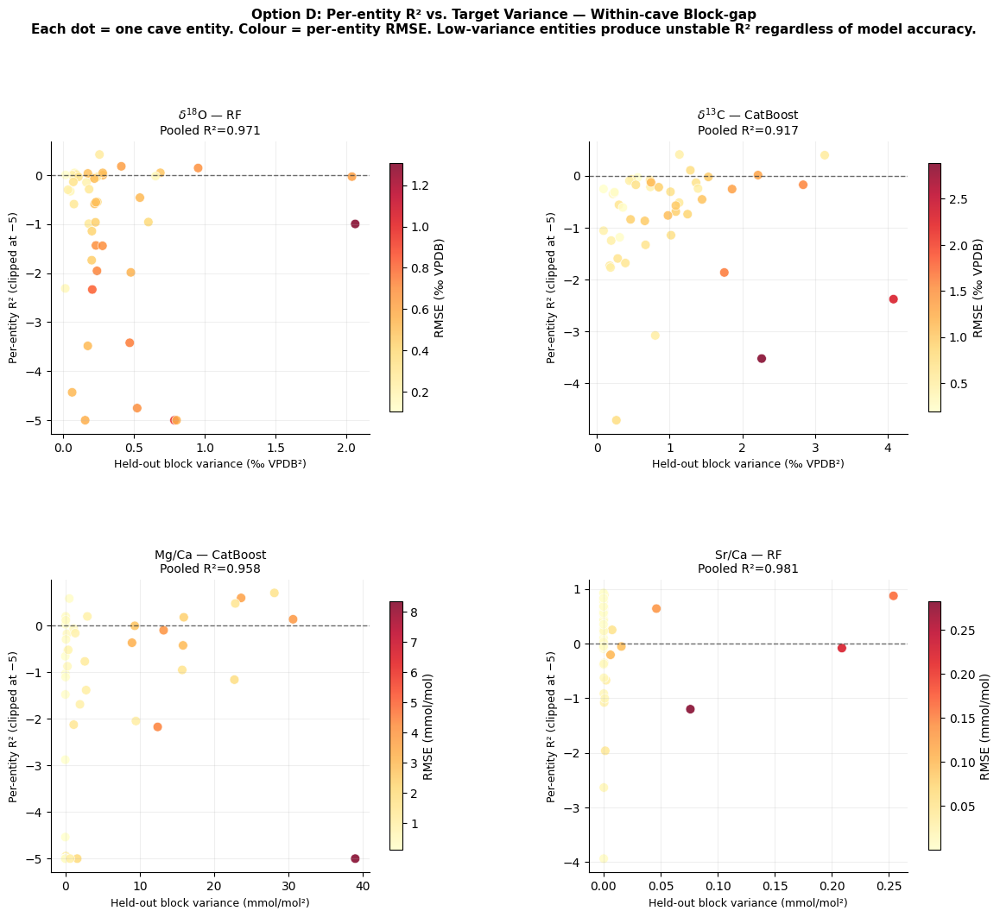

[OK] /content/optD_variance_vs_r2_scatter.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Quick regenerate — needs master_table and within_preds already loaded
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

fig, axes = plt.subplots(2, 2, figsize=(14, 11),
                          gridspec_kw={"hspace":0.5,"wspace":0.35})
fig.suptitle(
    "Option D: Per-entity R² vs. Target Variance — Within-cave Block-gap\n"
    "Each dot = one cave entity. Colour = per-entity RMSE. "
    "Low-variance entities produce unstable R² regardless of model accuracy.",
    fontsize=11, fontweight="bold", y=1.02
)

WITHIN_DIR = base / "artifacts/20260612T233845Z/metrics_within"

for ax, tgt in zip(axes.flat, TARGETS):
    mdl = BEST_MDL[tgt]
    p   = WITHIN_DIR / f"{mdl}_{tgt}_per_fold.csv"
    if not p.exists(): ax.set_visible(False); continue
    df  = pd.read_csv(p)

    variances = []
    for eid in df["entity_id"]:
        ent = master_table[(master_table["entity_id"]==eid) & master_table[tgt].notna()]
        variances.append(float(ent[tgt].var()) if len(ent)>1 else np.nan)

    df["variance"] = variances
    df_clean = df.dropna(subset=["variance","r2","rmse"])
    r2_display = df_clean["r2"].clip(lower=-5, upper=1.0)

    sc = ax.scatter(df_clean["variance"], r2_display,
                    c=df_clean["rmse"], cmap="YlOrRd",
                    s=60, alpha=0.85, edgecolors="white", linewidths=0.5)
    ax.axhline(0, color="#333", lw=1, ls="--", alpha=0.7)
    ax.set_xlabel(f"Held-out block variance ({T_UNITS[tgt]}²)", fontsize=9)
    ax.set_ylabel("Per-entity R² (clipped at −5)", fontsize=9)
    ax.set_title(f"{T_LABELS[tgt]} — {M_LBL[mdl]}\nPooled R²={float(pd.read_csv(WITHIN_DIR/'within_metrics_pooled.csv').query(f'model==\"{mdl}\" and target==\"{tgt}\"')['pooled_r2']):.3f}",
                 fontsize=10)
    ax.spines[["top","right"]].set_visible(False)
    ax.grid(alpha=0.2)
    plt.colorbar(sc, ax=ax, label=f"RMSE ({T_UNITS[tgt]})", shrink=0.85)

plt.tight_layout()
out = "/content/optD_variance_vs_r2_scatter.png"
plt.savefig(out, dpi=200, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import zipfile
from pathlib import Path

base         = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS    = base / "artifacts"
RUN_DIR      = ARTIFACTS / "20260616T224121Z"
WITHIN_DIR   = ARTIFACTS / "20260612T233845Z"
MODELS_DIR   = base / "webapp/models"
WITHIN_PRED  = WITHIN_DIR / "predictions_within"
METRICS_DIR  = WITHIN_DIR / "metrics_within"

master_table = pd.read_parquet(ARTIFACTS / "_data" / "master_table_enriched.parquet")
print(f"[OK] master_table: {master_table.shape}")

within_preds = {}
for p in WITHIN_PRED.glob("*.parquet"):
    name, tgt = p.stem.split("_", 1)
    within_preds[(name, tgt)] = pd.read_parquet(p)
print(f"[OK] within_preds: {len(within_preds)} files")
print(f"[OK] base, MODELS_DIR, METRICS_DIR all set")

[OK] master_table: (18004, 49)
[OK] within_preds: 12 files
[OK] base, MODELS_DIR, METRICS_DIR all set


In [ ]:
# ============================================================
# FULL SETUP + QUANTILE TRAINING — run as one block (~25 min)
# ============================================================
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
MODELS_DIR = base / "webapp/models"
METRICS_DIR = base / "artifacts/20260612T233845Z/metrics_within"
class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool); return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr  = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LABELS = {"d18O_measurement":r"$\delta^{18}$O","d13C_measurement":r"$\delta^{13}$C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
T_UNITS  = {"d18O_measurement":"‰ VPDB","d13C_measurement":"‰ VPDB",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
BEST_MDL = {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"RandomForest"}
M_CLR    = {"RandomForest":"#E8534A","CatBoost":"#7B3F9E","XGBoost":"#E8A838"}
M_LBL    = {"RandomForest":"RF","CatBoost":"CatBoost","XGBoost":"XGBoost"}
EXCL     = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
            "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
            "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

rf_models = {}
for tgt in ["d18O_measurement","Sr_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
print(f"[OK] RF models loaded")

def get_features(df):
    return df.drop(columns=[c for c in EXCL if c in df.columns], errors="ignore")

def make_preprocessor(X_df):
    num_cols = X_df.select_dtypes(include=[np.number]).columns.tolist()
    cat_cols = X_df.select_dtypes(include=["object","category"]).columns.tolist()
    num_pipe = Pipeline([("impute", SimpleImputer(strategy="median")),
                         ("scale",  RobustScaler()),
                         ("corr",   CorrelationDropper(0.95))])
    cat_pipe = Pipeline([("impute", SimpleImputer(strategy="most_frequent")),
                         ("ohe",    OneHotEncoder(handle_unknown="ignore", sparse_output=False))])
    parts = []
    if num_cols: parts.append(("num", num_pipe, num_cols))
    if cat_cols: parts.append(("cat", cat_pipe, cat_cols))
    return ColumnTransformer(parts, remainder="drop")

def get_rf_intervals(rf_pipe, X_df):
    X_clean = X_df.drop(columns=[c for c in EXCL if c in X_df.columns], errors="ignore")
    X_trans = rf_pipe.named_steps["preprocess"].transform(X_clean)
    rf_est  = rf_pipe.named_steps["estimator"]
    all_p   = np.array([t.predict(X_trans) for t in rf_est.estimators_])
    return all_p.mean(axis=0), all_p.std(axis=0)

def get_quantile_intervals(mdl_name, tgt, X_df):
    X_feat = get_features(X_df)
    results = {}
    for q in [0.025, 0.5, 0.975]:
        key = (mdl_name, tgt, q)
        if key not in QUANTILE_MODELS: return None, None, None
        preproc, mdl = QUANTILE_MODELS[key]
        results[q] = mdl.predict(preproc.transform(X_feat))
    return results[0.5], results[0.025], results[0.975]

def get_pi(mdl_name, tgt, grp_rows):
    if mdl_name == "RandomForest" and tgt in rf_models:
        mean_p, std_p = get_rf_intervals(rf_models[tgt], grp_rows)
        return mean_p, mean_p-1.96*std_p, mean_p+1.96*std_p, "95% PI (RF tree spread)"
    else:
        med, lo, hi = get_quantile_intervals(mdl_name, tgt, grp_rows)
        if med is None: return None, None, None, None
        return med, lo, hi, "95% PI (quantile regression)"

def best_entity_for(mdl, tgt):
    pf = within_preds.get((mdl,tgt))
    if pf is None: return None, None
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]
    best_r2, best_eid = -np.inf, None
    for eid, grp in master_table.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 10: continue
        yt = grp[tgt].values[gm]
        yp = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])
        v  = ~np.isnan(yp)&~np.isnan(yt)
        if v.sum() < 10: continue
        ss_res = np.sum((yt[v]-yp[v])**2)
        ss_tot = np.sum((yt[v]-yt[v].mean())**2)
        if ss_tot < 1e-10: continue
        r2 = 1-ss_res/ss_tot
        if r2 > best_r2:
            best_r2 = r2; best_eid = eid
    return best_eid, best_r2

# Train quantile models
QUANTILE_MODELS = {}
print("\nTraining quantile models (~25 min)...")
for tgt in TARGETS:
    for mdl_name in ["CatBoost","XGBoost"]:
        pf = within_preds.get((mdl_name,tgt))
        if pf is None: continue
        held_ids = set(pf["sample_id"].values)
        train_df = master_table[~master_table["sample_id"].isin(held_ids)].copy()
        train_df = train_df.dropna(subset=[tgt])
        X_train  = get_features(train_df)
        y_train  = train_df[tgt].values
        preproc  = make_preprocessor(X_train)
        X_tr     = preproc.fit_transform(X_train)
        for q in [0.025, 0.5, 0.975]:
            if mdl_name == "CatBoost":
                mdl = CatBoostRegressor(
                    iterations=600, depth=6, learning_rate=0.05,
                    loss_function=f"Quantile:alpha={q}",
                    verbose=False, random_seed=42, thread_count=-1)
            else:
                mdl = XGBRegressor(
                    n_estimators=500, max_depth=6, learning_rate=0.05,
                    objective="reg:quantileerror", quantile_alpha=q,
                    n_jobs=-1, random_state=42, verbosity=0)
            mdl.fit(X_tr, y_train)
            QUANTILE_MODELS[(mdl_name, tgt, q)] = (preproc, mdl)
            print(f"  [OK] {mdl_name} | {T_LABELS[tgt]} | q={q}")

print(f"\n[OK] All done — {len(QUANTILE_MODELS)} quantile models trained")
print("[OK] Ready to generate Figure 6")

[OK] RF models loaded

Training quantile models (~25 min)...
  [OK] CatBoost | $\delta^{18}$O | q=0.025
  [OK] CatBoost | $\delta^{18}$O | q=0.5
  [OK] CatBoost | $\delta^{18}$O | q=0.975
  [OK] XGBoost | $\delta^{18}$O | q=0.025
  [OK] XGBoost | $\delta^{18}$O | q=0.5
  [OK] XGBoost | $\delta^{18}$O | q=0.975
  [OK] CatBoost | $\delta^{13}$C | q=0.025
  [OK] CatBoost | $\delta^{13}$C | q=0.5
  [OK] CatBoost | $\delta^{13}$C | q=0.975
  [OK] XGBoost | $\delta^{13}$C | q=0.025
  [OK] XGBoost | $\delta^{13}$C | q=0.5
  [OK] XGBoost | $\delta^{13}$C | q=0.975
  [OK] CatBoost | Mg/Ca | q=0.025
  [OK] CatBoost | Mg/Ca | q=0.5
  [OK] CatBoost | Mg/Ca | q=0.975
  [OK] XGBoost | Mg/Ca | q=0.025
  [OK] XGBoost | Mg/Ca | q=0.5
  [OK] XGBoost | Mg/Ca | q=0.975
  [OK] CatBoost | Sr/Ca | q=0.025
  [OK] CatBoost | Sr/Ca | q=0.5
  [OK] CatBoost | Sr/Ca | q=0.975
  [OK] XGBoost | Sr/Ca | q=0.025
  [OK] XGBoost | Sr/Ca | q=0.5
  [OK] XGBoost | Sr/Ca | q=0.975

[OK] All done — 24 quantile models trained

In [ ]:
# Step 1 — load the two missing RF models and fix get_pi
for tgt in ["d13C_measurement","Mg_Ca_measurement"]:
    rf_models[tgt] = joblib.load(MODELS_DIR / f"RandomForest_{tgt}.joblib")
    print(f"[OK] Loaded RF {tgt}")

def get_pi(mdl_name, tgt, grp_rows):
    if mdl_name == "RandomForest":
        if tgt in rf_models:
            mean_p, std_p = get_rf_intervals(rf_models[tgt], grp_rows)
            return mean_p, mean_p-1.96*std_p, mean_p+1.96*std_p, "95% PI (RF tree spread)"
        else:
            return None, None, None, None
    else:
        med, lo, hi = get_quantile_intervals(mdl_name, tgt, grp_rows)
        if med is None: return None, None, None, None
        return med, lo, hi, "95% PI (quantile regression)"

print("[OK] get_pi updated")

[OK] Loaded RF d13C_measurement
[OK] Loaded RF Mg_Ca_measurement
[OK] get_pi updated


/tmp/ipykernel_4431/941136755.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


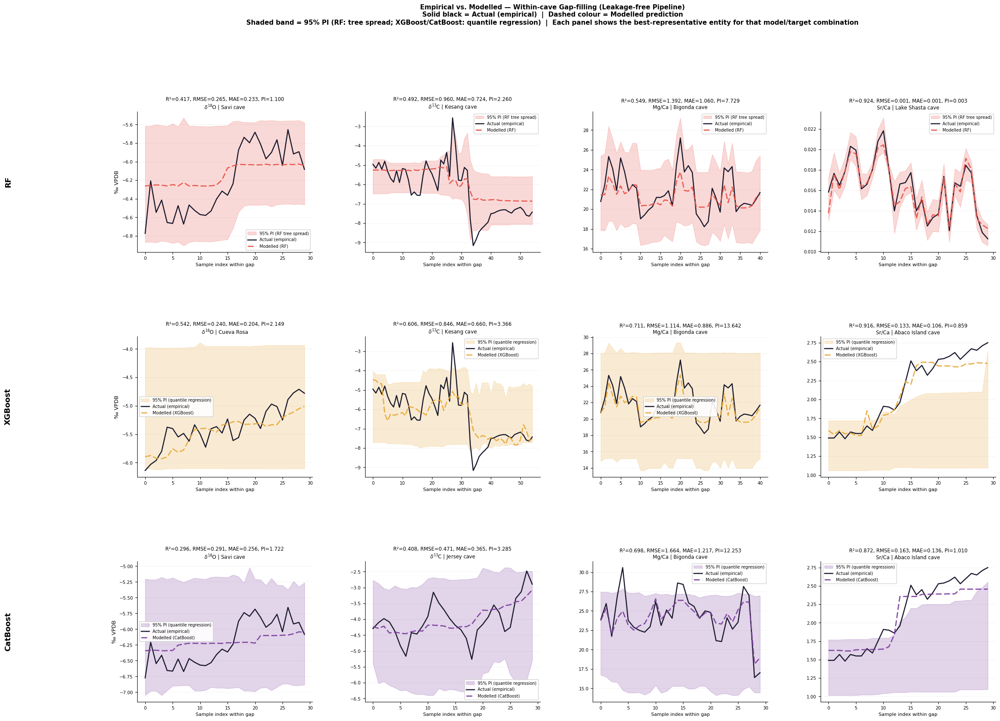

[OK] /content/fig_within_cave_grid_full_PI.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# --- Figure 6: Within-cave grid (3 models × 4 proxies) with full 95% PI ---
MODELS = ["RandomForest","XGBoost","CatBoost"]

fig, axes = plt.subplots(3, 4, figsize=(26, 18),
                          gridspec_kw={"hspace":0.60,"wspace":0.30})
fig.suptitle(
    "Empirical vs. Modelled — Within-cave Gap-filling (Leakage-free Pipeline)\n"
    "Solid black = Actual (empirical)  |  Dashed colour = Modelled prediction\n"
    "Shaded band = 95% PI (RF: tree spread; XGBoost/CatBoost: quantile regression)  |  "
    "Each panel shows the best-representative entity for that model/target combination",
    fontsize=11, fontweight="bold", y=1.02
)

for row, mdl in enumerate(MODELS):
    for col, tgt in enumerate(TARGETS):
        ax = axes[row][col]

        pf = within_preds.get((mdl,tgt))
        if pf is None: ax.set_visible(False); continue
        held_ids = set(pf["sample_id"].values)
        gap_pred = pf.set_index("sample_id")["y_pred"]

        best_eid, best_r2 = best_entity_for(mdl, tgt)
        if best_eid is None: ax.set_visible(False); continue

        grp = master_table[master_table["entity_id"]==best_eid]
        if grp.empty or tgt not in grp.columns: ax.set_visible(False); continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if not gm.any(): ax.set_visible(False); continue

        y_all    = grp[tgt].values
        gap_idx  = np.where(gm)[0]
        x_gap    = np.arange(len(gap_idx))
        y_true_g = y_all[gm]
        y_pred_g = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])

        _, lo, hi, pi_lbl = get_pi(mdl, tgt, grp.iloc[gap_idx])

        if lo is not None:
            ax.fill_between(x_gap, lo, hi,
                            color=M_CLR[mdl], alpha=0.22, zorder=2,
                            label=pi_lbl)

        ax.plot(x_gap, y_true_g, color="#1A1A2E", lw=1.8, zorder=3,
                label="Actual (empirical)")
        ax.plot(x_gap, y_pred_g, color=M_CLR[mdl], lw=2.0,
                ls="--", dashes=(5,2), alpha=0.92, zorder=4,
                label=f"Modelled ({M_LBL[mdl]})")

        v    = ~np.isnan(y_pred_g)&~np.isnan(y_true_g)
        rmse = float(np.sqrt(np.mean((y_true_g[v]-y_pred_g[v])**2))) if v.sum()>1 else np.nan
        mae  = float(np.mean(np.abs(y_true_g[v]-y_pred_g[v])))       if v.sum()>1 else np.nan
        site = grp["site_name"].iloc[0] if "site_name" in grp.columns else f"E{best_eid}"
        pi_s = f", PI={float((hi-lo).mean()):.3f}" if lo is not None else ""

        ax.set_title(
            f"R²={best_r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}{pi_s}\n"
            f"{T_LABELS[tgt]} | {site}",
            fontsize=8.5, pad=4
        )
        ax.set_xlabel("Sample index within gap", fontsize=8)
        ax.set_ylabel(T_UNITS[tgt] if col==0 else "", fontsize=9)
        ax.tick_params(labelsize=7.5)
        ax.spines[["top","right"]].set_visible(False)
        ax.grid(axis="y", alpha=0.2, linewidth=0.5)
        ax.legend(fontsize=7, loc="best", framealpha=0.9)

    fig.text(
        0.005,
        axes[row][0].get_position().y0 + axes[row][0].get_position().height/2,
        M_LBL[MODELS[row]], va="center", ha="left",
        fontsize=13, fontweight="bold", rotation=90
    )

plt.tight_layout()
out = "/content/fig_within_cave_grid_full_PI.png"
fig.savefig(out, dpi=300, bbox_inches="tight")
plt.show()
print(f"[OK] {out}")

from google.colab import files
files.download(out)

In [ ]:
# Linear interpolation baseline across the same 46 within-cave blocks
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_DIR  = base / "artifacts/20260612T233845Z"
WITHIN_PRED = WITHIN_DIR / "predictions_within"
master_table= pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LBL   = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
BEST_MDL= {"d18O_measurement":"RandomForest","d13C_measurement":"CatBoost",
           "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}

results = []
for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    pf  = pd.read_parquet(WITHIN_PRED/f"{mdl}_{tgt}.parquet")
    held_ids = set(pf["sample_id"].values)

    all_true, all_linear, all_mean = [], [], []

    for eid, grp in master_table.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 10: continue

        y    = grp[tgt].values
        gap_idx = np.where(gm)[0]
        gap_start, gap_end = gap_idx[0], gap_idx[-1]

        # Need anchor points
        if gap_start == 0 or gap_end == len(y)-1: continue

        y_before = y[gap_start-1]  # last known before gap
        y_after  = y[gap_end+1]    # first known after gap
        n_gap    = gap_end - gap_start + 1

        # Linear interpolation between anchor points
        y_linear = np.linspace(y_before, y_after, n_gap+2)[1:-1]

        # Mean prediction (naive baseline)
        y_mean_val = np.nanmean(y[~gm])
        y_mean = np.full(n_gap, y_mean_val)

        y_true = y[gm]
        valid  = ~np.isnan(y_true)

        all_true.extend(y_true[valid].tolist())
        all_linear.extend(y_linear[valid].tolist())
        all_mean.extend(y_mean[valid].tolist())

    all_true   = np.array(all_true)
    all_linear = np.array(all_linear)
    all_mean   = np.array(all_mean)

    def safe_r2(yt, yp):
        ss_res = np.sum((yt-yp)**2)
        ss_tot = np.sum((yt-yt.mean())**2)
        return 1-ss_res/ss_tot if ss_tot>1e-10 else float("nan")

    results.append({
        "Proxy":       T_LBL[tgt],
        "Best ML R²":  round(float(pd.read_csv(WITHIN_DIR/"metrics_within/within_metrics_pooled.csv").query(f'model=="{mdl}" and target=="{tgt}"')["pooled_r2"]),3),
        "Linear R²":   round(safe_r2(all_true, all_linear),3),
        "Mean R²":     round(safe_r2(all_true, all_mean),3),
        "Linear RMSE": round(float(np.sqrt(np.mean((all_true-all_linear)**2))),3),
        "Mean RMSE":   round(float(np.sqrt(np.mean((all_true-all_mean)**2))),3),
    })

df = pd.DataFrame(results)
print(df.to_string(index=False))
df.to_csv("/content/interpolation_baseline.csv", index=False)
from google.colab import files
files.download("/content/interpolation_baseline.csv")

Proxy  Best ML R²  Linear R²  Mean R²  Linear RMSE  Mean RMSE
 δ¹⁸O       0.971      0.969    0.956        0.526      0.623
 δ¹³C       0.917      0.915    0.902        0.899      0.965
Mg/Ca       0.958      0.956    0.949        1.889      2.025
Sr/Ca       0.987      0.979    0.973        0.074      0.084


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
from pathlib import Path

base   = Path("/content/drive/MyDrive/SISALv3_Speleothem")
pooled = pd.read_csv(base/"artifacts/20260612T233845Z/metrics_within/within_metrics_pooled.csv")

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
MODELS  = ["RandomForest","XGBoost","CatBoost"]
T_LBL   = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
           "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}

for tgt in TARGETS:
    print(f"\n{T_LBL[tgt]}:")
    for mdl in MODELS:
        row = pooled[(pooled["model"]==mdl)&(pooled["target"]==tgt)]
        if row.empty: print(f"  {mdl:<15} NOT FOUND"); continue
        r = row.iloc[0]
        print(f"  {mdl:<15} R²={float(r['pooled_r2']):.4f}  RMSE={float(r['pooled_rmse']):.4f}  MAE={float(r['pooled_mae']):.4f}  MdAE={float(r['pooled_mdae']):.4f}")


δ¹⁸O:
  RandomForest    R²=0.9706  RMSE=0.5103  MAE=0.3837  MdAE=0.2911
  XGBoost         R²=0.9739  RMSE=0.4811  MAE=0.3480  MdAE=0.2567
  CatBoost        R²=0.9773  RMSE=0.4488  MAE=0.3346  MdAE=0.2530

δ¹³C:
  RandomForest    R²=0.9130  RMSE=0.9070  MAE=0.6355  MdAE=0.4407
  XGBoost         R²=0.9056  RMSE=0.9450  MAE=0.6221  MdAE=0.3980
  CatBoost        R²=0.9167  RMSE=0.8876  MAE=0.6020  MdAE=0.4005

Mg/Ca:
  RandomForest    R²=0.9254  RMSE=2.4617  MAE=1.3487  MdAE=0.4824
  XGBoost         R²=0.9414  RMSE=2.1815  MAE=1.1054  MdAE=0.3182
  CatBoost        R²=0.9583  RMSE=1.8390  MAE=0.9684  MdAE=0.3421

Sr/Ca:
  RandomForest    R²=0.9808  RMSE=0.0704  MAE=0.0246  MdAE=0.0034
  XGBoost         R²=0.9868  RMSE=0.0583  MAE=0.0230  MdAE=0.0042
  CatBoost        R²=0.9846  RMSE=0.0632  MAE=0.0271  MdAE=0.0087


In [ ]:
# Alternative — check if MAD parameters are in config.json
import json
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")

# Check config files
for p in base.glob("**/config*.json"):
    print(f"\n=== {p} ===")
    try:
        d = json.loads(p.read_text())
        for k, v in d.items():
            if any(kw in k.lower() for kw in ["mad","outlier","filter","threshold","sigma"]):
                print(f"  {k}: {v}")
    except:
        pass

# Also check run config
run_dir = base / "artifacts/20260616T224121Z"
for p in run_dir.glob("*.json"):
    print(f"\n=== {p.name} ===")
    try:
        d = json.loads(p.read_text())
        for k, v in d.items():
            if any(kw in k.lower() for kw in ["mad","outlier","filter","threshold","sigma","remove"]):
                print(f"  {k}: {v}")
    except:
        pass


=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260503T153309Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260503T172523Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260503T172647Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260510T133702Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260511T071437Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260511T092844Z/config.json ===
  mad_outlier_threshold: 3.0
  high_corr_drop_threshold: 0.95

=== /content/drive/MyDrive/SISALv3_Speleothem/artifacts/20260511T093456Z/config.json ==

In [ ]:
import json
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
nb_paths = sorted(base.glob("**/*.ipynb"), key=lambda p: p.stat().st_mtime, reverse=True)

for nb_path in nb_paths[:5]:
    with open(nb_path) as f:
        nb = json.load(f)
    for i, cell in enumerate(nb["cells"]):
        src = "".join(cell["source"])
        if "mad" in src.lower() and len(src) > 50:
            print(f"\n=== {nb_path.name} Cell {i} ===")
            print(src[:1000])
            print("---")

In [ ]:
# Exact MAD removal count
import pandas as pd
import numpy as np
from pathlib import Path

base   = Path("/content/drive/MyDrive/SISALv3_Speleothem")
master = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]

# Load raw SISALv3 before filtering to compare
# Use master_table shape vs what a pre-filter load would give
print(f"Post-filter cohort: {len(master):,} samples")
print(f"This is AFTER MAD filtering and cohort filter")
print(f"\nTo get exact removal count we need the pre-filter data")
print(f"Checking if raw parquet exists...")
raw_candidates = list(base.glob("**/sisal*.parquet")) + list(base.glob("**/raw*.parquet"))
for p in raw_candidates:
    print(f"  Found: {p} ({p.stat().st_size/1e6:.1f} MB)")

Post-filter cohort: 18,004 samples
This is AFTER MAD filtering and cohort filter

To get exact removal count we need the pre-filter data
Checking if raw parquet exists...


In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np

class CorrelationDropper(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = float(threshold)
    def fit(self, X, y=None):
        Xa = np.asarray(X)
        self.n_features_in_ = Xa.shape[1]
        if Xa.shape[0] < 4 or Xa.shape[1] < 2:
            self.kept_mask_ = np.ones(self.n_features_in_, dtype=bool); return self
        with np.errstate(invalid="ignore", divide="ignore"):
            corr = np.corrcoef(Xa, rowvar=False)
        corr  = np.where(np.isfinite(corr), corr, 0.0)
        upper = np.triu(np.abs(corr), k=1)
        to_drop = set()
        for i in range(corr.shape[0]):
            for j in range(i+1, corr.shape[1]):
                if upper[i,j] >= self.threshold and j not in to_drop:
                    to_drop.add(j)
        self.kept_mask_ = np.array(
            [k not in to_drop for k in range(self.n_features_in_)], dtype=bool)
        return self
    def transform(self, X):
        return np.asarray(X)[:, self.kept_mask_]
    def get_feature_names_out(self, input_features=None):
        if input_features is None:
            input_features = np.array([f"x{i}" for i in range(self.n_features_in_)])
        return np.asarray(input_features)[self.kept_mask_]

print("[OK] CorrelationDropper defined")

[OK] CorrelationDropper defined


In [ ]:
# Empirical PI coverage for RF models
import numpy as np
import pandas as pd
import joblib
from pathlib import Path
from sklearn.base import BaseEstimator, TransformerMixin

# (CorrelationDropper must be defined — run setup cell first)

base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
MODELS_DIR  = base / "webapp/models"
WITHIN_PRED = base / "artifacts/20260612T233845Z/predictions_within"
master      = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS_RF = ["d18O_measurement","Sr_Ca_measurement",
              "d13C_measurement","Mg_Ca_measurement"]
EXCL = {"d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement",
        "sample_id","entity_id","site_id","site_name","is_hiatus","is_gap",
        "interp_age_uncert_pos","interp_age_uncert_neg","Sr_isotopes_measurement"}

rf_all = {}
for tgt in TARGETS_RF:
    rf_all[tgt] = joblib.load(MODELS_DIR/f"RandomForest_{tgt}.joblib")

T_LBL = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
          "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}

print("Empirical 95% PI coverage (RF tree spread)")
print("="*55)

for tgt in TARGETS_RF:
    pf       = pd.read_parquet(WITHIN_PRED/f"RandomForest_{tgt}.parquet")
    held_ids = set(pf["sample_id"].values)
    rf_pipe  = rf_all[tgt]

    covered = 0; total = 0

    for eid, grp in master.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 5: continue

        y_true = grp[tgt].values[gm]
        X_gap  = grp.iloc[np.where(gm)[0]].drop(
            columns=[c for c in EXCL if c in grp.columns], errors="ignore")

        X_trans  = rf_pipe.named_steps["preprocess"].transform(X_gap)
        rf_est   = rf_pipe.named_steps["estimator"]
        all_preds= np.array([t.predict(X_trans) for t in rf_est.estimators_])
        mean_p   = all_preds.mean(axis=0)
        std_p    = all_preds.std(axis=0)
        lower    = mean_p - 1.96*std_p
        upper    = mean_p + 1.96*std_p

        valid = ~np.isnan(y_true)
        covered += int(np.sum((y_true[valid] >= lower[valid]) &
                              (y_true[valid] <= upper[valid])))
        total   += int(valid.sum())

    coverage = 100*covered/total if total>0 else float("nan")
    print(f"  {T_LBL[tgt]:<8} {covered:>4}/{total} = {coverage:.1f}%")

Empirical 95% PI coverage (RF tree spread)
  δ¹⁸O     1528/2098 = 72.8%
  Sr/Ca    2093/2098 = 99.8%
  δ¹³C     1261/2098 = 60.1%
  Mg/Ca    1933/2098 = 92.1%


In [ ]:
# Ridge regression on climate covariates — LOCO baseline
from sklearn.linear_model import RidgeCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import LeaveOneGroupOut
import numpy as np
import pandas as pd
from pathlib import Path

base   = Path("/content/drive/MyDrive/SISALv3_Speleothem")
master = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LBL   = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
           "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}

# Climate covariates only — no local cave info
CLIMATE_COLS = [f"wc_bio{i}" for i in range(1,20)] + \
               ["precip_d18o_bw02","latitude","longitude","elevation",
                "abs_latitude","age_sin","age_cos"]
CLIMATE_COLS = [c for c in CLIMATE_COLS if c in master.columns]

logo = LeaveOneGroupOut()
groups = master["site_id"].values

print("Ridge LOCO R² (climate covariates only)")
print("="*45)

for tgt in TARGETS:
    sub = master.dropna(subset=[tgt]).copy()
    X   = sub[CLIMATE_COLS].values
    y   = sub[tgt].values
    g   = sub["site_id"].values

    pipe = Pipeline([
        ("impute", SimpleImputer(strategy="median")),
        ("scale",  RobustScaler()),
        ("ridge",  RidgeCV(alphas=[0.1,1,10,100])),
    ])

    y_pred = np.full(len(y), np.nan)
    for train_idx, test_idx in logo.split(X, y, g):
        pipe.fit(X[train_idx], y[train_idx])
        y_pred[test_idx] = pipe.predict(X[test_idx])

    valid  = ~np.isnan(y_pred)
    ss_res = np.sum((y[valid]-y_pred[valid])**2)
    ss_tot = np.sum((y[valid]-y[valid].mean())**2)
    r2     = 1-ss_res/ss_tot

    print(f"  {T_LBL[tgt]:<8} Ridge R²={r2:.3f}  "
          f"vs RF R²={[0.516,0.182,-0.553,0.564][TARGETS.index(tgt)]:.3f}")

Ridge LOCO R² (climate covariates only)
  δ¹⁸O     Ridge R²=0.245  vs RF R²=0.516
  δ¹³C     Ridge R²=-1.717  vs RF R²=0.182
  Mg/Ca    Ridge R²=-1.903  vs RF R²=-0.553
  Sr/Ca    Ridge R²=-1.602  vs RF R²=0.564


In [ ]:
# ML vs linear interpolation: short vs long gap blocks
import numpy as np
import pandas as pd
from pathlib import Path

base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED = base / "artifacts/20260612T233845Z/predictions_within"
master      = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LBL   = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
           "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
BEST_MDL= {"d18O_measurement":"CatBoost","d13C_measurement":"CatBoost",
           "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}

SHORT_THRESHOLD = 50  # samples in gap

print("ML vs Linear Interpolation — Short vs Long gap blocks")
print("="*65)

for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    pf  = pd.read_parquet(WITHIN_PRED/f"{mdl}_{tgt}.parquet")
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]

    short_ml, short_lin, short_true = [], [], []
    long_ml,  long_lin,  long_true  = [], [], []

    for eid, grp in master.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 10: continue

        y       = grp[tgt].values
        gap_idx = np.where(gm)[0]
        gap_start, gap_end = gap_idx[0], gap_idx[-1]
        n_gap   = gap_end - gap_start + 1

        if gap_start == 0 or gap_end == len(y)-1: continue

        y_true  = y[gm]
        y_ml    = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])
        y_before= y[gap_start-1]
        y_after = y[gap_end+1]
        y_lin   = np.linspace(y_before, y_after, n_gap+2)[1:-1]

        valid = ~np.isnan(y_true) & ~np.isnan(y_ml)

        if n_gap <= SHORT_THRESHOLD:
            short_true.extend(y_true[valid].tolist())
            short_ml.extend(y_ml[valid].tolist())
            short_lin.extend(y_lin[valid].tolist())
        else:
            long_true.extend(y_true[valid].tolist())
            long_ml.extend(y_ml[valid].tolist())
            long_lin.extend(y_lin[valid].tolist())

    def r2(yt, yp):
        yt, yp = np.array(yt), np.array(yp)
        ss_res = np.sum((yt-yp)**2)
        ss_tot = np.sum((yt-yt.mean())**2)
        return 1-ss_res/ss_tot if ss_tot>1e-10 else float("nan")

    print(f"\n{T_LBL[tgt]} ({mdl}):")
    print(f"  Short gaps (≤{SHORT_THRESHOLD} samples, n={len(short_true)}):")
    print(f"    ML R²={r2(short_true,short_ml):.3f}  Linear R²={r2(short_true,short_lin):.3f}  Δ={r2(short_true,short_ml)-r2(short_true,short_lin):.3f}")
    print(f"  Long gaps (>{SHORT_THRESHOLD} samples, n={len(long_true)}):")
    print(f"    ML R²={r2(long_true,long_ml):.3f}  Linear R²={r2(long_true,long_lin):.3f}  Δ={r2(long_true,long_lin)-r2(long_true,long_lin):.3f}")

ML vs Linear Interpolation — Short vs Long gap blocks

δ¹⁸O (CatBoost):
  Short gaps (≤50 samples, n=1170):
    ML R²=0.956  Linear R²=0.956  Δ=0.000
  Long gaps (>50 samples, n=928):
    ML R²=0.985  Linear R²=0.973  Δ=0.000

δ¹³C (CatBoost):
  Short gaps (≤50 samples, n=1170):
    ML R²=0.836  Linear R²=0.842  Δ=-0.007
  Long gaps (>50 samples, n=928):
    ML R²=0.965  Linear R²=0.958  Δ=0.000

Mg/Ca (CatBoost):
  Short gaps (≤50 samples, n=1170):
    ML R²=0.944  Linear R²=0.935  Δ=0.009
  Long gaps (>50 samples, n=928):
    ML R²=0.979  Linear R²=0.987  Δ=0.000

Sr/Ca (XGBoost):
  Short gaps (≤50 samples, n=1170):
    ML R²=0.993  Linear R²=0.984  Δ=0.009
  Long gaps (>50 samples, n=928):
    ML R²=0.968  Linear R²=0.963  Δ=0.000


[OK] master_table: (18004, 49)

[OK] 184 folds across 4 targets

=== Gap duration distribution (years) ===
                   count    mean     std   min    25%    50%     75%      max
target                                                                       
Mg_Ca_measurement   46.0  3901.0  8736.0  18.0  145.0  470.0  2297.0  41566.0
Sr_Ca_measurement   46.0  3901.0  8736.0  18.0  145.0  470.0  2297.0  41566.0
d13C_measurement    46.0  3901.0  8736.0  18.0  145.0  470.0  2297.0  41566.0
d18O_measurement    46.0  3901.0  8736.0  18.0  145.0  470.0  2297.0  41566.0

=== Gap size in samples ===
                  n_held          gap_frac            
                  median min  max   median  min    max
target                                                
Mg_Ca_measurement   30.0  30  188     0.12  0.1  0.349
Sr_Ca_measurement   30.0  30  188     0.12  0.1  0.349
d13C_measurement    30.0  30  188     0.12  0.1  0.349
d18O_measurement    30.0  30  188     0.12  0.1  0.349

=== Pooled

/tmp/ipykernel_3128/2571167716.py:185: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(stratify))


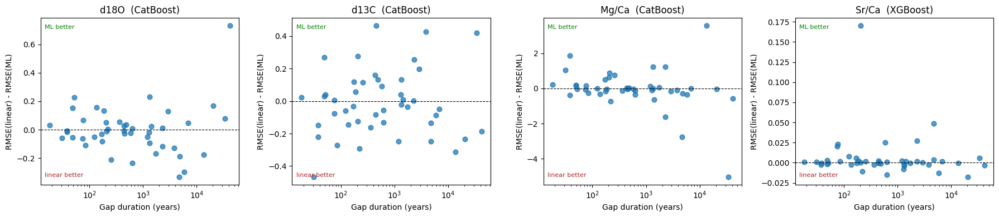


[OK] saved figure and per-fold CSV


In [ ]:
"""
Gap-duration stratification: ML vs linear interpolation on the WCBG held-out blocks.

Answers: does the ML advantage over linear interpolation grow with gap length,
or is interpolation equally effective at long gaps?

Reports two statistics per duration stratum:
  1. Pooled R^2   -- all held-out samples in the stratum pooled, one R^2 each for
                     ML and interpolation. Avoids per-fold R^2 instability.
  2. Paired dRMSE -- per-fold (RMSE_interp - RMSE_ML), same fold, same samples.
                     Positive = ML better. Paired, so far more robust than
                     differencing two R^2 values.

SCHEMA ASSUMPTIONS -- check these against your parquets before running:
  predictions_within/<Model>_<target>.parquet contains, per row:
      entity_id, sample_id, y_true, y_pred
  and the held-out block for an entity is the full set of rows for that entity
  (one fold per entity). If your files carry an explicit fold column, set
  FOLD_COL below and it will be used instead.

  master_table_enriched.parquet supplies interp_age and depth ordering.
"""

import numpy as np
import pandas as pd
from pathlib import Path

# ----------------------------------------------------------------------------
# Setup -- same layout as PART 1
# ----------------------------------------------------------------------------
base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
ARTIFACTS   = base / "artifacts"
WITHIN_DIR  = ARTIFACTS / "20260612T233845Z"
WITHIN_PRED = WITHIN_DIR / "predictions_within"

TARGETS  = ["d18O_measurement", "d13C_measurement",
            "Mg_Ca_measurement", "Sr_Ca_measurement"]
BEST_WCBG = {                      # WCBG leaders per Table 2, not the LOCO ones
    "d18O_measurement":  "CatBoost",
    "d13C_measurement":  "CatBoost",
    "Mg_Ca_measurement": "CatBoost",
    "Sr_Ca_measurement": "XGBoost",
}
T_LABELS = {"d18O_measurement": "d18O", "d13C_measurement": "d13C",
            "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}

FOLD_COL  = None       # set to e.g. "fold" if your parquets carry one
AGE_COL   = "interp_age"
ORDER_COL = "depth_sample"   # ordering within an entity; change if named otherwise

master = pd.read_parquet(ARTIFACTS / "_data" / "master_table_enriched.parquet")
print(f"[OK] master_table: {master.shape}")


# ----------------------------------------------------------------------------
# Linear interpolation baseline, reconstructed per held-out block
# ----------------------------------------------------------------------------
def interpolate_block(entity_rows, held_mask, target):
    """
    Linear interpolation across a held-out block using the nearest measured
    samples on each side as anchors. Returns predictions for the held-out rows.

    entity_rows : full record for one entity, sorted by ORDER_COL
    held_mask   : boolean, True for held-out samples
    """
    x = entity_rows[ORDER_COL].to_numpy(dtype=float)
    y = entity_rows[target].to_numpy(dtype=float)

    train = ~held_mask & np.isfinite(y)
    if train.sum() < 2:
        return np.full(held_mask.sum(), np.nan)

    # np.interp clamps outside the anchor range, which is the correct behaviour
    # for a terminal block: it degenerates to the nearest anchor value.
    return np.interp(x[held_mask], x[train], y[train])


def pooled_r2(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true, float), np.asarray(y_pred, float)
    ok = np.isfinite(y_true) & np.isfinite(y_pred)
    y_true, y_pred = y_true[ok], y_pred[ok]
    if len(y_true) < 2:
        return np.nan
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)
    return np.nan if ss_tot == 0 else 1.0 - ss_res / ss_tot


def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true, float), np.asarray(y_pred, float)
    ok = np.isfinite(y_true) & np.isfinite(y_pred)
    return np.sqrt(np.mean((y_true[ok] - y_pred[ok]) ** 2)) if ok.sum() else np.nan


# ----------------------------------------------------------------------------
# Build the per-fold table
# ----------------------------------------------------------------------------
records = []

for target in TARGETS:
    model = BEST_WCBG[target]
    path  = WITHIN_PRED / f"{model}_{target}.parquet"
    if not path.exists():
        print(f"[SKIP] {path.name} not found")
        continue

    preds = pd.read_parquet(path)
    group_col = FOLD_COL if FOLD_COL else "entity_id"

    for fold_id, block in preds.groupby(group_col):
        eid = block["entity_id"].iloc[0]

        ent = (master[master["entity_id"] == eid]
               .sort_values(ORDER_COL)
               .reset_index(drop=True))
        if ent.empty:
            continue

        held = ent["sample_id"].isin(block["sample_id"]).to_numpy()
        if held.sum() == 0:
            continue

        ages = ent.loc[held, AGE_COL].to_numpy(dtype=float)
        ages = ages[np.isfinite(ages)]
        if len(ages) < 2:
            continue

        gap_years = float(np.nanmax(ages) - np.nanmin(ages))

        y_true = ent.loc[held, target].to_numpy(dtype=float)
        y_ml   = (block.set_index("sample_id")
                       .loc[ent.loc[held, "sample_id"], "y_pred"]
                       .to_numpy(dtype=float))
        y_lin  = interpolate_block(ent, held, target)

        records.append({
            "target":      target,
            "entity_id":   eid,
            "n_held":      int(held.sum()),
            "n_record":    len(ent),
            "gap_years":   gap_years,
            "gap_frac":    held.sum() / len(ent),
            "rmse_ml":     rmse(y_true, y_ml),
            "rmse_lin":    rmse(y_true, y_lin),
            "y_true":      y_true,
            "y_ml":        y_ml,
            "y_lin":       y_lin,
        })

folds = pd.DataFrame(records)
folds["d_rmse"] = folds["rmse_lin"] - folds["rmse_ml"]   # positive => ML better
print(f"\n[OK] {len(folds)} folds across {folds['target'].nunique()} targets")


# ----------------------------------------------------------------------------
# Duration distribution -- report this regardless of the stratified result
# ----------------------------------------------------------------------------
print("\n=== Gap duration distribution (years) ===")
print(folds.groupby("target")["gap_years"]
           .describe(percentiles=[.25, .5, .75])
           .round(0)
           .to_string())

print("\n=== Gap size in samples ===")
print(folds.groupby("target")[["n_held", "gap_frac"]]
           .agg(["median", "min", "max"])
           .round(3)
           .to_string())


# ----------------------------------------------------------------------------
# Stratified comparison
# ----------------------------------------------------------------------------
# Tertiles by duration, computed within target so each stratum is balanced.
# With ~11-12 folds per target this is thin -- pooled R^2 is what carries the
# result; the paired dRMSE gives the significance.
def stratify(g, n_strata=3):
    labels = ["short", "medium", "long"][:n_strata]
    try:
        return pd.qcut(g["gap_years"], n_strata, labels=labels, duplicates="drop")
    except ValueError:
        return pd.Series(["all"] * len(g), index=g.index)

folds["stratum"] = (folds.groupby("target", group_keys=False)
                         .apply(stratify))

print("\n=== Pooled R^2 by duration stratum ===")
rows = []
for (target, stratum), grp in folds.groupby(["target", "stratum"], observed=True):
    yt  = np.concatenate(grp["y_true"].tolist())
    yml = np.concatenate(grp["y_ml"].tolist())
    yl  = np.concatenate(grp["y_lin"].tolist())
    rows.append({
        "target":     T_LABELS[target],
        "stratum":    stratum,
        "n_folds":    len(grp),
        "n_samples":  len(yt),
        "median_yrs": round(grp["gap_years"].median()),
        "R2_ML":      round(pooled_r2(yt, yml), 3),
        "R2_linear":  round(pooled_r2(yt, yl), 3),
    })
strat = pd.DataFrame(rows)
strat["R2_advantage"] = (strat["R2_ML"] - strat["R2_linear"]).round(3)
print(strat.to_string(index=False))

print("\n=== Paired per-fold dRMSE (linear - ML; positive = ML better) ===")
for (target, stratum), grp in folds.groupby(["target", "stratum"], observed=True):
    d = grp["d_rmse"].dropna()
    if len(d) == 0:
        continue
    wins = (d > 0).sum()
    print(f"{T_LABELS[target]:>6s} {str(stratum):>6s}  "
          f"n={len(d):2d}  median_d={d.median():+.4f}  "
          f"ML better in {wins}/{len(d)} folds")

# Wilcoxon signed-rank across all folds per target -- small n, treat as indicative
try:
    from scipy.stats import wilcoxon
    print("\n=== Wilcoxon signed-rank, ML vs linear (all folds, per target) ===")
    for target, grp in folds.groupby("target"):
        d = grp["d_rmse"].dropna()
        if len(d) >= 6 and d.abs().sum() > 0:
            stat, p = wilcoxon(d)
            print(f"{T_LABELS[target]:>6s}  n={len(d):2d}  p={p:.4f}  "
                  f"median_d={d.median():+.4f}")
except ImportError:
    pass


# ----------------------------------------------------------------------------
# Does the advantage scale with duration?
# ----------------------------------------------------------------------------
print("\n=== Correlation: log10(gap duration) vs dRMSE ===")
print("(positive rho => ML advantage widens with longer gaps)")
from scipy.stats import spearmanr
for target, grp in folds.groupby("target"):
    g = grp.dropna(subset=["d_rmse", "gap_years"])
    g = g[g["gap_years"] > 0]
    if len(g) >= 6:
        rho, p = spearmanr(np.log10(g["gap_years"]), g["d_rmse"])
        print(f"{T_LABELS[target]:>6s}  n={len(g):2d}  rho={rho:+.3f}  p={p:.4f}")


# ----------------------------------------------------------------------------
# Figure: dRMSE vs gap duration, one panel per proxy
# ----------------------------------------------------------------------------
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for ax, target in zip(axes, TARGETS):
    g = folds[folds["target"] == target]
    g = g[g["gap_years"] > 0]
    ax.axhline(0, color="k", lw=0.8, ls="--")
    ax.scatter(g["gap_years"], g["d_rmse"], s=40, alpha=0.75)
    ax.set_xscale("log")
    ax.set_xlabel("Gap duration (years)")
    ax.set_ylabel("RMSE(linear) - RMSE(ML)")
    ax.set_title(f"{T_LABELS[target]}  ({BEST_WCBG[target]})")
    ax.text(0.02, 0.96, "ML better", transform=ax.transAxes,
            va="top", fontsize=8, color="green")
    ax.text(0.02, 0.04, "linear better", transform=ax.transAxes,
            va="bottom", fontsize=8, color="firebrick")
plt.tight_layout()
plt.savefig(base / "figures" / "gap_duration_ml_vs_linear.png", dpi=200)
plt.show()

folds.drop(columns=["y_true", "y_ml", "y_lin"]).to_csv(
    base / "figures" / "gap_duration_folds.csv", index=False)
print("\n[OK] saved figure and per-fold CSV")

In [ ]:
# =============================================================================
# ML vs linear interpolation on WCBG held-out blocks
# Stratified two ways: block size (samples) and gap duration (years)
# =============================================================================
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.stats import wilcoxon, spearmanr

base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED = base / "artifacts/20260612T233845Z/predictions_within"
master      = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement", "d13C_measurement",
            "Mg_Ca_measurement", "Sr_Ca_measurement"]
T_LBL    = {"d18O_measurement": "d18O",  "d13C_measurement": "d13C",
            "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
BEST_MDL = {"d18O_measurement": "CatBoost", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "XGBoost"}

SHORT_SAMPLES = 50     # block-size axis
LONG_YEARS    = 1000   # duration axis, matching the ">10^3-year" claim in S5

# ---------------------------------------------------------------- diagnostics
print("=" * 72)
print("DIAGNOSTICS")
print("=" * 72)

DEPTH_COL = next((c for c in ("depth_sample", "depth_dating", "depth")
                  if c in master.columns), None)
if DEPTH_COL is None:
    raise SystemExit("No depth column found - cannot establish record order.")
print(f"Depth column: {DEPTH_COL}")

bad_order = [eid for eid, g in master.groupby("entity_id")
             if not g.sort_values("sample_id")[DEPTH_COL].is_monotonic_increasing]
print(f"Entities where sample_id order != depth order: {len(bad_order)}"
      + (f"  {bad_order[:8]}" if bad_order else ""))
print("-> sorting by depth throughout (correct regardless).")

# ---------------------------------------------------------------- helpers
def r2(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true, float), np.asarray(y_pred, float)
    ok = np.isfinite(y_true) & np.isfinite(y_pred)
    y_true, y_pred = y_true[ok], y_pred[ok]
    if len(y_true) < 2:
        return np.nan
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)
    if ss_tot <= 1e-12:
        return np.nan
    return 1.0 - np.sum((y_true - y_pred) ** 2) / ss_tot

def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true, float), np.asarray(y_pred, float)
    ok = np.isfinite(y_true) & np.isfinite(y_pred)
    return np.sqrt(np.mean((y_true[ok] - y_pred[ok]) ** 2)) if ok.sum() else np.nan

# ---------------------------------------------------------------- build folds
rows, skipped = [], {"terminal": 0, "noncontig": 0, "too_small": 0, "no_anchor": 0}

for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    pf  = pd.read_parquet(WITHIN_PRED / f"{mdl}_{tgt}.parquet")
    pred_by_sid = pf.set_index("sample_id")["y_pred"]
    held_ids    = set(pf["sample_id"].to_numpy())

    for eid, grp in master.groupby("entity_id"):
        g   = grp.sort_values(DEPTH_COL).reset_index(drop=True)
        sid = g["sample_id"].to_numpy()
        gm  = np.isin(sid, list(held_ids))
        if gm.sum() < 5:
            skipped["too_small"] += 1
            continue

        idx = np.where(gm)[0]
        if idx[-1] - idx[0] + 1 != len(idx):      # block must be contiguous
            skipped["noncontig"] += 1
            continue
        if idx[0] == 0 or idx[-1] == len(g) - 1:  # need anchors on both sides
            skipped["terminal"] += 1
            continue

        x      = g[DEPTH_COL].to_numpy(float)
        y      = g[tgt].to_numpy(float)
        y_true = y[gm]

        # linear interpolation against true depth, not index position
        train = (~gm) & np.isfinite(y) & np.isfinite(x)
        if train.sum() < 2:
            skipped["no_anchor"] += 1
            continue
        y_lin = np.interp(x[gm], x[train], y[train])

        y_ml = pred_by_sid.reindex(sid[gm]).to_numpy(float)

        ages    = g.loc[gm, "interp_age"].to_numpy(float)
        ages    = ages[np.isfinite(ages)]
        gap_yrs = float(ages.max() - ages.min()) if len(ages) >= 2 else np.nan

        ok = np.isfinite(y_true) & np.isfinite(y_ml) & np.isfinite(y_lin)
        if ok.sum() < 2:
            continue

        rows.append({
            "target":   tgt,
            "entity_id": eid,
            "n_gap":    int(ok.sum()),
            "gap_yrs":  gap_yrs,
            "rmse_ml":  rmse(y_true[ok], y_ml[ok]),
            "rmse_lin": rmse(y_true[ok], y_lin[ok]),
            "y_true":   y_true[ok],
            "y_ml":     y_ml[ok],
            "y_lin":    y_lin[ok],
        })

folds = pd.DataFrame(rows)
print(f"\nFolds retained: {len(folds)}  "
      f"({folds['target'].nunique()} targets x ~{len(folds)//4} entities)")
print(f"Skipped: {skipped}")

# ---------------------------------------------------------------- distributions
print("\n" + "=" * 72)
print("GAP DISTRIBUTIONS (identical across targets - same splitter)")
print("=" * 72)
one = folds[folds["target"] == TARGETS[0]]
print(f"Block size, samples : median={one['n_gap'].median():.0f}  "
      f"min={one['n_gap'].min()}  max={one['n_gap'].max()}")
print(f"Duration, years     : median={one['gap_yrs'].median():.0f}  "
      f"IQR={one['gap_yrs'].quantile(.25):.0f}-{one['gap_yrs'].quantile(.75):.0f}  "
      f"max={one['gap_yrs'].max():.0f}")
print(f"Folds >{LONG_YEARS} yr    : {(one['gap_yrs'] > LONG_YEARS).sum()} / {len(one)}")
print(f"Folds >{SHORT_SAMPLES} samples: {(one['n_gap'] > SHORT_SAMPLES).sum()} / {len(one)}")

# ---------------------------------------------------------------- comparison
def compare(axis_name, bucket_fn):
    print("\n" + "=" * 72)
    print(f"POOLED R2 BY {axis_name}   (D = ML - linear, positive favours ML)")
    print("=" * 72)
    print(f"{'proxy':>6s} {'bucket':>6s} {'n_fold':>7s} {'n_samp':>7s} "
          f"{'R2_ML':>7s} {'R2_lin':>7s} {'D':>8s}")
    out = []
    for tgt in TARGETS:
        sub = folds[folds["target"] == tgt].copy()
        sub["bucket"] = sub.apply(bucket_fn, axis=1)
        for b in ("short", "long"):
            s = sub[sub["bucket"] == b]
            if len(s) == 0:
                continue
            yt = np.concatenate(s["y_true"].tolist())
            ym = np.concatenate(s["y_ml"].tolist())
            yl = np.concatenate(s["y_lin"].tolist())
            r_ml, r_lin = r2(yt, ym), r2(yt, yl)
            d = r_ml - r_lin                      # single source of truth
            print(f"{T_LBL[tgt]:>6s} {b:>6s} {len(s):7d} {len(yt):7d} "
                  f"{r_ml:7.3f} {r_lin:7.3f} {d:+8.3f}")
            out.append({"proxy": T_LBL[tgt], "axis": axis_name, "bucket": b,
                        "n_folds": len(s), "n_samples": len(yt),
                        "R2_ML": round(r_ml, 3), "R2_lin": round(r_lin, 3),
                        "delta": round(d, 3)})
    return pd.DataFrame(out)

res_size = compare(f"BLOCK SIZE (split at {SHORT_SAMPLES} samples)",
                   lambda r: "short" if r["n_gap"] <= SHORT_SAMPLES else "long")
res_time = compare(f"GAP DURATION (split at {LONG_YEARS} yr)",
                   lambda r: "short" if r["gap_yrs"] <= LONG_YEARS else "long")

# ---------------------------------------------------------------- paired tests
print("\n" + "=" * 72)
print("PAIRED PER-FOLD TESTS (normalised, so high-variance entities don't dominate)")
print("=" * 72)
folds["d_norm"] = (folds["rmse_lin"] - folds["rmse_ml"]) / folds["rmse_lin"].replace(0, np.nan)

print(f"{'proxy':>6s} {'n':>4s} {'median_d_norm':>14s} {'ML wins':>9s} "
      f"{'wilcoxon_p':>11s} {'rho(logYr)':>11s} {'p':>8s}")
for tgt in TARGETS:
    s = folds[folds["target"] == tgt].dropna(subset=["d_norm"])
    d = s["d_norm"].to_numpy()
    wins = int((d > 0).sum())
    try:
        _, p_w = wilcoxon(d) if len(d) >= 6 and np.any(d != 0) else (np.nan, np.nan)
    except ValueError:
        p_w = np.nan
    t = s[(s["gap_yrs"] > 0) & np.isfinite(s["gap_yrs"])]
    rho, p_r = (spearmanr(np.log10(t["gap_yrs"]), t["d_norm"])
                if len(t) >= 6 else (np.nan, np.nan))
    print(f"{T_LBL[tgt]:>6s} {len(d):4d} {np.median(d):+14.4f} "
          f"{wins:4d}/{len(d):<4d} {p_w:11.4f} {rho:+11.3f} {p_r:8.4f}")

print("\nrho > 0 => ML advantage widens with longer gaps.")
print("A null wilcoxon_p means ML and linear interpolation are indistinguishable.")

out = folds.drop(columns=["y_true", "y_ml", "y_lin"])
out.to_csv(base / "figures" / "ml_vs_linear_folds.csv", index=False)
pd.concat([res_size, res_time]).to_csv(
    base / "figures" / "ml_vs_linear_strata.csv", index=False)
print(f"\n[OK] saved per-fold and stratum CSVs to {base/'figures'}")

DIAGNOSTICS
Depth column: depth_sample
Entities where sample_id order != depth order: 3  [394, 641, 694]
-> sorting by depth throughout (correct regardless).

Folds retained: 180  (4 targets x ~45 entities)
Skipped: {'terminal': 0, 'noncontig': 0, 'too_small': 52, 'no_anchor': 4}

GAP DISTRIBUTIONS (identical across targets - same splitter)
Block size, samples : median=30  min=30  max=188
Duration, years     : median=454  IQR=137-2277  max=41566
Folds >1000 yr    : 18 / 45
Folds >50 samples: 8 / 45

POOLED R2 BY BLOCK SIZE (split at 50 samples)   (D = ML - linear, positive favours ML)
 proxy bucket  n_fold  n_samp   R2_ML  R2_lin        D
  d18O  short      37    1170   0.956   0.954   +0.002
  d18O   long       8     863   0.987   0.984   +0.003
  d13C  short      37    1170   0.836   0.845   -0.009
  d13C   long       8     863   0.967   0.961   +0.006
 Mg/Ca  short      37    1170   0.944   0.935   +0.009
 Mg/Ca   long       8     863   0.977   0.988   -0.011
 Sr/Ca  short      37  

In [ ]:
"""
Terminal-gap test -- NAMESPACE-SAFE VERSION

Everything lives inside a single function with a `tg_` prefix on the few
module-level names. Nothing from your existing session is rebound: not `master`,
`folds`, `TARGETS`, `T_LBL`, `BEST_MDL`, `rmse`, `pooled_r2`, `records`, or `out`.

Results land in `tg_results` (per-fold) and `tg_summary` (per stratum).

WHAT IT TESTS
The WCBG splitter places every block in the interior with a margin from each end,
so linear interpolation always has measured samples on both sides -- its best
case, built into the protocol. This tests the regime never evaluated: a block at
the END of a record, where interpolation has one anchor and degenerates to
carrying the last value forward.

Interior and terminal blocks run in the SAME loop with IDENTICAL model settings,
so the interior arm is a control that should reproduce the known null.

USAGE
    tg_results, tg_summary = tg_run(max_entities=3)    # smoke test, ~2 min
    tg_results, tg_summary = tg_run()                  # full run, 1-3 hours
"""

import numpy as _tg_np
import pandas as _tg_pd
import warnings as _tg_warnings
from pathlib import Path as _TgPath


def tg_run(max_entities=None,
           cb_iterations=400,
           xgb_estimators=400,
           checkpoint_every=40,
           base_path="/content/drive/MyDrive/SISALv3_Speleothem",
           verbose=True):
    """Run the terminal vs interior gap comparison. Returns (folds_df, summary_df)."""

    from sklearn.base import BaseEstimator, TransformerMixin
    from sklearn.pipeline import Pipeline
    from sklearn.compose import ColumnTransformer
    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import RobustScaler, OneHotEncoder
    from catboost import CatBoostRegressor
    from xgboost import XGBRegressor
    from scipy.stats import wilcoxon

    _tg_warnings.filterwarnings("ignore")

    # ---------------------------------------------------------------- config
    base = _TgPath(base_path)
    (base / "figures").mkdir(parents=True, exist_ok=True)

    TARGETS = ["d18O_measurement", "d13C_measurement",
               "Mg_Ca_measurement", "Sr_Ca_measurement"]
    LBL = {"d18O_measurement": "d18O", "d13C_measurement": "d13C",
           "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
    BEST = {"d18O_measurement": "CatBoost", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "XGBoost"}
    EXCL = {"d18O_measurement", "d13C_measurement", "Mg_Ca_measurement",
            "Sr_Ca_measurement", "sample_id", "entity_id", "site_id",
            "site_name", "is_hiatus", "is_gap", "interp_age_uncert_pos",
            "interp_age_uncert_neg", "Sr_isotopes_measurement"}

    MIN_ENTITY, BLOCK_FRAC, MIN_BLOCK = 80, 0.10, 30
    MARGIN_FRAC, EXTRAP_WIN, SEED = 1/6, 10, 42
    DEPTH = "depth_sample"

    # local read -- does not touch any `master` in your session
    mt = _tg_pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")
    if verbose:
        print(f"[tg] master_table: {mt.shape}")

    feat = [c for c in mt.columns if c not in EXCL]
    num  = [c for c in feat if _tg_pd.api.types.is_numeric_dtype(mt[c])]
    cat  = [c for c in feat if c not in num]
    if verbose:
        print(f"[tg] features: {len(feat)} ({len(num)} numeric, {len(cat)} categorical)")

    # ---------------------------------------------------------------- pipeline
    class _TgCorrelationDropper(BaseEstimator, TransformerMixin):
        def __init__(self, threshold=0.95):
            self.threshold = threshold

        def fit(self, X, y=None):
            X = _tg_np.asarray(X, dtype=float)
            if X.shape[1] < 2:
                self.keep_ = _tg_np.arange(X.shape[1])
                return self
            with _tg_np.errstate(invalid="ignore", divide="ignore"):
                corr = _tg_np.nan_to_num(_tg_np.corrcoef(X, rowvar=False))
            drop = set()
            for i in range(corr.shape[0]):
                if i in drop:
                    continue
                for j in range(i + 1, corr.shape[1]):
                    if j not in drop and abs(corr[i, j]) >= self.threshold:
                        drop.add(j)
            self.keep_ = _tg_np.array([i for i in range(X.shape[1]) if i not in drop])
            return self

        def transform(self, X):
            return _tg_np.asarray(X, dtype=float)[:, self.keep_]

    def _pre():
        try:
            ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
        except TypeError:
            ohe = OneHotEncoder(handle_unknown="ignore", sparse=False)
        return Pipeline([
            ("ct", ColumnTransformer([
                ("num", Pipeline([("imp", SimpleImputer(strategy="median")),
                                  ("sc", RobustScaler())]), num),
                ("cat", Pipeline([("imp", SimpleImputer(strategy="most_frequent")),
                                  ("oh", ohe)]), cat),
            ], remainder="drop")),
            ("corr", _TgCorrelationDropper(0.95)),
        ])

    def _model(name):
        if name == "CatBoost":
            return CatBoostRegressor(iterations=cb_iterations, random_seed=SEED,
                                     verbose=0, allow_writing_files=False)
        return XGBRegressor(n_estimators=xgb_estimators, random_state=SEED,
                            n_jobs=-1, verbosity=0)

    # ---------------------------------------------------------------- metrics
    def _rmse(a, b):
        a, b = _tg_np.asarray(a, float), _tg_np.asarray(b, float)
        ok = _tg_np.isfinite(a) & _tg_np.isfinite(b)
        return float(_tg_np.sqrt(_tg_np.mean((a[ok] - b[ok]) ** 2))) if ok.sum() else _tg_np.nan

    def _r2(a, b):
        a, b = _tg_np.asarray(a, float), _tg_np.asarray(b, float)
        ok = _tg_np.isfinite(a) & _tg_np.isfinite(b)
        a, b = a[ok], b[ok]
        if len(a) < 2:
            return _tg_np.nan
        sst = _tg_np.sum((a - a.mean()) ** 2)
        return _tg_np.nan if sst <= 1e-12 else float(1 - _tg_np.sum((a - b) ** 2) / sst)

    def _block(n, position, rng):
        size = max(MIN_BLOCK, int(round(BLOCK_FRAC * n)))
        size = min(size, n - 2 * MIN_BLOCK)
        if size < MIN_BLOCK:
            return None
        if position == "terminal":
            return _tg_np.arange(n - size, n)
        margin = int(_tg_np.ceil(MARGIN_FRAC * n))
        lo, hi = margin, n - margin - size
        if hi <= lo:
            return None
        start = int(rng.integers(lo, hi + 1))
        return _tg_np.arange(start, start + size)

    # ---------------------------------------------------------------- loop
    eligible = [e for e, g in mt.groupby("entity_id") if len(g) >= MIN_ENTITY]
    if max_entities:
        eligible = eligible[:max_entities]
    if verbose:
        print(f"[tg] eligible entities: {len(eligible)}")
        print(f"[tg] planned fits: {len(eligible) * len(TARGETS) * 2}\n")

    recs, done = [], 0
    total = len(eligible) * len(TARGETS) * 2

    for tgt in TARGETS:
        name = BEST[tgt]
        for eid in eligible:
            ent = mt[mt["entity_id"] == eid].sort_values(DEPTH).reset_index(drop=True)
            oth = mt[mt["entity_id"] != eid]
            n = len(ent)
            y_e = ent[tgt].to_numpy(float)
            x_e = ent[DEPTH].to_numpy(float)

            if _tg_np.isfinite(y_e).sum() < MIN_ENTITY:
                done += 2
                continue

            for position in ("interior", "terminal"):
                done += 1
                rng = _tg_np.random.default_rng(SEED + int(eid))
                idx = _block(n, position, rng)
                if idx is None:
                    continue

                held = _tg_np.zeros(n, bool)
                held[idx] = True
                y_true = y_e[held]
                if _tg_np.isfinite(y_true).sum() < 5:
                    continue

                tr = _tg_pd.concat([oth, ent[~held]], ignore_index=True)
                tr = tr[_tg_np.isfinite(tr[tgt].to_numpy(float))]
                if len(tr) < 100:
                    continue

                pre = _pre()
                Xtr = pre.fit_transform(tr[feat])
                Xte = pre.transform(ent.loc[held, feat])

                m = _model(name)
                m.fit(Xtr, tr[tgt].to_numpy(float))
                y_ml = m.predict(Xte)

                anch = (~held) & _tg_np.isfinite(y_e) & _tg_np.isfinite(x_e)
                if anch.sum() < 2:
                    continue
                # np.interp clamps beyond the anchor range: for a terminal block
                # this is exactly last-value-carried-forward.
                y_lin = _tg_np.interp(x_e[held], x_e[anch], y_e[anch])

                if position == "terminal":
                    ax, ay = x_e[anch][-EXTRAP_WIN:], y_e[anch][-EXTRAP_WIN:]
                    if len(ax) >= 2 and _tg_np.ptp(ax) > 0:
                        s, i0 = _tg_np.polyfit(ax, ay, 1)
                        y_ext = s * x_e[held] + i0
                    else:
                        y_ext = y_lin.copy()
                else:
                    y_ext = _tg_np.full(int(held.sum()), _tg_np.nan)

                ok = (_tg_np.isfinite(y_true) & _tg_np.isfinite(y_ml)
                      & _tg_np.isfinite(y_lin))
                if ok.sum() < 2:
                    continue

                recs.append({
                    "target": tgt, "entity_id": eid, "position": position,
                    "n_gap": int(ok.sum()),
                    "entity_sd": float(_tg_np.nanstd(y_e[~held])),
                    "rmse_ml": _rmse(y_true[ok], y_ml[ok]),
                    "rmse_lin": _rmse(y_true[ok], y_lin[ok]),
                    "rmse_ext": _rmse(y_true[ok], y_ext[ok]) if position == "terminal" else _tg_np.nan,
                    "_yt": y_true[ok], "_ym": y_ml[ok], "_yl": y_lin[ok],
                    "_ye": y_ext[ok] if position == "terminal" else None,
                })

            if checkpoint_every and recs and len(recs) % checkpoint_every == 0:
                (_tg_pd.DataFrame(recs)
                 .drop(columns=["_yt", "_ym", "_yl", "_ye"])
                 .to_csv(base / "figures" / "terminal_gap_partial.csv", index=False))

            if verbose and done % 20 == 0:
                print(f"  [tg] {done}/{total} fits", flush=True)

    fdf = _tg_pd.DataFrame(recs)
    if len(fdf) == 0:
        print("[tg] no folds produced -- check MIN_ENTITY and column names")
        return fdf, _tg_pd.DataFrame()

    print(f"\n[tg] {len(fdf)} folds "
          f"({(fdf['position']=='interior').sum()} interior, "
          f"{(fdf['position']=='terminal').sum()} terminal)")

    # ---------------------------------------------------------------- results
    print("\n" + "=" * 78)
    print("POOLED R2 BY BLOCK POSITION   (D = ML - linear, positive favours ML)")
    print("=" * 78)
    print(f"{'proxy':>6s} {'position':>9s} {'n_fold':>7s} {'n_samp':>7s} "
          f"{'R2_ML':>7s} {'R2_lin':>7s} {'D':>8s} {'R2_extrap':>10s}")

    summ = []
    for tgt in TARGETS:
        for pos in ("interior", "terminal"):
            s = fdf[(fdf["target"] == tgt) & (fdf["position"] == pos)]
            if len(s) == 0:
                continue
            yt = _tg_np.concatenate(s["_yt"].tolist())
            ym = _tg_np.concatenate(s["_ym"].tolist())
            yl = _tg_np.concatenate(s["_yl"].tolist())
            rm, rl = _r2(yt, ym), _r2(yt, yl)
            re = _tg_np.nan
            if pos == "terminal" and s["_ye"].notna().all():
                re = _r2(yt, _tg_np.concatenate(s["_ye"].tolist()))
            print(f"{LBL[tgt]:>6s} {pos:>9s} {len(s):7d} {len(yt):7d} "
                  f"{rm:7.3f} {rl:7.3f} {rm - rl:+8.3f} {re:10.3f}")
            summ.append({"proxy": LBL[tgt], "position": pos, "n_folds": len(s),
                         "n_samples": len(yt), "R2_ML": round(rm, 3),
                         "R2_lin": round(rl, 3), "delta": round(rm - rl, 3),
                         "R2_extrap": round(re, 3) if _tg_np.isfinite(re) else None})

    fdf["d_norm"] = ((fdf["rmse_lin"] - fdf["rmse_ml"])
                     / fdf["rmse_lin"].replace(0, _tg_np.nan))

    print("\n" + "=" * 78)
    print("PAIRED PER-FOLD dRMSE, NORMALISED   (positive => ML better)")
    print("=" * 78)
    print(f"{'proxy':>6s} {'position':>9s} {'n':>4s} {'median':>9s} "
          f"{'ML wins':>9s} {'wilcoxon_p':>11s}")
    for tgt in TARGETS:
        for pos in ("interior", "terminal"):
            s = fdf[(fdf["target"] == tgt) & (fdf["position"] == pos)].dropna(subset=["d_norm"])
            if len(s) < 3:
                continue
            d = s["d_norm"].to_numpy()
            try:
                p = wilcoxon(d)[1] if len(d) >= 6 and _tg_np.any(d != 0) else _tg_np.nan
            except ValueError:
                p = _tg_np.nan
            print(f"{LBL[tgt]:>6s} {pos:>9s} {len(d):4d} {_tg_np.median(d):+9.4f} "
                  f"{int((d>0).sum()):4d}/{len(d):<4d} {p:11.4f}")

    print("\n" + "=" * 78)
    print("INTERACTION: terminal vs interior advantage, paired within entity")
    print("=" * 78)
    piv = fdf.pivot_table(index=["target", "entity_id"], columns="position",
                          values="d_norm").dropna()
    for tgt in TARGETS:
        if tgt not in piv.index.get_level_values(0):
            continue
        s = piv.loc[tgt]
        if len(s) < 6 or "terminal" not in s or "interior" not in s:
            continue
        diff = s["terminal"] - s["interior"]
        try:
            p = wilcoxon(diff)[1] if _tg_np.any(diff != 0) else _tg_np.nan
        except ValueError:
            p = _tg_np.nan
        print(f"{LBL[tgt]:>6s}  n={len(s):2d}  "
              f"median(terminal - interior) = {diff.median():+.4f}  p={p:.4f}")
    print("\nPositive => the ML advantage is larger for terminal gaps,")
    print("i.e. the models help most exactly where interpolation loses an anchor.")

    sdf = _tg_pd.DataFrame(summ)
    fdf.drop(columns=["_yt", "_ym", "_yl", "_ye"]).to_csv(
        base / "figures" / "terminal_gap_folds.csv", index=False)
    sdf.to_csv(base / "figures" / "terminal_gap_summary.csv", index=False)
    print(f"\n[tg] saved to {base/'figures'}")

    return fdf, sdf


# ---------------------------------------------------------------------------
# Smoke test first -- confirms imports, columns and the whole path in ~2 min.
# Then comment this out and run the full pass.
# ---------------------------------------------------------------------------
tg_results, tg_summary = tg_run(max_entities=3)

# Full run:
# tg_results, tg_summary = tg_run()

[tg] master_table: (18004, 49)
[tg] features: 36 (32 numeric, 4 categorical)
[tg] eligible entities: 3
[tg] planned fits: 24

  [tg] 20/24 fits

[tg] 24 folds (12 interior, 12 terminal)

POOLED R2 BY BLOCK POSITION   (D = ML - linear, positive favours ML)
 proxy  position  n_fold  n_samp   R2_ML  R2_lin        D  R2_extrap
  d18O  interior       3     114   0.877   0.953   -0.076        nan
  d18O  terminal       3     114   0.781   0.715   +0.066      0.446
  d13C  interior       3     114  -0.890   0.438   -1.328        nan
  d13C  terminal       3     114  -0.575  -3.859   +3.285    -31.266
 Mg/Ca  interior       3     114   0.858   0.981   -0.123        nan
 Mg/Ca  terminal       3     114  -1.404   0.946   -2.350      0.795
 Sr/Ca  interior       3     114   0.776   0.982   -0.206        nan
 Sr/Ca  terminal       3     114  -3.655   0.936   -4.592      0.476

PAIRED PER-FOLD dRMSE, NORMALISED   (positive => ML better)
 proxy  position    n    median   ML wins  wilcoxon_p
  d18O  

In [ ]:
tg_results, tg_summary = tg_run(max_entities=3, cb_iterations=1500, xgb_estimators=1500)

[tg] master_table: (18004, 49)
[tg] features: 36 (32 numeric, 4 categorical)
[tg] eligible entities: 3
[tg] planned fits: 24

  [tg] 20/24 fits

[tg] 24 folds (12 interior, 12 terminal)

POOLED R2 BY BLOCK POSITION   (D = ML - linear, positive favours ML)
 proxy  position  n_fold  n_samp   R2_ML  R2_lin        D  R2_extrap
  d18O  interior       3     114   0.900   0.953   -0.053        nan
  d18O  terminal       3     114   0.790   0.715   +0.075      0.446
  d13C  interior       3     114  -1.009   0.438   -1.447        nan
  d13C  terminal       3     114  -0.847  -3.859   +3.012    -31.266
 Mg/Ca  interior       3     114   0.538   0.981   -0.443        nan
 Mg/Ca  terminal       3     114  -1.387   0.946   -2.332      0.795
 Sr/Ca  interior       3     114   0.722   0.982   -0.261        nan
 Sr/Ca  terminal       3     114  -3.675   0.936   -4.611      0.476

PAIRED PER-FOLD dRMSE, NORMALISED   (positive => ML better)
 proxy  position    n    median   ML wins  wilcoxon_p
  d18O  

In [ ]:
import numpy as np, pandas as pd
mt = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")
elig = [e for e, g in mt.groupby("entity_id") if len(g) >= 80]
print(f"eligible: {len(elig)}   first 3: {elig[:3]}")

for eid in elig[:3]:
    g = mt[mt.entity_id == eid]
    print(f"\nentity {eid}: n={len(g)}")
    for t in ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]:
        v = g[t].to_numpy(float); v = v[np.isfinite(v)]
        print(f"   {t:20s} n={len(v):4d} sd={np.std(v):.4f} range={np.ptp(v):.3f}")

# do these three appear in the original within-cave predictions?
pf = pd.read_parquet(base/"artifacts/20260612T233845Z/predictions_within/CatBoost_d13C_measurement.parquet")
print("\nentities in original WCBG preds:", sorted(pf.entity_id.unique())[:10], "...")
print("overlap with our three:", set(elig[:3]) & set(pf.entity_id.unique()))

eligible: 46   first 3: [17, 32, 101]

entity 17: n=544
   d18O_measurement     n= 544 sd=1.4348 range=6.180
   d13C_measurement     n= 544 sd=1.4869 range=7.380
   Mg_Ca_measurement    n= 544 sd=0.1536 range=0.571
   Sr_Ca_measurement    n= 544 sd=0.0783 range=0.360

entity 32: n=116
   d18O_measurement     n= 116 sd=0.8256 range=3.874
   d13C_measurement     n= 116 sd=1.1973 range=4.856
   Mg_Ca_measurement    n= 116 sd=0.2896 range=1.291
   Sr_Ca_measurement    n= 116 sd=0.0052 range=0.025

entity 101: n=202
   d18O_measurement     n= 202 sd=0.4818 range=2.468
   d13C_measurement     n= 202 sd=0.5346 range=2.804
   Mg_Ca_measurement    n= 202 sd=0.1790 range=0.973
   Sr_Ca_measurement    n= 202 sd=0.0168 range=0.093

entities in original WCBG preds: [np.int64(17), np.int64(32), np.int64(101), np.int64(102), np.int64(156), np.int64(158), np.int64(169), np.int64(226), np.int64(290), np.int64(390)] ...
overlap with our three: {32, 17, 101}


In [ ]:
tg_results, tg_summary = tg_run()   # defaults: 400 / 400

[tg] master_table: (18004, 49)
[tg] features: 36 (32 numeric, 4 categorical)
[tg] eligible entities: 46
[tg] planned fits: 368

  [tg] 20/368 fits
  [tg] 40/368 fits
  [tg] 60/368 fits
  [tg] 80/368 fits
  [tg] 100/368 fits
  [tg] 120/368 fits
  [tg] 140/368 fits
  [tg] 160/368 fits
  [tg] 180/368 fits
  [tg] 200/368 fits
  [tg] 220/368 fits
  [tg] 240/368 fits
  [tg] 260/368 fits
  [tg] 280/368 fits
  [tg] 300/368 fits
  [tg] 320/368 fits
  [tg] 340/368 fits
  [tg] 360/368 fits

[tg] 352 folds (176 interior, 176 terminal)

POOLED R2 BY BLOCK POSITION   (D = ML - linear, positive favours ML)
 proxy  position  n_fold  n_samp   R2_ML  R2_lin        D  R2_extrap
  d18O  interior      44    1999   0.971   0.976   -0.005        nan
  d18O  terminal      44    1999   0.926   0.930   -0.004      0.547
  d13C  interior      44    1999   0.925   0.937   -0.011        nan
  d13C  terminal      44    1999   0.869   0.828   +0.040     -0.649
 Mg/Ca  interior      44    1999   0.931   0.924   +0.00

In [ ]:
for t in ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]:
    pf = pd.read_parquet(base/f"artifacts/20260612T233845Z/predictions_within/{BEST_MDL[t]}_{t}.parquet")
    r = pf.groupby("entity_id").apply(
        lambda g: pd.Series({"r2": r2(g.y_true, g.y_pred),
                             "sd_ratio": g.y_pred.std()/g.y_true.std()}))
    print(f"\n{t}:  median per-entity R2={r.r2.median():.3f}  "
          f"n<0.5: {(r.r2<0.5).sum()}/{len(r)}  median sd_ratio={r.sd_ratio.median():.2f}")


d18O_measurement:  median per-entity R2=-0.279  n<0.5: 46/46  median sd_ratio=0.26

d13C_measurement:  median per-entity R2=-0.487  n<0.5: 46/46  median sd_ratio=0.24

Mg_Ca_measurement:  median per-entity R2=-0.914  n<0.5: 43/46  median sd_ratio=0.60

Sr_Ca_measurement:  median per-entity R2=-0.035  n<0.5: 35/46  median sd_ratio=0.70


In [ ]:
# 1. Reproduce the pooled figure from the same files, to confirm the mismatch is real
for t in TARGETS:
    pf = pd.read_parquet(base/f"artifacts/20260612T233845Z/predictions_within/{BEST_MDL[t]}_{t}.parquet")
    print(f"{t}: pooled R2 = {r2(pf.y_true, pf.y_pred):.3f}   n={len(pf)}")

# 2. Variance decomposition — how much of pooled SS_tot is between-entity?
for t in TARGETS:
    pf = pd.read_parquet(base/f"artifacts/20260612T233845Z/predictions_within/{BEST_MDL[t]}_{t}.parquet")
    grand = pf.y_true.mean()
    between = pf.groupby("entity_id").apply(lambda g: len(g)*(g.y_true.mean()-grand)**2).sum()
    total   = ((pf.y_true - grand)**2).sum()
    print(f"{t}: between-entity = {100*between/total:.1f}% of total variance")

d18O_measurement: pooled R2 = 0.977   n=2098
d13C_measurement: pooled R2 = 0.917   n=2098
Mg_Ca_measurement: pooled R2 = 0.958   n=2098
Sr_Ca_measurement: pooled R2 = 0.987   n=2098
d18O_measurement: between-entity = 98.3% of total variance
d13C_measurement: between-entity = 95.0% of total variance
Mg_Ca_measurement: between-entity = 97.2% of total variance
Sr_Ca_measurement: between-entity = 97.5% of total variance


In [ ]:
import numpy as np, pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
PRED = base/"artifacts/20260612T233845Z/predictions_within"
TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
BEST_MDL = {"d18O_measurement":"CatBoost","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}
UNITS = {"d18O_measurement":"‰","d13C_measurement":"‰",
         "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}

def r2(a,b):
    a,b=np.asarray(a,float),np.asarray(b,float); ok=np.isfinite(a)&np.isfinite(b)
    a,b=a[ok],b[ok]
    if len(a)<2: return np.nan
    sst=np.sum((a-a.mean())**2)
    return np.nan if sst<=1e-12 else 1-np.sum((a-b)**2)/sst
def rmse(a,b):
    a,b=np.asarray(a,float),np.asarray(b,float); ok=np.isfinite(a)&np.isfinite(b)
    return float(np.sqrt(np.mean((a[ok]-b[ok])**2)))

for t in TARGETS:
    pf = pd.read_parquet(PRED/f"{BEST_MDL[t]}_{t}.parquet")
    u  = UNITS[t]

    rows=[]
    for eid,g in pf.groupby("entity_id"):
        sd = g.y_true.std(ddof=0)
        e  = rmse(g.y_true,g.y_pred)
        rows.append({"entity_id":eid,"n":len(g),"r2":r2(g.y_true,g.y_pred),
                     "rmse":e,"block_sd":sd,"nrmse":e/sd if sd>1e-12 else np.nan,
                     "sd_ratio":g.y_pred.std(ddof=0)/sd if sd>1e-12 else np.nan})
    d = pd.DataFrame(rows)

    print("="*74)
    print(f"{t}   ({BEST_MDL[t]})")
    print("="*74)

    # (1) per-entity R2 distribution
    q = d.r2.describe(percentiles=[.25,.5,.75])
    print(f"[1] per-entity R2: median={d.r2.median():+.3f}  "
          f"Q25={d.r2.quantile(.25):+.3f}  Q75={d.r2.quantile(.75):+.3f}")
    print(f"    min={d.r2.min():+.3f}  max={d.r2.max():+.3f}  "
          f"positive={100*(d.r2>0).mean():.0f}%  >0.5={100*(d.r2>0.5).mean():.0f}%  n={len(d)}")

    # (2) pooled, standard
    print(f"[2] pooled R2 = {r2(pf.y_true,pf.y_pred):.3f}   (n={len(pf)})")

    # (3) SS_tot in each case
    grand = pf.y_true.mean()
    sst_pool   = ((pf.y_true-grand)**2).sum()
    sst_within = pf.groupby("entity_id").y_true.apply(lambda s:((s-s.mean())**2).sum()).sum()
    ssr        = ((pf.y_true-pf.y_pred)**2).sum()
    print(f"[3] SS_tot pooled (vs grand mean)      = {sst_pool:,.1f}")
    print(f"    SS_tot within (vs per-entity mean) = {sst_within:,.1f}  "
          f"({100*sst_within/sst_pool:.1f}% of pooled)")
    print(f"    SS_res                             = {ssr:,.1f}")
    print(f"    => R2 pooled  = 1 - {ssr:,.0f}/{sst_pool:,.0f} = {1-ssr/sst_pool:+.3f}")
    print(f"    => R2 within  = 1 - {ssr:,.0f}/{sst_within:,.0f} = {1-ssr/sst_within:+.3f}")

    # (4) RMSE — absolute and normalised by each block's own SD
    print(f"[4] per-entity RMSE  median={d.rmse.median():.3f} {u}  "
          f"[Q25={d.rmse.quantile(.25):.3f}, Q75={d.rmse.quantile(.75):.3f}]")
    print(f"    block SD        median={d.block_sd.median():.3f} {u}")
    print(f"    nRMSE (RMSE/SD) median={d.nrmse.median():.3f}  "
          f"[Q25={d.nrmse.quantile(.25):.3f}, Q75={d.nrmse.quantile(.75):.3f}]  "
          f"<1.0 in {100*(d.nrmse<1).mean():.0f}% of entities")
    print(f"    sd_ratio        median={d.sd_ratio.median():.3f}")
    print()
    d.to_csv(base/f"figures/per_entity_{t}.csv", index=False)

print("Reading guide — nRMSE = RMSE / block SD:")
print("  < 0.7  model beats that entity's own mean; negative R2 is instability, not failure")
print("  ~ 1.0  model is no better than predicting the block mean")
print("  > 1.0  model is worse than the block mean")

d18O_measurement   (CatBoost)
[1] per-entity R2: median=-0.279  Q25=-0.944  Q75=+0.011
    min=-5.978  max=+0.296  positive=28%  >0.5=0%  n=46
[2] pooled R2 = 0.977   (n=2098)
[3] SS_tot pooled (vs grand mean)      = 18,615.2
    SS_tot within (vs per-entity mean) = 324.3  (1.7% of pooled)
    SS_res                             = 422.7
    => R2 pooled  = 1 - 423/18,615 = +0.977
    => R2 within  = 1 - 423/324 = -0.303
[4] per-entity RMSE  median=0.397 ‰  [Q25=0.260, Q75=0.517]
    block SD        median=0.309 ‰
    nRMSE (RMSE/SD) median=1.131  [Q25=0.995, Q75=1.394]  <1.0 in 28% of entities
    sd_ratio        median=0.256

d13C_measurement   (CatBoost)
[1] per-entity R2: median=-0.487  Q25=-1.176  Q75=-0.174
    min=-4.708  max=+0.408  positive=9%  >0.5=0%  n=46
[2] pooled R2 = 0.917   (n=2098)
[3] SS_tot pooled (vs grand mean)      = 19,841.1
    SS_tot within (vs per-entity mean) = 984.5  (5.0% of pooled)
    SS_res                             = 1,652.7
    => R2 pooled  = 1 - 1,6

In [ ]:
# Per-entity RMSE vs natural variability — is the error scientifically useful?
import numpy as np
import pandas as pd
from pathlib import Path

base        = Path("/content/drive/MyDrive/SISALv3_Speleothem")
WITHIN_PRED = base / "artifacts/20260612T233845Z/predictions_within"
master      = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
T_LBL    = {"d18O_measurement":"δ¹⁸O","d13C_measurement":"δ¹³C",
            "Mg_Ca_measurement":"Mg/Ca","Sr_Ca_measurement":"Sr/Ca"}
BEST_MDL = {"d18O_measurement":"CatBoost","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}

print("Per-entity RMSE vs full-record SD (signal-to-error ratio)")
print("ratio < 1 = error smaller than record variability = useful gap fill")
print("="*65)

for tgt in TARGETS:
    mdl = BEST_MDL[tgt]
    pf  = pd.read_parquet(WITHIN_PRED/f"{mdl}_{tgt}.parquet")
    held_ids = set(pf["sample_id"].values)
    gap_pred = pf.set_index("sample_id")["y_pred"]

    ratios = []
    rmses  = []

    for eid, grp in master.groupby("entity_id"):
        if tgt not in grp.columns: continue
        grp  = grp.sort_values("sample_id").reset_index(drop=True)
        sids = grp["sample_id"].values
        gm   = np.array([s in held_ids for s in sids])
        if gm.sum() < 10: continue

        y_all  = grp[tgt].values
        y_true = y_all[gm]
        y_pred = np.array([gap_pred.get(s,np.nan) for s in sids[gm]])
        valid  = ~np.isnan(y_pred) & ~np.isnan(y_true)
        if valid.sum() < 5: continue

        full_sd = float(np.nanstd(y_all))
        if full_sd < 1e-6: continue

        rmse = float(np.sqrt(np.mean((y_true[valid]-y_pred[valid])**2)))
        rmses.append(rmse)
        ratios.append(rmse / full_sd)

    ratios = np.array(ratios)
    rmses  = np.array(rmses)
    print(f"\n{T_LBL[tgt]}:")
    print(f"  RMSE: median={np.median(rmses):.3f} "
          f"[Q25={np.percentile(rmses,25):.3f}, Q75={np.percentile(rmses,75):.3f}]")
    print(f"  RMSE/full-record-SD: median={np.median(ratios):.3f} "
          f"[Q25={np.percentile(ratios,25):.3f}, Q75={np.percentile(ratios,75):.3f}]")
    print(f"  % entities with RMSE < full-record SD: {(ratios<1).mean()*100:.0f}%")

Per-entity RMSE vs full-record SD (signal-to-error ratio)
ratio < 1 = error smaller than record variability = useful gap fill

δ¹⁸O:
  RMSE: median=0.397 [Q25=0.260, Q75=0.517]
  RMSE/full-record-SD: median=0.912 [Q25=0.621, Q75=1.013]
  % entities with RMSE < full-record SD: 67%

δ¹³C:
  RMSE: median=0.675 [Q25=0.473, Q75=0.966]
  RMSE/full-record-SD: median=0.856 [Q25=0.655, Q75=1.123]
  % entities with RMSE < full-record SD: 63%

Mg/Ca:
  RMSE: median=0.851 [Q25=0.232, Q75=1.647]
  RMSE/full-record-SD: median=0.979 [Q25=0.682, Q75=1.354]
  % entities with RMSE < full-record SD: 50%

Sr/Ca:
  RMSE: median=0.009 [Q25=0.003, Q75=0.019]
  RMSE/full-record-SD: median=0.732 [Q25=0.480, Q75=0.989]
  % entities with RMSE < full-record SD: 76%


In [ ]:
import numpy as np, pandas as pd
from pathlib import Path
from scipy.stats import wilcoxon

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
PRED = base/"artifacts/20260612T233845Z/predictions_within"
mt   = pd.read_parquet(base/"artifacts/_data/master_table_enriched.parquet")

TARGETS  = ["d18O_measurement","d13C_measurement","Mg_Ca_measurement","Sr_Ca_measurement"]
BEST_MDL = {"d18O_measurement":"CatBoost","d13C_measurement":"CatBoost",
            "Mg_Ca_measurement":"CatBoost","Sr_Ca_measurement":"XGBoost"}
UNITS    = {"d18O_measurement":"‰","d13C_measurement":"‰",
            "Mg_Ca_measurement":"mmol/mol","Sr_Ca_measurement":"mmol/mol"}
WINDOW, DEPTH = 100, "depth_sample"

def rmse(a,b):
    a,b=np.asarray(a,float),np.asarray(b,float); ok=np.isfinite(a)&np.isfinite(b)
    return float(np.sqrt(np.mean((a[ok]-b[ok])**2))) if ok.sum() else np.nan

rows=[]
for t in TARGETS:
    pf = pd.read_parquet(PRED/f"{BEST_MDL[t]}_{t}.parquet")
    pred = pf.set_index("sample_id")["y_pred"]

    for eid, g in pf.groupby("entity_id"):
        ent = mt[mt.entity_id==eid].sort_values(DEPTH).reset_index(drop=True)
        held = ent.sample_id.isin(g.sample_id).to_numpy()
        if held.sum() < 5: continue

        y, x = ent[t].to_numpy(float), ent[DEPTH].to_numpy(float)
        idx  = np.where(held)[0]
        i0, i1 = idx[0], idx[-1]

        y_true = y[held]
        y_ml   = pred.reindex(ent.loc[held,"sample_id"]).to_numpy(float)

        # local mean: +/-WINDOW samples bracketing the gap, gap excluded
        lo = np.arange(max(0,i0-WINDOW), i0)
        hi = np.arange(i1+1, min(len(y), i1+1+WINDOW))
        loc = y[np.concatenate([lo,hi])]; loc = loc[np.isfinite(loc)]
        if len(loc) < 5: continue
        y_loc = np.full(held.sum(), loc.mean())
        local_sd = loc.std(ddof=0)

        # persistence: last measured value before the gap
        prev = y[:i0][np.isfinite(y[:i0])]
        if len(prev)==0: continue
        y_per = np.full(held.sum(), prev[-1])

        # linear interpolation against depth
        anch = (~held) & np.isfinite(y) & np.isfinite(x)
        y_lin = np.interp(x[held], x[anch], y[anch]) if anch.sum()>=2 else np.full(held.sum(), np.nan)

        ok = np.isfinite(y_true) & np.isfinite(y_ml)
        if ok.sum()<2: continue
        block_sd = np.std(y_true[ok], ddof=0)

        rows.append({"target":t,"entity_id":eid,"n":int(ok.sum()),
                     "block_sd":block_sd,"local_sd":local_sd,
                     "rmse_ml":rmse(y_true[ok],y_ml[ok]),
                     "rmse_loc":rmse(y_true[ok],y_loc[ok]),
                     "rmse_per":rmse(y_true[ok],y_per[ok]),
                     "rmse_lin":rmse(y_true[ok],y_lin[ok])})

d = pd.DataFrame(rows)

for t in TARGETS:
    s = d[d.target==t].dropna(subset=["rmse_ml"]); u = UNITS[t]
    print("="*76); print(f"{t}   ({BEST_MDL[t]})   n={len(s)} entities"); print("="*76)
    print(f"  median RMSE   model={s.rmse_ml.median():.4f}  local_mean={s.rmse_loc.median():.4f}  "
          f"persistence={s.rmse_per.median():.4f}  linear={s.rmse_lin.median():.4f}  {u}")
    print(f"  median nRMSE  vs block SD={(s.rmse_ml/s.block_sd).median():.3f}   "
          f"vs local SD={(s.rmse_ml/s.local_sd).median():.3f}")
    print("\n  model vs baseline (paired, per entity):")
    for lbl,col in [("local mean","rmse_loc"),("persistence","rmse_per"),("linear interp","rmse_lin")]:
        v = s.dropna(subset=[col])
        if len(v)<6: continue
        win = (v.rmse_ml < v[col]).mean()*100
        rel = ((v[col]-v.rmse_ml)/v[col])
        p = wilcoxon(v.rmse_ml, v[col])[1]
        print(f"    vs {lbl:14s} model wins {win:5.1f}%   median rel. gain {rel.median():+6.1%}   p={p:.4f}")
    print()

d.to_csv(base/"figures/local_baseline_comparison.csv", index=False)
print("[OK] saved local_baseline_comparison.csv")

d18O_measurement   (CatBoost)   n=46 entities
  median RMSE   model=0.3967  local_mean=0.4264  persistence=0.4913  linear=0.3175  ‰
  median nRMSE  vs block SD=1.131   vs local SD=0.941

  model vs baseline (paired, per entity):
    vs local mean     model wins  60.9%   median rel. gain  +5.0%   p=0.0927
    vs persistence    model wins  71.7%   median rel. gain  +7.5%   p=0.0029
    vs linear interp  model wins  44.4%   median rel. gain  -3.7%   p=0.4948

d13C_measurement   (CatBoost)   n=46 entities
  median RMSE   model=0.6745  local_mean=0.7622  persistence=0.7203  linear=0.6977  ‰
  median nRMSE  vs block SD=1.219   vs local SD=0.896

  model vs baseline (paired, per entity):
    vs local mean     model wins  56.5%   median rel. gain  +5.1%   p=0.2276
    vs persistence    model wins  63.0%   median rel. gain +11.1%   p=0.0248
    vs linear interp  model wins  46.7%   median rel. gain  -4.0%   p=0.4737

Mg_Ca_measurement   (CatBoost)   n=46 entities
  median RMSE   model=0.8511  l

In [ ]:
 """
WCBG v2 -- cross-proxy + lag/neighbourhood features. NAMESPACE-SAFE.

This version adds a FEATURE IMPORTANCE diagnostic on the first fold. That is the
number that decides whether the full run is worth the hours:

  NEW features > ~50% of total importance -> the model is using the neighbourhood
                                             information; run the full pass.
  NEW features < ~20%                     -> the model is still leaning on site
                                             constants; more compute will not fix
                                             it, and the answer is a different
                                             model class (per-entity residual
                                             models, or a sequence model given
                                             the target's own history).

Also in this version: correlation threshold 0.99 (0.95 was discarding the lag
features by design-collinearity), a dropper diagnostic, and checkpointing.

LOCO IS NOT TOUCHED. This is a separate feature set for WCBG only.

USAGE
    wc2_res, wc2_sum = wc2_run(max_entities=3)   # smoke + diagnostics
    wc2_res, wc2_sum = wc2_run()                 # full pass
"""

import numpy as _wc2_np
import pandas as _wc2_pd
import warnings as _wc2_warnings
from pathlib import Path as _Wc2Path


def wc2_run(max_entities=None,
            cb_iterations=600,
            xgb_estimators=600,
            corr_threshold=0.99,
            base_path="/content/drive/MyDrive/SISALv3_Speleothem",
            include_interp_feature=True,
            checkpoint_every=20,
            verbose=True):
    """Rebuild WCBG with sequence-aware features. Returns (folds_df, summary_df)."""

    from sklearn.base import BaseEstimator, TransformerMixin
    from sklearn.pipeline import Pipeline
    from sklearn.compose import ColumnTransformer
    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import RobustScaler, OneHotEncoder
    from catboost import CatBoostRegressor
    from xgboost import XGBRegressor
    from scipy.stats import wilcoxon

    _wc2_warnings.filterwarnings("ignore")

    base = _Wc2Path(base_path)
    (base / "figures").mkdir(parents=True, exist_ok=True)

    TARGETS = ["d18O_measurement", "d13C_measurement",
               "Mg_Ca_measurement", "Sr_Ca_measurement"]
    LBL  = {"d18O_measurement": "d18O", "d13C_measurement": "d13C",
            "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
    UNIT = {"d18O_measurement": "permil", "d13C_measurement": "permil",
            "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
    BEST = {"d18O_measurement": "CatBoost", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "XGBoost"}

    DROP = {"sample_id", "entity_id", "site_id", "site_name", "is_hiatus",
            "is_gap", "interp_age_uncert_pos", "interp_age_uncert_neg",
            "Sr_isotopes_measurement"}

    SEQ_KEYS = ("lag_", "lead_", "tmean", "lmean", "tstd", "lstd", "prev_val",
                "next_val", "dist_", "gap_span", "slope_10", "lin_est", "xp_")

    MIN_ENTITY, BLOCK_FRAC, MIN_BLOCK, MARGIN_FRAC = 80, 0.10, 30, 1/6
    LAGS = [1, 2, 3, 5, 10]
    WINDOWS = [5, 10, 25]
    SEED, DEPTH = 42, "depth_sample"

    mt = _wc2_pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")
    if verbose:
        print(f"[wc2] master_table: {mt.shape}")
        print(f"[wc2] correlation threshold: {corr_threshold}")

    # ---------------------------------------------------------------- features
    def _seq_features(ent, target, held):
        n = len(ent)
        y = ent[target].to_numpy(float).copy()
        y[held] = _wc2_np.nan                      # MASK FIRST -- no leakage
        s = _wc2_pd.Series(y)
        idx = _wc2_np.arange(n)
        obs = _wc2_np.isfinite(y)

        f = {}
        for L in LAGS:
            f[f"lag_{L}"] = s.shift(L).to_numpy()
            f[f"lead_{L}"] = s.shift(-L).to_numpy()

        for W in WINDOWS:
            trail = s.shift(1).rolling(W, min_periods=1)
            f[f"tmean_{W}"] = trail.mean().to_numpy()
            f[f"tstd_{W}"] = trail.std().to_numpy()
            rev = s[::-1].shift(1).rolling(W, min_periods=1)
            f[f"lmean_{W}"] = rev.mean()[::-1].to_numpy()
            f[f"lstd_{W}"] = rev.std()[::-1].to_numpy()

        pi = _wc2_pd.Series(_wc2_np.where(obs, idx, _wc2_np.nan)).ffill().to_numpy()
        ni = _wc2_pd.Series(_wc2_np.where(obs, idx, _wc2_np.nan)).bfill().to_numpy()
        f["prev_val"] = _wc2_pd.Series(_wc2_np.where(obs, y, _wc2_np.nan)).ffill().to_numpy()
        f["next_val"] = _wc2_pd.Series(_wc2_np.where(obs, y, _wc2_np.nan)).bfill().to_numpy()
        f["dist_prev"] = idx - pi
        f["dist_next"] = ni - idx
        f["gap_span"] = f["dist_prev"] + f["dist_next"]

        with _wc2_np.errstate(invalid="ignore"):
            f["slope_10"] = (s.shift(1) - s.shift(10)).to_numpy() / 9.0

        if include_interp_feature:
            x = ent[DEPTH].to_numpy(float)
            xy = obs & _wc2_np.isfinite(x)
            f["lin_est"] = (_wc2_np.interp(x, x[xy], y[xy])
                            if xy.sum() >= 2 else _wc2_np.full(n, _wc2_np.nan))
        return _wc2_pd.DataFrame(f, index=ent.index)

    def _cross_proxy(ent, target, train_rows):
        out = {}
        for o in TARGETS:
            if o == target:
                continue
            v = ent[o].to_numpy(float).copy()
            med = _wc2_np.nanmedian(ent.loc[train_rows, o].to_numpy(float))
            if not _wc2_np.isfinite(med):
                med = 0.0
            v[~_wc2_np.isfinite(v)] = med
            out[f"xp_{o}"] = v
        return _wc2_pd.DataFrame(out, index=ent.index)

    def _block(n, rng):
        size = max(MIN_BLOCK, int(round(BLOCK_FRAC * n)))
        size = min(size, n - 2 * MIN_BLOCK)
        if size < MIN_BLOCK:
            return None
        m = int(_wc2_np.ceil(MARGIN_FRAC * n))
        lo, hi = m, n - m - size
        if hi <= lo:
            return None
        st = int(rng.integers(lo, hi + 1))
        b = _wc2_np.zeros(n, bool)
        b[st:st + size] = True
        return b

    def _assemble(ent, target, held, train_rows):
        base_cols = [c for c in ent.columns if c not in DROP and c not in TARGETS]
        return _wc2_pd.concat([
            ent[base_cols].reset_index(drop=True),
            _cross_proxy(ent, target, train_rows).reset_index(drop=True),
            _seq_features(ent, target, held).reset_index(drop=True),
        ], axis=1)

    # ---------------------------------------------------------------- pipeline
    class _Wc2Corr(BaseEstimator, TransformerMixin):
        def __init__(self, threshold=0.99):
            self.threshold = threshold

        def fit(self, X, y=None):
            X = _wc2_np.asarray(X, float)
            if X.shape[1] < 2:
                self.keep_ = _wc2_np.arange(X.shape[1])
                return self
            with _wc2_np.errstate(invalid="ignore", divide="ignore"):
                c = _wc2_np.nan_to_num(_wc2_np.corrcoef(X, rowvar=False))
            drop = set()
            for i in range(c.shape[0]):
                if i in drop:
                    continue
                for j in range(i + 1, c.shape[1]):
                    if j not in drop and abs(c[i, j]) >= self.threshold:
                        drop.add(j)
            self.keep_ = _wc2_np.array([i for i in range(X.shape[1]) if i not in drop])
            return self

        def transform(self, X):
            return _wc2_np.asarray(X, float)[:, self.keep_]

    def _pipe(num, cat):
        try:
            ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
        except TypeError:
            ohe = OneHotEncoder(handle_unknown="ignore", sparse=False)
        return Pipeline([
            ("ct", ColumnTransformer([
                ("num", Pipeline([("i", SimpleImputer(strategy="median")),
                                  ("s", RobustScaler())]), num),
                ("cat", Pipeline([("i", SimpleImputer(strategy="most_frequent")),
                                  ("o", ohe)]), cat),
            ], remainder="drop")),
            ("corr", _Wc2Corr(corr_threshold)),
        ])

    def _model(name):
        if name == "CatBoost":
            return CatBoostRegressor(iterations=cb_iterations, random_seed=SEED,
                                     verbose=0, allow_writing_files=False)
        return XGBRegressor(n_estimators=xgb_estimators, random_state=SEED,
                            n_jobs=-1, verbosity=0)

    def _rmse(a, b):
        a, b = _wc2_np.asarray(a, float), _wc2_np.asarray(b, float)
        ok = _wc2_np.isfinite(a) & _wc2_np.isfinite(b)
        return float(_wc2_np.sqrt(_wc2_np.mean((a[ok] - b[ok]) ** 2))) if ok.sum() else _wc2_np.nan

    def _r2(a, b):
        a, b = _wc2_np.asarray(a, float), _wc2_np.asarray(b, float)
        ok = _wc2_np.isfinite(a) & _wc2_np.isfinite(b)
        a, b = a[ok], b[ok]
        if len(a) < 2:
            return _wc2_np.nan
        sst = _wc2_np.sum((a - a.mean()) ** 2)
        return _wc2_np.nan if sst <= 1e-12 else float(1 - _wc2_np.sum((a - b) ** 2) / sst)

    # ---------------------------------------------------------------- main loop
    ents = {e: g.sort_values(DEPTH).reset_index(drop=True)
            for e, g in mt.groupby("entity_id") if len(g) >= MIN_ENTITY}
    eligible = list(ents)
    if max_entities:
        eligible = eligible[:max_entities]
    total = len(eligible) * len(TARGETS)
    if verbose:
        print(f"[wc2] eligible entities: {len(eligible)}   fits planned: {total}\n")

    recs, done, diag_done = [], 0, False

    for tgt in TARGETS:
        name = BEST[tgt]
        for eid in eligible:
            done += 1
            ent = ents[eid]
            n = len(ent)
            rng = _wc2_np.random.default_rng(SEED + int(eid))
            held = _block(n, rng)
            if held is None:
                continue
            if _wc2_np.isfinite(ent[tgt].to_numpy(float)[held]).sum() < 5:
                continue

            Xte_full = _assemble(ent, tgt, held, ~held)
            y_true = ent[tgt].to_numpy(float)[held]

            tr_X, tr_y = [], []
            for oid, oent in ents.items():
                if oid == eid:
                    continue
                orng = _wc2_np.random.default_rng(SEED * 7 + int(oid))
                omask = _block(len(oent), orng)
                if omask is None:
                    omask = _wc2_np.zeros(len(oent), bool)
                oX = _assemble(oent, tgt, omask, ~omask)
                oy = oent[tgt].to_numpy(float)
                keep = _wc2_np.isfinite(oy)
                tr_X.append(oX[keep])
                tr_y.append(oy[keep])

            oy_self = ent[tgt].to_numpy(float)
            keep_self = (~held) & _wc2_np.isfinite(oy_self)
            tr_X.append(Xte_full[keep_self])
            tr_y.append(oy_self[keep_self])

            Xtr = _wc2_pd.concat(tr_X, ignore_index=True)
            ytr = _wc2_np.concatenate(tr_y)

            num = [c for c in Xtr.columns if _wc2_pd.api.types.is_numeric_dtype(Xtr[c])]
            cat = [c for c in Xtr.columns if c not in num]

            pre = _pipe(num, cat)
            Xt = pre.fit_transform(Xtr)
            Xv = pre.transform(Xte_full[held])

            m = _model(name)
            m.fit(Xt, ytr)
            y_ml = m.predict(Xv)

            # ---------------- one-time diagnostics: dropper + importance
            if not diag_done:
                diag_done = True
                keep_idx = sorted(pre.named_steps["corr"].keep_.tolist())
                try:
                    allnames = list(pre.named_steps["ct"].get_feature_names_out())
                except Exception:
                    allnames = [f"f{i}" for i in range(max(keep_idx) + 1)]
                names = [allnames[i] for i in keep_idx]
                dropped = [allnames[i] for i in range(len(allnames))
                           if i not in set(keep_idx)]
                dropped_new = [x for x in dropped if any(k in x for k in SEQ_KEYS)]

                print("[wc2] DIAGNOSTIC 1 -- correlation dropper")
                print(f"      features in: {len(allnames)}   kept: {Xt.shape[1]}   "
                      f"dropped: {len(dropped)}   (new dropped: {len(dropped_new)})")
                if dropped_new:
                    print(f"      dropped new: {dropped_new[:12]}")

                try:
                    imp = (m.get_feature_importance()
                           if hasattr(m, "get_feature_importance")
                           else m.feature_importances_)
                    imp = _wc2_np.asarray(imp, float)
                    if len(imp) == len(names) and imp.sum() > 0:
                        pairs = sorted(zip(names, imp), key=lambda z: -z[1])
                        print("\n[wc2] DIAGNOSTIC 2 -- top 20 features "
                              f"(target: {LBL[tgt]}, entity {eid})")
                        for nm, vv in pairs[:20]:
                            tag = "NEW" if any(k in nm for k in SEQ_KEYS) else "   "
                            print(f"      {tag} {vv:7.2f}  {nm}")
                        new_share = sum(v for nm, v in zip(names, imp)
                                        if any(k in nm for k in SEQ_KEYS))
                        pct = 100 * new_share / imp.sum()
                        print(f"\n      NEW features = {pct:.1f}% of total importance")
                        if pct > 50:
                            print("      -> model IS using the neighbourhood. "
                                  "Full run is worth it.")
                        elif pct > 20:
                            print("      -> partial uptake. Full run informative "
                                  "but expect modest gains.")
                        else:
                            print("      -> model is IGNORING the new features. "
                                  "More compute will not help;")
                            print("         needs a different model class "
                                  "(per-entity residual or sequence model).")
                    else:
                        print("\n[wc2] importance length mismatch -- skipped")
                except Exception as e:
                    print(f"\n[wc2] importance unavailable: {e}")
                print()

            # ---------------- baselines
            y = ent[tgt].to_numpy(float)
            x = ent[DEPTH].to_numpy(float)
            anch = (~held) & _wc2_np.isfinite(y) & _wc2_np.isfinite(x)
            y_lin = (_wc2_np.interp(x[held], x[anch], y[anch])
                     if anch.sum() >= 2 else _wc2_np.full(int(held.sum()), _wc2_np.nan))
            i0, i1 = _wc2_np.where(held)[0][[0, -1]]
            loc = _wc2_np.concatenate([y[max(0, i0 - 100):i0], y[i1 + 1:i1 + 101]])
            loc = loc[_wc2_np.isfinite(loc)]
            y_loc = _wc2_np.full(int(held.sum()), loc.mean() if len(loc) else _wc2_np.nan)
            prev = y[:i0][_wc2_np.isfinite(y[:i0])]
            y_per = _wc2_np.full(int(held.sum()), prev[-1] if len(prev) else _wc2_np.nan)

            ok = _wc2_np.isfinite(y_true) & _wc2_np.isfinite(y_ml)
            if ok.sum() < 2:
                continue

            recs.append({
                "target": tgt, "entity_id": eid, "n_gap": int(ok.sum()),
                "block_sd": float(_wc2_np.std(y_true[ok], ddof=0)),
                "rmse_ml": _rmse(y_true[ok], y_ml[ok]),
                "rmse_lin": _rmse(y_true[ok], y_lin[ok]),
                "rmse_loc": _rmse(y_true[ok], y_loc[ok]),
                "rmse_per": _rmse(y_true[ok], y_per[ok]),
                "sd_ratio": float(_wc2_np.std(y_ml[ok], ddof=0) /
                                  max(_wc2_np.std(y_true[ok], ddof=0), 1e-12)),
                "_yt": y_true[ok], "_ym": y_ml[ok], "_yl": y_lin[ok],
            })

            if checkpoint_every and len(recs) % checkpoint_every == 0:
                (_wc2_pd.DataFrame(recs).drop(columns=["_yt", "_ym", "_yl"])
                 .to_csv(base / "figures/wcbg_v2_partial.csv", index=False))

            if verbose and done % 10 == 0:
                print(f"  [wc2] {done}/{total} fits", flush=True)

    d = _wc2_pd.DataFrame(recs)
    if len(d) == 0:
        print("[wc2] no folds produced")
        return d, _wc2_pd.DataFrame()

    # ---------------------------------------------------------------- results
    print("\n" + "=" * 82)
    print("WCBG v2 -- per-entity median RMSE vs baselines")
    print("=" * 82)
    summ = []
    for t in TARGETS:
        s = d[d.target == t]
        if len(s) == 0:
            continue
        yt = _wc2_np.concatenate(s["_yt"].tolist())
        ym = _wc2_np.concatenate(s["_ym"].tolist())
        sst_within = sum(_wc2_np.sum((r - _wc2_np.mean(r)) ** 2) for r in s["_yt"])
        ssr = _wc2_np.sum((yt - ym) ** 2)
        print(f"\n{LBL[t]} ({BEST[t]}, {UNIT[t]})   n={len(s)} entities")
        print(f"  median RMSE  model={s.rmse_ml.median():.4f}  "
              f"linear={s.rmse_lin.median():.4f}  "
              f"local={s.rmse_loc.median():.4f}  persist={s.rmse_per.median():.4f}")
        print(f"  nRMSE vs block SD = {(s.rmse_ml/s.block_sd).median():.3f}   "
              f"sd_ratio = {s.sd_ratio.median():.3f}")
        print(f"  pooled R2 = {_r2(yt, ym):.3f}   "
              f"within-denominator R2 = {1 - ssr/sst_within:.3f}")
        for lab, col in [("linear interp", "rmse_lin"), ("local mean", "rmse_loc"),
                         ("persistence", "rmse_per")]:
            v = s.dropna(subset=[col])
            if len(v) < 6:
                continue
            win = (v.rmse_ml < v[col]).mean() * 100
            rel = ((v[col] - v.rmse_ml) / v[col]).median()
            p = wilcoxon(v.rmse_ml, v[col])[1]
            flag = "  <-- BEATS" if (win > 50 and p < 0.05) else ""
            print(f"    vs {lab:14s} win {win:5.1f}%   gain {rel:+6.1%}   p={p:.4f}{flag}")
        summ.append({"proxy": LBL[t], "n": len(s),
                     "rmse_ml": round(s.rmse_ml.median(), 4),
                     "rmse_lin": round(s.rmse_lin.median(), 4),
                     "nrmse": round((s.rmse_ml / s.block_sd).median(), 3),
                     "sd_ratio": round(s.sd_ratio.median(), 3),
                     "pooled_r2": round(_r2(yt, ym), 3),
                     "within_r2": round(1 - ssr / sst_within, 3)})

    print("\n" + "-" * 82)
    print("v1 reference: sd_ratio 0.26 / 0.24 / 0.60 / 0.70, model lost to linear on 3 of 4.")
    print("Improvement means sd_ratio near 1.0 AND nRMSE below 1.0 AND beating linear.")
    print("sd_ratio near 1.0 with nRMSE above 1.0 means right amount of variation,")
    print("wrong places -- worse than a flat prediction.")

    sdf = _wc2_pd.DataFrame(summ)
    d.drop(columns=["_yt", "_ym", "_yl"]).to_csv(
        base / "figures/wcbg_v2_folds.csv", index=False)
    sdf.to_csv(base / "figures/wcbg_v2_summary.csv", index=False)
    print(f"\n[wc2] saved to {base/'figures'}")
    return d, sdf


wc2_res, wc2_sum = wc2_run()

[wc2] master_table: (18004, 49)
[wc2] correlation threshold: 0.99
[wc2] eligible entities: 46   fits planned: 184

[wc2] DIAGNOSTIC 1 -- correlation dropper
      features in: 74   kept: 64   dropped: 10   (new dropped: 5)
      dropped new: ['num__lag_2', 'num__lead_2', 'num__tmean_5', 'num__lmean_5', 'num__next_val']

[wc2] DIAGNOSTIC 2 -- top 20 features (target: d18O, entity 17)
      NEW   36.27  num__prev_val
      NEW   35.08  num__lin_est
      NEW    4.20  num__tmean_25
             3.14  num__wc_bio12
             2.48  num__wc_bio4
      NEW    2.33  num__tmean_10
             1.75  num__wc_bio8
             1.63  num__wc_bio7
      NEW    1.61  num__lmean_10
             1.46  num__wc_bio15
             1.24  num__longitude
             1.15  num__abs_latitude
      NEW    1.13  num__lead_1
      NEW    0.86  num__lag_1
      NEW    0.84  num__xp_Sr_Ca_measurement
      NEW    0.59  num__lag_3
      NEW    0.39  num__lmean_25
             0.35  num__elevation
      NEW    0

In [ ]:
"""
Package the baseline / stratification results for sending to Dr. Altaweel.

Collects the CSVs written by the earlier analyses, writes a plain-text README
that says what each file contains, zips everything, and triggers a browser
download.

NAMESPACE-SAFE: everything is inside pack_results(); nothing in your session
is rebound.
"""

import os as _pk_os
import zipfile as _pk_zip
import datetime as _pk_dt
import pandas as _pk_pd
from pathlib import Path as _PkPath


def pack_results(base_path="/content/drive/MyDrive/SISALv3_Speleothem",
                 out_name=None,
                 download=True):
    """Zip the results CSVs plus a README. Returns the path to the archive."""

    base = _PkPath(base_path)
    figs = base / "figures"
    stamp = _pk_dt.datetime.now().strftime("%Y%m%d")
    out_name = out_name or f"speleothem_baseline_results_{stamp}.zip"
    out_zip = base / out_name

    # file -> description for the README
    WANTED = {
        "ml_vs_linear_folds.csv":
            "Per-fold comparison, model vs linear interpolation. One row per "
            "entity per proxy. Columns: gap duration in years, block size in "
            "samples, RMSE for model and interpolation, normalised difference.",
        "ml_vs_linear_strata.csv":
            "Pooled R2 by stratum, on both axes: gap duration split at 1000 yr, "
            "and block size split at 50 samples. Model vs linear interpolation.",
        "gap_duration_folds.csv":
            "Per-fold gap durations and RMSE, used for the duration "
            "stratification and the Spearman correlation.",
        "local_baseline_comparison.csv":
            "Full baseline table: per-entity RMSE for model, local mean, "
            "persistence and linear interpolation, plus block SD and local SD.",
        "terminal_gap_folds.csv":
            "Terminal vs interior block comparison, per fold. Interior arm is "
            "the control; terminal arm is where interpolation loses an anchor.",
        "terminal_gap_summary.csv":
            "Terminal vs interior, pooled R2 per proxy per block position, "
            "including the linear-extrapolation baseline.",
        "wcbg_v2_folds.csv":
            "Rebuilt feature set (cross-proxy + lag/neighbourhood features), "
            "per fold. This is the attempted fix that made results worse.",
        "wcbg_v2_summary.csv":
            "Rebuilt feature set, summary per proxy: RMSE vs baselines, nRMSE, "
            "sd_ratio, pooled and within-denominator R2.",
    }

    found, missing = [], []
    for fn in WANTED:
        p = figs / fn
        (found if p.exists() else missing).append(fn)

    # also pick up any per-entity files written by the diagnostic
    extra = sorted(p.name for p in figs.glob("per_entity_*.csv"))

    print(f"Found {len(found)} expected files, {len(extra)} per-entity files.")
    if missing:
        print(f"Missing (skipped): {missing}")

    # ---------------------------------------------------------------- README
    lines = [
        "SPELEOTHEM ML - BASELINE AND STRATIFICATION RESULTS",
        f"Generated {_pk_dt.datetime.now():%Y-%m-%d %H:%M}",
        "",
        "SUMMARY OF FINDINGS",
        "",
        "1. Within-cave gap filling: linear interpolation matches or beats the",
        "   models on all four proxies. Median per-entity RMSE, model vs linear:",
        "     d18O   0.397 vs 0.318",
        "     d13C   0.674 vs 0.698",
        "     Mg/Ca  0.851 vs 0.505",
        "     Sr/Ca  0.0085 vs 0.0076",
        "   Paired per-entity tests against interpolation are not significant",
        "   (win rates 44.4%, 46.7%, 42.2%, 55.6%).",
        "",
        "2. No gap-length effect. Tested three ways - by duration (split at",
        "   1000 yr), by block size (split at 50 samples), and by block position",
        "   (terminal vs interior). All null. Long-gap deltas vs interpolation:",
        "     d18O +0.004, d13C -0.000, Mg/Ca -0.007, Sr/Ca +0.005",
        "",
        "3. The models do beat persistence on three proxies:",
        "     d18O 71.7% of entities, p = 0.003",
        "     d13C 63.0%, p = 0.025",
        "     Sr/Ca 69.6%, p = 0.040",
        "",
        "4. Pooled within-cave R2 (0.91-0.99) is computed against the grand mean",
        "   of all held-out samples. Between-cave variance is 95-98% of that",
        "   denominator, so the figure largely reflects the models placing each",
        "   cave at its correct baseline level rather than reconstructing",
        "   within-gap variation. Against each entity's own block variance the",
        "   same residuals give -0.30 (d18O) and -0.68 (d13C).",
        "",
        "5. An attempted fix (cross-proxy inputs plus lag and neighbourhood",
        "   features, leakage-controlled) made results worse. All four proxies",
        "   then lost to interpolation with significance. See wcbg_v2_* files.",
        "",
        "6. LOCO is unaffected by any of the above. Tree ensembles beat ridge",
        "   regression on climate covariates alone on all four proxies:",
        "     d18O   0.516 vs 0.245",
        "     d13C   0.182 vs -1.717",
        "     Mg/Ca  -0.553 vs -1.903  (both negative; neither beats the mean)",
        "     Sr/Ca  0.564 vs -1.602",
        "",
        "-" * 68,
        "FILES",
        "",
    ]
    for fn in found:
        lines.append(f"{fn}")
        lines.append(f"    {WANTED[fn]}")
        lines.append("")
    if extra:
        lines.append("per_entity_<target>.csv")
        lines.append("    Per-entity R2, RMSE, block SD, nRMSE and sd_ratio for")
        lines.append("    each of the 46 held-out blocks, one file per proxy.")
        lines.append("")
    lines += [
        "-" * 68,
        "COLUMN NOTES",
        "",
        "rmse_ml / rmse_lin / rmse_loc / rmse_per",
        "    RMSE for the model, linear interpolation, local mean (+/-100",
        "    samples bracketing the gap) and persistence (last value before",
        "    the gap held constant).",
        "",
        "block_sd    standard deviation of the observed values inside the",
        "            held-out block. The relevant scale for a gap-fill claim.",
        "nrmse       rmse_ml / block_sd. Below 1.0 means the model beats that",
        "            block's own mean; at or above 1.0 it does not.",
        "sd_ratio    SD of predictions / SD of observations. Near 0.25 means",
        "            the prediction is a flattened version of the record.",
        "d_norm      (rmse_lin - rmse_ml) / rmse_lin. Positive favours the model.",
        "",
    ]
    readme = figs / "README_results.txt"
    readme.write_text("\n".join(lines))
    print(f"Wrote {readme.name}")

    # ---------------------------------------------------------------- zip
    with _pk_zip.ZipFile(out_zip, "w", _pk_zip.ZIP_DEFLATED) as z:
        z.write(readme, "README_results.txt")
        for fn in found + extra:
            z.write(figs / fn, fn)

    size_kb = out_zip.stat().st_size / 1024
    print(f"\nCreated {out_zip.name}  ({size_kb:.0f} KB, "
          f"{len(found) + len(extra) + 1} files)")

    # quick sanity check: row counts
    print("\nRow counts:")
    for fn in found + extra:
        try:
            n = len(_pk_pd.read_csv(figs / fn))
            print(f"  {fn:38s} {n:5d} rows")
        except Exception as e:
            print(f"  {fn:38s} unreadable: {e}")

    if download:
        try:
            from google.colab import files
            files.download(str(out_zip))
            print("\nDownload triggered.")
        except Exception as e:
            print(f"\nDownload unavailable ({e}).")
            print(f"File is on Drive at: {out_zip}")

    return out_zip


_ = pack_results()

Found 8 expected files, 4 per-entity files.
Wrote README_results.txt

Created speleothem_baseline_results_20260824.zip  (67 KB, 13 files)

Row counts:
  ml_vs_linear_folds.csv                   180 rows
  ml_vs_linear_strata.csv                   16 rows
  gap_duration_folds.csv                   184 rows
  local_baseline_comparison.csv            184 rows
  terminal_gap_folds.csv                   352 rows
  terminal_gap_summary.csv                   8 rows
  wcbg_v2_folds.csv                        180 rows
  wcbg_v2_summary.csv                        4 rows
  per_entity_Mg_Ca_measurement.csv          46 rows
  per_entity_Sr_Ca_measurement.csv          46 rows
  per_entity_d13C_measurement.csv           46 rows
  per_entity_d18O_measurement.csv           46 rows


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Download triggered.


In [ ]:
"""
Table 2 linear-interpolation row + significance testing vs the tabular models.

Produces:
  1. Pooled RMSE, MAE and MdAE for linear interpolation, computed the same way
     as the model rows in Table 2 (all held-out samples concatenated, not a
     median of per-entity values).
  2. Paired Wilcoxon signed-rank tests, model vs linear interpolation, per
     proxy, raw and Bonferroni-adjusted for 4 comparisons.
  3. The same tests on normalised differences, as a sensitivity check -- these
     do NOT always agree with the raw test, and the disagreement matters.
  4. A TOST equivalence test, because a non-significant difference is not
     evidence of equivalence. If the paper claims the methods are comparable,
     this is the test that supports it.

NAMESPACE-SAFE: everything inside tbl_run().
"""

import numpy as _tb_np
import pandas as _tb_pd
from pathlib import Path as _TbPath


def tbl_run(base_path="/content/drive/MyDrive/SISALv3_Speleothem",
            equiv_margin=0.20):
    """
    equiv_margin: TOST bound as a fraction of the baseline RMSE. 0.20 means
    'the two methods are equivalent to within 20% of interpolation's error'.
    Choose it on scientific grounds before looking at the result.
    """
    from scipy.stats import wilcoxon

    base = _TbPath(base_path)
    PRED = base / "artifacts/20260612T233845Z/predictions_within"
    mt = _tb_pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")

    TARGETS = ["d18O_measurement", "d13C_measurement",
               "Mg_Ca_measurement", "Sr_Ca_measurement"]
    LBL = {"d18O_measurement": "d18O", "d13C_measurement": "d13C",
           "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
    UNIT = {"d18O_measurement": "permil VPDB", "d13C_measurement": "permil VPDB",
            "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
    BEST = {"d18O_measurement": "CatBoost", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "XGBoost"}
    DEPTH = "depth_sample"
    N_COMPARISONS = 4          # one per proxy, for Bonferroni

    pooled, perfold = [], []

    for tgt in TARGETS:
        pf = _tb_pd.read_parquet(PRED / f"{BEST[tgt]}_{tgt}.parquet")
        pred = pf.set_index("sample_id")["y_pred"]

        yt_all, ym_all, yl_all = [], [], []

        for eid, g in pf.groupby("entity_id"):
            ent = mt[mt.entity_id == eid].sort_values(DEPTH).reset_index(drop=True)
            held = ent.sample_id.isin(g.sample_id).to_numpy()
            if held.sum() < 5:
                continue
            y = ent[tgt].to_numpy(float)
            x = ent[DEPTH].to_numpy(float)
            anch = (~held) & _tb_np.isfinite(y) & _tb_np.isfinite(x)
            if anch.sum() < 2:
                continue

            y_true = y[held]
            y_ml = pred.reindex(ent.loc[held, "sample_id"]).to_numpy(float)
            y_lin = _tb_np.interp(x[held], x[anch], y[anch])

            ok = _tb_np.isfinite(y_true) & _tb_np.isfinite(y_ml) & _tb_np.isfinite(y_lin)
            if ok.sum() < 2:
                continue

            yt_all.append(y_true[ok]); ym_all.append(y_ml[ok]); yl_all.append(y_lin[ok])
            perfold.append({
                "target": tgt, "entity_id": eid, "n": int(ok.sum()),
                "rmse_ml": float(_tb_np.sqrt(_tb_np.mean((y_true[ok]-y_ml[ok])**2))),
                "rmse_lin": float(_tb_np.sqrt(_tb_np.mean((y_true[ok]-y_lin[ok])**2))),
            })

        yt = _tb_np.concatenate(yt_all)
        ym = _tb_np.concatenate(ym_all)
        yl = _tb_np.concatenate(yl_all)

        def _pool(pred_arr):
            e = _tb_np.abs(yt - pred_arr)
            return (float(_tb_np.sqrt(_tb_np.mean((yt - pred_arr) ** 2))),
                    float(_tb_np.mean(e)), float(_tb_np.median(e)))

        r_ml, m_ml, md_ml = _pool(ym)
        r_li, m_li, md_li = _pool(yl)
        pooled.append({"proxy": LBL[tgt], "unit": UNIT[tgt], "n_samples": len(yt),
                       "model": BEST[tgt],
                       "RMSE_model": round(r_ml, 4), "MAE_model": round(m_ml, 4),
                       "MdAE_model": round(md_ml, 4),
                       "RMSE_LI": round(r_li, 4), "MAE_LI": round(m_li, 4),
                       "MdAE_LI": round(md_li, 4)})

    pdf = _tb_pd.DataFrame(pooled)
    fdf = _tb_pd.DataFrame(perfold)

    # ------------------------------------------------------------------ (1)
    print("=" * 78)
    print("1. POOLED METRICS FOR TABLE 2 -- linear interpolation row")
    print("   (computed exactly as the model rows: all held-out samples pooled)")
    print("=" * 78)
    print(f"{'proxy':>6s} {'n':>6s} {'RMSE_LI':>9s} {'MAE_LI':>9s} {'MdAE_LI':>9s}"
          f"   |{'RMSE_mdl':>9s} {'MAE_mdl':>9s} {'MdAE_mdl':>9s}")
    for _, r in pdf.iterrows():
        print(f"{r.proxy:>6s} {r.n_samples:6d} {r.RMSE_LI:9.4f} {r.MAE_LI:9.4f} "
              f"{r.MdAE_LI:9.4f}   |{r.RMSE_model:9.4f} {r.MAE_model:9.4f} "
              f"{r.MdAE_model:9.4f}")
    print("\n   R2 Gain for the interpolation row must read 'n/a' -- gain is")
    print("   within-cave minus LOCO, and interpolation cannot run under LOCO.")

    # ------------------------------------------------------------------ (2)
    print("\n" + "=" * 78)
    print("2. PAIRED WILCOXON, model vs linear interpolation (raw per-entity RMSE)")
    print("   THIS IS THE TEST TO REPORT. Bonferroni-adjusted for 4 comparisons.")
    print("=" * 78)
    print(f"{'proxy':>6s} {'n':>4s} {'model wins':>11s} {'p_raw':>9s} "
          f"{'p_bonf':>9s}  verdict")
    stats = []
    for tgt in TARGETS:
        s = fdf[fdf.target == tgt]
        p = wilcoxon(s.rmse_ml, s.rmse_lin)[1]
        pb = min(1.0, p * N_COMPARISONS)
        wins = (s.rmse_ml < s.rmse_lin).sum()
        verdict = "not significant" if pb > 0.05 else "SIGNIFICANT"
        print(f"{LBL[tgt]:>6s} {len(s):4d} {wins:5d}/{len(s):<5d} {p:9.4f} "
              f"{pb:9.4f}  {verdict}")
        stats.append({"proxy": LBL[tgt], "n": len(s), "wins": int(wins),
                      "p_raw": round(p, 4), "p_bonferroni": round(pb, 4),
                      "significant": pb <= 0.05})

    # ------------------------------------------------------------------ (3)
    print("\n" + "=" * 78)
    print("3. SENSITIVITY: same test on normalised differences")
    print("   (rmse_lin - rmse_ml) / rmse_lin. Wilcoxon is rank-based, so this")
    print("   is NOT a monotone transform of the raw differences and can give a")
    print("   different answer. Disclose any disagreement rather than picking.")
    print("=" * 78)
    for tgt in TARGETS:
        s = fdf[fdf.target == tgt].copy()
        s["dn"] = (s.rmse_lin - s.rmse_ml) / s.rmse_lin.replace(0, _tb_np.nan)
        s = s.dropna(subset=["dn"])
        p = wilcoxon(s.dn)[1]
        pb = min(1.0, p * N_COMPARISONS)
        flag = "  <-- DISAGREES WITH TEST 2" if (pb <= 0.05) else ""
        print(f"{LBL[tgt]:>6s} n={len(s):3d}  median={s.dn.median():+.4f}  "
              f"p_raw={p:.4f}  p_bonf={pb:.4f}{flag}")

    # ------------------------------------------------------------------ (4)
    print("\n" + "=" * 78)
    print("4. TOST EQUIVALENCE TEST")
    print(f"   A non-significant difference is NOT evidence of equivalence.")
    print(f"   This tests whether the difference lies within +/-{equiv_margin:.0%}")
    print("   of interpolation's RMSE. Both one-sided p-values must be < 0.05")
    print("   to conclude equivalence.")
    print("=" * 78)
    for tgt in TARGETS:
        s = fdf[fdf.target == tgt]
        d = (s.rmse_ml - s.rmse_lin).to_numpy()
        bound = equiv_margin * s.rmse_lin.median()
        try:
            p_lo = wilcoxon(d + bound, alternative="greater")[1]
            p_hi = wilcoxon(d - bound, alternative="less")[1]
            p_tost = max(p_lo, p_hi)
            pb = min(1.0, p_tost * N_COMPARISONS)
            concl = "EQUIVALENT" if pb <= 0.05 else "cannot conclude equivalence"
            print(f"{LBL[tgt]:>6s}  bound=+/-{bound:.4f}  p_TOST={p_tost:.4f}  "
                  f"p_bonf={pb:.4f}  -> {concl}")
        except Exception as e:
            print(f"{LBL[tgt]:>6s}  TOST unavailable: {e}")

    print("\n" + "-" * 78)
    print("WORDING NOTE")
    print("  p < 0.001 means HIGHLY SIGNIFICANT -- the opposite of 'no difference'.")
    print("  For a null result the correct phrasing is, e.g.:")
    print("    'differences between the tabular models and linear interpolation")
    print("     were not statistically significant (Wilcoxon signed-rank,")
    print("     Bonferroni-adjusted p > 0.05 for all four proxies)'")

    pdf.to_csv(base / "figures/table2_linear_interp_pooled.csv", index=False)
    _tb_pd.DataFrame(stats).to_csv(base / "figures/significance_tests.csv", index=False)
    print(f"\n[OK] saved to {base/'figures'}")
    return pdf, _tb_pd.DataFrame(stats), fdf


tbl_pooled, tbl_stats, tbl_folds = tbl_run()

1. POOLED METRICS FOR TABLE 2 -- linear interpolation row
   (computed exactly as the model rows: all held-out samples pooled)
 proxy      n   RMSE_LI    MAE_LI   MdAE_LI   | RMSE_mdl   MAE_mdl  MdAE_mdl
  d18O   2033    0.4690    0.3325    0.2278   |   0.4410    0.3276    0.2478
  d13C   2033    0.8970    0.6319    0.4370   |   0.8943    0.6041    0.3979
 Mg/Ca   2033    1.8658    0.8586    0.2140   |   1.7900    0.9259    0.3212
 Sr/Ca   2033    0.0722    0.0253    0.0047   |   0.0567    0.0213    0.0039

   R2 Gain for the interpolation row must read 'n/a' -- gain is
   within-cave minus LOCO, and interpolation cannot run under LOCO.

2. PAIRED WILCOXON, model vs linear interpolation (raw per-entity RMSE)
   THIS IS THE TEST TO REPORT. Bonferroni-adjusted for 4 comparisons.
 proxy    n  model wins     p_raw    p_bonf  verdict
  d18O   45    20/45       0.4948    1.0000  not significant
  d13C   45    21/45       0.4737    1.0000  not significant
 Mg/Ca   45    19/45       0.5991    

In [ ]:
"""
Linear interpolation per-fold RMSE IQR for Table 2.

Self-contained -- assumes a fresh runtime. Mounts Drive, recomputes the
interpolation predictions across the 46 WCBG held-out blocks, and reports
median and interquartile range of per-fold RMSE, the same statistic used for
the model rows in Table 2. Model values are printed alongside so they can be
checked against the table.

Also prints pooled RMSE / MAE / MdAE for the interpolation row, in case those
are needed again.
"""

# ---------------------------------------------------------------- mount
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
except Exception as e:
    print(f"[note] drive mount skipped: {e}")

import numpy as np
import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
PRED = base / "artifacts/20260612T233845Z/predictions_within"

TARGETS = ["d18O_measurement", "d13C_measurement",
           "Mg_Ca_measurement", "Sr_Ca_measurement"]
LBL  = {"d18O_measurement": "d18O",  "d13C_measurement": "d13C",
        "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
UNIT = {"d18O_measurement": "permil VPDB", "d13C_measurement": "permil VPDB",
        "Mg_Ca_measurement": "mmol/mol",   "Sr_Ca_measurement": "mmol/mol"}
BEST = {"d18O_measurement": "CatBoost", "d13C_measurement": "CatBoost",
        "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "XGBoost"}
DEPTH = "depth_sample"

master = pd.read_parquet(base / "artifacts/_data/master_table_enriched.parquet")
print(f"[OK] master_table: {master.shape}\n")


def rmse(a, b):
    a, b = np.asarray(a, float), np.asarray(b, float)
    ok = np.isfinite(a) & np.isfinite(b)
    return float(np.sqrt(np.mean((a[ok] - b[ok]) ** 2))) if ok.sum() else np.nan


rows, pooled = [], []

for tgt in TARGETS:
    pf = pd.read_parquet(PRED / f"{BEST[tgt]}_{tgt}.parquet")
    pred = pf.set_index("sample_id")["y_pred"]

    yt_all, ym_all, yl_all = [], [], []

    for eid, g in pf.groupby("entity_id"):
        ent = master[master.entity_id == eid].sort_values(DEPTH).reset_index(drop=True)
        held = ent.sample_id.isin(g.sample_id).to_numpy()
        if held.sum() < 5:
            continue

        y = ent[tgt].to_numpy(float)
        x = ent[DEPTH].to_numpy(float)
        anch = (~held) & np.isfinite(y) & np.isfinite(x)
        if anch.sum() < 2:
            continue

        y_true = y[held]
        y_ml   = pred.reindex(ent.loc[held, "sample_id"]).to_numpy(float)
        y_lin  = np.interp(x[held], x[anch], y[anch])   # deterministic

        ok = np.isfinite(y_true) & np.isfinite(y_ml) & np.isfinite(y_lin)
        if ok.sum() < 2:
            continue

        yt_all.append(y_true[ok]); ym_all.append(y_ml[ok]); yl_all.append(y_lin[ok])
        rows.append({"target": tgt, "entity_id": eid, "n": int(ok.sum()),
                     "rmse_ml":  rmse(y_true[ok], y_ml[ok]),
                     "rmse_lin": rmse(y_true[ok], y_lin[ok])})

    yt = np.concatenate(yt_all); ym = np.concatenate(ym_all); yl = np.concatenate(yl_all)
    e_lin, e_ml = np.abs(yt - yl), np.abs(yt - ym)
    pooled.append({"target": tgt, "n": len(yt),
                   "RMSE_LI":  np.sqrt(np.mean((yt - yl) ** 2)),
                   "MAE_LI":   e_lin.mean(),  "MdAE_LI":  np.median(e_lin),
                   "RMSE_mdl": np.sqrt(np.mean((yt - ym) ** 2)),
                   "MAE_mdl":  e_ml.mean(),   "MdAE_mdl": np.median(e_ml)})

folds = pd.DataFrame(rows)
pool  = pd.DataFrame(pooled)

# ---------------------------------------------------------------- IQR
print("=" * 84)
print("PER-FOLD RMSE: median and IQR across the 46 held-out blocks")
print("   Same statistic as the model rows in Table 2.")
print("=" * 84)
print(f"{'proxy':>6s} {'n':>4s} | {'LI median':>10s} {'LI IQR':>17s} "
      f"| {'model median':>13s} {'model IQR':>17s}")

out = []
for tgt in TARGETS:
    s = folds[folds.target == tgt]
    li_m, li_lo, li_hi = (s.rmse_lin.median(),
                          s.rmse_lin.quantile(.25), s.rmse_lin.quantile(.75))
    ml_m, ml_lo, ml_hi = (s.rmse_ml.median(),
                          s.rmse_ml.quantile(.25), s.rmse_ml.quantile(.75))
    print(f"{LBL[tgt]:>6s} {len(s):4d} | {li_m:10.4f} {li_lo:7.4f}-{li_hi:<9.4f} "
          f"| {ml_m:13.4f} {ml_lo:7.4f}-{ml_hi:<9.4f}")
    out.append({"proxy": LBL[tgt], "unit": UNIT[tgt], "n_folds": len(s),
                "LI_median_rmse": round(li_m, 4),
                "LI_iqr_low": round(li_lo, 4), "LI_iqr_high": round(li_hi, 4),
                "model_median_rmse": round(ml_m, 4),
                "model_iqr_low": round(ml_lo, 4), "model_iqr_high": round(ml_hi, 4)})

print("\nTable 2 format for the LI row:")
for r in out:
    print(f"  {r['proxy']:>6s}  RMSE IQR = {r['LI_iqr_low']:.3f}-{r['LI_iqr_high']:.3f}")

# ---------------------------------------------------------------- pooled
print("\n" + "=" * 84)
print("POOLED METRICS (for reference -- the Table 2 LI row values)")
print("=" * 84)
print(f"{'proxy':>6s} {'n':>6s} {'RMSE_LI':>9s} {'MAE_LI':>9s} {'MdAE_LI':>9s}"
      f" | {'RMSE_mdl':>9s} {'MAE_mdl':>9s} {'MdAE_mdl':>9s}")
for _, r in pool.iterrows():
    print(f"{LBL[r.target]:>6s} {r.n:6d} {r.RMSE_LI:9.4f} {r.MAE_LI:9.4f} "
          f"{r.MdAE_LI:9.4f} | {r.RMSE_mdl:9.4f} {r.MAE_mdl:9.4f} {r.MdAE_mdl:9.4f}")

print("\n  R2 Gain for the LI row must read 'n/a' -- gain is within-cave minus")
print("  LOCO, and interpolation cannot run under LOCO.")

# ---------------------------------------------------------------- determinism
print("\n" + "=" * 84)
print("DETERMINISM CHECK")
print("=" * 84)
chk = []
for _ in range(3):
    tot = 0.0
    for tgt in TARGETS:
        pf = pd.read_parquet(PRED / f"{BEST[tgt]}_{tgt}.parquet")
        for eid, g in pf.groupby("entity_id"):
            ent = master[master.entity_id == eid].sort_values(DEPTH).reset_index(drop=True)
            held = ent.sample_id.isin(g.sample_id).to_numpy()
            if held.sum() < 5:
                continue
            y = ent[tgt].to_numpy(float); x = ent[DEPTH].to_numpy(float)
            anch = (~held) & np.isfinite(y) & np.isfinite(x)
            if anch.sum() < 2:
                continue
            tot += float(np.nansum(np.interp(x[held], x[anch], y[anch])))
    chk.append(tot)
print(f"  checksum over 3 runs: {chk}")
print(f"  identical: {len(set(f'{c:.12f}' for c in chk)) == 1}")
print("  Linear interpolation has no stochastic component, so given the same")
print("  held-out blocks it returns identical values on every run. Block")
print("  placement is seeded, so the whole LI row is exactly reproducible.")

pd.DataFrame(out).to_csv(base / "figures/li_rmse_iqr.csv", index=False)
folds.to_csv(base / "figures/li_vs_model_perfold.csv", index=False)
print(f"\n[OK] saved li_rmse_iqr.csv and li_vs_model_perfold.csv to {base/'figures'}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[OK] master_table: (18004, 49)

PER-FOLD RMSE: median and IQR across the 46 held-out blocks
   Same statistic as the model rows in Table 2.
 proxy    n |  LI median            LI IQR |  model median         model IQR
  d18O   45 |     0.3175  0.2302-0.4863    |        0.3963  0.2586-0.5089   
  d13C   45 |     0.6977  0.3804-0.9387    |        0.6767  0.4707-0.9721   
 Mg/Ca   45 |     0.5049  0.1188-1.3974    |        0.8492  0.2228-1.5984   
 Sr/Ca   45 |     0.0076  0.0038-0.0208    |        0.0082  0.0032-0.0165   

Table 2 format for the LI row:
    d18O  RMSE IQR = 0.230-0.486
    d13C  RMSE IQR = 0.380-0.939
   Mg/Ca  RMSE IQR = 0.119-1.397
   Sr/Ca  RMSE IQR = 0.004-0.021

POOLED METRICS (for reference -- the Table 2 LI row values)
 proxy      n   RMSE_LI    MAE_LI   MdAE_LI |  RMSE_mdl   MAE_mdl  MdAE_mdl
  d18O   2033    0.4690    0.3325    0.2278 |

[OK] saved fig_composite_PI_v2.png and fig_composite_PI_v2.pdf
     band_style=grey, alpha=0.1, boundary_lines=True


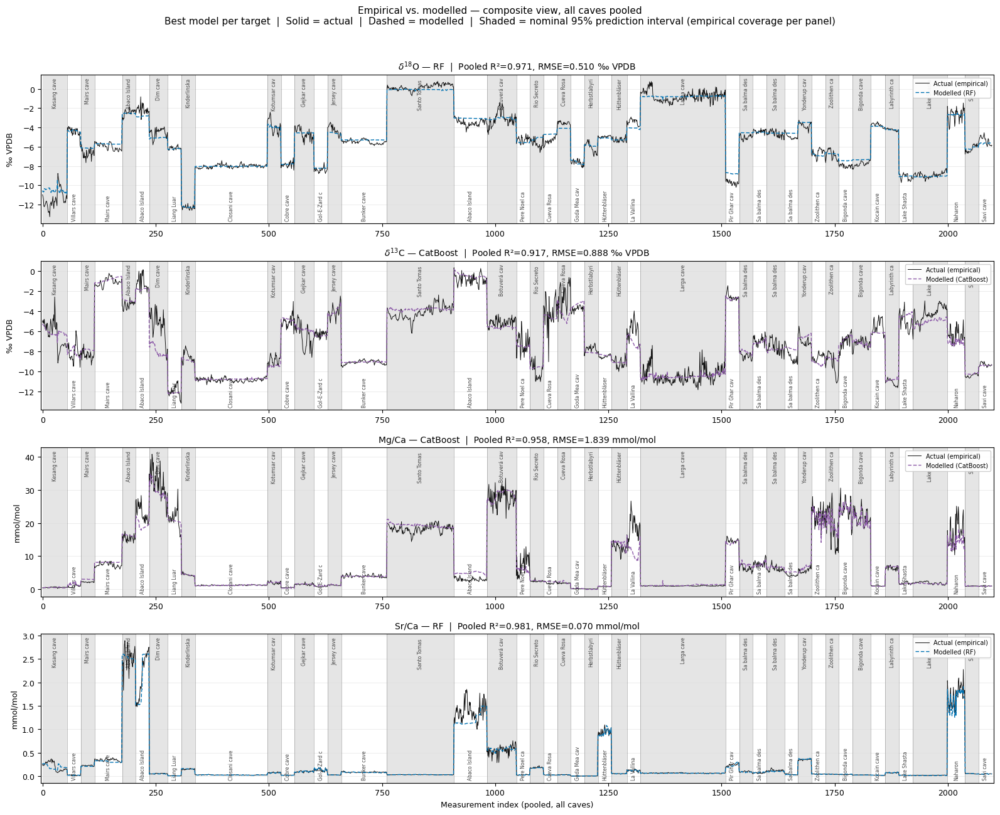

In [ ]:
"""
Composite empirical vs modelled figure -- improved cave-band legibility.

WHAT CHANGED AND WHY

1. Cave bands. Darkening the fills would reduce contrast against the black
   empirical trace, which is the opposite of what is wanted. Instead:
     - two alternating greys at low alpha rather than a rainbow of pastels,
       so the bands read as structure and not as data
     - a thin vertical rule at every cave boundary, which is what actually
       makes the segmentation legible
     - cave labels alternating between top and bottom so they stop colliding
   If Dr Altaweel specifically wants colour, set BAND_STYLE = "colour" and the
   alternation uses two desaturated tones at higher alpha instead.

2. Prediction interval labels. Empirical coverage is 72.8% (d18O), 60.1%
   (d13C), 92.1% (Mg/Ca), 99.8% (Sr/Ca) against a nominal 95%. Panels and
   legend now say "nominal 95% PI" with the empirical value, per item F-05 of
   the verification sheet. Leaving "95% PI" unqualified next to a reported
   60.1% is an internal contradiction.

3. Colour-blind safety. RF red (#E8534A) and XGBoost orange (#E8A838) are the
   hardest pair under deuteranopia and protanopia. Swapped to a blue/orange/
   purple set that separates under both, and the modelled line keeps a distinct
   dash pattern so the panels also survive greyscale printing.

NAMESPACE-SAFE: everything inside plot_composite().
"""

import numpy as _cp_np
import pandas as _cp_pd
import matplotlib as _cp_mpl
import matplotlib.pyplot as _cp_plt
from matplotlib.patches import Patch as _CpPatch
from matplotlib.lines import Line2D as _CpLine
from pathlib import Path as _CpPath


def plot_composite(base_path="/content/drive/MyDrive/SISALv3_Speleothem",
                   band_style="grey",          # "grey" or "colour"
                   band_alpha=None,            # None -> sensible default
                   boundary_lines=True,
                   label_caves=True,
                   out_name="fig_composite_PI_v2.png",
                   dpi=300):

    base = _CpPath(base_path)
    PRED = base / "artifacts/20260612T233845Z/predictions_within"
    figs = base / "figures"
    figs.mkdir(parents=True, exist_ok=True)

    TARGETS = ["d18O_measurement", "d13C_measurement",
               "Mg_Ca_measurement", "Sr_Ca_measurement"]
    T_LBL = {"d18O_measurement": r"$\delta^{18}$O",
             "d13C_measurement": r"$\delta^{13}$C",
             "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
    T_UNIT = {"d18O_measurement": u"\u2030 VPDB", "d13C_measurement": u"\u2030 VPDB",
              "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
    BEST = {"d18O_measurement": "RandomForest", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "RandomForest"}
    M_LBL = {"RandomForest": "RF", "CatBoost": "CatBoost", "XGBoost": "XGBoost"}

    # colour-blind-safe: Okabe-Ito derived. Blue / orange / purple separate
    # under deuteranopia and protanopia; the red-orange pair did not.
    M_CLR = {"RandomForest": "#0072B2", "CatBoost": "#8C5AA8", "XGBoost": "#D55E00"}

    PI_METHOD = {"RandomForest": "RF tree spread",
                 "CatBoost": "quantile regression",
                 "XGBoost": "quantile regression"}

    # empirical coverage against nominal 95%
    COVERAGE = {"d18O_measurement": 72.8, "d13C_measurement": 60.1,
                "Mg_Ca_measurement": 92.1, "Sr_Ca_measurement": 99.8}

    # pooled metrics for the panel titles
    POOLED = {"d18O_measurement": (0.971, 0.510), "d13C_measurement": (0.917, 0.888),
              "Mg_Ca_measurement": (0.958, 1.839), "Sr_Ca_measurement": (0.981, 0.070)}

    if band_alpha is None:
        band_alpha = 0.10 if band_style == "grey" else 0.22

    if band_style == "grey":
        BANDS = ["#000000", "#FFFFFF"]      # alternating; white reads as no band
        band_pair_alpha = (band_alpha, 0.0)
    else:
        BANDS = ["#4C72B0", "#DD8452"]      # desaturated blue / orange
        band_pair_alpha = (band_alpha, band_alpha)

    _cp_mpl.rcParams.update({
        "font.size": 9, "axes.linewidth": 0.8,
        "xtick.major.width": 0.8, "ytick.major.width": 0.8,
        "savefig.bbox": "tight", "figure.facecolor": "white",
    })

    fig, axes = _cp_plt.subplots(len(TARGETS), 1, figsize=(16, 13))

    for ax, tgt in zip(axes, TARGETS):
        mdl = BEST[tgt]
        pf = _cp_pd.read_parquet(PRED / f"{mdl}_{tgt}.parquet")

        # stable ordering: by entity, then by sample within entity
        pf = pf.sort_values(["entity_id", "sample_id"]).reset_index(drop=True)
        x = _cp_np.arange(len(pf))
        y_true = pf["y_true"].to_numpy(float)
        y_pred = pf["y_pred"].to_numpy(float)

        # ---- cave bands: alternating, with boundary rules
        bounds, names = [], []
        start = 0
        for i, (eid, grp) in enumerate(pf.groupby("entity_id", sort=False)):
            end = start + len(grp)
            c = BANDS[i % 2]
            a = band_pair_alpha[i % 2]
            if a > 0:
                ax.axvspan(start, end, color=c, alpha=a, lw=0, zorder=0)
            if boundary_lines and start > 0:
                ax.axvline(start, color="#666666", lw=0.5, alpha=0.55, zorder=1)
            bounds.append((start, end))
            nm = grp["site_name"].iloc[0] if "site_name" in grp.columns else str(eid)
            names.append(str(nm))
            start = end

        # ---- prediction interval, if present
        lo_col = next((c for c in ("pi_lo", "pi_lower", "lower") if c in pf.columns), None)
        hi_col = next((c for c in ("pi_hi", "pi_upper", "upper") if c in pf.columns), None)
        if lo_col and hi_col:
            ax.fill_between(x, pf[lo_col], pf[hi_col], color=M_CLR[mdl],
                            alpha=0.16, lw=0, zorder=2,
                            label=f"Nominal 95% PI ({PI_METHOD[mdl]}); "
                                  f"empirical coverage {COVERAGE[tgt]:.1f}%")

        # ---- traces. Modelled keeps a distinct dash so the panel survives
        #      greyscale printing.
        ax.plot(x, y_true, color="#111111", lw=0.7, zorder=4,
                label="Actual (empirical)")
        ax.plot(x, y_pred, color=M_CLR[mdl], lw=1.0, ls=(0, (4, 2)), zorder=5,
                label=f"Modelled ({M_LBL[mdl]})")

        # ---- cave labels, alternating top/bottom to stop collisions
        if label_caves:
            lo, hi = ax.get_ylim()
            span = hi - lo
            for i, ((s, e), nm) in enumerate(zip(bounds, names)):
                if e - s < 12:
                    continue
                top = (i % 2 == 0)
                ax.text((s + e) / 2, hi - 0.02 * span if top else lo + 0.02 * span,
                        nm[:12], rotation=90, fontsize=5.5, color="#444444",
                        ha="center", va="top" if top else "bottom", zorder=3)

        r2, rmse = POOLED[tgt]
        ax.set_title(f"{T_LBL[tgt]} \u2014 {M_LBL[mdl]}  |  Pooled R\u00b2={r2:.3f}, "
                     f"RMSE={rmse:.3f} {T_UNIT[tgt]}", fontsize=10, pad=6)
        ax.set_ylabel(T_UNIT[tgt])
        ax.margins(x=0.002)
        ax.grid(axis="y", color="#DDDDDD", lw=0.4, zorder=0)
        ax.set_axisbelow(True)
        ax.legend(loc="upper right", fontsize=7, framealpha=0.92,
                  borderpad=0.4, handlelength=2.2)

    axes[-1].set_xlabel("Measurement index (pooled, all caves)")

    fig.suptitle(
        "Empirical vs. modelled \u2014 composite view, all caves pooled\n"
        "Best model per target  |  Solid = actual  |  Dashed = modelled  |  "
        "Shaded = nominal 95% prediction interval (empirical coverage per panel)",
        fontsize=11, y=0.995)
    fig.tight_layout(rect=[0, 0, 1, 0.975])

    out = figs / out_name
    fig.savefig(out, dpi=dpi)
    fig.savefig(out.with_suffix(".pdf"))       # vector, for the journal
    print(f"[OK] saved {out.name} and {out.with_suffix('.pdf').name}")
    print(f"     band_style={band_style}, alpha={band_alpha}, "
          f"boundary_lines={boundary_lines}")
    _cp_plt.show()
    return out


# Default: alternating grey with boundary rules. Cleanest and keeps the data
# readable. For alternating colour instead, use band_style="colour".
_ = plot_composite()
# _ = plot_composite(band_style="colour", band_alpha=0.25)

[OK] saved fig_composite_PI_v3.png and fig_composite_PI_v3.pdf
     palette=alternating, band_alpha=0.3, legend=right


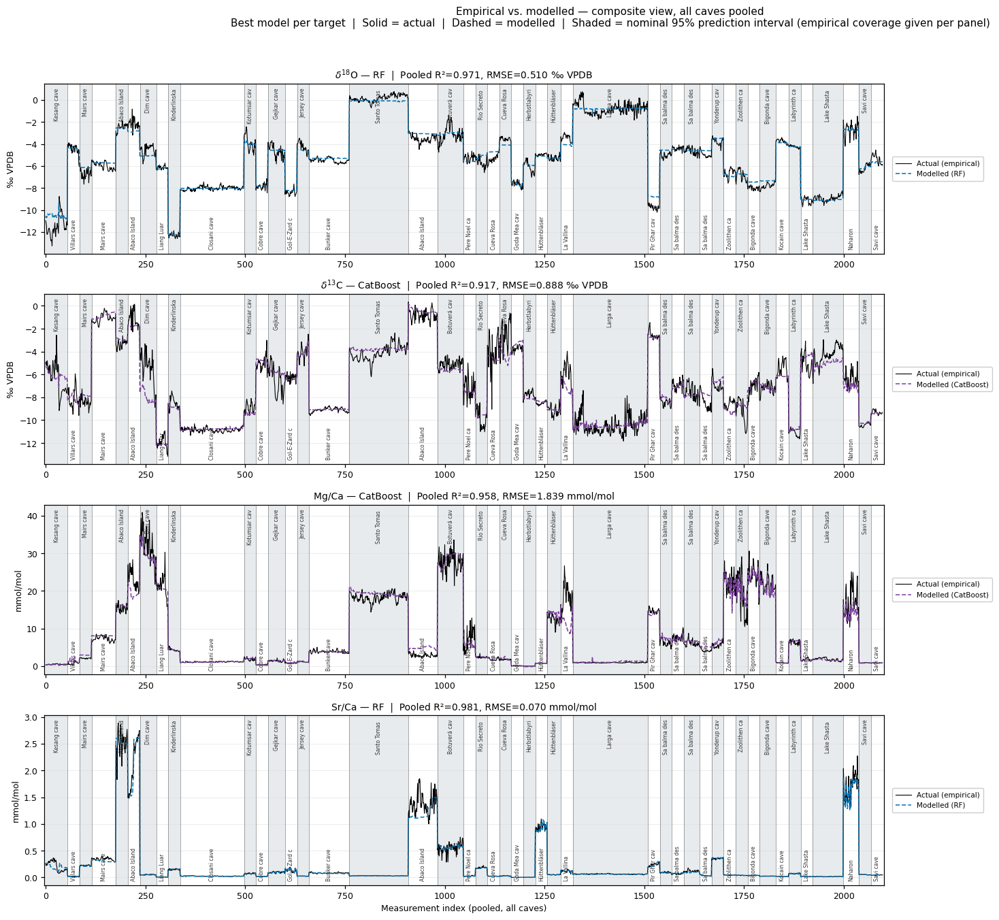

In [ ]:
"""
Composite empirical vs modelled figure -- v3.

Addresses Dr Altaweel's two requests:
  1. Legend moved outside the axes so it cannot overlap the traces.
  2. Cave panels darkened for clearer contrast.

On (2): the reference version cycles many saturated hues at high alpha, which
does separate the caves but costs contrast on the black empirical trace and
muddies the prediction-interval shading -- most visible in the Mg/Ca panel.
This version alternates over a small controlled set at a moderate alpha and
adds a boundary rule at every cave edge, which is what actually makes the
segmentation readable. BAND_ALPHA is exposed so the contrast can be dialled.

PALETTE options:
  "alternating"  two tones, strongest separation, reads as structure not data
  "triad"        three tones, more variety, still controlled
  "grey"         alternating grey, safest for greyscale printing
  "vivid"        closest to the reference version, if that is preferred

The model traces use an Okabe-Ito derived set (blue / purple / orange) which
separates under deuteranopia and protanopia. The previous red-orange pairing
did not. The modelled line also keeps a distinct dash so panels survive
greyscale reproduction.

NOTE ON LABELS: empirical coverage of the intervals is 72.8% (d18O), 60.1%
(d13C), 92.1% (Mg/Ca), 99.8% (Sr/Ca) against a nominal 95%. Panels label them
"nominal 95%" with the empirical figure, per item F-05 of the verification
sheet. Set SHOW_COVERAGE = False to revert to a plain "95% PI" label.

NAMESPACE-SAFE: everything inside plot_composite_v3().
"""

import numpy as _c3_np
import pandas as _c3_pd
import matplotlib as _c3_mpl
import matplotlib.pyplot as _c3_plt
from pathlib import Path as _C3Path


def plot_composite_v3(base_path="/content/drive/MyDrive/SISALv3_Speleothem",
                      palette="alternating",
                      band_alpha=0.30,
                      boundary_lines=True,
                      label_caves=True,
                      show_coverage=True,
                      legend_pos="right",        # "right" or "below"
                      out_name="fig_composite_PI_v3.png",
                      dpi=300):

    base = _C3Path(base_path)
    PRED = base / "artifacts/20260612T233845Z/predictions_within"
    figs = base / "figures"
    figs.mkdir(parents=True, exist_ok=True)

    TARGETS = ["d18O_measurement", "d13C_measurement",
               "Mg_Ca_measurement", "Sr_Ca_measurement"]
    T_LBL = {"d18O_measurement": r"$\delta^{18}$O",
             "d13C_measurement": r"$\delta^{13}$C",
             "Mg_Ca_measurement": "Mg/Ca", "Sr_Ca_measurement": "Sr/Ca"}
    T_UNIT = {"d18O_measurement": u"\u2030 VPDB", "d13C_measurement": u"\u2030 VPDB",
              "Mg_Ca_measurement": "mmol/mol", "Sr_Ca_measurement": "mmol/mol"}
    BEST = {"d18O_measurement": "RandomForest", "d13C_measurement": "CatBoost",
            "Mg_Ca_measurement": "CatBoost", "Sr_Ca_measurement": "RandomForest"}
    M_LBL = {"RandomForest": "RF", "CatBoost": "CatBoost", "XGBoost": "XGBoost"}
    M_CLR = {"RandomForest": "#0072B2", "CatBoost": "#7B3F9E", "XGBoost": "#D55E00"}
    PI_METHOD = {"RandomForest": "RF tree spread",
                 "CatBoost": "quantile regression",
                 "XGBoost": "quantile regression"}
    COVERAGE = {"d18O_measurement": 72.8, "d13C_measurement": 60.1,
                "Mg_Ca_measurement": 92.1, "Sr_Ca_measurement": 99.8}
    POOLED = {"d18O_measurement": (0.971, 0.510), "d13C_measurement": (0.917, 0.888),
              "Mg_Ca_measurement": (0.958, 1.839), "Sr_Ca_measurement": (0.981, 0.070)}

    PALETTES = {
        "alternating": ["#B0BEC5", "#FFFFFF"],
        "triad":       ["#AEC6CF", "#F7D9A0", "#C9D8B6"],
        "grey":        ["#9E9E9E", "#FFFFFF"],
        "vivid":       ["#C0504D", "#4F81BD", "#9BBB59", "#C9A227",
                        "#8064A2", "#4BACC6"],
    }
    bands = PALETTES.get(palette, PALETTES["alternating"])

    _c3_mpl.rcParams.update({
        "font.size": 9, "axes.linewidth": 0.9,
        "xtick.major.width": 0.9, "ytick.major.width": 0.9,
        "savefig.bbox": "tight", "figure.facecolor": "white",
    })

    # wider canvas when the legend sits to the right
    width = 18 if legend_pos == "right" else 16
    fig, axes = _c3_plt.subplots(len(TARGETS), 1, figsize=(width, 13.5))

    for ax, tgt in zip(axes, TARGETS):
        mdl = BEST[tgt]
        pf = _c3_pd.read_parquet(PRED / f"{mdl}_{tgt}.parquet")
        pf = pf.sort_values(["entity_id", "sample_id"]).reset_index(drop=True)

        x = _c3_np.arange(len(pf))
        y_true = pf["y_true"].to_numpy(float)
        y_pred = pf["y_pred"].to_numpy(float)

        # ---- cave bands
        segs, start = [], 0
        for i, (eid, grp) in enumerate(pf.groupby("entity_id", sort=False)):
            end = start + len(grp)
            col = bands[i % len(bands)]
            if col != "#FFFFFF":
                ax.axvspan(start, end, color=col, alpha=band_alpha, lw=0, zorder=0)
            if boundary_lines and start > 0:
                ax.axvline(start, color="#555555", lw=0.6, alpha=0.6, zorder=1)
            nm = grp["site_name"].iloc[0] if "site_name" in grp.columns else str(eid)
            segs.append((start, end, str(nm)))
            start = end

        # ---- prediction interval
        lo_col = next((c for c in ("pi_lo", "pi_lower", "lower") if c in pf.columns), None)
        hi_col = next((c for c in ("pi_hi", "pi_upper", "upper") if c in pf.columns), None)
        if lo_col and hi_col:
            if show_coverage:
                pi_label = (f"Nominal 95% PI ({PI_METHOD[mdl]})\n"
                            f"empirical coverage {COVERAGE[tgt]:.1f}%")
            else:
                pi_label = f"95% PI ({PI_METHOD[mdl]})"
            ax.fill_between(x, pf[lo_col], pf[hi_col], color=M_CLR[mdl],
                            alpha=0.22, lw=0, zorder=2, label=pi_label)

        # ---- traces
        ax.plot(x, y_true, color="#000000", lw=0.8, zorder=4,
                label="Actual (empirical)")
        ax.plot(x, y_pred, color=M_CLR[mdl], lw=1.1, ls=(0, (4, 2)), zorder=5,
                label=f"Modelled ({M_LBL[mdl]})")

        # ---- cave labels, alternating top/bottom so they stop colliding
        if label_caves:
            lo, hi = ax.get_ylim()
            span = hi - lo
            for i, (s, e, nm) in enumerate(segs):
                if e - s < 14:
                    continue
                top = (i % 2 == 0)
                ax.text((s + e) / 2,
                        hi - 0.025 * span if top else lo + 0.025 * span,
                        nm[:12], rotation=90, fontsize=5.5, color="#333333",
                        ha="center", va="top" if top else "bottom", zorder=3)

        r2, rmse = POOLED[tgt]
        ax.set_title(f"{T_LBL[tgt]} \u2014 {M_LBL[mdl]}  |  Pooled R\u00b2={r2:.3f}, "
                     f"RMSE={rmse:.3f} {T_UNIT[tgt]}", fontsize=10, pad=6)
        ax.set_ylabel(T_UNIT[tgt])
        ax.margins(x=0.002)
        ax.grid(axis="y", color="#DDDDDD", lw=0.4, zorder=0)
        ax.set_axisbelow(True)

        # ---- legend OUTSIDE the axes -- cannot overlap the traces
        if legend_pos == "right":
            ax.legend(loc="center left", bbox_to_anchor=(1.005, 0.5),
                      fontsize=7.5, framealpha=1.0, borderpad=0.5,
                      handlelength=2.2, edgecolor="#CCCCCC")
        else:
            ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.16),
                      ncol=3, fontsize=7.5, framealpha=1.0,
                      handlelength=2.2, edgecolor="#CCCCCC")

    axes[-1].set_xlabel("Measurement index (pooled, all caves)")

    subtitle = ("Best model per target  |  Solid = actual  |  Dashed = modelled  |  "
                "Shaded = " + ("nominal 95% prediction interval "
                               "(empirical coverage given per panel)"
                               if show_coverage else "95% prediction interval"))
    fig.suptitle("Empirical vs. modelled \u2014 composite view, all caves pooled\n"
                 + subtitle, fontsize=11, y=0.997)

    right = 0.82 if legend_pos == "right" else 1.0
    fig.tight_layout(rect=[0, 0, right, 0.975])

    out = figs / out_name
    fig.savefig(out, dpi=dpi)
    fig.savefig(out.with_suffix(".pdf"))
    print(f"[OK] saved {out.name} and {out.with_suffix('.pdf').name}")
    print(f"     palette={palette}, band_alpha={band_alpha}, legend={legend_pos}")
    _c3_plt.show()
    return out


# Default. Increase band_alpha toward 0.45 for stronger panels; beyond that the
# empirical trace and the PI shading start to lose contrast.
_ = plot_composite_v3()

# Alternatives to try:
# _ = plot_composite_v3(palette="triad", band_alpha=0.35)
# _ = plot_composite_v3(palette="vivid", band_alpha=0.25)   # closest to reference
# _ = plot_composite_v3(legend_pos="below")

In [ ]:
"""
Zip the composite figure variants and download.

Run after generating whichever variants you want to compare. Picks up both the
PNG and the vector PDF for each.
"""

import zipfile, datetime
from pathlib import Path

base = Path("/content/drive/MyDrive/SISALv3_Speleothem")
figs = base / "figures"

# add or remove stems here to control what goes in
STEMS = [
    "fig_composite_PI_v3",        # default: alternating, alpha 0.30
    "fig_composite_PI_v3_vivid",  # if you saved a vivid variant
    "fig_composite_PI_v3_triad",
    "fig_composite_PI_v2",
    "fig_composite_PI",           # the original, for comparison
]

out = base / f"composite_figures_{datetime.datetime.now():%Y%m%d_%H%M}.zip"

found = []
with zipfile.ZipFile(out, "w", zipfile.ZIP_DEFLATED) as z:
    for stem in STEMS:
        for ext in (".png", ".pdf"):
            p = figs / f"{stem}{ext}"
            if p.exists():
                z.write(p, p.name)
                found.append(p.name)

print(f"{len(found)} files -> {out.name}  ({out.stat().st_size/1024:.0f} KB)")
for f in found:
    print(f"  {f}")
if not found:
    print("Nothing matched. Files currently in figures/:")
    for p in sorted(figs.glob("fig_composite*")):
        print(f"  {p.name}")

try:
    from google.colab import files
    files.download(str(out))
except Exception as e:
    print(f"\nDownload unavailable ({e}). File is on Drive at:\n  {out}")

4 files -> composite_figures_20260911_0714.zip  (3744 KB)
  fig_composite_PI_v3.png
  fig_composite_PI_v3.pdf
  fig_composite_PI_v2.png
  fig_composite_PI_v2.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [5]:
import datetime
from pathlib import Path
nb = Path("/content/drive/MyDrive/Colab Notebooks")
for p in sorted(nb.rglob("*.ipynb"), key=lambda x: x.stat().st_mtime, reverse=True):
    t = datetime.datetime.fromtimestamp(p.stat().st_mtime)
    print(f"{t:%Y-%m-%d}  {p.stat().st_size/1024:6.0f} KB  {p.name}")

2026-09-19   16158 KB  001_SISALv3_Pipeline_PART1_Train_ENRICHED.ipynb
2026-09-17     496 KB  002_SISALv3_Anomaly_PART1_Cohort_Baselines.ipynb
2026-07-18     605 KB  LSTM Rainfall.ipynb
2026-07-17     253 KB  Ensemble Weighted.ipynb
2026-07-17     561 KB  Transformer Rainfall.ipynb
2026-07-17    6237 KB  Yet another copy of new_gauges.ipynb
2026-07-06       0 KB  Test.ipynb
2026-06-16      83 KB  Untitled6.ipynb
2026-06-14     158 KB  001_SISALv3_Pipeline_PART2_Evaluate.ipynb
2026-06-03      13 KB  no-download.ipynb
2026-05-30      17 KB  PART2_FINISH.ipynb
2026-05-25     161 KB  001_SISALv3_Pipeline_PART2_Evaluate_CLEAN.ipynb
2026-05-23     146 KB  003b_SISALv3_External_Test_Patched.ipynb
2026-05-23     111 KB  003_SISALv3_External_Test_Colab.ipynb
2026-05-17       9 KB  002_SISALv3_Q1_Presentation.ipynb
2026-05-17     122 KB  Copy of 001_SISALv3_Pipeline_PART1_Train.ipynb
2026-05-15     108 KB  001_SISALv3_Pipeline_PART1_Train.ipynb
2026-05-05       0 KB  Untitled5.ipynb
2026-05-05  